Importing Modules

In [3]:
import numpy as np
import keras
import tensorflow as tf
import matplotlib.pyplot as plt
import glob
import cv2 as cv

Mount Google Drive

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Load Data

In [6]:
# Load Data
from os import listdir
from numpy import asarray
from numpy import vstack
from tensorflow.keras.utils import img_to_array
from tensorflow.keras.utils import load_img
from numpy import savez_compressed

# load all images in a directory into memory
def load_images(path, size=(64,64)):
	data_list = list()
	# enumerate filenames in directory, assume all are images
	for filename in listdir(path):
		# load and resize the image
		pixels = load_img(path + filename, target_size=size)
		# convert to numpy array
		pixels = img_to_array(pixels)
		# store
		data_list.append(pixels)
	return asarray(data_list)

# dataset path
path = '/content/drive/MyDrive/GAN/'
trdata = load_images(path + 'dresses/')
print('Loaded data: ', trdata.shape)

path = '/content/drive/MyDrive/GAN/'
tsdata = load_images(path + 'test_images/dresses/')
print('Loaded data: ', tsdata.shape)

Loaded data:  (15379, 64, 64, 3)
Loaded data:  (154, 64, 64, 3)


Normalizing the data

In [7]:
x_train = (trdata.astype(np.float32) - 127.5)/127.5
x_test = (tsdata.astype(np.float32) - 127.5)/127.5

Using the Adam Optimizer

In [8]:
from keras.optimizers import Adam
def adam_optimizer():
    return Adam(learning_rate=0.0002, beta_1=0.5)

Generator

In [9]:
from keras.layers import Dense, Input, LeakyReLU
from keras.models import Sequential

def build_generator():
    generator = Sequential()
    generator.add(Input(shape=(100,)))          # define input layer properly
    generator.add(Dense(256))
    generator.add(LeakyReLU(0.2))

    generator.add(Dense(512))
    generator.add(LeakyReLU(0.2))

    generator.add(Dense(1024))
    generator.add(LeakyReLU(0.2))

    generator.add(Dense(12288, activation='tanh'))

    generator.compile(loss='binary_crossentropy', optimizer=adam_optimizer())
    return generator

G = build_generator()
G.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 256)            │        25,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu (LeakyReLU)         │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 512)            │       131,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_1 (LeakyReLU)       │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1024)           │       525,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_2 (LeakyReLU)       │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 12288)          │    12,595,200 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 13,277,952 (50.65 MB)

 Trainable params: 13,277,952 (50.65 MB)

 Non-trainable params: 0 (0.00 B)

Discriminator

In [14]:
from keras.layers import Dropout
def build_discriminator():
    discriminator=keras.Sequential()
    discriminator.add(Dense(units=1024,input_dim=12288))
    discriminator.add(LeakyReLU(0.2))
    discriminator.add(Dropout(0.3))


    discriminator.add(Dense(units=512))
    discriminator.add(LeakyReLU(0.2))
    discriminator.add(Dropout(0.3))

    discriminator.add(Dense(units=256))
    discriminator.add(LeakyReLU(0.2))

    discriminator.add(Dense(units=1, activation='sigmoid'))

    discriminator.compile(loss='binary_crossentropy', optimizer=adam_optimizer())
    return discriminator

D = build_discriminator()
D.summary()

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_8 (Dense)                 │ (None, 1024)           │    12,583,936 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_7 (LeakyReLU)       │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 512)            │       524,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_8 (LeakyReLU)       │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_9 (LeakyReLU)       │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 1)              │           257 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 13,240,321 (50.51 MB)

 Trainable params: 13,240,321 (50.51 MB)

 Non-trainable params: 0 (0.00 B)

Building the GAN

In [15]:
def build_gan(discriminator, generator):
    discriminator.trainable=False
    gan_input = Input(shape=(100,))
    x = generator(gan_input)
    gan_output= discriminator(x)
    gan= keras.Model(inputs=gan_input, outputs=gan_output)
    gan.compile(loss='binary_crossentropy', optimizer='adam')
    return gan
gan = build_gan(D,G)
gan.summary()

Model: "functional_24"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_6 (InputLayer)      │ (None, 100)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential (Sequential)         │ (None, 12288)          │    13,277,952 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_5 (Sequential)       │ (None, 1)              │    13,240,321 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 26,518,273 (101.16 MB)

 Trainable params: 13,277,952 (50.65 MB)

 Non-trainable params: 13,240,321 (50.51 MB)

Generator building images from noise

4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step


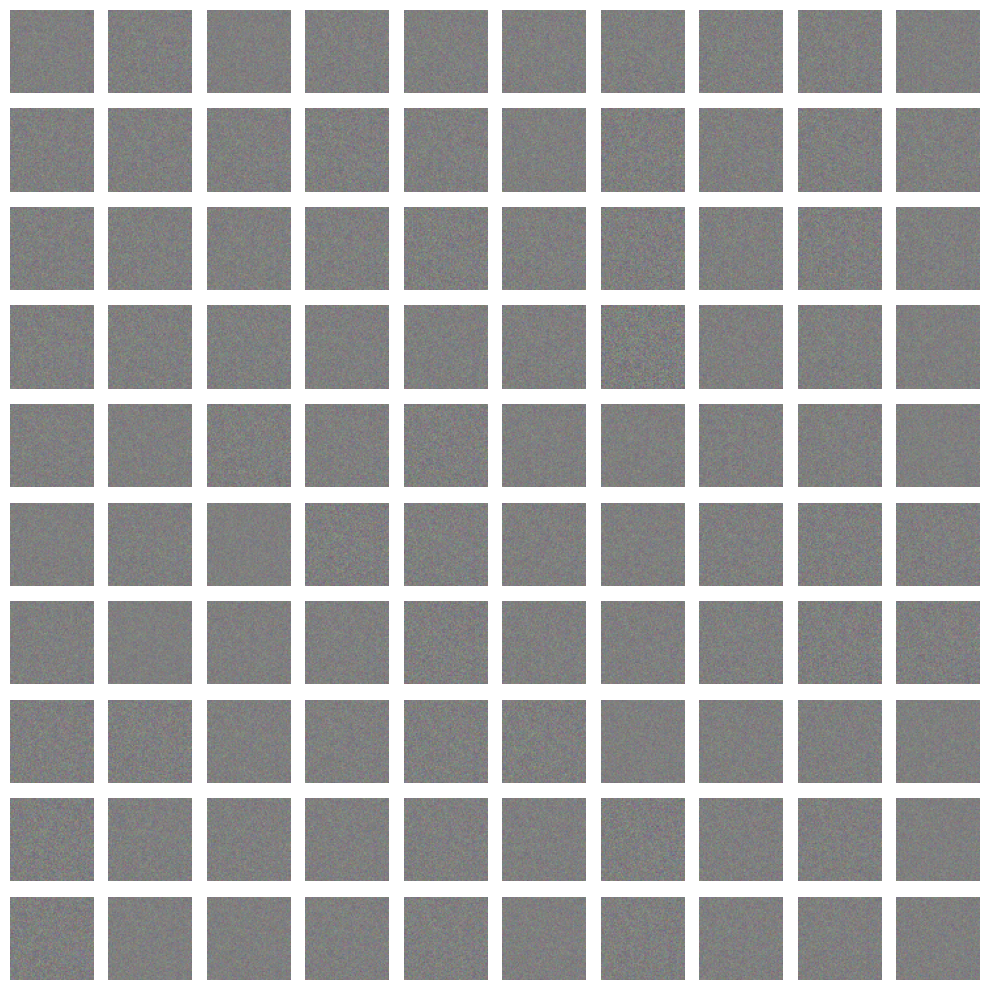

<Figure size 640x480 with 0 Axes>

In [16]:
def plot_generated_images(epoch, generator, examples=100, dim=(10,10), figsize=(10,10)):
    noise = np.random.normal(loc=0, scale=1, size=[examples, 100])
    generated_images = generator.predict(noise)
    generated_images = generated_images.reshape(100, 64, 64, 3)
    generated_images = (generated_images + 1) / 2.0  # scale to [0,1]

    plt.figure(figsize=figsize)
    for i in range(generated_images.shape[0]):
        plt.subplot(dim[0], dim[1], i + 1)
        plt.imshow(generated_images[i])
        plt.axis('off')

    plt.tight_layout()
    plt.show()  # <-- moved before savefig (so display works)
    plt.savefig(f'gan_generated_image_{epoch}.png')  # <-- unchanged

plot_generated_images(1, G)

Build a function to train the network/GAN including a generator able to infer fashion items

In [17]:
print(x_train.shape)

(15379, 64, 64, 3)


Epoch 1


  0%|          | 0/128 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step  


  1%|          | 1/128 [00:06<13:57,  6.60s/it]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


  2%|▏         | 2/128 [00:06<05:51,  2.79s/it]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  2%|▏         | 3/128 [00:06<03:16,  1.58s/it]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  3%|▎         | 4/128 [00:06<02:04,  1.00s/it]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  4%|▍         | 5/128 [00:07<01:24,  1.46it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  5%|▍         | 6/128 [00:07<01:00,  2.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  5%|▌         | 7/128 [00:07<00:45,  2.67it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  6%|▋         | 8/128 [00:07<00:36,  3.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


  7%|▋         | 9/128 [00:07<00:30,  3.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  8%|▊         | 10/128 [00:07<00:26,  4.48it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  9%|▊         | 11/128 [00:07<00:23,  4.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  9%|▉         | 12/128 [00:08<00:20,  5.54it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 10%|█         | 13/128 [00:08<00:18,  6.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 11%|█         | 14/128 [00:08<00:17,  6.47it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 12%|█▏        | 15/128 [00:08<00:17,  6.53it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 12%|█▎        | 16/128 [00:08<00:16,  6.61it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 13%|█▎        | 17/128 [00:08<00:15,  7.02it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 14%|█▍        | 18/128 [00:08<00:16,  6.84it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 15%|█▍        | 19/128 [00:09<00:15,  6.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 16%|█▌        | 20/128 [00:09<00:15,  7.11it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 16%|█▋        | 21/128 [00:09<00:15,  7.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 17%|█▋        | 22/128 [00:09<00:15,  6.84it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 18%|█▊        | 23/128 [00:09<00:16,  6.35it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


 19%|█▉        | 24/128 [00:09<00:14,  7.10it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


 20%|█▉        | 25/128 [00:09<00:13,  7.72it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


 20%|██        | 26/128 [00:09<00:12,  8.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


 21%|██        | 27/128 [00:10<00:11,  8.71it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


 22%|██▏       | 28/128 [00:10<00:11,  9.03it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 


 23%|██▎       | 29/128 [00:10<00:10,  9.25it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


 23%|██▎       | 30/128 [00:10<00:10,  9.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 


 24%|██▍       | 31/128 [00:10<00:10,  9.46it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


 25%|██▌       | 32/128 [00:10<00:10,  9.57it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


 26%|██▌       | 33/128 [00:10<00:10,  9.42it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 


 27%|██▋       | 34/128 [00:10<00:09,  9.52it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


 27%|██▋       | 35/128 [00:10<00:09,  9.55it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


 28%|██▊       | 36/128 [00:11<00:09,  9.61it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


 29%|██▉       | 37/128 [00:11<00:09,  9.64it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


 30%|██▉       | 38/128 [00:11<00:09,  9.66it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


 30%|███       | 39/128 [00:11<00:09,  9.70it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


 31%|███▏      | 40/128 [00:11<00:09,  9.73it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


 32%|███▏      | 41/128 [00:11<00:08,  9.71it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 


 33%|███▎      | 42/128 [00:11<00:08,  9.60it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 34%|███▎      | 43/128 [00:11<00:09,  8.74it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


 34%|███▍      | 44/128 [00:11<00:09,  9.02it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


 35%|███▌      | 45/128 [00:11<00:09,  9.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


 36%|███▌      | 46/128 [00:12<00:08,  9.25it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 


 37%|███▋      | 47/128 [00:12<00:08,  9.21it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


 38%|███▊      | 48/128 [00:12<00:08,  9.35it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 


 38%|███▊      | 49/128 [00:12<00:08,  9.43it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


 39%|███▉      | 50/128 [00:12<00:08,  9.49it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


 40%|███▉      | 51/128 [00:12<00:08,  9.62it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


 41%|████      | 52/128 [00:12<00:07,  9.56it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


 41%|████▏     | 53/128 [00:12<00:08,  9.36it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 


 42%|████▏     | 54/128 [00:12<00:07,  9.45it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


 43%|████▎     | 55/128 [00:13<00:07,  9.56it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


 45%|████▍     | 57/128 [00:13<00:07,  9.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 


 46%|████▌     | 59/128 [00:13<00:07,  9.75it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 


 47%|████▋     | 60/128 [00:13<00:07,  9.65it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 


 48%|████▊     | 61/128 [00:13<00:07,  9.23it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 


 48%|████▊     | 62/128 [00:13<00:07,  9.23it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


 49%|████▉     | 63/128 [00:13<00:07,  9.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


 50%|█████     | 64/128 [00:13<00:06,  9.44it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


 51%|█████     | 65/128 [00:14<00:06,  9.52it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


 52%|█████▏    | 66/128 [00:14<00:06,  9.62it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


 52%|█████▏    | 67/128 [00:14<00:06,  9.70it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


 53%|█████▎    | 68/128 [00:14<00:06,  9.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


 54%|█████▍    | 69/128 [00:14<00:06,  9.75it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


 55%|█████▍    | 70/128 [00:14<00:05,  9.81it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


 55%|█████▌    | 71/128 [00:14<00:05,  9.71it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


 56%|█████▋    | 72/128 [00:14<00:05,  9.72it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


 57%|█████▋    | 73/128 [00:14<00:05,  9.34it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


 58%|█████▊    | 74/128 [00:15<00:05,  9.36it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 


 59%|█████▊    | 75/128 [00:15<00:05,  9.44it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


 59%|█████▉    | 76/128 [00:15<00:05,  9.53it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


 60%|██████    | 77/128 [00:15<00:05,  9.64it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


 61%|██████    | 78/128 [00:15<00:05,  9.64it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 


 62%|██████▏   | 79/128 [00:15<00:05,  9.65it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


 62%|██████▎   | 80/128 [00:15<00:04,  9.68it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


 63%|██████▎   | 81/128 [00:15<00:04,  9.68it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


 64%|██████▍   | 82/128 [00:15<00:04,  9.69it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 


 65%|██████▍   | 83/128 [00:15<00:04,  9.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


 66%|██████▌   | 84/128 [00:16<00:04,  9.49it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 


 66%|██████▋   | 85/128 [00:16<00:04,  9.54it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 


 67%|██████▋   | 86/128 [00:16<00:04,  9.55it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


 68%|██████▊   | 87/128 [00:16<00:04,  9.57it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 


 69%|██████▉   | 88/128 [00:16<00:04,  9.56it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 


 70%|██████▉   | 89/128 [00:16<00:04,  9.59it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


 70%|███████   | 90/128 [00:16<00:03,  9.64it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 


 71%|███████   | 91/128 [00:16<00:03,  9.55it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 72%|███████▏  | 92/128 [00:16<00:04,  8.62it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


 73%|███████▎  | 93/128 [00:17<00:03,  8.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


 73%|███████▎  | 94/128 [00:17<00:03,  9.15it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 


 74%|███████▍  | 95/128 [00:17<00:03,  9.20it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 75%|███████▌  | 96/128 [00:17<00:03,  8.39it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 76%|███████▌  | 97/128 [00:17<00:03,  8.43it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 


 77%|███████▋  | 98/128 [00:17<00:03,  8.74it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 


 77%|███████▋  | 99/128 [00:17<00:03,  8.44it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 


 78%|███████▊  | 100/128 [00:17<00:03,  8.65it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 79%|███████▉  | 101/128 [00:17<00:03,  8.68it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 


 80%|███████▉  | 102/128 [00:18<00:02,  8.89it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 


 80%|████████  | 103/128 [00:18<00:02,  9.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


 81%|████████▏ | 104/128 [00:18<00:02,  9.25it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


 82%|████████▏ | 105/128 [00:18<00:02,  9.36it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 


 83%|████████▎ | 106/128 [00:18<00:02,  9.48it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 


 84%|████████▎ | 107/128 [00:18<00:02,  9.42it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


 84%|████████▍ | 108/128 [00:18<00:02,  9.44it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 


 85%|████████▌ | 109/128 [00:18<00:02,  9.39it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


 86%|████████▌ | 110/128 [00:18<00:01,  9.37it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


 87%|████████▋ | 111/128 [00:19<00:01,  9.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 


 88%|████████▊ | 112/128 [00:19<00:01,  9.23it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


 88%|████████▊ | 113/128 [00:19<00:01,  9.33it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


 89%|████████▉ | 114/128 [00:19<00:01,  9.44it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


 90%|████████▉ | 115/128 [00:19<00:01,  9.44it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


 91%|█████████ | 116/128 [00:19<00:01,  9.50it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 


 91%|█████████▏| 117/128 [00:19<00:01,  9.50it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 92%|█████████▏| 118/128 [00:19<00:01,  8.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 93%|█████████▎| 119/128 [00:19<00:01,  7.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 94%|█████████▍| 120/128 [00:20<00:01,  7.52it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 95%|█████████▍| 121/128 [00:20<00:00,  7.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 95%|█████████▌| 122/128 [00:20<00:00,  7.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 96%|█████████▌| 123/128 [00:20<00:00,  7.32it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 97%|█████████▋| 124/128 [00:20<00:00,  7.39it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 98%|█████████▊| 125/128 [00:20<00:00,  7.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 98%|█████████▊| 126/128 [00:20<00:00,  7.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 99%|█████████▉| 127/128 [00:21<00:00,  6.83it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


100%|██████████| 128/128 [00:21<00:00,  6.02it/s]


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


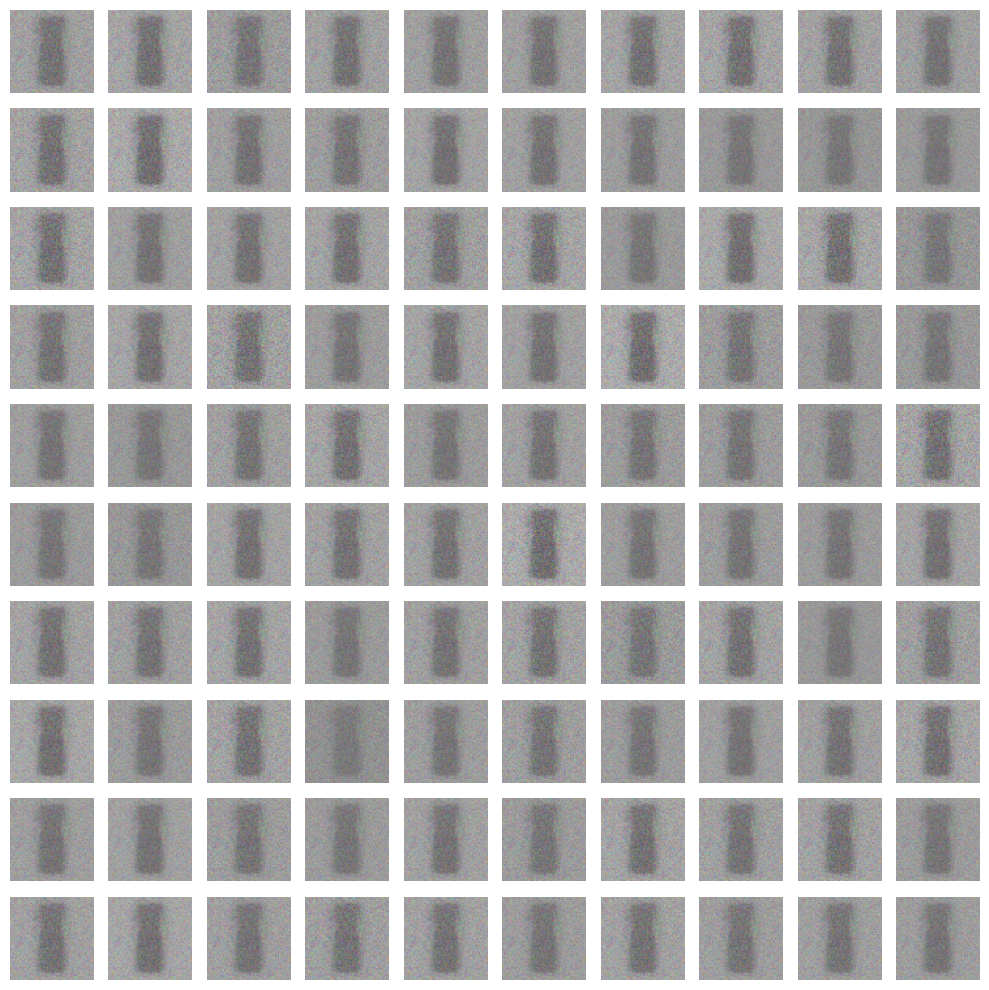

Epoch 2


  0%|          | 0/128 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  1%|          | 1/128 [00:00<00:19,  6.51it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  2%|▏         | 2/128 [00:00<00:17,  7.20it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  2%|▏         | 3/128 [00:00<00:17,  6.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


  3%|▎         | 4/128 [00:00<00:22,  5.62it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  4%|▍         | 5/128 [00:00<00:20,  5.87it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  5%|▍         | 6/128 [00:00<00:19,  6.23it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  5%|▌         | 7/128 [00:01<00:18,  6.47it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  6%|▋         | 8/128 [00:01<00:18,  6.60it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  7%|▋         | 9/128 [00:01<00:17,  6.73it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  8%|▊         | 10/128 [00:01<00:17,  6.83it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  9%|▊         | 11/128 [00:01<00:16,  7.03it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  9%|▉         | 12/128 [00:01<00:16,  7.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 10%|█         | 13/128 [00:01<00:15,  7.37it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 11%|█         | 14/128 [00:02<00:15,  7.25it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 12%|█▏        | 15/128 [00:02<00:15,  7.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 12%|█▎        | 16/128 [00:02<00:15,  7.05it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 13%|█▎        | 17/128 [00:02<00:15,  7.39it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 14%|█▍        | 18/128 [00:02<00:15,  7.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 15%|█▍        | 19/128 [00:02<00:14,  7.48it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 16%|█▌        | 20/128 [00:02<00:14,  7.64it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 16%|█▋        | 21/128 [00:03<00:14,  7.44it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 17%|█▋        | 22/128 [00:03<00:15,  6.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 18%|█▊        | 23/128 [00:03<00:21,  4.84it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 19%|█▉        | 24/128 [00:03<00:21,  4.82it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 20%|█▉        | 25/128 [00:03<00:19,  5.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 20%|██        | 26/128 [00:04<00:17,  5.74it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 21%|██        | 27/128 [00:04<00:18,  5.46it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 22%|██▏       | 28/128 [00:04<00:23,  4.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 23%|██▎       | 29/128 [00:04<00:20,  4.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 23%|██▎       | 30/128 [00:04<00:18,  5.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 24%|██▍       | 31/128 [00:05<00:16,  5.71it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 25%|██▌       | 32/128 [00:05<00:17,  5.36it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


 26%|██▌       | 33/128 [00:05<00:23,  4.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 27%|██▋       | 34/128 [00:05<00:20,  4.61it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 27%|██▋       | 35/128 [00:05<00:18,  5.13it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 28%|██▊       | 36/128 [00:06<00:16,  5.73it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 29%|██▉       | 37/128 [00:06<00:14,  6.25it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 30%|██▉       | 38/128 [00:06<00:13,  6.47it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 30%|███       | 39/128 [00:06<00:13,  6.62it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 31%|███▏      | 40/128 [00:06<00:13,  6.75it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 32%|███▏      | 41/128 [00:06<00:12,  6.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 33%|███▎      | 42/128 [00:06<00:12,  6.93it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 34%|███▎      | 43/128 [00:07<00:12,  6.80it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 34%|███▍      | 44/128 [00:07<00:11,  7.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 35%|███▌      | 45/128 [00:07<00:11,  7.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 36%|███▌      | 46/128 [00:07<00:11,  7.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 37%|███▋      | 47/128 [00:07<00:11,  7.03it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 38%|███▊      | 48/128 [00:07<00:10,  7.32it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 38%|███▊      | 49/128 [00:07<00:10,  7.41it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 39%|███▉      | 50/128 [00:07<00:10,  7.10it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 40%|███▉      | 51/128 [00:08<00:10,  7.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 41%|████      | 52/128 [00:08<00:10,  7.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 41%|████▏     | 53/128 [00:08<00:09,  7.57it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 42%|████▏     | 54/128 [00:08<00:09,  7.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 43%|████▎     | 55/128 [00:08<00:09,  7.46it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 44%|████▍     | 56/128 [00:08<00:09,  7.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 45%|████▍     | 57/128 [00:08<00:10,  7.02it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 45%|████▌     | 58/128 [00:09<00:09,  7.15it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 46%|████▌     | 59/128 [00:09<00:10,  6.63it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 47%|████▋     | 60/128 [00:09<00:10,  6.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 48%|████▊     | 61/128 [00:09<00:11,  6.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 48%|████▊     | 62/128 [00:09<00:10,  6.06it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 49%|████▉     | 63/128 [00:10<00:12,  5.21it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 50%|█████     | 64/128 [00:10<00:11,  5.45it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 51%|█████     | 65/128 [00:10<00:11,  5.56it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 52%|█████▏    | 66/128 [00:10<00:11,  5.58it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 52%|█████▏    | 67/128 [00:10<00:10,  5.70it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 53%|█████▎    | 68/128 [00:10<00:11,  5.02it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 54%|█████▍    | 69/128 [00:11<00:11,  5.06it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 55%|█████▍    | 70/128 [00:11<00:11,  5.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 55%|█████▌    | 71/128 [00:11<00:10,  5.41it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 56%|█████▋    | 72/128 [00:11<00:09,  5.61it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 57%|█████▋    | 73/128 [00:11<00:09,  5.82it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 58%|█████▊    | 74/128 [00:11<00:09,  5.83it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 59%|█████▊    | 75/128 [00:12<00:09,  5.67it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 59%|█████▉    | 76/128 [00:12<00:09,  5.58it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 60%|██████    | 77/128 [00:12<00:09,  5.61it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 61%|██████    | 78/128 [00:12<00:08,  5.65it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 62%|██████▏   | 79/128 [00:12<00:08,  5.83it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 62%|██████▎   | 80/128 [00:13<00:08,  5.51it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 63%|██████▎   | 81/128 [00:13<00:08,  5.48it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 64%|██████▍   | 82/128 [00:13<00:07,  6.03it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 65%|██████▍   | 83/128 [00:13<00:07,  6.25it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 66%|██████▌   | 84/128 [00:13<00:06,  6.63it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 66%|██████▋   | 85/128 [00:13<00:06,  6.72it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 67%|██████▋   | 86/128 [00:13<00:05,  7.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 68%|██████▊   | 87/128 [00:14<00:05,  7.34it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 69%|██████▉   | 88/128 [00:14<00:05,  7.44it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 70%|██████▉   | 89/128 [00:14<00:05,  7.54it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 70%|███████   | 90/128 [00:14<00:05,  7.33it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 71%|███████   | 91/128 [00:14<00:04,  7.58it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 72%|███████▏  | 92/128 [00:14<00:04,  7.62it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 73%|███████▎  | 93/128 [00:14<00:04,  7.66it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 73%|███████▎  | 94/128 [00:14<00:04,  7.43it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 74%|███████▍  | 95/128 [00:15<00:04,  7.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 75%|███████▌  | 96/128 [00:15<00:04,  7.55it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 76%|███████▌  | 97/128 [00:15<00:04,  7.47it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 77%|███████▋  | 98/128 [00:15<00:03,  7.58it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 77%|███████▋  | 99/128 [00:15<00:03,  7.65it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 78%|███████▊  | 100/128 [00:15<00:03,  7.73it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 79%|███████▉  | 101/128 [00:15<00:03,  7.48it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 80%|███████▉  | 102/128 [00:16<00:03,  7.68it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 80%|████████  | 103/128 [00:16<00:03,  7.50it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 81%|████████▏ | 104/128 [00:16<00:03,  7.10it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 82%|████████▏ | 105/128 [00:16<00:03,  7.36it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 83%|████████▎ | 106/128 [00:16<00:03,  7.25it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 84%|████████▎ | 107/128 [00:16<00:02,  7.54it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 84%|████████▍ | 108/128 [00:16<00:02,  7.64it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 85%|████████▌ | 109/128 [00:16<00:02,  7.45it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 86%|████████▌ | 110/128 [00:17<00:02,  7.60it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 87%|████████▋ | 111/128 [00:17<00:02,  7.42it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 88%|████████▊ | 112/128 [00:17<00:02,  7.25it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 88%|████████▊ | 113/128 [00:17<00:02,  7.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 89%|████████▉ | 114/128 [00:17<00:01,  7.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 90%|████████▉ | 115/128 [00:17<00:01,  7.48it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 91%|█████████ | 116/128 [00:17<00:01,  7.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 91%|█████████▏| 117/128 [00:18<00:01,  7.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 92%|█████████▏| 118/128 [00:18<00:01,  6.91it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 93%|█████████▎| 119/128 [00:18<00:01,  7.14it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 94%|█████████▍| 120/128 [00:18<00:01,  7.23it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 95%|█████████▍| 121/128 [00:18<00:00,  7.14it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 95%|█████████▌| 122/128 [00:18<00:00,  7.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 96%|█████████▌| 123/128 [00:18<00:00,  7.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 97%|█████████▋| 124/128 [00:19<00:00,  7.25it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 98%|█████████▊| 125/128 [00:19<00:00,  7.32it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 98%|█████████▊| 126/128 [00:19<00:00,  7.51it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 99%|█████████▉| 127/128 [00:19<00:00,  7.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


100%|██████████| 128/128 [00:19<00:00,  6.53it/s]


Epoch 3


  0%|          | 0/128 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  1%|          | 1/128 [00:00<00:16,  7.91it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  2%|▏         | 2/128 [00:00<00:16,  7.87it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  2%|▏         | 3/128 [00:00<00:15,  7.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  3%|▎         | 4/128 [00:00<00:15,  7.80it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  4%|▍         | 5/128 [00:00<00:15,  7.86it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  5%|▍         | 6/128 [00:00<00:16,  7.52it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


  5%|▌         | 7/128 [00:00<00:16,  7.37it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


  6%|▋         | 8/128 [00:01<00:16,  7.49it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  7%|▋         | 9/128 [00:01<00:15,  7.72it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  8%|▊         | 10/128 [00:01<00:15,  7.49it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  9%|▊         | 11/128 [00:01<00:15,  7.36it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


  9%|▉         | 12/128 [00:01<00:15,  7.43it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 10%|█         | 13/128 [00:01<00:15,  7.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 11%|█         | 14/128 [00:01<00:15,  7.49it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 12%|█▏        | 15/128 [00:02<00:15,  7.23it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 12%|█▎        | 16/128 [00:02<00:14,  7.48it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 13%|█▎        | 17/128 [00:02<00:14,  7.62it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 14%|█▍        | 18/128 [00:02<00:14,  7.45it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 15%|█▍        | 19/128 [00:02<00:14,  7.30it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 16%|█▌        | 20/128 [00:02<00:14,  7.24it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 16%|█▋        | 21/128 [00:02<00:14,  7.51it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 17%|█▋        | 22/128 [00:02<00:13,  7.69it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 18%|█▊        | 23/128 [00:03<00:14,  7.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 19%|█▉        | 24/128 [00:03<00:13,  7.48it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 20%|█▉        | 25/128 [00:03<00:13,  7.67it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 20%|██        | 26/128 [00:03<00:13,  7.74it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 21%|██        | 27/128 [00:03<00:13,  7.47it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 22%|██▏       | 28/128 [00:03<00:14,  6.75it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 23%|██▎       | 29/128 [00:03<00:14,  6.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 23%|██▎       | 30/128 [00:04<00:14,  6.69it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 24%|██▍       | 31/128 [00:04<00:14,  6.51it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 25%|██▌       | 32/128 [00:04<00:14,  6.43it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 26%|██▌       | 33/128 [00:04<00:15,  6.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 27%|██▋       | 34/128 [00:04<00:15,  6.25it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 27%|██▋       | 35/128 [00:04<00:14,  6.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 28%|██▊       | 36/128 [00:05<00:15,  6.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 29%|██▉       | 37/128 [00:05<00:15,  5.70it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 30%|██▉       | 38/128 [00:05<00:17,  5.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 30%|███       | 39/128 [00:05<00:17,  5.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 31%|███▏      | 40/128 [00:05<00:15,  5.51it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 32%|███▏      | 41/128 [00:06<00:15,  5.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 33%|███▎      | 42/128 [00:06<00:14,  5.84it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 34%|███▎      | 43/128 [00:06<00:14,  5.87it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 34%|███▍      | 44/128 [00:06<00:13,  6.02it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 35%|███▌      | 45/128 [00:06<00:14,  5.83it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 36%|███▌      | 46/128 [00:06<00:13,  5.87it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 37%|███▋      | 47/128 [00:07<00:13,  5.87it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 38%|███▊      | 48/128 [00:07<00:13,  5.80it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 38%|███▊      | 49/128 [00:07<00:14,  5.40it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 39%|███▉      | 50/128 [00:07<00:13,  5.64it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 40%|███▉      | 51/128 [00:07<00:15,  4.94it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 41%|████      | 52/128 [00:08<00:14,  5.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 41%|████▏     | 53/128 [00:08<00:14,  5.33it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 42%|████▏     | 54/128 [00:08<00:12,  5.89it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 43%|████▎     | 55/128 [00:08<00:12,  5.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 44%|████▍     | 56/128 [00:08<00:11,  6.25it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 45%|████▍     | 57/128 [00:08<00:10,  6.46it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 45%|████▌     | 58/128 [00:08<00:10,  6.91it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 46%|████▌     | 59/128 [00:09<00:09,  6.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 47%|████▋     | 60/128 [00:09<00:09,  6.91it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 48%|████▊     | 61/128 [00:09<00:09,  6.91it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 48%|████▊     | 62/128 [00:09<00:09,  6.91it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 49%|████▉     | 63/128 [00:09<00:09,  7.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 50%|█████     | 64/128 [00:09<00:08,  7.34it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 51%|█████     | 65/128 [00:09<00:09,  6.99it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 52%|█████▏    | 66/128 [00:10<00:08,  6.93it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 52%|█████▏    | 67/128 [00:10<00:08,  6.94it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 53%|█████▎    | 68/128 [00:10<00:08,  6.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 54%|█████▍    | 69/128 [00:10<00:08,  7.20it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 55%|█████▍    | 70/128 [00:10<00:08,  6.91it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 55%|█████▌    | 71/128 [00:10<00:08,  6.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 56%|█████▋    | 72/128 [00:10<00:07,  7.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 57%|█████▋    | 73/128 [00:11<00:07,  7.11it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 58%|█████▊    | 74/128 [00:11<00:07,  7.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 59%|█████▊    | 75/128 [00:11<00:07,  7.21it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 59%|█████▉    | 76/128 [00:11<00:06,  7.45it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 60%|██████    | 77/128 [00:11<00:06,  7.59it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 61%|██████    | 78/128 [00:11<00:06,  7.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 62%|██████▏   | 79/128 [00:11<00:06,  7.53it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 62%|██████▎   | 80/128 [00:11<00:06,  7.55it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 63%|██████▎   | 81/128 [00:12<00:06,  7.32it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 64%|██████▍   | 82/128 [00:12<00:06,  7.55it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 65%|██████▍   | 83/128 [00:12<00:05,  7.69it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 66%|██████▌   | 84/128 [00:12<00:05,  7.75it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 66%|██████▋   | 85/128 [00:12<00:05,  7.43it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 67%|██████▋   | 86/128 [00:12<00:05,  7.62it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 68%|██████▊   | 87/128 [00:12<00:05,  7.72it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 69%|██████▉   | 88/128 [00:12<00:05,  7.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 70%|██████▉   | 89/128 [00:13<00:04,  8.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 70%|███████   | 90/128 [00:13<00:04,  7.96it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 71%|███████   | 91/128 [00:13<00:04,  7.59it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 72%|███████▏  | 92/128 [00:13<00:04,  7.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 73%|███████▎  | 93/128 [00:13<00:04,  7.75it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 73%|███████▎  | 94/128 [00:13<00:04,  7.70it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 74%|███████▍  | 95/128 [00:13<00:04,  7.82it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 75%|███████▌  | 96/128 [00:14<00:04,  7.52it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 76%|███████▌  | 97/128 [00:14<00:04,  7.30it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 77%|███████▋  | 98/128 [00:14<00:04,  7.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 77%|███████▋  | 99/128 [00:14<00:03,  7.37it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 78%|███████▊  | 100/128 [00:14<00:03,  7.58it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 79%|███████▉  | 101/128 [00:14<00:03,  7.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 80%|███████▉  | 102/128 [00:14<00:03,  7.13it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 80%|████████  | 103/128 [00:15<00:03,  6.90it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 81%|████████▏ | 104/128 [00:15<00:03,  6.93it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 82%|████████▏ | 105/128 [00:15<00:03,  7.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 83%|████████▎ | 106/128 [00:15<00:03,  7.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 84%|████████▎ | 107/128 [00:15<00:02,  7.34it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 84%|████████▍ | 108/128 [00:15<00:02,  7.46it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 85%|████████▌ | 109/128 [00:15<00:02,  7.37it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 86%|████████▌ | 110/128 [00:15<00:02,  7.51it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 87%|████████▋ | 111/128 [00:16<00:02,  7.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 88%|████████▊ | 112/128 [00:16<00:02,  7.45it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 88%|████████▊ | 113/128 [00:16<00:01,  7.73it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 89%|████████▉ | 114/128 [00:16<00:01,  7.72it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 90%|████████▉ | 115/128 [00:16<00:01,  7.49it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 91%|█████████ | 116/128 [00:16<00:01,  7.67it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 91%|█████████▏| 117/128 [00:16<00:01,  7.58it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 92%|█████████▏| 118/128 [00:16<00:01,  7.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 93%|█████████▎| 119/128 [00:17<00:01,  7.94it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 94%|█████████▍| 120/128 [00:17<00:01,  7.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 95%|█████████▍| 121/128 [00:17<00:00,  7.54it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 95%|█████████▌| 122/128 [00:17<00:00,  7.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 96%|█████████▌| 123/128 [00:17<00:00,  7.50it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 97%|█████████▋| 124/128 [00:17<00:00,  7.69it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 98%|█████████▊| 125/128 [00:17<00:00,  7.49it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 98%|█████████▊| 126/128 [00:18<00:00,  7.33it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


 99%|█████████▉| 127/128 [00:18<00:00,  6.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


100%|██████████| 128/128 [00:18<00:00,  6.96it/s]


Epoch 4


  0%|          | 0/128 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


  1%|          | 1/128 [00:00<00:23,  5.30it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  2%|▏         | 2/128 [00:00<00:21,  5.84it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  2%|▏         | 3/128 [00:00<00:20,  6.11it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


  3%|▎         | 4/128 [00:00<00:20,  5.99it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


  4%|▍         | 5/128 [00:00<00:20,  5.91it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  5%|▍         | 6/128 [00:01<00:20,  5.91it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  5%|▌         | 7/128 [00:01<00:20,  6.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  6%|▋         | 8/128 [00:01<00:19,  6.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


  7%|▋         | 9/128 [00:01<00:19,  6.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


  8%|▊         | 10/128 [00:01<00:19,  5.96it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


  9%|▊         | 11/128 [00:01<00:19,  5.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


  9%|▉         | 12/128 [00:02<00:20,  5.69it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


 10%|█         | 13/128 [00:02<00:23,  4.90it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 11%|█         | 14/128 [00:02<00:21,  5.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 12%|█▏        | 15/128 [00:02<00:24,  4.67it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 12%|█▎        | 16/128 [00:02<00:22,  4.89it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 13%|█▎        | 17/128 [00:03<00:21,  5.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 14%|█▍        | 18/128 [00:03<00:20,  5.34it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 15%|█▍        | 19/128 [00:03<00:19,  5.60it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 16%|█▌        | 20/128 [00:03<00:19,  5.61it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 16%|█▋        | 21/128 [00:03<00:19,  5.57it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 17%|█▋        | 22/128 [00:03<00:18,  5.66it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 18%|█▊        | 23/128 [00:04<00:18,  5.63it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


 19%|█▉        | 24/128 [00:04<00:19,  5.35it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 20%|█▉        | 25/128 [00:04<00:18,  5.55it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 20%|██        | 26/128 [00:04<00:16,  6.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 21%|██        | 27/128 [00:04<00:15,  6.63it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 22%|██▏       | 28/128 [00:04<00:15,  6.53it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 23%|██▎       | 29/128 [00:05<00:14,  6.86it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 23%|██▎       | 30/128 [00:05<00:13,  7.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 24%|██▍       | 31/128 [00:05<00:13,  7.36it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 25%|██▌       | 32/128 [00:05<00:12,  7.54it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 26%|██▌       | 33/128 [00:05<00:12,  7.55it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 27%|██▋       | 34/128 [00:05<00:12,  7.35it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 27%|██▋       | 35/128 [00:05<00:12,  7.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 28%|██▊       | 36/128 [00:05<00:12,  7.40it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 29%|██▉       | 37/128 [00:06<00:11,  7.59it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 30%|██▉       | 38/128 [00:06<00:11,  7.72it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 30%|███       | 39/128 [00:06<00:11,  7.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 31%|███▏      | 40/128 [00:06<00:11,  7.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 32%|███▏      | 41/128 [00:06<00:11,  7.72it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 33%|███▎      | 42/128 [00:06<00:11,  7.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 34%|███▎      | 43/128 [00:06<00:11,  7.42it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 34%|███▍      | 44/128 [00:06<00:11,  7.49it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 35%|███▌      | 45/128 [00:07<00:11,  7.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 36%|███▌      | 46/128 [00:07<00:11,  7.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 37%|███▋      | 47/128 [00:07<00:11,  7.06it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 38%|███▊      | 48/128 [00:07<00:10,  7.33it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 38%|███▊      | 49/128 [00:07<00:10,  7.21it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 39%|███▉      | 50/128 [00:07<00:10,  7.43it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 40%|███▉      | 51/128 [00:07<00:11,  6.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 41%|████      | 52/128 [00:08<00:11,  6.80it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 41%|████▏     | 53/128 [00:08<00:11,  6.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 42%|████▏     | 54/128 [00:08<00:10,  6.79it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 43%|████▎     | 55/128 [00:08<00:10,  6.81it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 44%|████▍     | 56/128 [00:08<00:10,  7.11it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 45%|████▍     | 57/128 [00:08<00:09,  7.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 45%|████▌     | 58/128 [00:08<00:09,  7.49it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 46%|████▌     | 59/128 [00:09<00:09,  7.44it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 47%|████▋     | 60/128 [00:09<00:08,  7.66it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 48%|████▊     | 61/128 [00:09<00:09,  7.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 48%|████▊     | 62/128 [00:09<00:08,  7.61it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 49%|████▉     | 63/128 [00:09<00:08,  7.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 50%|█████     | 64/128 [00:09<00:08,  7.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 51%|█████     | 65/128 [00:09<00:08,  7.41it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 52%|█████▏    | 66/128 [00:10<00:08,  7.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 52%|█████▏    | 67/128 [00:10<00:08,  7.35it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 53%|█████▎    | 68/128 [00:10<00:08,  7.21it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 54%|█████▍    | 69/128 [00:10<00:08,  7.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 55%|█████▍    | 70/128 [00:10<00:08,  7.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 55%|█████▌    | 71/128 [00:10<00:07,  7.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 56%|█████▋    | 72/128 [00:10<00:07,  7.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 57%|█████▋    | 73/128 [00:11<00:07,  7.46it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 58%|█████▊    | 74/128 [00:11<00:07,  7.20it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 59%|█████▊    | 75/128 [00:11<00:07,  7.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 59%|█████▉    | 76/128 [00:11<00:07,  7.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 60%|██████    | 77/128 [00:11<00:11,  4.54it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 61%|██████    | 78/128 [00:11<00:09,  5.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 62%|██████▏   | 79/128 [00:12<00:08,  5.54it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 62%|██████▎   | 80/128 [00:12<00:08,  5.79it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 63%|██████▎   | 81/128 [00:12<00:07,  6.24it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 64%|██████▍   | 82/128 [00:12<00:06,  6.65it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 65%|██████▍   | 83/128 [00:12<00:06,  7.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 66%|██████▌   | 84/128 [00:12<00:06,  6.91it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 66%|██████▋   | 85/128 [00:12<00:06,  6.90it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 67%|██████▋   | 86/128 [00:13<00:06,  6.90it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 68%|██████▊   | 87/128 [00:13<00:06,  6.57it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 69%|██████▉   | 88/128 [00:13<00:06,  6.66it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 70%|██████▉   | 89/128 [00:13<00:05,  6.67it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 70%|███████   | 90/128 [00:13<00:05,  6.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 71%|███████   | 91/128 [00:13<00:05,  6.89it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 72%|███████▏  | 92/128 [00:14<00:05,  6.87it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 73%|███████▎  | 93/128 [00:14<00:05,  6.89it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 73%|███████▎  | 94/128 [00:14<00:04,  6.81it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 74%|███████▍  | 95/128 [00:14<00:04,  6.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 75%|███████▌  | 96/128 [00:14<00:05,  5.59it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 76%|███████▌  | 97/128 [00:14<00:05,  5.83it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 77%|███████▋  | 98/128 [00:15<00:05,  5.61it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 77%|███████▋  | 99/128 [00:15<00:05,  5.74it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 78%|███████▊  | 100/128 [00:15<00:04,  5.91it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 79%|███████▉  | 101/128 [00:15<00:05,  4.91it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 80%|███████▉  | 102/128 [00:15<00:05,  5.13it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 80%|████████  | 103/128 [00:16<00:04,  5.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 81%|████████▏ | 104/128 [00:16<00:04,  5.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 82%|████████▏ | 105/128 [00:16<00:04,  5.52it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 83%|████████▎ | 106/128 [00:16<00:04,  4.72it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 84%|████████▎ | 107/128 [00:16<00:04,  5.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 84%|████████▍ | 108/128 [00:16<00:03,  5.30it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 85%|████████▌ | 109/128 [00:17<00:03,  5.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 86%|████████▌ | 110/128 [00:17<00:03,  5.30it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


 87%|████████▋ | 111/128 [00:17<00:03,  5.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 88%|████████▊ | 112/128 [00:17<00:02,  5.39it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 88%|████████▊ | 113/128 [00:17<00:02,  5.34it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 89%|████████▉ | 114/128 [00:18<00:02,  4.74it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 90%|████████▉ | 115/128 [00:18<00:02,  4.81it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 91%|█████████ | 116/128 [00:18<00:02,  5.02it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 91%|█████████▏| 117/128 [00:18<00:02,  5.15it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 92%|█████████▏| 118/128 [00:18<00:01,  5.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 93%|█████████▎| 119/128 [00:19<00:01,  5.72it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 94%|█████████▍| 120/128 [00:19<00:01,  6.20it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 95%|█████████▍| 121/128 [00:19<00:01,  6.61it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 95%|█████████▌| 122/128 [00:19<00:00,  6.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 96%|█████████▌| 123/128 [00:19<00:00,  6.91it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 97%|█████████▋| 124/128 [00:19<00:00,  6.71it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 98%|█████████▊| 125/128 [00:19<00:00,  6.94it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 98%|█████████▊| 126/128 [00:20<00:00,  6.90it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 99%|█████████▉| 127/128 [00:20<00:00,  7.20it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


100%|██████████| 128/128 [00:20<00:00,  6.30it/s]


Epoch 5


  0%|          | 0/128 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  1%|          | 1/128 [00:00<00:17,  7.41it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  2%|▏         | 2/128 [00:00<00:18,  6.94it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  2%|▏         | 3/128 [00:00<00:18,  6.76it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  3%|▎         | 4/128 [00:00<00:17,  7.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  4%|▍         | 5/128 [00:00<00:17,  6.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


  5%|▍         | 6/128 [00:00<00:17,  6.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  5%|▌         | 7/128 [00:01<00:17,  6.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  6%|▋         | 8/128 [00:01<00:17,  6.94it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  7%|▋         | 9/128 [00:01<00:17,  6.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  8%|▊         | 10/128 [00:01<00:16,  7.15it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  9%|▊         | 11/128 [00:01<00:16,  7.11it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  9%|▉         | 12/128 [00:01<00:16,  7.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 10%|█         | 13/128 [00:01<00:15,  7.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 11%|█         | 14/128 [00:01<00:15,  7.40it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 12%|█▏        | 15/128 [00:02<00:15,  7.30it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 12%|█▎        | 16/128 [00:02<00:15,  7.13it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 13%|█▎        | 17/128 [00:02<00:15,  7.35it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 14%|█▍        | 18/128 [00:02<00:15,  7.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 15%|█▍        | 19/128 [00:02<00:15,  6.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 16%|█▌        | 20/128 [00:02<00:15,  7.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 16%|█▋        | 21/128 [00:02<00:15,  7.03it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 17%|█▋        | 22/128 [00:03<00:15,  6.96it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 18%|█▊        | 23/128 [00:03<00:14,  7.15it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 19%|█▉        | 24/128 [00:03<00:14,  7.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 20%|█▉        | 25/128 [00:03<00:13,  7.44it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 20%|██        | 26/128 [00:03<00:14,  7.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 21%|██        | 27/128 [00:03<00:14,  7.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 22%|██▏       | 28/128 [00:03<00:14,  6.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 23%|██▎       | 29/128 [00:04<00:14,  6.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 23%|██▎       | 30/128 [00:04<00:13,  7.23it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 24%|██▍       | 31/128 [00:04<00:13,  7.33it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 25%|██▌       | 32/128 [00:04<00:13,  7.20it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 26%|██▌       | 33/128 [00:04<00:13,  6.80it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 27%|██▋       | 34/128 [00:04<00:13,  7.03it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 27%|██▋       | 35/128 [00:04<00:12,  7.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 28%|██▊       | 36/128 [00:05<00:12,  7.11it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 29%|██▉       | 37/128 [00:05<00:12,  7.30it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 30%|██▉       | 38/128 [00:05<00:12,  7.46it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 30%|███       | 39/128 [00:05<00:11,  7.56it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 31%|███▏      | 40/128 [00:05<00:12,  7.30it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 32%|███▏      | 41/128 [00:05<00:12,  7.02it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 33%|███▎      | 42/128 [00:05<00:12,  6.94it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 34%|███▎      | 43/128 [00:06<00:11,  7.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 34%|███▍      | 44/128 [00:06<00:11,  7.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 35%|███▌      | 45/128 [00:06<00:11,  7.06it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 36%|███▌      | 46/128 [00:06<00:11,  7.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 37%|███▋      | 47/128 [00:06<00:10,  7.41it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 38%|███▊      | 48/128 [00:06<00:10,  7.52it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 38%|███▊      | 49/128 [00:06<00:10,  7.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 39%|███▉      | 50/128 [00:06<00:10,  7.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 40%|███▉      | 51/128 [00:07<00:10,  7.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 41%|████      | 52/128 [00:07<00:10,  6.99it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 41%|████▏     | 53/128 [00:07<00:10,  7.23it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 42%|████▏     | 54/128 [00:07<00:10,  7.13it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 43%|████▎     | 55/128 [00:07<00:10,  7.02it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 44%|████▍     | 56/128 [00:07<00:10,  7.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 45%|████▍     | 57/128 [00:07<00:10,  6.96it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 45%|████▌     | 58/128 [00:08<00:10,  6.82it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 46%|████▌     | 59/128 [00:08<00:09,  7.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 47%|████▋     | 60/128 [00:08<00:09,  7.25it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 48%|████▊     | 61/128 [00:08<00:09,  7.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 48%|████▊     | 62/128 [00:08<00:09,  6.79it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 49%|████▉     | 63/128 [00:08<00:11,  5.53it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 50%|█████     | 64/128 [00:09<00:13,  4.91it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 51%|█████     | 65/128 [00:09<00:12,  5.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 52%|█████▏    | 66/128 [00:09<00:11,  5.43it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 52%|█████▏    | 67/128 [00:09<00:10,  5.56it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 53%|█████▎    | 68/128 [00:09<00:10,  5.51it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 54%|█████▍    | 69/128 [00:10<00:12,  4.89it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 55%|█████▍    | 70/128 [00:10<00:11,  5.21it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


 55%|█████▌    | 71/128 [00:10<00:11,  4.96it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 56%|█████▋    | 72/128 [00:10<00:10,  5.44it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 57%|█████▋    | 73/128 [00:10<00:10,  5.49it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 58%|█████▊    | 74/128 [00:11<00:09,  5.60it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


 59%|█████▊    | 75/128 [00:11<00:09,  5.40it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 59%|█████▉    | 76/128 [00:11<00:09,  5.66it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 60%|██████    | 77/128 [00:11<00:10,  4.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 61%|██████    | 78/128 [00:11<00:09,  5.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 62%|██████▏   | 79/128 [00:12<00:09,  5.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 62%|██████▎   | 80/128 [00:12<00:09,  5.21it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 63%|██████▎   | 81/128 [00:12<00:08,  5.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 64%|██████▍   | 82/128 [00:12<00:08,  5.23it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 65%|██████▍   | 83/128 [00:12<00:08,  5.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 66%|██████▌   | 84/128 [00:12<00:08,  5.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 66%|██████▋   | 85/128 [00:13<00:07,  5.69it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 67%|██████▋   | 86/128 [00:13<00:06,  6.14it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 68%|██████▊   | 87/128 [00:13<00:06,  6.58it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 69%|██████▉   | 88/128 [00:13<00:05,  6.90it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 70%|██████▉   | 89/128 [00:13<00:05,  7.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 70%|███████   | 90/128 [00:13<00:05,  7.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 71%|███████   | 91/128 [00:13<00:05,  7.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 72%|███████▏  | 92/128 [00:14<00:04,  7.42it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 73%|███████▎  | 93/128 [00:14<00:04,  7.14it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 73%|███████▎  | 94/128 [00:14<00:04,  7.10it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 74%|███████▍  | 95/128 [00:14<00:04,  7.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 75%|███████▌  | 96/128 [00:14<00:04,  7.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 76%|███████▌  | 97/128 [00:14<00:04,  7.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 77%|███████▋  | 98/128 [00:14<00:04,  7.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 77%|███████▋  | 99/128 [00:15<00:04,  7.14it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 78%|███████▊  | 100/128 [00:15<00:03,  7.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 79%|███████▉  | 101/128 [00:15<00:03,  7.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 80%|███████▉  | 102/128 [00:15<00:03,  6.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 80%|████████  | 103/128 [00:15<00:03,  7.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 81%|████████▏ | 104/128 [00:15<00:03,  7.36it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 82%|████████▏ | 105/128 [00:15<00:03,  7.33it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 83%|████████▎ | 106/128 [00:16<00:03,  7.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 84%|████████▎ | 107/128 [00:16<00:02,  7.25it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 84%|████████▍ | 108/128 [00:16<00:02,  7.06it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 85%|████████▌ | 109/128 [00:16<00:02,  6.76it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 86%|████████▌ | 110/128 [00:16<00:02,  7.02it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 87%|████████▋ | 111/128 [00:16<00:02,  7.23it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 88%|████████▊ | 112/128 [00:16<00:02,  7.06it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 88%|████████▊ | 113/128 [00:17<00:02,  7.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 89%|████████▉ | 114/128 [00:17<00:01,  7.46it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 90%|████████▉ | 115/128 [00:17<00:01,  7.54it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 91%|█████████ | 116/128 [00:17<00:01,  7.30it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 91%|█████████▏| 117/128 [00:17<00:01,  7.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 92%|█████████▏| 118/128 [00:17<00:01,  7.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 93%|█████████▎| 119/128 [00:17<00:01,  7.03it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 94%|█████████▍| 120/128 [00:17<00:01,  6.96it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 95%|█████████▍| 121/128 [00:18<00:01,  6.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 95%|█████████▌| 122/128 [00:18<00:00,  6.91it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 96%|█████████▌| 123/128 [00:18<00:00,  6.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 97%|█████████▋| 124/128 [00:18<00:00,  6.76it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 98%|█████████▊| 125/128 [00:18<00:00,  7.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 98%|█████████▊| 126/128 [00:18<00:00,  7.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 99%|█████████▉| 127/128 [00:18<00:00,  6.93it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


100%|██████████| 128/128 [00:19<00:00,  6.69it/s]


Epoch 6


  0%|          | 0/128 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  1%|          | 1/128 [00:00<00:17,  7.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  2%|▏         | 2/128 [00:00<00:18,  6.68it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


  2%|▏         | 3/128 [00:00<00:18,  6.66it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  3%|▎         | 4/128 [00:00<00:17,  6.96it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


  4%|▍         | 5/128 [00:00<00:17,  7.10it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  5%|▍         | 6/128 [00:00<00:17,  6.89it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


  5%|▌         | 7/128 [00:01<00:17,  6.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


  6%|▋         | 8/128 [00:01<00:17,  6.81it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


  7%|▋         | 9/128 [00:01<00:17,  6.99it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  8%|▊         | 10/128 [00:01<00:16,  7.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  9%|▊         | 11/128 [00:01<00:16,  6.93it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  9%|▉         | 12/128 [00:01<00:16,  6.89it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 10%|█         | 13/128 [00:01<00:17,  6.70it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 11%|█         | 14/128 [00:02<00:16,  7.05it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 12%|█▏        | 15/128 [00:02<00:16,  6.94it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 12%|█▎        | 16/128 [00:02<00:15,  7.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 13%|█▎        | 17/128 [00:02<00:15,  7.03it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 14%|█▍        | 18/128 [00:02<00:15,  7.10it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 15%|█▍        | 19/128 [00:02<00:16,  6.74it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 16%|█▌        | 20/128 [00:02<00:16,  6.72it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 16%|█▋        | 21/128 [00:03<00:15,  7.02it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 17%|█▋        | 22/128 [00:03<00:14,  7.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 18%|█▊        | 23/128 [00:03<00:13,  7.52it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 19%|█▉        | 24/128 [00:03<00:13,  7.71it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 20%|█▉        | 25/128 [00:03<00:13,  7.75it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 20%|██        | 26/128 [00:03<00:13,  7.45it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 21%|██        | 27/128 [00:03<00:13,  7.48it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 22%|██▏       | 28/128 [00:03<00:14,  6.90it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 23%|██▎       | 29/128 [00:04<00:14,  6.72it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 23%|██▎       | 30/128 [00:04<00:14,  6.55it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


 24%|██▍       | 31/128 [00:04<00:16,  5.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 25%|██▌       | 32/128 [00:04<00:16,  5.82it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 26%|██▌       | 33/128 [00:04<00:15,  6.13it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 27%|██▋       | 34/128 [00:05<00:16,  5.80it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


 27%|██▋       | 35/128 [00:05<00:18,  5.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 28%|██▊       | 36/128 [00:05<00:17,  5.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 29%|██▉       | 37/128 [00:05<00:17,  5.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 30%|██▉       | 38/128 [00:05<00:16,  5.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 30%|███       | 39/128 [00:06<00:16,  5.33it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 31%|███▏      | 40/128 [00:06<00:16,  5.49it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 32%|███▏      | 41/128 [00:06<00:17,  4.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 33%|███▎      | 42/128 [00:06<00:16,  5.15it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


 34%|███▎      | 43/128 [00:06<00:17,  4.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 34%|███▍      | 44/128 [00:07<00:16,  5.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 35%|███▌      | 45/128 [00:07<00:16,  5.15it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 36%|███▌      | 46/128 [00:07<00:15,  5.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


 37%|███▋      | 47/128 [00:07<00:16,  4.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 38%|███▊      | 48/128 [00:07<00:15,  5.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


 38%|███▊      | 49/128 [00:07<00:15,  5.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


 39%|███▉      | 50/128 [00:08<00:16,  4.60it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 40%|███▉      | 51/128 [00:08<00:14,  5.25it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 41%|████      | 52/128 [00:08<00:13,  5.63it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 41%|████▏     | 53/128 [00:08<00:12,  5.94it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 42%|████▏     | 54/128 [00:08<00:11,  6.39it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 43%|████▎     | 55/128 [00:08<00:10,  6.72it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 44%|████▍     | 56/128 [00:09<00:11,  6.51it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 45%|████▍     | 57/128 [00:09<00:10,  6.93it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 45%|████▌     | 58/128 [00:09<00:09,  7.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 46%|████▌     | 59/128 [00:09<00:09,  7.39it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 47%|████▋     | 60/128 [00:09<00:09,  7.37it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 48%|████▊     | 61/128 [00:09<00:08,  7.45it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 48%|████▊     | 62/128 [00:09<00:08,  7.48it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 49%|████▉     | 63/128 [00:10<00:08,  7.60it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 50%|█████     | 64/128 [00:10<00:08,  7.65it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 51%|█████     | 65/128 [00:10<00:08,  7.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 52%|█████▏    | 66/128 [00:10<00:08,  7.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 52%|█████▏    | 67/128 [00:10<00:08,  7.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 53%|█████▎    | 68/128 [00:10<00:08,  7.32it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 54%|█████▍    | 69/128 [00:10<00:07,  7.41it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 55%|█████▍    | 70/128 [00:10<00:08,  7.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 55%|█████▌    | 71/128 [00:11<00:08,  7.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 56%|█████▋    | 72/128 [00:11<00:08,  6.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 57%|█████▋    | 73/128 [00:11<00:07,  7.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 58%|█████▊    | 74/128 [00:11<00:07,  6.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 59%|█████▊    | 75/128 [00:11<00:07,  7.13it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 59%|█████▉    | 76/128 [00:11<00:07,  7.24it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 60%|██████    | 77/128 [00:11<00:06,  7.32it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 61%|██████    | 78/128 [00:12<00:07,  7.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 62%|██████▏   | 79/128 [00:12<00:06,  7.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 62%|██████▎   | 80/128 [00:12<00:06,  6.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 63%|██████▎   | 81/128 [00:12<00:06,  6.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 64%|██████▍   | 82/128 [00:12<00:06,  6.89it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 65%|██████▍   | 83/128 [00:12<00:06,  7.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 66%|██████▌   | 84/128 [00:12<00:05,  7.37it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 66%|██████▋   | 85/128 [00:13<00:06,  7.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 67%|██████▋   | 86/128 [00:13<00:05,  7.30it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 68%|██████▊   | 87/128 [00:13<00:05,  6.96it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 69%|██████▉   | 88/128 [00:13<00:05,  6.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 70%|██████▉   | 89/128 [00:13<00:05,  6.89it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 70%|███████   | 90/128 [00:13<00:05,  7.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 71%|███████   | 91/128 [00:13<00:05,  7.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 72%|███████▏  | 92/128 [00:14<00:04,  7.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 73%|███████▎  | 93/128 [00:14<00:04,  7.45it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 73%|███████▎  | 94/128 [00:14<00:04,  6.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 74%|███████▍  | 95/128 [00:14<00:04,  6.80it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 75%|███████▌  | 96/128 [00:14<00:04,  6.83it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 76%|███████▌  | 97/128 [00:14<00:04,  6.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 77%|███████▋  | 98/128 [00:14<00:04,  6.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 77%|███████▋  | 99/128 [00:15<00:04,  6.86it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 78%|███████▊  | 100/128 [00:15<00:04,  6.84it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 79%|███████▉  | 101/128 [00:15<00:03,  6.80it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 80%|███████▉  | 102/128 [00:15<00:03,  6.71it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 80%|████████  | 103/128 [00:15<00:03,  6.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 81%|████████▏ | 104/128 [00:15<00:03,  6.71it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 82%|████████▏ | 105/128 [00:15<00:03,  6.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 83%|████████▎ | 106/128 [00:16<00:03,  6.79it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 84%|████████▎ | 107/128 [00:16<00:02,  7.15it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 84%|████████▍ | 108/128 [00:16<00:02,  7.39it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 85%|████████▌ | 109/128 [00:16<00:02,  6.94it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 86%|████████▌ | 110/128 [00:16<00:02,  6.91it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 87%|████████▋ | 111/128 [00:16<00:02,  7.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 88%|████████▊ | 112/128 [00:16<00:02,  7.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 88%|████████▊ | 113/128 [00:17<00:02,  7.34it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 89%|████████▉ | 114/128 [00:17<00:01,  7.58it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 90%|████████▉ | 115/128 [00:17<00:01,  7.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 91%|█████████ | 116/128 [00:17<00:01,  7.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 91%|█████████▏| 117/128 [00:17<00:01,  7.21it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 92%|█████████▏| 118/128 [00:17<00:01,  7.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 93%|█████████▎| 119/128 [00:17<00:01,  7.03it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 94%|█████████▍| 120/128 [00:18<00:01,  7.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 95%|█████████▍| 121/128 [00:18<00:00,  7.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 95%|█████████▌| 122/128 [00:18<00:00,  6.75it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 96%|█████████▌| 123/128 [00:18<00:00,  6.45it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 97%|█████████▋| 124/128 [00:18<00:00,  6.14it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 98%|█████████▊| 125/128 [00:18<00:00,  5.20it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


 98%|█████████▊| 126/128 [00:19<00:00,  5.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 99%|█████████▉| 127/128 [00:19<00:00,  5.35it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


100%|██████████| 128/128 [00:19<00:00,  6.53it/s]


Epoch 7


  0%|          | 0/128 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


  1%|          | 1/128 [00:00<00:21,  5.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  2%|▏         | 2/128 [00:00<00:20,  6.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


  2%|▏         | 3/128 [00:00<00:22,  5.64it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  3%|▎         | 4/128 [00:00<00:22,  5.46it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  4%|▍         | 5/128 [00:00<00:22,  5.50it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


  5%|▍         | 6/128 [00:01<00:21,  5.62it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


  5%|▌         | 7/128 [00:01<00:25,  4.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  6%|▋         | 8/128 [00:01<00:24,  4.96it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


  7%|▋         | 9/128 [00:01<00:23,  5.06it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


  8%|▊         | 10/128 [00:01<00:22,  5.36it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


  9%|▊         | 11/128 [00:02<00:21,  5.35it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  9%|▉         | 12/128 [00:02<00:23,  5.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 10%|█         | 13/128 [00:02<00:22,  5.10it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 11%|█         | 14/128 [00:02<00:22,  5.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 12%|█▏        | 15/128 [00:02<00:21,  5.20it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 12%|█▎        | 16/128 [00:02<00:19,  5.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 13%|█▎        | 17/128 [00:03<00:18,  5.96it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 14%|█▍        | 18/128 [00:03<00:18,  6.10it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 15%|█▍        | 19/128 [00:03<00:17,  6.30it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 16%|█▌        | 20/128 [00:03<00:16,  6.64it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 16%|█▋        | 21/128 [00:03<00:15,  6.91it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 17%|█▋        | 22/128 [00:03<00:14,  7.11it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 18%|█▊        | 23/128 [00:03<00:14,  7.24it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 19%|█▉        | 24/128 [00:04<00:14,  7.34it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 20%|█▉        | 25/128 [00:04<00:13,  7.36it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 20%|██        | 26/128 [00:04<00:13,  7.52it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 21%|██        | 27/128 [00:04<00:13,  7.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 22%|██▏       | 28/128 [00:04<00:14,  7.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 23%|██▎       | 29/128 [00:04<00:14,  6.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 23%|██▎       | 30/128 [00:04<00:13,  7.20it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 24%|██▍       | 31/128 [00:05<00:13,  7.05it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 25%|██▌       | 32/128 [00:05<00:14,  6.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 26%|██▌       | 33/128 [00:05<00:14,  6.71it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 27%|██▋       | 34/128 [00:05<00:14,  6.69it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 27%|██▋       | 35/128 [00:05<00:13,  6.70it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 28%|██▊       | 36/128 [00:05<00:12,  7.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 29%|██▉       | 37/128 [00:05<00:12,  7.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 30%|██▉       | 38/128 [00:06<00:12,  7.41it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 30%|███       | 39/128 [00:06<00:12,  7.24it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 31%|███▏      | 40/128 [00:06<00:12,  7.13it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 32%|███▏      | 41/128 [00:06<00:13,  6.65it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 33%|███▎      | 42/128 [00:06<00:12,  6.94it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 34%|███▎      | 43/128 [00:06<00:11,  7.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 34%|███▍      | 44/128 [00:06<00:12,  6.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 35%|███▌      | 45/128 [00:07<00:11,  7.14it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 36%|███▌      | 46/128 [00:07<00:11,  7.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 37%|███▋      | 47/128 [00:07<00:11,  6.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 38%|███▊      | 48/128 [00:07<00:11,  6.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 38%|███▊      | 49/128 [00:07<00:11,  6.67it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 39%|███▉      | 50/128 [00:07<00:11,  6.73it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 40%|███▉      | 51/128 [00:07<00:11,  6.99it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 41%|████      | 52/128 [00:08<00:10,  7.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 41%|████▏     | 53/128 [00:08<00:10,  7.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 42%|████▏     | 54/128 [00:08<00:10,  7.02it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 43%|████▎     | 55/128 [00:08<00:10,  7.20it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 44%|████▍     | 56/128 [00:08<00:10,  6.99it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 45%|████▍     | 57/128 [00:08<00:09,  7.21it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 45%|████▌     | 58/128 [00:08<00:09,  7.06it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 46%|████▌     | 59/128 [00:09<00:09,  6.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 47%|████▋     | 60/128 [00:09<00:09,  6.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 48%|████▊     | 61/128 [00:09<00:09,  7.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 48%|████▊     | 62/128 [00:09<00:09,  7.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 49%|████▉     | 63/128 [00:09<00:08,  7.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 50%|█████     | 64/128 [00:09<00:08,  7.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 51%|█████     | 65/128 [00:09<00:08,  7.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 52%|█████▏    | 66/128 [00:10<00:08,  7.30it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 52%|█████▏    | 67/128 [00:10<00:08,  7.32it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 53%|█████▎    | 68/128 [00:10<00:08,  7.46it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 54%|█████▍    | 69/128 [00:10<00:07,  7.57it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 55%|█████▍    | 70/128 [00:10<00:08,  7.24it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 55%|█████▌    | 71/128 [00:10<00:07,  7.41it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 56%|█████▋    | 72/128 [00:10<00:07,  7.34it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 57%|█████▋    | 73/128 [00:10<00:07,  7.58it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 58%|█████▊    | 74/128 [00:11<00:07,  7.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 59%|█████▊    | 75/128 [00:11<00:07,  7.46it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 59%|█████▉    | 76/128 [00:11<00:06,  7.57it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 60%|██████    | 77/128 [00:11<00:06,  7.51it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 61%|██████    | 78/128 [00:11<00:06,  7.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 62%|██████▏   | 79/128 [00:11<00:07,  6.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 62%|██████▎   | 80/128 [00:11<00:06,  6.89it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 63%|██████▎   | 81/128 [00:12<00:06,  6.82it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 64%|██████▍   | 82/128 [00:12<00:06,  6.82it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 65%|██████▍   | 83/128 [00:12<00:06,  6.83it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 66%|██████▌   | 84/128 [00:12<00:06,  6.75it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 66%|██████▋   | 85/128 [00:12<00:06,  7.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 67%|██████▋   | 86/128 [00:12<00:05,  7.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 68%|██████▊   | 87/128 [00:13<00:06,  6.50it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 69%|██████▉   | 88/128 [00:13<00:06,  6.61it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 70%|██████▉   | 89/128 [00:13<00:05,  6.56it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 70%|███████   | 90/128 [00:13<00:06,  6.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 71%|███████   | 91/128 [00:13<00:06,  5.86it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 72%|███████▏  | 92/128 [00:13<00:06,  5.81it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 73%|███████▎  | 93/128 [00:14<00:07,  4.99it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 73%|███████▎  | 94/128 [00:14<00:06,  5.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 74%|███████▍  | 95/128 [00:14<00:07,  4.52it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 75%|███████▌  | 96/128 [00:14<00:06,  4.82it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 76%|███████▌  | 97/128 [00:14<00:06,  5.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 77%|███████▋  | 98/128 [00:15<00:05,  5.06it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 77%|███████▋  | 99/128 [00:15<00:05,  5.44it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 78%|███████▊  | 100/128 [00:15<00:05,  5.45it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 79%|███████▉  | 101/128 [00:15<00:05,  5.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 80%|███████▉  | 102/128 [00:15<00:04,  5.42it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 80%|████████  | 103/128 [00:16<00:04,  5.56it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 81%|████████▏ | 104/128 [00:16<00:04,  5.69it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 82%|████████▏ | 105/128 [00:16<00:04,  5.62it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 83%|████████▎ | 106/128 [00:16<00:03,  5.69it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 84%|████████▎ | 107/128 [00:16<00:03,  5.65it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 84%|████████▍ | 108/128 [00:16<00:03,  5.80it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 85%|████████▌ | 109/128 [00:17<00:03,  5.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 86%|████████▌ | 110/128 [00:17<00:02,  6.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 87%|████████▋ | 111/128 [00:17<00:02,  5.94it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 88%|████████▊ | 112/128 [00:17<00:02,  5.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 88%|████████▊ | 113/128 [00:17<00:02,  5.80it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


 89%|████████▉ | 114/128 [00:17<00:02,  5.63it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 90%|████████▉ | 115/128 [00:18<00:02,  5.82it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 91%|█████████ | 116/128 [00:18<00:02,  5.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 91%|█████████▏| 117/128 [00:18<00:01,  6.06it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 92%|█████████▏| 118/128 [00:18<00:01,  6.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 93%|█████████▎| 119/128 [00:18<00:01,  6.53it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 94%|█████████▍| 120/128 [00:18<00:01,  6.49it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 95%|█████████▍| 121/128 [00:18<00:01,  6.47it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 95%|█████████▌| 122/128 [00:19<00:00,  6.84it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 96%|█████████▌| 123/128 [00:19<00:00,  7.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 97%|█████████▋| 124/128 [00:19<00:00,  6.76it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 98%|█████████▊| 125/128 [00:19<00:00,  7.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 98%|█████████▊| 126/128 [00:19<00:00,  6.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 99%|█████████▉| 127/128 [00:19<00:00,  7.11it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


100%|██████████| 128/128 [00:19<00:00,  6.41it/s]


Epoch 8


  0%|          | 0/128 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  1%|          | 1/128 [00:00<00:18,  7.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


  2%|▏         | 2/128 [00:00<00:19,  6.46it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  2%|▏         | 3/128 [00:00<00:17,  6.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  3%|▎         | 4/128 [00:00<00:18,  6.82it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  4%|▍         | 5/128 [00:00<00:18,  6.70it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  5%|▍         | 6/128 [00:00<00:18,  6.68it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  5%|▌         | 7/128 [00:01<00:17,  7.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  6%|▋         | 8/128 [00:01<00:16,  7.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  7%|▋         | 9/128 [00:01<00:16,  7.37it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  8%|▊         | 10/128 [00:01<00:15,  7.49it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  9%|▊         | 11/128 [00:01<00:16,  7.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  9%|▉         | 12/128 [00:01<00:16,  6.96it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 10%|█         | 13/128 [00:01<00:16,  6.90it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 11%|█         | 14/128 [00:01<00:16,  7.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 12%|█▏        | 15/128 [00:02<00:15,  7.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 12%|█▎        | 16/128 [00:02<00:15,  7.36it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 13%|█▎        | 17/128 [00:02<00:15,  7.13it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 14%|█▍        | 18/128 [00:02<00:15,  7.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 15%|█▍        | 19/128 [00:02<00:15,  6.89it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 16%|█▌        | 20/128 [00:02<00:15,  7.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 16%|█▋        | 21/128 [00:02<00:14,  7.15it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 17%|█▋        | 22/128 [00:03<00:14,  7.25it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 18%|█▊        | 23/128 [00:03<00:14,  7.39it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 19%|█▉        | 24/128 [00:03<00:13,  7.46it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 20%|█▉        | 25/128 [00:03<00:14,  7.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 20%|██        | 26/128 [00:03<00:14,  6.87it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 21%|██        | 27/128 [00:03<00:14,  7.02it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 22%|██▏       | 28/128 [00:03<00:13,  7.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 23%|██▎       | 29/128 [00:04<00:13,  7.43it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 23%|██▎       | 30/128 [00:04<00:13,  7.20it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 24%|██▍       | 31/128 [00:04<00:12,  7.47it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 25%|██▌       | 32/128 [00:04<00:12,  7.59it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 26%|██▌       | 33/128 [00:04<00:13,  7.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 27%|██▋       | 34/128 [00:04<00:13,  7.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 27%|██▋       | 35/128 [00:04<00:13,  6.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 28%|██▊       | 36/128 [00:05<00:12,  7.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 29%|██▉       | 37/128 [00:05<00:12,  7.34it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 30%|██▉       | 38/128 [00:05<00:12,  7.06it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 30%|███       | 39/128 [00:05<00:12,  7.24it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 31%|███▏      | 40/128 [00:05<00:11,  7.36it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 32%|███▏      | 41/128 [00:05<00:11,  7.39it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 33%|███▎      | 42/128 [00:05<00:12,  7.13it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 34%|███▎      | 43/128 [00:05<00:11,  7.36it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 34%|███▍      | 44/128 [00:06<00:11,  7.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 35%|███▌      | 45/128 [00:06<00:11,  7.37it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 36%|███▌      | 46/128 [00:06<00:10,  7.47it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 37%|███▋      | 47/128 [00:06<00:10,  7.58it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 38%|███▊      | 48/128 [00:06<00:10,  7.48it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 38%|███▊      | 49/128 [00:06<00:10,  7.37it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 39%|███▉      | 50/128 [00:06<00:10,  7.14it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 40%|███▉      | 51/128 [00:07<00:11,  6.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 41%|████      | 52/128 [00:07<00:10,  6.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 41%|████▏     | 53/128 [00:07<00:10,  6.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 42%|████▏     | 54/128 [00:07<00:10,  6.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 43%|████▎     | 55/128 [00:07<00:10,  7.13it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 44%|████▍     | 56/128 [00:07<00:10,  6.99it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 45%|████▍     | 57/128 [00:07<00:10,  6.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 45%|████▌     | 58/128 [00:08<00:10,  6.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 46%|████▌     | 59/128 [00:08<00:11,  6.11it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 47%|████▋     | 60/128 [00:08<00:11,  6.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 48%|████▊     | 61/128 [00:08<00:10,  6.14it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 48%|████▊     | 62/128 [00:08<00:11,  6.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 49%|████▉     | 63/128 [00:09<00:10,  5.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 50%|█████     | 64/128 [00:09<00:11,  5.63it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 51%|█████     | 65/128 [00:09<00:10,  5.99it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 52%|█████▏    | 66/128 [00:09<00:10,  6.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 52%|█████▏    | 67/128 [00:09<00:09,  6.23it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 53%|█████▎    | 68/128 [00:09<00:09,  6.21it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 54%|█████▍    | 69/128 [00:10<00:09,  6.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 55%|█████▍    | 70/128 [00:10<00:09,  6.03it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 55%|█████▌    | 71/128 [00:10<00:09,  6.05it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


 56%|█████▋    | 72/128 [00:10<00:09,  5.82it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 57%|█████▋    | 73/128 [00:10<00:10,  5.40it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 58%|█████▊    | 74/128 [00:10<00:09,  5.58it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 59%|█████▊    | 75/128 [00:11<00:09,  5.32it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 59%|█████▉    | 76/128 [00:11<00:09,  5.34it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 60%|██████    | 77/128 [00:11<00:09,  5.49it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 61%|██████    | 78/128 [00:11<00:08,  5.66it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 62%|██████▏   | 79/128 [00:11<00:08,  5.61it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 62%|██████▎   | 80/128 [00:11<00:08,  5.81it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 63%|██████▎   | 81/128 [00:12<00:08,  5.65it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 64%|██████▍   | 82/128 [00:12<00:08,  5.62it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 65%|██████▍   | 83/128 [00:12<00:07,  5.68it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 66%|██████▌   | 84/128 [00:12<00:07,  5.84it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 66%|██████▋   | 85/128 [00:12<00:08,  5.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 67%|██████▋   | 86/128 [00:13<00:07,  5.66it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 68%|██████▊   | 87/128 [00:13<00:06,  6.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 69%|██████▉   | 88/128 [00:13<00:06,  6.43it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 70%|██████▉   | 89/128 [00:13<00:06,  6.50it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 70%|███████   | 90/128 [00:13<00:05,  6.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 71%|███████   | 91/128 [00:13<00:05,  7.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 72%|███████▏  | 92/128 [00:13<00:05,  6.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 73%|███████▎  | 93/128 [00:14<00:05,  6.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 73%|███████▎  | 94/128 [00:14<00:05,  6.67it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 74%|███████▍  | 95/128 [00:14<00:04,  6.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 75%|███████▌  | 96/128 [00:14<00:04,  6.76it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 76%|███████▌  | 97/128 [00:14<00:04,  7.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 77%|███████▋  | 98/128 [00:14<00:04,  7.10it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 77%|███████▋  | 99/128 [00:14<00:03,  7.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 78%|███████▊  | 100/128 [00:15<00:04,  6.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 79%|███████▉  | 101/128 [00:15<00:03,  6.79it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 80%|███████▉  | 102/128 [00:15<00:03,  6.58it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 80%|████████  | 103/128 [00:15<00:03,  6.46it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 81%|████████▏ | 104/128 [00:15<00:03,  6.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 82%|████████▏ | 105/128 [00:15<00:03,  7.02it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 83%|████████▎ | 106/128 [00:15<00:03,  7.24it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 84%|████████▎ | 107/128 [00:16<00:02,  7.36it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 84%|████████▍ | 108/128 [00:16<00:02,  7.52it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 85%|████████▌ | 109/128 [00:16<00:02,  7.43it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 86%|████████▌ | 110/128 [00:16<00:02,  7.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 87%|████████▋ | 111/128 [00:16<00:02,  7.03it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 88%|████████▊ | 112/128 [00:16<00:02,  7.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 88%|████████▊ | 113/128 [00:16<00:02,  7.20it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 89%|████████▉ | 114/128 [00:17<00:02,  6.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 90%|████████▉ | 115/128 [00:17<00:01,  7.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 91%|█████████ | 116/128 [00:17<00:01,  7.52it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 91%|█████████▏| 117/128 [00:17<00:01,  7.44it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 92%|█████████▏| 118/128 [00:17<00:01,  7.10it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 93%|█████████▎| 119/128 [00:17<00:01,  6.99it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 94%|█████████▍| 120/128 [00:17<00:01,  6.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 95%|█████████▍| 121/128 [00:18<00:01,  6.93it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 95%|█████████▌| 122/128 [00:18<00:00,  6.91it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 96%|█████████▌| 123/128 [00:18<00:00,  6.80it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 97%|█████████▋| 124/128 [00:18<00:00,  6.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 98%|█████████▊| 125/128 [00:18<00:00,  7.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 98%|█████████▊| 126/128 [00:18<00:00,  6.75it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 99%|█████████▉| 127/128 [00:18<00:00,  7.15it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


100%|██████████| 128/128 [00:18<00:00,  6.74it/s]


Epoch 9


  0%|          | 0/128 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


  1%|          | 1/128 [00:00<00:17,  7.10it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  2%|▏         | 2/128 [00:00<00:16,  7.44it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  2%|▏         | 3/128 [00:00<00:16,  7.50it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  3%|▎         | 4/128 [00:00<00:17,  7.03it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


  4%|▍         | 5/128 [00:00<00:18,  6.83it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  5%|▍         | 6/128 [00:00<00:17,  7.10it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  5%|▌         | 7/128 [00:00<00:16,  7.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  6%|▋         | 8/128 [00:01<00:16,  7.42it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


  7%|▋         | 9/128 [00:01<00:15,  7.45it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  8%|▊         | 10/128 [00:01<00:16,  7.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  9%|▊         | 11/128 [00:01<00:16,  6.99it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  9%|▉         | 12/128 [00:01<00:15,  7.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 10%|█         | 13/128 [00:01<00:16,  6.81it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 11%|█         | 14/128 [00:01<00:16,  7.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 12%|█▏        | 15/128 [00:02<00:16,  6.83it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 12%|█▎        | 16/128 [00:02<00:16,  6.80it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 13%|█▎        | 17/128 [00:02<00:16,  6.81it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 14%|█▍        | 18/128 [00:02<00:15,  7.14it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 15%|█▍        | 19/128 [00:02<00:15,  6.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 16%|█▌        | 20/128 [00:02<00:15,  6.84it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 16%|█▋        | 21/128 [00:02<00:15,  7.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 17%|█▋        | 22/128 [00:03<00:15,  6.96it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 18%|█▊        | 23/128 [00:03<00:14,  7.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 19%|█▉        | 24/128 [00:03<00:14,  7.43it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 20%|█▉        | 25/128 [00:03<00:13,  7.40it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 20%|██        | 26/128 [00:03<00:13,  7.46it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 21%|██        | 27/128 [00:03<00:14,  7.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 22%|██▏       | 28/128 [00:03<00:14,  6.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 23%|██▎       | 29/128 [00:04<00:15,  6.43it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 23%|██▎       | 30/128 [00:04<00:17,  5.47it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 24%|██▍       | 31/128 [00:04<00:17,  5.59it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 25%|██▌       | 32/128 [00:04<00:17,  5.37it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 26%|██▌       | 33/128 [00:04<00:17,  5.58it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 27%|██▋       | 34/128 [00:05<00:16,  5.76it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 27%|██▋       | 35/128 [00:05<00:17,  5.42it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 28%|██▊       | 36/128 [00:05<00:16,  5.65it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 29%|██▉       | 37/128 [00:05<00:18,  5.02it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 30%|██▉       | 38/128 [00:05<00:17,  5.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 30%|███       | 39/128 [00:06<00:19,  4.56it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 31%|███▏      | 40/128 [00:06<00:18,  4.74it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 32%|███▏      | 41/128 [00:06<00:17,  5.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 33%|███▎      | 42/128 [00:06<00:16,  5.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 34%|███▎      | 43/128 [00:06<00:15,  5.44it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 34%|███▍      | 44/128 [00:07<00:15,  5.58it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 35%|███▌      | 45/128 [00:07<00:14,  5.56it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 36%|███▌      | 46/128 [00:07<00:14,  5.53it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 37%|███▋      | 47/128 [00:07<00:14,  5.67it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 38%|███▊      | 48/128 [00:07<00:13,  5.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 38%|███▊      | 49/128 [00:08<00:16,  4.76it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


 39%|███▉      | 50/128 [00:08<00:17,  4.51it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 40%|███▉      | 51/128 [00:08<00:15,  5.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 41%|████      | 52/128 [00:08<00:13,  5.65it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 41%|████▏     | 53/128 [00:08<00:12,  6.11it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 42%|████▏     | 54/128 [00:08<00:11,  6.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 43%|████▎     | 55/128 [00:08<00:11,  6.50it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 44%|████▍     | 56/128 [00:09<00:11,  6.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 45%|████▍     | 57/128 [00:09<00:11,  6.25it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 45%|████▌     | 58/128 [00:09<00:11,  6.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 46%|████▌     | 59/128 [00:09<00:10,  6.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 47%|████▋     | 60/128 [00:09<00:10,  6.70it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 48%|████▊     | 61/128 [00:09<00:09,  6.86it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 48%|████▊     | 62/128 [00:10<00:09,  7.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 49%|████▉     | 63/128 [00:10<00:09,  7.21it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 50%|█████     | 64/128 [00:10<00:08,  7.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 51%|█████     | 65/128 [00:10<00:09,  6.91it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 52%|█████▏    | 66/128 [00:10<00:09,  6.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 52%|█████▏    | 67/128 [00:10<00:08,  7.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 53%|█████▎    | 68/128 [00:10<00:08,  7.25it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 54%|█████▍    | 69/128 [00:10<00:07,  7.48it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 55%|█████▍    | 70/128 [00:11<00:07,  7.55it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 55%|█████▌    | 71/128 [00:11<00:07,  7.60it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 56%|█████▋    | 72/128 [00:11<00:07,  7.46it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 57%|█████▋    | 73/128 [00:11<00:07,  7.42it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 58%|█████▊    | 74/128 [00:11<00:07,  7.14it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 59%|█████▊    | 75/128 [00:11<00:07,  7.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 59%|█████▉    | 76/128 [00:11<00:07,  7.35it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 60%|██████    | 77/128 [00:12<00:06,  7.40it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 61%|██████    | 78/128 [00:12<00:06,  7.50it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 62%|██████▏   | 79/128 [00:12<00:06,  7.49it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 62%|██████▎   | 80/128 [00:12<00:06,  7.35it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 63%|██████▎   | 81/128 [00:12<00:06,  7.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 64%|██████▍   | 82/128 [00:12<00:06,  7.33it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 65%|██████▍   | 83/128 [00:12<00:06,  7.41it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 66%|██████▌   | 84/128 [00:12<00:05,  7.56it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 66%|██████▋   | 85/128 [00:13<00:05,  7.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 67%|██████▋   | 86/128 [00:13<00:06,  6.81it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 68%|██████▊   | 87/128 [00:13<00:05,  7.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 69%|██████▉   | 88/128 [00:13<00:05,  6.96it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 70%|██████▉   | 89/128 [00:13<00:05,  7.03it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 70%|███████   | 90/128 [00:13<00:05,  7.23it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 71%|███████   | 91/128 [00:13<00:05,  7.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 72%|███████▏  | 92/128 [00:14<00:04,  7.32it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 73%|███████▎  | 93/128 [00:14<00:04,  7.47it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 73%|███████▎  | 94/128 [00:14<00:04,  7.58it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 74%|███████▍  | 95/128 [00:14<00:04,  7.24it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 75%|███████▌  | 96/128 [00:14<00:04,  7.25it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 76%|███████▌  | 97/128 [00:14<00:04,  7.30it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 77%|███████▋  | 98/128 [00:14<00:04,  7.03it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 77%|███████▋  | 99/128 [00:15<00:03,  7.33it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 78%|███████▊  | 100/128 [00:15<00:03,  7.11it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 79%|███████▉  | 101/128 [00:15<00:03,  6.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 80%|███████▉  | 102/128 [00:15<00:03,  7.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 80%|████████  | 103/128 [00:15<00:03,  6.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 81%|████████▏ | 104/128 [00:15<00:03,  7.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 82%|████████▏ | 105/128 [00:15<00:03,  7.02it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 83%|████████▎ | 106/128 [00:16<00:03,  6.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 84%|████████▎ | 107/128 [00:16<00:03,  6.84it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 84%|████████▍ | 108/128 [00:16<00:02,  7.20it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 85%|████████▌ | 109/128 [00:16<00:02,  7.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 86%|████████▌ | 110/128 [00:16<00:02,  7.47it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 87%|████████▋ | 111/128 [00:16<00:02,  6.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 88%|████████▊ | 112/128 [00:16<00:02,  7.24it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 88%|████████▊ | 113/128 [00:17<00:02,  7.44it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 89%|████████▉ | 114/128 [00:17<00:01,  7.15it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 90%|████████▉ | 115/128 [00:17<00:01,  7.30it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 91%|█████████ | 116/128 [00:17<00:01,  7.44it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 91%|█████████▏| 117/128 [00:17<00:01,  7.53it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 92%|█████████▏| 118/128 [00:17<00:01,  7.55it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 93%|█████████▎| 119/128 [00:17<00:01,  7.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 94%|█████████▍| 120/128 [00:17<00:01,  7.48it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 95%|█████████▍| 121/128 [00:18<00:00,  7.52it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 95%|█████████▌| 122/128 [00:18<00:00,  7.62it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 96%|█████████▌| 123/128 [00:18<00:00,  6.71it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 97%|█████████▋| 124/128 [00:18<00:00,  5.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 98%|█████████▊| 125/128 [00:18<00:00,  5.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 98%|█████████▊| 126/128 [00:19<00:00,  5.51it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 99%|█████████▉| 127/128 [00:19<00:00,  5.54it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


100%|██████████| 128/128 [00:19<00:00,  6.60it/s]


Epoch 10


  0%|          | 0/128 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


  1%|          | 1/128 [00:00<00:19,  6.45it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


  2%|▏         | 2/128 [00:00<00:23,  5.25it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


  2%|▏         | 3/128 [00:00<00:28,  4.42it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


  3%|▎         | 4/128 [00:00<00:24,  5.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


  4%|▍         | 5/128 [00:01<00:24,  4.93it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


  5%|▍         | 6/128 [00:01<00:23,  5.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


  5%|▌         | 7/128 [00:01<00:22,  5.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  6%|▋         | 8/128 [00:01<00:21,  5.50it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


  7%|▋         | 9/128 [00:01<00:20,  5.67it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  8%|▊         | 10/128 [00:01<00:20,  5.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  9%|▊         | 11/128 [00:01<00:19,  6.10it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


  9%|▉         | 12/128 [00:02<00:20,  5.70it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 10%|█         | 13/128 [00:02<00:23,  4.94it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 11%|█         | 14/128 [00:02<00:22,  5.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 12%|█▏        | 15/128 [00:02<00:21,  5.20it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 12%|█▎        | 16/128 [00:03<00:21,  5.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 13%|█▎        | 17/128 [00:03<00:20,  5.32it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 14%|█▍        | 18/128 [00:03<00:20,  5.50it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 15%|█▍        | 19/128 [00:03<00:20,  5.44it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


 16%|█▌        | 20/128 [00:03<00:20,  5.39it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 16%|█▋        | 21/128 [00:03<00:19,  5.63it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 17%|█▋        | 22/128 [00:04<00:17,  6.10it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 18%|█▊        | 23/128 [00:04<00:16,  6.55it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 19%|█▉        | 24/128 [00:04<00:15,  6.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 20%|█▉        | 25/128 [00:04<00:15,  6.80it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 20%|██        | 26/128 [00:04<00:14,  7.06it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 21%|██        | 27/128 [00:04<00:13,  7.23it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 22%|██▏       | 28/128 [00:04<00:14,  7.06it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 23%|██▎       | 29/128 [00:05<00:14,  6.80it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 23%|██▎       | 30/128 [00:05<00:13,  7.05it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 24%|██▍       | 31/128 [00:05<00:13,  7.21it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 25%|██▌       | 32/128 [00:05<00:13,  7.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 26%|██▌       | 33/128 [00:05<00:14,  6.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 27%|██▋       | 34/128 [00:05<00:13,  7.02it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 27%|██▋       | 35/128 [00:05<00:13,  6.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 28%|██▊       | 36/128 [00:06<00:13,  6.73it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 29%|██▉       | 37/128 [00:06<00:13,  6.67it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 30%|██▉       | 38/128 [00:06<00:12,  7.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 30%|███       | 39/128 [00:06<00:12,  6.86it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 31%|███▏      | 40/128 [00:06<00:12,  7.06it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 32%|███▏      | 41/128 [00:06<00:12,  7.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 33%|███▎      | 42/128 [00:06<00:12,  6.86it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 34%|███▎      | 43/128 [00:07<00:12,  7.02it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 34%|███▍      | 44/128 [00:07<00:11,  7.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 35%|███▌      | 45/128 [00:07<00:11,  7.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 36%|███▌      | 46/128 [00:07<00:11,  6.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 37%|███▋      | 47/128 [00:07<00:11,  7.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 38%|███▊      | 48/128 [00:07<00:11,  7.23it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 38%|███▊      | 49/128 [00:07<00:10,  7.30it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 39%|███▉      | 50/128 [00:07<00:11,  7.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


 40%|███▉      | 51/128 [00:08<00:12,  5.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 41%|████      | 52/128 [00:08<00:11,  6.42it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 41%|████▏     | 53/128 [00:08<00:11,  6.66it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 42%|████▏     | 54/128 [00:08<00:10,  6.87it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 43%|████▎     | 55/128 [00:08<00:10,  7.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 44%|████▍     | 56/128 [00:08<00:10,  7.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 45%|████▍     | 57/128 [00:09<00:10,  6.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 45%|████▌     | 58/128 [00:09<00:09,  7.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 46%|████▌     | 59/128 [00:09<00:10,  6.86it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 47%|████▋     | 60/128 [00:09<00:09,  6.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 48%|████▊     | 61/128 [00:09<00:09,  6.84it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 48%|████▊     | 62/128 [00:09<00:09,  6.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 49%|████▉     | 63/128 [00:09<00:09,  6.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 50%|█████     | 64/128 [00:10<00:09,  7.06it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 51%|█████     | 65/128 [00:10<00:09,  6.71it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 52%|█████▏    | 66/128 [00:10<00:08,  6.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 52%|█████▏    | 67/128 [00:10<00:09,  6.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 53%|█████▎    | 68/128 [00:10<00:08,  7.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 54%|█████▍    | 69/128 [00:10<00:08,  6.64it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 55%|█████▍    | 70/128 [00:10<00:08,  6.66it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 55%|█████▌    | 71/128 [00:11<00:08,  6.57it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 56%|█████▋    | 72/128 [00:11<00:08,  6.44it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 57%|█████▋    | 73/128 [00:11<00:08,  6.76it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 58%|█████▊    | 74/128 [00:11<00:07,  6.91it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 59%|█████▊    | 75/128 [00:11<00:07,  6.84it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 59%|█████▉    | 76/128 [00:11<00:07,  7.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 60%|██████    | 77/128 [00:11<00:07,  7.21it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 61%|██████    | 78/128 [00:12<00:07,  6.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 62%|██████▏   | 79/128 [00:12<00:06,  7.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 62%|██████▎   | 80/128 [00:12<00:06,  7.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 63%|██████▎   | 81/128 [00:12<00:06,  7.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 64%|██████▍   | 82/128 [00:12<00:06,  7.03it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 65%|██████▍   | 83/128 [00:12<00:06,  7.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 66%|██████▌   | 84/128 [00:12<00:06,  7.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 66%|██████▋   | 85/128 [00:13<00:05,  7.36it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 67%|██████▋   | 86/128 [00:13<00:05,  7.58it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 68%|██████▊   | 87/128 [00:13<00:05,  7.76it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 69%|██████▉   | 88/128 [00:13<00:05,  7.75it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 70%|██████▉   | 89/128 [00:13<00:05,  7.75it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 70%|███████   | 90/128 [00:13<00:04,  7.66it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 71%|███████   | 91/128 [00:13<00:05,  6.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 72%|███████▏  | 92/128 [00:14<00:05,  6.90it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 73%|███████▎  | 93/128 [00:14<00:05,  6.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 73%|███████▎  | 94/128 [00:14<00:05,  6.64it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 74%|███████▍  | 95/128 [00:14<00:04,  6.72it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 75%|███████▌  | 96/128 [00:14<00:04,  6.67it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 76%|███████▌  | 97/128 [00:14<00:04,  6.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 77%|███████▋  | 98/128 [00:14<00:04,  6.42it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 77%|███████▋  | 99/128 [00:15<00:04,  6.13it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 78%|███████▊  | 100/128 [00:15<00:04,  6.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 79%|███████▉  | 101/128 [00:15<00:04,  6.03it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 80%|███████▉  | 102/128 [00:15<00:04,  5.74it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 80%|████████  | 103/128 [00:15<00:04,  5.55it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 81%|████████▏ | 104/128 [00:16<00:04,  5.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 82%|████████▏ | 105/128 [00:16<00:03,  5.81it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 83%|████████▎ | 106/128 [00:16<00:03,  6.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 84%|████████▎ | 107/128 [00:16<00:03,  6.15it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 84%|████████▍ | 108/128 [00:16<00:03,  6.05it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 85%|████████▌ | 109/128 [00:16<00:03,  4.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 86%|████████▌ | 110/128 [00:17<00:03,  5.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 87%|████████▋ | 111/128 [00:17<00:03,  5.42it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 88%|████████▊ | 112/128 [00:17<00:02,  5.59it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 88%|████████▊ | 113/128 [00:17<00:02,  5.68it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 89%|████████▉ | 114/128 [00:17<00:02,  5.61it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 90%|████████▉ | 115/128 [00:17<00:02,  5.56it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 91%|█████████ | 116/128 [00:18<00:02,  5.68it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 91%|█████████▏| 117/128 [00:18<00:01,  5.73it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 92%|█████████▏| 118/128 [00:18<00:01,  5.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 93%|█████████▎| 119/128 [00:18<00:01,  5.90it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 94%|█████████▍| 120/128 [00:18<00:01,  6.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 95%|█████████▍| 121/128 [00:19<00:01,  5.68it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 95%|█████████▌| 122/128 [00:19<00:01,  5.58it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 96%|█████████▌| 123/128 [00:19<00:00,  5.45it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 97%|█████████▋| 124/128 [00:19<00:00,  5.65it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 98%|█████████▊| 125/128 [00:19<00:00,  5.90it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 98%|█████████▊| 126/128 [00:19<00:00,  5.79it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 99%|█████████▉| 127/128 [00:20<00:00,  5.94it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


100%|██████████| 128/128 [00:20<00:00,  6.34it/s]


Epoch 11


  0%|          | 0/128 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  1%|          | 1/128 [00:00<00:19,  6.52it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  2%|▏         | 2/128 [00:00<00:17,  7.10it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  2%|▏         | 3/128 [00:00<00:18,  6.75it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  3%|▎         | 4/128 [00:00<00:18,  6.57it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  4%|▍         | 5/128 [00:00<00:17,  7.02it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  5%|▍         | 6/128 [00:00<00:16,  7.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  5%|▌         | 7/128 [00:00<00:16,  7.40it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  6%|▋         | 8/128 [00:01<00:15,  7.55it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  7%|▋         | 9/128 [00:01<00:16,  7.43it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  8%|▊         | 10/128 [00:01<00:15,  7.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  9%|▊         | 11/128 [00:01<00:15,  7.47it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  9%|▉         | 12/128 [00:01<00:16,  7.11it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 10%|█         | 13/128 [00:01<00:16,  6.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 11%|█         | 14/128 [00:01<00:16,  6.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 12%|█▏        | 15/128 [00:02<00:16,  7.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 12%|█▎        | 16/128 [00:02<00:15,  7.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 13%|█▎        | 17/128 [00:02<00:15,  7.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 14%|█▍        | 18/128 [00:02<00:15,  7.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 15%|█▍        | 19/128 [00:02<00:15,  6.84it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 16%|█▌        | 20/128 [00:02<00:15,  7.05it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 16%|█▋        | 21/128 [00:02<00:14,  7.20it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 17%|█▋        | 22/128 [00:03<00:15,  6.90it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 18%|█▊        | 23/128 [00:03<00:14,  7.14it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 19%|█▉        | 24/128 [00:03<00:15,  6.90it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 20%|█▉        | 25/128 [00:03<00:14,  7.11it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 20%|██        | 26/128 [00:03<00:14,  6.93it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 21%|██        | 27/128 [00:03<00:14,  6.76it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 22%|██▏       | 28/128 [00:03<00:14,  6.71it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 23%|██▎       | 29/128 [00:04<00:14,  6.79it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 23%|██▎       | 30/128 [00:04<00:13,  7.02it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 24%|██▍       | 31/128 [00:04<00:13,  7.25it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 25%|██▌       | 32/128 [00:04<00:13,  7.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 26%|██▌       | 33/128 [00:04<00:13,  6.82it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 27%|██▋       | 34/128 [00:04<00:13,  7.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 27%|██▋       | 35/128 [00:04<00:12,  7.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 28%|██▊       | 36/128 [00:05<00:12,  7.30it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 29%|██▉       | 37/128 [00:05<00:13,  6.93it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 30%|██▉       | 38/128 [00:05<00:12,  7.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 30%|███       | 39/128 [00:05<00:12,  7.15it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 31%|███▏      | 40/128 [00:05<00:12,  6.93it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 32%|███▏      | 41/128 [00:05<00:12,  6.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 33%|███▎      | 42/128 [00:05<00:12,  7.14it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 34%|███▎      | 43/128 [00:06<00:11,  7.34it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 34%|███▍      | 44/128 [00:06<00:11,  7.47it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 35%|███▌      | 45/128 [00:06<00:11,  7.20it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 36%|███▌      | 46/128 [00:06<00:11,  6.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 37%|███▋      | 47/128 [00:06<00:11,  7.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 38%|███▊      | 48/128 [00:06<00:11,  6.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 38%|███▊      | 49/128 [00:06<00:11,  7.13it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 39%|███▉      | 50/128 [00:07<00:10,  7.24it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 40%|███▉      | 51/128 [00:07<00:11,  6.94it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 41%|████      | 52/128 [00:07<00:11,  6.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 41%|████▏     | 53/128 [00:07<00:10,  7.13it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 42%|████▏     | 54/128 [00:07<00:10,  6.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 43%|████▎     | 55/128 [00:07<00:10,  6.91it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 44%|████▍     | 56/128 [00:07<00:10,  6.56it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 45%|████▍     | 57/128 [00:08<00:10,  6.81it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 45%|████▌     | 58/128 [00:08<00:10,  6.73it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 46%|████▌     | 59/128 [00:08<00:10,  6.55it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 47%|████▋     | 60/128 [00:08<00:09,  6.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 48%|████▊     | 61/128 [00:08<00:09,  7.13it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 48%|████▊     | 62/128 [00:08<00:09,  7.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 49%|████▉     | 63/128 [00:08<00:09,  7.05it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 50%|█████     | 64/128 [00:09<00:09,  6.90it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 51%|█████     | 65/128 [00:09<00:09,  6.79it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 52%|█████▏    | 66/128 [00:09<00:08,  7.02it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 52%|█████▏    | 67/128 [00:09<00:09,  6.65it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 53%|█████▎    | 68/128 [00:09<00:09,  6.43it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 54%|█████▍    | 69/128 [00:09<00:09,  6.15it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 55%|█████▍    | 70/128 [00:10<00:09,  5.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 55%|█████▌    | 71/128 [00:10<00:09,  5.82it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 56%|█████▋    | 72/128 [00:10<00:11,  4.89it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 57%|█████▋    | 73/128 [00:10<00:10,  5.11it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 58%|█████▊    | 74/128 [00:10<00:10,  5.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 59%|█████▊    | 75/128 [00:11<00:09,  5.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 59%|█████▉    | 76/128 [00:11<00:08,  5.80it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 60%|██████    | 77/128 [00:11<00:08,  5.89it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 61%|██████    | 78/128 [00:11<00:08,  5.91it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 62%|██████▏   | 79/128 [00:11<00:08,  5.76it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 62%|██████▎   | 80/128 [00:11<00:08,  5.70it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 63%|██████▎   | 81/128 [00:12<00:08,  5.69it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 64%|██████▍   | 82/128 [00:12<00:08,  5.65it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 65%|██████▍   | 83/128 [00:12<00:09,  4.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


 66%|██████▌   | 84/128 [00:12<00:09,  4.51it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 66%|██████▋   | 85/128 [00:12<00:09,  4.73it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 67%|██████▋   | 86/128 [00:13<00:08,  4.71it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 68%|██████▊   | 87/128 [00:13<00:08,  4.94it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 69%|██████▉   | 88/128 [00:13<00:07,  5.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 70%|██████▉   | 89/128 [00:13<00:07,  5.49it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 70%|███████   | 90/128 [00:13<00:06,  5.46it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 71%|███████   | 91/128 [00:14<00:06,  5.96it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 72%|███████▏  | 92/128 [00:14<00:05,  6.40it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 73%|███████▎  | 93/128 [00:14<00:05,  6.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 73%|███████▎  | 94/128 [00:14<00:05,  6.35it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 74%|███████▍  | 95/128 [00:14<00:05,  6.39it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 75%|███████▌  | 96/128 [00:14<00:04,  6.41it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 76%|███████▌  | 97/128 [00:14<00:04,  6.44it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 77%|███████▋  | 98/128 [00:15<00:04,  6.69it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 77%|███████▋  | 99/128 [00:15<00:04,  6.60it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 78%|███████▊  | 100/128 [00:15<00:04,  6.61it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 79%|███████▉  | 101/128 [00:15<00:03,  6.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 80%|███████▉  | 102/128 [00:15<00:03,  7.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 80%|████████  | 103/128 [00:15<00:03,  7.39it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 81%|████████▏ | 104/128 [00:15<00:03,  7.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 82%|████████▏ | 105/128 [00:16<00:03,  7.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 83%|████████▎ | 106/128 [00:16<00:03,  7.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 84%|████████▎ | 107/128 [00:16<00:02,  7.48it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 84%|████████▍ | 108/128 [00:16<00:02,  7.48it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 85%|████████▌ | 109/128 [00:16<00:02,  7.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 86%|████████▌ | 110/128 [00:16<00:02,  7.21it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 87%|████████▋ | 111/128 [00:16<00:02,  6.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 88%|████████▊ | 112/128 [00:17<00:02,  6.70it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 88%|████████▊ | 113/128 [00:17<00:02,  6.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 89%|████████▉ | 114/128 [00:17<00:01,  7.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 90%|████████▉ | 115/128 [00:17<00:01,  7.33it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 91%|█████████ | 116/128 [00:17<00:01,  6.99it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 91%|█████████▏| 117/128 [00:17<00:01,  6.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 92%|█████████▏| 118/128 [00:17<00:01,  6.69it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 93%|█████████▎| 119/128 [00:18<00:01,  6.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 94%|█████████▍| 120/128 [00:18<00:01,  6.70it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 95%|█████████▍| 121/128 [00:18<00:01,  6.62it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 95%|█████████▌| 122/128 [00:18<00:00,  6.48it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 96%|█████████▌| 123/128 [00:18<00:00,  6.49it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 97%|█████████▋| 124/128 [00:18<00:00,  6.60it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 98%|█████████▊| 125/128 [00:18<00:00,  6.84it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 98%|█████████▊| 126/128 [00:19<00:00,  6.58it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 99%|█████████▉| 127/128 [00:19<00:00,  6.56it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


100%|██████████| 128/128 [00:19<00:00,  6.59it/s]


Epoch 12


  0%|          | 0/128 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  1%|          | 1/128 [00:00<00:19,  6.52it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  2%|▏         | 2/128 [00:00<00:17,  7.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  2%|▏         | 3/128 [00:00<00:19,  6.48it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  3%|▎         | 4/128 [00:00<00:19,  6.50it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  4%|▍         | 5/128 [00:00<00:18,  6.80it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  5%|▍         | 6/128 [00:00<00:19,  6.36it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  5%|▌         | 7/128 [00:01<00:18,  6.72it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  6%|▋         | 8/128 [00:01<00:17,  6.87it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  7%|▋         | 9/128 [00:01<00:16,  7.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  8%|▊         | 10/128 [00:01<00:16,  6.94it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  9%|▊         | 11/128 [00:01<00:16,  7.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  9%|▉         | 12/128 [00:01<00:16,  7.13it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 10%|█         | 13/128 [00:01<00:16,  6.86it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 11%|█         | 14/128 [00:02<00:16,  6.99it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 12%|█▏        | 15/128 [00:02<00:15,  7.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 12%|█▎        | 16/128 [00:02<00:15,  7.33it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 13%|█▎        | 17/128 [00:02<00:14,  7.43it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 14%|█▍        | 18/128 [00:02<00:14,  7.47it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 15%|█▍        | 19/128 [00:02<00:14,  7.50it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 16%|█▌        | 20/128 [00:02<00:14,  7.48it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 16%|█▋        | 21/128 [00:02<00:15,  7.11it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 17%|█▋        | 22/128 [00:03<00:15,  6.96it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 18%|█▊        | 23/128 [00:03<00:14,  7.23it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 19%|█▉        | 24/128 [00:03<00:14,  7.05it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 20%|█▉        | 25/128 [00:03<00:15,  6.84it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 20%|██        | 26/128 [00:03<00:14,  7.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 21%|██        | 27/128 [00:03<00:14,  7.21it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 22%|██▏       | 28/128 [00:03<00:13,  7.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 23%|██▎       | 29/128 [00:04<00:13,  7.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 23%|██▎       | 30/128 [00:04<00:13,  7.21it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 24%|██▍       | 31/128 [00:04<00:13,  6.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 25%|██▌       | 32/128 [00:04<00:13,  7.10it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 26%|██▌       | 33/128 [00:04<00:14,  6.45it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 27%|██▋       | 34/128 [00:04<00:14,  6.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 27%|██▋       | 35/128 [00:05<00:15,  6.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 28%|██▊       | 36/128 [00:05<00:14,  6.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 29%|██▉       | 37/128 [00:05<00:17,  5.21it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 30%|██▉       | 38/128 [00:05<00:17,  5.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 30%|███       | 39/128 [00:05<00:16,  5.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


 31%|███▏      | 40/128 [00:06<00:16,  5.36it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


 32%|███▏      | 41/128 [00:06<00:18,  4.66it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


 33%|███▎      | 42/128 [00:06<00:17,  4.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


 34%|███▎      | 43/128 [00:06<00:17,  4.87it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 34%|███▍      | 44/128 [00:06<00:16,  5.05it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


 35%|███▌      | 45/128 [00:07<00:16,  5.06it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 36%|███▌      | 46/128 [00:07<00:15,  5.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


 37%|███▋      | 47/128 [00:07<00:15,  5.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 38%|███▊      | 48/128 [00:07<00:14,  5.37it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 38%|███▊      | 49/128 [00:07<00:16,  4.66it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 39%|███▉      | 50/128 [00:08<00:15,  4.89it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 40%|███▉      | 51/128 [00:08<00:17,  4.32it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 41%|████      | 52/128 [00:08<00:16,  4.55it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


 41%|████▏     | 53/128 [00:08<00:16,  4.52it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 42%|████▏     | 54/128 [00:08<00:14,  5.13it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 43%|████▎     | 55/128 [00:09<00:13,  5.47it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 44%|████▍     | 56/128 [00:09<00:12,  5.96it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 45%|████▍     | 57/128 [00:09<00:11,  6.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 45%|████▌     | 58/128 [00:09<00:11,  6.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 46%|████▌     | 59/128 [00:09<00:10,  6.51it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 47%|████▋     | 60/128 [00:09<00:10,  6.75it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 48%|████▊     | 61/128 [00:09<00:09,  6.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 48%|████▊     | 62/128 [00:10<00:09,  6.90it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 49%|████▉     | 63/128 [00:10<00:09,  6.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 50%|█████     | 64/128 [00:10<00:09,  6.73it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 51%|█████     | 65/128 [00:10<00:09,  6.43it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 52%|█████▏    | 66/128 [00:10<00:09,  6.44it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 52%|█████▏    | 67/128 [00:10<00:09,  6.73it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 53%|█████▎    | 68/128 [00:10<00:08,  6.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 54%|█████▍    | 69/128 [00:11<00:08,  6.76it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 55%|█████▍    | 70/128 [00:11<00:08,  6.69it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 55%|█████▌    | 71/128 [00:11<00:08,  6.59it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 56%|█████▋    | 72/128 [00:11<00:08,  6.51it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 57%|█████▋    | 73/128 [00:11<00:08,  6.76it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 58%|█████▊    | 74/128 [00:11<00:07,  7.06it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 59%|█████▊    | 75/128 [00:12<00:07,  6.89it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 59%|█████▉    | 76/128 [00:12<00:07,  7.13it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 60%|██████    | 77/128 [00:12<00:06,  7.32it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 61%|██████    | 78/128 [00:12<00:07,  6.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 62%|██████▏   | 79/128 [00:12<00:07,  6.96it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 62%|██████▎   | 80/128 [00:12<00:07,  6.80it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 63%|██████▎   | 81/128 [00:12<00:06,  7.10it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 64%|██████▍   | 82/128 [00:13<00:06,  6.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 65%|██████▍   | 83/128 [00:13<00:06,  6.86it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 66%|██████▌   | 84/128 [00:13<00:06,  6.79it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 66%|██████▋   | 85/128 [00:13<00:06,  6.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 67%|██████▋   | 86/128 [00:13<00:06,  6.71it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 68%|██████▊   | 87/128 [00:13<00:06,  6.62it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 69%|██████▉   | 88/128 [00:13<00:06,  6.51it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 70%|██████▉   | 89/128 [00:14<00:05,  6.65it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 70%|███████   | 90/128 [00:14<00:05,  6.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 71%|███████   | 91/128 [00:14<00:05,  6.72it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 72%|███████▏  | 92/128 [00:14<00:05,  6.90it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 73%|███████▎  | 93/128 [00:14<00:04,  7.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 73%|███████▎  | 94/128 [00:14<00:04,  7.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 74%|███████▍  | 95/128 [00:14<00:04,  7.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 75%|███████▌  | 96/128 [00:15<00:04,  7.24it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 76%|███████▌  | 97/128 [00:15<00:04,  6.83it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 77%|███████▋  | 98/128 [00:15<00:04,  7.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 77%|███████▋  | 99/128 [00:15<00:04,  7.23it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 78%|███████▊  | 100/128 [00:15<00:04,  6.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 79%|███████▉  | 101/128 [00:15<00:03,  7.21it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 80%|███████▉  | 102/128 [00:15<00:03,  6.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 80%|████████  | 103/128 [00:16<00:03,  7.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 81%|████████▏ | 104/128 [00:16<00:03,  6.87it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 82%|████████▏ | 105/128 [00:16<00:03,  7.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 83%|████████▎ | 106/128 [00:16<00:03,  7.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 84%|████████▎ | 107/128 [00:16<00:02,  7.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 84%|████████▍ | 108/128 [00:16<00:02,  7.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 85%|████████▌ | 109/128 [00:16<00:02,  6.76it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 86%|████████▌ | 110/128 [00:17<00:02,  6.68it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 87%|████████▋ | 111/128 [00:17<00:02,  7.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 88%|████████▊ | 112/128 [00:17<00:02,  7.30it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 88%|████████▊ | 113/128 [00:17<00:02,  7.43it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 89%|████████▉ | 114/128 [00:17<00:01,  7.15it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 90%|████████▉ | 115/128 [00:17<00:01,  6.89it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 91%|█████████ | 116/128 [00:17<00:01,  6.74it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 91%|█████████▏| 117/128 [00:18<00:01,  6.59it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 92%|█████████▏| 118/128 [00:18<00:01,  6.94it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 93%|█████████▎| 119/128 [00:18<00:01,  6.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 94%|█████████▍| 120/128 [00:18<00:01,  7.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 95%|█████████▍| 121/128 [00:18<00:00,  7.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 95%|█████████▌| 122/128 [00:18<00:00,  7.06it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 96%|█████████▌| 123/128 [00:18<00:00,  6.73it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 97%|█████████▋| 124/128 [00:19<00:00,  6.24it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 98%|█████████▊| 125/128 [00:19<00:00,  6.11it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 98%|█████████▊| 126/128 [00:19<00:00,  6.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


 99%|█████████▉| 127/128 [00:19<00:00,  5.50it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


100%|██████████| 128/128 [00:19<00:00,  6.42it/s]


Epoch 13


  0%|          | 0/128 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


  1%|          | 1/128 [00:00<00:33,  3.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  2%|▏         | 2/128 [00:00<00:35,  3.58it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


  2%|▏         | 3/128 [00:00<00:29,  4.20it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


  3%|▎         | 4/128 [00:00<00:30,  4.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


  4%|▍         | 5/128 [00:01<00:27,  4.42it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


  5%|▍         | 6/128 [00:01<00:26,  4.59it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


  5%|▌         | 7/128 [00:01<00:24,  4.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


  6%|▋         | 8/128 [00:01<00:24,  4.90it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


  7%|▋         | 9/128 [00:01<00:24,  4.91it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


  8%|▊         | 10/128 [00:02<00:22,  5.15it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


  9%|▊         | 11/128 [00:02<00:23,  5.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


  9%|▉         | 12/128 [00:02<00:21,  5.30it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 10%|█         | 13/128 [00:02<00:24,  4.76it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 11%|█         | 14/128 [00:03<00:26,  4.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 12%|█▏        | 15/128 [00:03<00:24,  4.62it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 12%|█▎        | 16/128 [00:03<00:22,  4.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 13%|█▎        | 17/128 [00:03<00:21,  5.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 14%|█▍        | 18/128 [00:03<00:18,  5.83it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 15%|█▍        | 19/128 [00:03<00:18,  6.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 16%|█▌        | 20/128 [00:03<00:16,  6.48it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 16%|█▋        | 21/128 [00:04<00:15,  6.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 17%|█▋        | 22/128 [00:04<00:15,  7.06it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 18%|█▊        | 23/128 [00:04<00:14,  7.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 19%|█▉        | 24/128 [00:04<00:14,  7.02it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 20%|█▉        | 25/128 [00:04<00:15,  6.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 20%|██        | 26/128 [00:04<00:15,  6.46it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 21%|██        | 27/128 [00:04<00:14,  6.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 22%|██▏       | 28/128 [00:05<00:14,  7.11it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 23%|██▎       | 29/128 [00:05<00:13,  7.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 23%|██▎       | 30/128 [00:05<00:13,  7.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 24%|██▍       | 31/128 [00:05<00:14,  6.68it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 25%|██▌       | 32/128 [00:05<00:13,  6.89it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 26%|██▌       | 33/128 [00:05<00:13,  7.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 27%|██▋       | 34/128 [00:05<00:13,  6.79it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 27%|██▋       | 35/128 [00:06<00:13,  6.67it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 28%|██▊       | 36/128 [00:06<00:13,  6.58it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 29%|██▉       | 37/128 [00:06<00:13,  6.82it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 30%|██▉       | 38/128 [00:06<00:13,  6.86it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 30%|███       | 39/128 [00:06<00:12,  7.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 31%|███▏      | 40/128 [00:06<00:12,  7.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 32%|███▏      | 41/128 [00:07<00:12,  6.87it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 33%|███▎      | 42/128 [00:07<00:12,  6.82it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 34%|███▎      | 43/128 [00:07<00:12,  6.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 34%|███▍      | 44/128 [00:07<00:12,  6.89it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 35%|███▌      | 45/128 [00:07<00:11,  6.96it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 36%|███▌      | 46/128 [00:07<00:12,  6.64it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 37%|███▋      | 47/128 [00:07<00:11,  6.86it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 38%|███▊      | 48/128 [00:08<00:11,  6.71it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 38%|███▊      | 49/128 [00:08<00:11,  6.90it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 39%|███▉      | 50/128 [00:08<00:11,  7.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 40%|███▉      | 51/128 [00:08<00:10,  7.25it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 41%|████      | 52/128 [00:08<00:10,  7.39it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 41%|████▏     | 53/128 [00:08<00:10,  6.96it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 42%|████▏     | 54/128 [00:08<00:10,  7.11it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 43%|████▎     | 55/128 [00:08<00:10,  7.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 44%|████▍     | 56/128 [00:09<00:09,  7.33it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 45%|████▍     | 57/128 [00:09<00:09,  7.34it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 45%|████▌     | 58/128 [00:09<00:09,  7.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 46%|████▌     | 59/128 [00:09<00:09,  7.02it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 47%|████▋     | 60/128 [00:09<00:09,  6.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 48%|████▊     | 61/128 [00:09<00:10,  6.62it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 48%|████▊     | 62/128 [00:10<00:09,  6.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 49%|████▉     | 63/128 [00:10<00:09,  7.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 50%|█████     | 64/128 [00:10<00:09,  6.94it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 51%|█████     | 65/128 [00:10<00:09,  6.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 52%|█████▏    | 66/128 [00:10<00:08,  7.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 52%|█████▏    | 67/128 [00:10<00:08,  7.21it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 53%|█████▎    | 68/128 [00:10<00:08,  7.30it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 54%|█████▍    | 69/128 [00:10<00:08,  6.80it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 55%|█████▍    | 70/128 [00:11<00:08,  6.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 55%|█████▌    | 71/128 [00:11<00:08,  7.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 56%|█████▋    | 72/128 [00:11<00:07,  7.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 57%|█████▋    | 73/128 [00:11<00:07,  7.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 58%|█████▊    | 74/128 [00:11<00:07,  7.32it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 59%|█████▊    | 75/128 [00:11<00:07,  7.44it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 59%|█████▉    | 76/128 [00:11<00:07,  7.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 60%|██████    | 77/128 [00:12<00:07,  6.80it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 61%|██████    | 78/128 [00:12<00:07,  6.99it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 62%|██████▏   | 79/128 [00:12<00:07,  6.81it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 62%|██████▎   | 80/128 [00:12<00:06,  7.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 63%|██████▎   | 81/128 [00:12<00:06,  7.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 64%|██████▍   | 82/128 [00:12<00:06,  7.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 65%|██████▍   | 83/128 [00:12<00:06,  6.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 66%|██████▌   | 84/128 [00:13<00:06,  6.94it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 66%|██████▋   | 85/128 [00:13<00:06,  7.05it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 67%|██████▋   | 86/128 [00:13<00:06,  6.83it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 68%|██████▊   | 87/128 [00:13<00:06,  6.40it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 69%|██████▉   | 88/128 [00:13<00:06,  6.39it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 70%|██████▉   | 89/128 [00:14<00:07,  5.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 70%|███████   | 90/128 [00:14<00:07,  5.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 71%|███████   | 91/128 [00:14<00:06,  5.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 72%|███████▏  | 92/128 [00:14<00:07,  5.10it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 73%|███████▎  | 93/128 [00:14<00:06,  5.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 73%|███████▎  | 94/128 [00:14<00:06,  5.36it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


 74%|███████▍  | 95/128 [00:15<00:06,  5.13it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 75%|███████▌  | 96/128 [00:15<00:05,  5.55it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 76%|███████▌  | 97/128 [00:15<00:05,  5.63it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 77%|███████▋  | 98/128 [00:15<00:05,  5.33it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 77%|███████▋  | 99/128 [00:15<00:05,  5.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 78%|███████▊  | 100/128 [00:16<00:05,  5.45it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 79%|███████▉  | 101/128 [00:16<00:05,  4.65it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 80%|███████▉  | 102/128 [00:16<00:05,  5.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 80%|████████  | 103/128 [00:16<00:04,  5.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 81%|████████▏ | 104/128 [00:16<00:04,  5.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 82%|████████▏ | 105/128 [00:17<00:04,  5.21it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 83%|████████▎ | 106/128 [00:17<00:04,  5.44it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 84%|████████▎ | 107/128 [00:17<00:03,  5.55it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 84%|████████▍ | 108/128 [00:17<00:03,  5.73it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 85%|████████▌ | 109/128 [00:17<00:03,  5.64it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 86%|████████▌ | 110/128 [00:17<00:03,  5.73it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 87%|████████▋ | 111/128 [00:18<00:02,  5.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 88%|████████▊ | 112/128 [00:18<00:02,  6.13it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 88%|████████▊ | 113/128 [00:18<00:02,  6.43it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 89%|████████▉ | 114/128 [00:18<00:02,  6.57it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 90%|████████▉ | 115/128 [00:18<00:01,  6.80it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 91%|█████████ | 116/128 [00:18<00:01,  6.96it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 91%|█████████▏| 117/128 [00:18<00:01,  6.79it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 92%|█████████▏| 118/128 [00:19<00:01,  6.70it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 93%|█████████▎| 119/128 [00:19<00:01,  6.68it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 94%|█████████▍| 120/128 [00:19<00:01,  6.67it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 95%|█████████▍| 121/128 [00:19<00:01,  6.56it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 95%|█████████▌| 122/128 [00:19<00:00,  6.60it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 96%|█████████▌| 123/128 [00:19<00:00,  6.93it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 97%|█████████▋| 124/128 [00:19<00:00,  7.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 98%|█████████▊| 125/128 [00:20<00:00,  6.96it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 98%|█████████▊| 126/128 [00:20<00:00,  7.13it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 99%|█████████▉| 127/128 [00:20<00:00,  7.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


100%|██████████| 128/128 [00:20<00:00,  6.24it/s]


Epoch 14


  0%|          | 0/128 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


  1%|          | 1/128 [00:00<00:20,  6.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  2%|▏         | 2/128 [00:00<00:18,  6.72it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  2%|▏         | 3/128 [00:00<00:18,  6.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


  3%|▎         | 4/128 [00:00<00:17,  7.02it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


  4%|▍         | 5/128 [00:00<00:17,  6.86it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  5%|▍         | 6/128 [00:00<00:17,  7.15it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  5%|▌         | 7/128 [00:00<00:16,  7.37it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  6%|▋         | 8/128 [00:01<00:17,  7.06it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  7%|▋         | 9/128 [00:01<00:17,  6.69it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


  8%|▊         | 10/128 [00:01<00:18,  6.50it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  9%|▊         | 11/128 [00:01<00:17,  6.72it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  9%|▉         | 12/128 [00:01<00:16,  6.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 10%|█         | 13/128 [00:01<00:16,  7.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 11%|█         | 14/128 [00:02<00:15,  7.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 12%|█▏        | 15/128 [00:02<00:16,  7.06it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 12%|█▎        | 16/128 [00:02<00:16,  6.84it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 13%|█▎        | 17/128 [00:02<00:15,  7.10it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 14%|█▍        | 18/128 [00:02<00:14,  7.37it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 15%|█▍        | 19/128 [00:02<00:15,  7.15it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 16%|█▌        | 20/128 [00:02<00:14,  7.34it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 16%|█▋        | 21/128 [00:02<00:15,  7.06it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 17%|█▋        | 22/128 [00:03<00:15,  6.86it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 18%|█▊        | 23/128 [00:03<00:15,  6.60it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 19%|█▉        | 24/128 [00:03<00:16,  6.46it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 20%|█▉        | 25/128 [00:03<00:15,  6.46it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 20%|██        | 26/128 [00:03<00:14,  6.82it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 21%|██        | 27/128 [00:03<00:14,  7.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 22%|██▏       | 28/128 [00:04<00:13,  7.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 23%|██▎       | 29/128 [00:04<00:13,  7.43it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 23%|██▎       | 30/128 [00:04<00:12,  7.58it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 24%|██▍       | 31/128 [00:04<00:13,  7.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 25%|██▌       | 32/128 [00:04<00:13,  7.34it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 26%|██▌       | 33/128 [00:04<00:13,  6.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 27%|██▋       | 34/128 [00:04<00:13,  6.79it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 27%|██▋       | 35/128 [00:05<00:13,  6.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 28%|██▊       | 36/128 [00:05<00:12,  7.14it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 29%|██▉       | 37/128 [00:05<00:12,  7.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 30%|██▉       | 38/128 [00:05<00:12,  7.36it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 30%|███       | 39/128 [00:05<00:12,  6.93it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 31%|███▏      | 40/128 [00:05<00:13,  6.74it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 32%|███▏      | 41/128 [00:05<00:12,  6.90it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 33%|███▎      | 42/128 [00:05<00:12,  7.11it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 34%|███▎      | 43/128 [00:06<00:11,  7.33it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 34%|███▍      | 44/128 [00:06<00:11,  7.06it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 35%|███▌      | 45/128 [00:06<00:12,  6.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 36%|███▌      | 46/128 [00:06<00:12,  6.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 37%|███▋      | 47/128 [00:06<00:11,  6.94it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 38%|███▊      | 48/128 [00:06<00:12,  6.66it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 38%|███▊      | 49/128 [00:07<00:11,  6.82it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 39%|███▉      | 50/128 [00:07<00:11,  6.71it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 40%|███▉      | 51/128 [00:07<00:11,  6.86it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 41%|████      | 52/128 [00:07<00:11,  6.60it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 41%|████▏     | 53/128 [00:07<00:13,  5.56it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 42%|████▏     | 54/128 [00:07<00:13,  5.58it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 43%|████▎     | 55/128 [00:08<00:12,  5.80it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 44%|████▍     | 56/128 [00:08<00:12,  5.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 45%|████▍     | 57/128 [00:08<00:11,  5.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


 45%|████▌     | 58/128 [00:08<00:12,  5.76it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 46%|████▌     | 59/128 [00:08<00:12,  5.54it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


 47%|████▋     | 60/128 [00:09<00:14,  4.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 48%|████▊     | 61/128 [00:09<00:12,  5.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 48%|████▊     | 62/128 [00:09<00:14,  4.47it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 49%|████▉     | 63/128 [00:09<00:13,  4.79it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 50%|█████     | 64/128 [00:09<00:12,  4.93it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 51%|█████     | 65/128 [00:10<00:11,  5.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 52%|█████▏    | 66/128 [00:10<00:11,  5.48it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


 52%|█████▏    | 67/128 [00:10<00:11,  5.15it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 53%|█████▎    | 68/128 [00:10<00:11,  5.21it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 54%|█████▍    | 69/128 [00:10<00:10,  5.41it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


 55%|█████▍    | 70/128 [00:10<00:11,  5.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 55%|█████▌    | 71/128 [00:11<00:10,  5.39it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 56%|█████▋    | 72/128 [00:11<00:10,  5.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 57%|█████▋    | 73/128 [00:11<00:10,  5.30it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 58%|█████▊    | 74/128 [00:11<00:10,  5.32it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 59%|█████▊    | 75/128 [00:11<00:09,  5.39it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 59%|█████▉    | 76/128 [00:12<00:09,  5.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 60%|██████    | 77/128 [00:12<00:09,  5.65it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 61%|██████    | 78/128 [00:12<00:08,  5.68it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 62%|██████▏   | 79/128 [00:12<00:08,  5.76it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 62%|██████▎   | 80/128 [00:12<00:09,  5.05it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 63%|██████▎   | 81/128 [00:12<00:08,  5.41it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 64%|██████▍   | 82/128 [00:13<00:08,  5.68it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 65%|██████▍   | 83/128 [00:13<00:07,  5.93it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 66%|██████▌   | 84/128 [00:13<00:07,  6.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 66%|██████▋   | 85/128 [00:13<00:06,  6.47it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 67%|██████▋   | 86/128 [00:13<00:06,  6.34it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 68%|██████▊   | 87/128 [00:13<00:06,  6.39it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 69%|██████▉   | 88/128 [00:14<00:06,  6.43it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 70%|██████▉   | 89/128 [00:14<00:06,  6.42it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 70%|███████   | 90/128 [00:14<00:05,  6.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 71%|███████   | 91/128 [00:14<00:05,  6.75it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 72%|███████▏  | 92/128 [00:14<00:05,  7.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 73%|███████▎  | 93/128 [00:14<00:05,  6.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 73%|███████▎  | 94/128 [00:14<00:04,  7.11it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 74%|███████▍  | 95/128 [00:15<00:04,  7.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 75%|███████▌  | 96/128 [00:15<00:04,  7.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 76%|███████▌  | 97/128 [00:15<00:04,  7.34it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 77%|███████▋  | 98/128 [00:15<00:04,  7.06it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 77%|███████▋  | 99/128 [00:15<00:04,  6.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 78%|███████▊  | 100/128 [00:15<00:03,  7.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 79%|███████▉  | 101/128 [00:15<00:03,  6.90it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 80%|███████▉  | 102/128 [00:16<00:03,  6.72it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 80%|████████  | 103/128 [00:16<00:03,  7.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 81%|████████▏ | 104/128 [00:16<00:03,  6.89it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 82%|████████▏ | 105/128 [00:16<00:03,  6.99it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 83%|████████▎ | 106/128 [00:16<00:03,  6.81it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 84%|████████▎ | 107/128 [00:16<00:03,  6.69it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 84%|████████▍ | 108/128 [00:16<00:02,  7.02it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 85%|████████▌ | 109/128 [00:17<00:02,  7.24it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 86%|████████▌ | 110/128 [00:17<00:02,  7.43it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 87%|████████▋ | 111/128 [00:17<00:02,  7.06it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 88%|████████▊ | 112/128 [00:17<00:02,  6.91it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 88%|████████▊ | 113/128 [00:17<00:02,  7.20it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 89%|████████▉ | 114/128 [00:17<00:01,  7.40it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 90%|████████▉ | 115/128 [00:17<00:01,  7.53it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 91%|█████████ | 116/128 [00:17<00:01,  7.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 91%|█████████▏| 117/128 [00:18<00:01,  7.34it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 92%|█████████▏| 118/128 [00:18<00:01,  7.49it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 93%|█████████▎| 119/128 [00:18<00:01,  7.56it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 94%|█████████▍| 120/128 [00:18<00:01,  7.61it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 95%|█████████▍| 121/128 [00:18<00:00,  7.64it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 95%|█████████▌| 122/128 [00:18<00:00,  7.59it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 96%|█████████▌| 123/128 [00:18<00:00,  7.33it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 97%|█████████▋| 124/128 [00:19<00:00,  7.44it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 98%|█████████▊| 125/128 [00:19<00:00,  7.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 98%|█████████▊| 126/128 [00:19<00:00,  7.32it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 99%|█████████▉| 127/128 [00:19<00:00,  7.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


100%|██████████| 128/128 [00:19<00:00,  6.52it/s]


Epoch 15


  0%|          | 0/128 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


  1%|          | 1/128 [00:00<00:17,  7.21it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  2%|▏         | 2/128 [00:00<00:18,  6.68it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  2%|▏         | 3/128 [00:00<00:19,  6.58it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  3%|▎         | 4/128 [00:00<00:18,  6.56it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  4%|▍         | 5/128 [00:00<00:17,  6.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  5%|▍         | 6/128 [00:00<00:16,  7.20it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  5%|▌         | 7/128 [00:01<00:17,  7.03it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  6%|▋         | 8/128 [00:01<00:16,  7.24it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  7%|▋         | 9/128 [00:01<00:16,  7.35it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  8%|▊         | 10/128 [00:01<00:16,  7.11it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  9%|▊         | 11/128 [00:01<00:16,  6.93it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  9%|▉         | 12/128 [00:01<00:15,  7.25it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 10%|█         | 13/128 [00:01<00:16,  6.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 11%|█         | 14/128 [00:02<00:16,  6.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 12%|█▏        | 15/128 [00:02<00:16,  6.76it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 12%|█▎        | 16/128 [00:02<00:16,  6.69it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 13%|█▎        | 17/128 [00:02<00:15,  6.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 14%|█▍        | 18/128 [00:02<00:15,  7.14it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 15%|█▍        | 19/128 [00:02<00:14,  7.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 16%|█▌        | 20/128 [00:02<00:14,  7.35it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 16%|█▋        | 21/128 [00:02<00:15,  7.02it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 17%|█▋        | 22/128 [00:03<00:15,  6.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 18%|█▊        | 23/128 [00:03<00:15,  6.69it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 19%|█▉        | 24/128 [00:03<00:16,  6.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 20%|█▉        | 25/128 [00:03<00:17,  5.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 20%|██        | 26/128 [00:03<00:17,  5.74it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 21%|██        | 27/128 [00:04<00:17,  5.70it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


 22%|██▏       | 28/128 [00:04<00:19,  5.02it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 23%|██▎       | 29/128 [00:04<00:20,  4.90it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 23%|██▎       | 30/128 [00:04<00:18,  5.32it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 24%|██▍       | 31/128 [00:04<00:17,  5.55it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 25%|██▌       | 32/128 [00:04<00:16,  5.71it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 26%|██▌       | 33/128 [00:05<00:18,  5.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 27%|██▋       | 34/128 [00:05<00:17,  5.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 27%|██▋       | 35/128 [00:05<00:17,  5.44it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


 28%|██▊       | 36/128 [00:05<00:17,  5.21it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 29%|██▉       | 37/128 [00:05<00:16,  5.40it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 30%|██▉       | 38/128 [00:06<00:16,  5.46it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 30%|███       | 39/128 [00:06<00:15,  5.65it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 31%|███▏      | 40/128 [00:06<00:15,  5.79it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 32%|███▏      | 41/128 [00:06<00:14,  5.80it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 33%|███▎      | 42/128 [00:06<00:14,  5.76it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 34%|███▎      | 43/128 [00:06<00:14,  5.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 34%|███▍      | 44/128 [00:07<00:14,  5.82it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 35%|███▌      | 45/128 [00:07<00:14,  5.76it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 36%|███▌      | 46/128 [00:07<00:14,  5.71it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 37%|███▋      | 47/128 [00:07<00:13,  5.96it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 38%|███▊      | 48/128 [00:07<00:13,  6.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 38%|███▊      | 49/128 [00:07<00:13,  6.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 39%|███▉      | 50/128 [00:08<00:13,  5.94it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 40%|███▉      | 51/128 [00:08<00:12,  6.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 41%|████      | 52/128 [00:08<00:12,  6.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 41%|████▏     | 53/128 [00:08<00:11,  6.35it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 42%|████▏     | 54/128 [00:08<00:11,  6.67it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 43%|████▎     | 55/128 [00:08<00:10,  6.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 44%|████▍     | 56/128 [00:09<00:10,  7.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 45%|████▍     | 57/128 [00:09<00:09,  7.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 45%|████▌     | 58/128 [00:09<00:09,  7.42it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 46%|████▌     | 59/128 [00:09<00:09,  7.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 47%|████▋     | 60/128 [00:09<00:09,  7.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 48%|████▊     | 61/128 [00:09<00:09,  6.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 48%|████▊     | 62/128 [00:09<00:09,  7.23it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 49%|████▉     | 63/128 [00:09<00:09,  7.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 50%|█████     | 64/128 [00:10<00:09,  6.86it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 51%|█████     | 65/128 [00:10<00:08,  7.03it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 52%|█████▏    | 66/128 [00:10<00:08,  7.21it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 52%|█████▏    | 67/128 [00:10<00:08,  6.91it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 53%|█████▎    | 68/128 [00:10<00:09,  6.64it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 54%|█████▍    | 69/128 [00:10<00:08,  6.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 55%|█████▍    | 70/128 [00:11<00:08,  6.76it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 55%|█████▌    | 71/128 [00:11<00:08,  6.66it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 56%|█████▋    | 72/128 [00:11<00:07,  7.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 57%|█████▋    | 73/128 [00:11<00:07,  7.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 58%|█████▊    | 74/128 [00:11<00:07,  6.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 59%|█████▊    | 75/128 [00:11<00:07,  7.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 59%|█████▉    | 76/128 [00:11<00:07,  7.23it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 60%|██████    | 77/128 [00:11<00:06,  7.35it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 61%|██████    | 78/128 [00:12<00:06,  7.34it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 62%|██████▏   | 79/128 [00:12<00:06,  7.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 62%|██████▎   | 80/128 [00:12<00:06,  6.90it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 63%|██████▎   | 81/128 [00:12<00:06,  6.81it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 64%|██████▍   | 82/128 [00:12<00:06,  6.74it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 65%|██████▍   | 83/128 [00:12<00:06,  7.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 66%|██████▌   | 84/128 [00:12<00:06,  6.96it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 66%|██████▋   | 85/128 [00:13<00:06,  7.10it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 67%|██████▋   | 86/128 [00:13<00:06,  6.93it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 68%|██████▊   | 87/128 [00:13<00:06,  6.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 69%|██████▉   | 88/128 [00:13<00:05,  6.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 70%|██████▉   | 89/128 [00:13<00:05,  6.68it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 70%|███████   | 90/128 [00:13<00:05,  6.61it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 71%|███████   | 91/128 [00:14<00:05,  6.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 72%|███████▏  | 92/128 [00:14<00:05,  7.05it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 73%|███████▎  | 93/128 [00:14<00:04,  7.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 73%|███████▎  | 94/128 [00:14<00:04,  7.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 74%|███████▍  | 95/128 [00:14<00:04,  6.93it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 75%|███████▌  | 96/128 [00:14<00:04,  7.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 76%|███████▌  | 97/128 [00:14<00:04,  6.94it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 77%|███████▋  | 98/128 [00:15<00:04,  7.13it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 77%|███████▋  | 99/128 [00:15<00:03,  7.32it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 78%|███████▊  | 100/128 [00:15<00:03,  7.44it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 79%|███████▉  | 101/128 [00:15<00:03,  7.54it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 80%|███████▉  | 102/128 [00:15<00:03,  7.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 80%|████████  | 103/128 [00:15<00:03,  7.40it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 81%|████████▏ | 104/128 [00:15<00:03,  7.52it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 82%|████████▏ | 105/128 [00:15<00:03,  7.24it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 83%|████████▎ | 106/128 [00:16<00:02,  7.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 84%|████████▎ | 107/128 [00:16<00:02,  7.15it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 84%|████████▍ | 108/128 [00:16<00:02,  7.42it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 85%|████████▌ | 109/128 [00:16<00:02,  7.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 86%|████████▌ | 110/128 [00:16<00:02,  7.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 87%|████████▋ | 111/128 [00:16<00:02,  6.90it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 88%|████████▊ | 112/128 [00:16<00:02,  6.72it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 88%|████████▊ | 113/128 [00:17<00:02,  6.68it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 89%|████████▉ | 114/128 [00:17<00:02,  6.58it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 90%|████████▉ | 115/128 [00:17<00:01,  6.57it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 91%|█████████ | 116/128 [00:17<00:01,  6.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 91%|█████████▏| 117/128 [00:17<00:01,  7.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 92%|█████████▏| 118/128 [00:17<00:01,  7.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 93%|█████████▎| 119/128 [00:17<00:01,  6.80it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 94%|█████████▍| 120/128 [00:18<00:01,  6.65it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 95%|█████████▍| 121/128 [00:18<00:01,  6.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 95%|█████████▌| 122/128 [00:18<00:01,  5.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 96%|█████████▌| 123/128 [00:18<00:00,  5.73it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 97%|█████████▋| 124/128 [00:18<00:00,  5.62it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 98%|█████████▊| 125/128 [00:19<00:00,  5.21it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 98%|█████████▊| 126/128 [00:19<00:00,  5.45it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 99%|█████████▉| 127/128 [00:19<00:00,  5.58it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


100%|██████████| 128/128 [00:19<00:00,  6.53it/s]


Epoch 16


  0%|          | 0/128 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  1%|          | 1/128 [00:00<00:20,  6.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  2%|▏         | 2/128 [00:00<00:19,  6.42it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  2%|▏         | 3/128 [00:00<00:18,  6.76it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  3%|▎         | 4/128 [00:00<00:18,  6.62it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  4%|▍         | 5/128 [00:00<00:19,  6.32it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


  5%|▍         | 6/128 [00:00<00:20,  5.93it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


  5%|▌         | 7/128 [00:01<00:20,  5.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  6%|▋         | 8/128 [00:01<00:19,  6.11it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  7%|▋         | 9/128 [00:01<00:18,  6.34it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  8%|▊         | 10/128 [00:01<00:18,  6.24it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


  9%|▊         | 11/128 [00:01<00:18,  6.20it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  9%|▉         | 12/128 [00:01<00:18,  6.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 10%|█         | 13/128 [00:02<00:18,  6.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 11%|█         | 14/128 [00:02<00:19,  5.93it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 12%|█▏        | 15/128 [00:02<00:19,  5.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


 12%|█▎        | 16/128 [00:02<00:22,  5.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 13%|█▎        | 17/128 [00:02<00:22,  4.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


 14%|█▍        | 18/128 [00:03<00:23,  4.61it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 15%|█▍        | 19/128 [00:03<00:22,  4.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 16%|█▌        | 20/128 [00:03<00:21,  5.06it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 16%|█▋        | 21/128 [00:03<00:20,  5.32it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 17%|█▋        | 22/128 [00:03<00:18,  5.71it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 18%|█▊        | 23/128 [00:03<00:17,  6.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 19%|█▉        | 24/128 [00:04<00:16,  6.50it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 20%|█▉        | 25/128 [00:04<00:15,  6.82it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 20%|██        | 26/128 [00:04<00:14,  7.11it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 21%|██        | 27/128 [00:04<00:13,  7.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 22%|██▏       | 28/128 [00:04<00:13,  7.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 23%|██▎       | 29/128 [00:04<00:13,  7.34it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 23%|██▎       | 30/128 [00:04<00:13,  7.23it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 24%|██▍       | 31/128 [00:05<00:13,  7.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 25%|██▌       | 32/128 [00:05<00:13,  7.35it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 26%|██▌       | 33/128 [00:05<00:12,  7.48it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 27%|██▋       | 34/128 [00:05<00:12,  7.45it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 27%|██▋       | 35/128 [00:05<00:13,  7.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 28%|██▊       | 36/128 [00:05<00:12,  7.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 29%|██▉       | 37/128 [00:05<00:12,  7.33it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 30%|██▉       | 38/128 [00:06<00:12,  7.24it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 30%|███       | 39/128 [00:06<00:11,  7.46it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 31%|███▏      | 40/128 [00:06<00:12,  7.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 32%|███▏      | 41/128 [00:06<00:12,  7.21it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 33%|███▎      | 42/128 [00:06<00:11,  7.32it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 34%|███▎      | 43/128 [00:06<00:11,  7.33it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 34%|███▍      | 44/128 [00:06<00:11,  7.05it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 35%|███▌      | 45/128 [00:06<00:12,  6.90it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 36%|███▌      | 46/128 [00:07<00:12,  6.68it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 37%|███▋      | 47/128 [00:07<00:11,  6.91it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 38%|███▊      | 48/128 [00:07<00:11,  7.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 38%|███▊      | 49/128 [00:07<00:11,  7.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 39%|███▉      | 50/128 [00:07<00:11,  7.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 40%|███▉      | 51/128 [00:07<00:11,  6.94it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 41%|████      | 52/128 [00:07<00:10,  7.10it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 41%|████▏     | 53/128 [00:08<00:10,  6.87it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 42%|████▏     | 54/128 [00:08<00:10,  7.05it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 43%|████▎     | 55/128 [00:08<00:10,  6.69it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 44%|████▍     | 56/128 [00:08<00:10,  6.87it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 45%|████▍     | 57/128 [00:08<00:10,  7.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 45%|████▌     | 58/128 [00:08<00:10,  6.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 46%|████▌     | 59/128 [00:09<00:09,  7.10it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 47%|████▋     | 60/128 [00:09<00:09,  7.23it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 48%|████▊     | 61/128 [00:09<00:09,  6.96it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 48%|████▊     | 62/128 [00:09<00:09,  7.25it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 49%|████▉     | 63/128 [00:09<00:08,  7.44it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 50%|█████     | 64/128 [00:09<00:08,  7.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 51%|█████     | 65/128 [00:09<00:09,  6.84it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 52%|█████▏    | 66/128 [00:09<00:08,  7.15it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 52%|█████▏    | 67/128 [00:10<00:08,  7.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 53%|█████▎    | 68/128 [00:10<00:08,  7.02it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 54%|█████▍    | 69/128 [00:10<00:08,  6.91it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 55%|█████▍    | 70/128 [00:10<00:08,  6.81it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 55%|█████▌    | 71/128 [00:10<00:08,  6.70it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 56%|█████▋    | 72/128 [00:10<00:08,  6.65it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 57%|█████▋    | 73/128 [00:11<00:07,  6.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 58%|█████▊    | 74/128 [00:11<00:07,  7.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 59%|█████▊    | 75/128 [00:11<00:07,  7.20it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 59%|█████▉    | 76/128 [00:11<00:07,  7.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 60%|██████    | 77/128 [00:11<00:07,  7.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 61%|██████    | 78/128 [00:11<00:07,  6.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 62%|██████▏   | 79/128 [00:11<00:07,  6.87it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 62%|██████▎   | 80/128 [00:11<00:06,  7.11it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 63%|██████▎   | 81/128 [00:12<00:06,  7.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 64%|██████▍   | 82/128 [00:12<00:06,  7.49it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 65%|██████▍   | 83/128 [00:12<00:06,  7.42it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 66%|██████▌   | 84/128 [00:12<00:05,  7.55it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 66%|██████▋   | 85/128 [00:12<00:05,  7.62it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 67%|██████▋   | 86/128 [00:12<00:05,  7.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 68%|██████▊   | 87/128 [00:12<00:05,  7.33it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 69%|██████▉   | 88/128 [00:13<00:05,  7.47it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 70%|██████▉   | 89/128 [00:13<00:05,  7.48it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 70%|███████   | 90/128 [00:13<00:05,  7.20it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 71%|███████   | 91/128 [00:13<00:05,  6.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 72%|███████▏  | 92/128 [00:13<00:05,  6.76it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 73%|███████▎  | 93/128 [00:13<00:06,  5.33it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 73%|███████▎  | 94/128 [00:14<00:06,  5.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 74%|███████▍  | 95/128 [00:14<00:06,  4.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


 75%|███████▌  | 96/128 [00:14<00:06,  4.84it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 76%|███████▌  | 97/128 [00:14<00:06,  4.87it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 77%|███████▋  | 98/128 [00:14<00:05,  5.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 77%|███████▋  | 99/128 [00:15<00:05,  4.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 78%|███████▊  | 100/128 [00:15<00:06,  4.47it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 79%|███████▉  | 101/128 [00:15<00:05,  4.70it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 80%|███████▉  | 102/128 [00:15<00:05,  5.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


 80%|████████  | 103/128 [00:16<00:05,  4.84it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


 81%|████████▏ | 104/128 [00:16<00:04,  4.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 82%|████████▏ | 105/128 [00:16<00:04,  4.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 83%|████████▎ | 106/128 [00:16<00:04,  5.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 84%|████████▎ | 107/128 [00:16<00:04,  5.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 84%|████████▍ | 108/128 [00:16<00:03,  5.36it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 85%|████████▌ | 109/128 [00:17<00:03,  4.81it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 86%|████████▌ | 110/128 [00:17<00:03,  5.25it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 87%|████████▋ | 111/128 [00:17<00:03,  5.20it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 88%|████████▊ | 112/128 [00:17<00:02,  5.36it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 88%|████████▊ | 113/128 [00:18<00:03,  4.54it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


 89%|████████▉ | 114/128 [00:18<00:03,  4.34it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 90%|████████▉ | 115/128 [00:18<00:02,  4.74it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 91%|█████████ | 116/128 [00:18<00:02,  5.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


 91%|█████████▏| 117/128 [00:18<00:02,  4.56it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 92%|█████████▏| 118/128 [00:19<00:02,  4.99it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 93%|█████████▎| 119/128 [00:19<00:01,  5.39it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 94%|█████████▍| 120/128 [00:19<00:01,  5.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 95%|█████████▍| 121/128 [00:19<00:01,  6.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 95%|█████████▌| 122/128 [00:19<00:00,  6.56it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 96%|█████████▌| 123/128 [00:19<00:00,  6.83it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 97%|█████████▋| 124/128 [00:19<00:00,  7.06it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 98%|█████████▊| 125/128 [00:20<00:00,  6.93it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 98%|█████████▊| 126/128 [00:20<00:00,  6.82it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 99%|█████████▉| 127/128 [00:20<00:00,  7.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


100%|██████████| 128/128 [00:20<00:00,  6.26it/s]


Epoch 17


  0%|          | 0/128 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  1%|          | 1/128 [00:00<00:16,  7.50it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  2%|▏         | 2/128 [00:00<00:18,  6.81it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  2%|▏         | 3/128 [00:00<00:19,  6.52it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


  3%|▎         | 4/128 [00:00<00:18,  6.63it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  4%|▍         | 5/128 [00:00<00:17,  6.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


  5%|▍         | 6/128 [00:00<00:18,  6.59it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  5%|▌         | 7/128 [00:01<00:18,  6.56it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  6%|▋         | 8/128 [00:01<00:17,  6.82it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  7%|▋         | 9/128 [00:01<00:17,  6.69it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  8%|▊         | 10/128 [00:01<00:17,  6.94it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  9%|▊         | 11/128 [00:01<00:16,  7.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  9%|▉         | 12/128 [00:01<00:16,  7.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 10%|█         | 13/128 [00:01<00:15,  7.30it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 11%|█         | 14/128 [00:02<00:16,  7.05it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 12%|█▏        | 15/128 [00:02<00:16,  6.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 12%|█▎        | 16/128 [00:02<00:15,  7.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 13%|█▎        | 17/128 [00:02<00:15,  7.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 14%|█▍        | 18/128 [00:02<00:15,  7.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 15%|█▍        | 19/128 [00:02<00:15,  6.89it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 16%|█▌        | 20/128 [00:02<00:15,  6.84it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 16%|█▋        | 21/128 [00:03<00:15,  6.89it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 17%|█▋        | 22/128 [00:03<00:14,  7.13it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 18%|█▊        | 23/128 [00:03<00:15,  6.96it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 19%|█▉        | 24/128 [00:03<00:15,  6.83it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 20%|█▉        | 25/128 [00:03<00:15,  6.70it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 20%|██        | 26/128 [00:03<00:15,  6.55it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 21%|██        | 27/128 [00:03<00:14,  6.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 22%|██▏       | 28/128 [00:04<00:13,  7.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 23%|██▎       | 29/128 [00:04<00:14,  6.99it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 23%|██▎       | 30/128 [00:04<00:14,  6.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 24%|██▍       | 31/128 [00:04<00:13,  7.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 25%|██▌       | 32/128 [00:04<00:13,  7.30it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 26%|██▌       | 33/128 [00:04<00:13,  7.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 27%|██▋       | 34/128 [00:04<00:13,  6.86it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 27%|██▋       | 35/128 [00:05<00:13,  7.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 28%|██▊       | 36/128 [00:05<00:13,  6.87it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 29%|██▉       | 37/128 [00:05<00:12,  7.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 30%|██▉       | 38/128 [00:05<00:13,  6.87it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 30%|███       | 39/128 [00:05<00:13,  6.75it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 31%|███▏      | 40/128 [00:05<00:13,  6.69it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 32%|███▏      | 41/128 [00:05<00:13,  6.30it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 33%|███▎      | 42/128 [00:06<00:13,  6.60it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 34%|███▎      | 43/128 [00:06<00:12,  6.62it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 34%|███▍      | 44/128 [00:06<00:12,  6.61it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 35%|███▌      | 45/128 [00:06<00:12,  6.51it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 36%|███▌      | 46/128 [00:06<00:11,  6.86it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 37%|███▋      | 47/128 [00:06<00:12,  6.74it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


 38%|███▊      | 48/128 [00:07<00:14,  5.69it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 38%|███▊      | 49/128 [00:07<00:12,  6.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 39%|███▉      | 50/128 [00:07<00:12,  6.50it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 40%|███▉      | 51/128 [00:07<00:11,  6.49it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 41%|████      | 52/128 [00:07<00:11,  6.54it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 41%|████▏     | 53/128 [00:07<00:10,  6.84it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 42%|████▏     | 54/128 [00:07<00:10,  7.11it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 43%|████▎     | 55/128 [00:08<00:10,  7.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 44%|████▍     | 56/128 [00:08<00:10,  7.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 45%|████▍     | 57/128 [00:08<00:09,  7.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 45%|████▌     | 58/128 [00:08<00:10,  6.91it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


 46%|████▌     | 59/128 [00:08<00:12,  5.62it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 47%|████▋     | 60/128 [00:08<00:12,  5.66it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 48%|████▊     | 61/128 [00:09<00:11,  5.80it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 48%|████▊     | 62/128 [00:09<00:11,  5.65it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 49%|████▉     | 63/128 [00:09<00:11,  5.82it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 50%|█████     | 64/128 [00:09<00:12,  5.05it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 51%|█████     | 65/128 [00:09<00:11,  5.33it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 52%|█████▏    | 66/128 [00:10<00:11,  5.54it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 52%|█████▏    | 67/128 [00:10<00:11,  5.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 53%|█████▎    | 68/128 [00:10<00:11,  5.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 54%|█████▍    | 69/128 [00:10<00:10,  5.44it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 55%|█████▍    | 70/128 [00:10<00:10,  5.39it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


 55%|█████▌    | 71/128 [00:10<00:10,  5.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


 56%|█████▋    | 72/128 [00:11<00:11,  4.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 57%|█████▋    | 73/128 [00:11<00:11,  4.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 58%|█████▊    | 74/128 [00:11<00:11,  4.58it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 59%|█████▊    | 75/128 [00:11<00:11,  4.80it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 59%|█████▉    | 76/128 [00:12<00:10,  5.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 60%|██████    | 77/128 [00:12<00:09,  5.30it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 61%|██████    | 78/128 [00:12<00:09,  5.05it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 62%|██████▏   | 79/128 [00:12<00:09,  5.35it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 62%|██████▎   | 80/128 [00:12<00:08,  5.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 63%|██████▎   | 81/128 [00:12<00:08,  5.62it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 64%|██████▍   | 82/128 [00:13<00:08,  5.49it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 65%|██████▍   | 83/128 [00:13<00:08,  5.51it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 66%|██████▌   | 84/128 [00:13<00:07,  5.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 66%|██████▋   | 85/128 [00:13<00:07,  5.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 67%|██████▋   | 86/128 [00:13<00:06,  6.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 68%|██████▊   | 87/128 [00:13<00:06,  6.49it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 69%|██████▉   | 88/128 [00:14<00:05,  6.84it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 70%|██████▉   | 89/128 [00:14<00:05,  6.76it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 70%|███████   | 90/128 [00:14<00:05,  7.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 71%|███████   | 91/128 [00:14<00:05,  6.94it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 72%|███████▏  | 92/128 [00:14<00:05,  6.73it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 73%|███████▎  | 93/128 [00:14<00:05,  6.89it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 73%|███████▎  | 94/128 [00:14<00:05,  6.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 74%|███████▍  | 95/128 [00:15<00:04,  6.94it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 75%|███████▌  | 96/128 [00:15<00:04,  6.82it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 76%|███████▌  | 97/128 [00:15<00:04,  7.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 77%|███████▋  | 98/128 [00:15<00:04,  7.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 77%|███████▋  | 99/128 [00:15<00:04,  7.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 78%|███████▊  | 100/128 [00:15<00:03,  7.23it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 79%|███████▉  | 101/128 [00:15<00:03,  7.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 80%|███████▉  | 102/128 [00:15<00:03,  7.10it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 80%|████████  | 103/128 [00:16<00:03,  7.40it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 81%|████████▏ | 104/128 [00:16<00:03,  7.59it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 82%|████████▏ | 105/128 [00:16<00:03,  7.49it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 83%|████████▎ | 106/128 [00:16<00:02,  7.57it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 84%|████████▎ | 107/128 [00:16<00:02,  7.55it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 84%|████████▍ | 108/128 [00:16<00:02,  7.45it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 85%|████████▌ | 109/128 [00:16<00:02,  7.10it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 86%|████████▌ | 110/128 [00:17<00:02,  7.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 87%|████████▋ | 111/128 [00:17<00:02,  7.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 88%|████████▊ | 112/128 [00:17<00:02,  7.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 88%|████████▊ | 113/128 [00:17<00:02,  7.50it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 89%|████████▉ | 114/128 [00:17<00:01,  7.21it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 90%|████████▉ | 115/128 [00:17<00:01,  6.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 91%|█████████ | 116/128 [00:17<00:01,  6.57it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 91%|█████████▏| 117/128 [00:18<00:01,  6.55it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 92%|█████████▏| 118/128 [00:18<00:01,  6.51it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 93%|█████████▎| 119/128 [00:18<00:01,  6.82it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 94%|█████████▍| 120/128 [00:18<00:01,  7.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 95%|█████████▍| 121/128 [00:18<00:01,  6.94it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 95%|█████████▌| 122/128 [00:18<00:00,  6.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 96%|█████████▌| 123/128 [00:18<00:00,  7.03it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 97%|█████████▋| 124/128 [00:19<00:00,  7.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 98%|█████████▊| 125/128 [00:19<00:00,  7.05it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 98%|█████████▊| 126/128 [00:19<00:00,  7.20it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 99%|█████████▉| 127/128 [00:19<00:00,  7.33it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


100%|██████████| 128/128 [00:19<00:00,  6.52it/s]


Epoch 18


  0%|          | 0/128 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  1%|          | 1/128 [00:00<00:17,  7.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


  2%|▏         | 2/128 [00:00<00:17,  7.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  2%|▏         | 3/128 [00:00<00:17,  6.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  3%|▎         | 4/128 [00:00<00:18,  6.65it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  4%|▍         | 5/128 [00:00<00:17,  6.94it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  5%|▍         | 6/128 [00:00<00:17,  7.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  5%|▌         | 7/128 [00:00<00:16,  7.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  6%|▋         | 8/128 [00:01<00:16,  7.42it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  7%|▋         | 9/128 [00:01<00:15,  7.49it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  8%|▊         | 10/128 [00:01<00:16,  7.32it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


  9%|▊         | 11/128 [00:01<00:16,  7.15it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  9%|▉         | 12/128 [00:01<00:16,  6.99it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 10%|█         | 13/128 [00:01<00:16,  7.02it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 11%|█         | 14/128 [00:01<00:16,  6.83it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 12%|█▏        | 15/128 [00:02<00:16,  7.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 12%|█▎        | 16/128 [00:02<00:15,  7.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 13%|█▎        | 17/128 [00:02<00:16,  6.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 14%|█▍        | 18/128 [00:02<00:16,  6.75it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 15%|█▍        | 19/128 [00:02<00:15,  6.96it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 16%|█▌        | 20/128 [00:02<00:15,  6.82it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 16%|█▋        | 21/128 [00:02<00:15,  6.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 17%|█▋        | 22/128 [00:03<00:15,  7.05it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 18%|█▊        | 23/128 [00:03<00:14,  7.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 19%|█▉        | 24/128 [00:03<00:14,  6.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 20%|█▉        | 25/128 [00:03<00:16,  6.40it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 20%|██        | 26/128 [00:03<00:15,  6.57it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 21%|██        | 27/128 [00:03<00:15,  6.58it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 22%|██▏       | 28/128 [00:04<00:15,  6.39it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


 23%|██▎       | 29/128 [00:04<00:16,  6.05it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 23%|██▎       | 30/128 [00:04<00:16,  6.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 24%|██▍       | 31/128 [00:04<00:16,  5.79it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 25%|██▌       | 32/128 [00:04<00:17,  5.53it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 26%|██▌       | 33/128 [00:05<00:19,  4.79it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 27%|██▋       | 34/128 [00:05<00:18,  5.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 27%|██▋       | 35/128 [00:05<00:17,  5.42it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 28%|██▊       | 36/128 [00:05<00:16,  5.58it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 29%|██▉       | 37/128 [00:05<00:16,  5.46it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 30%|██▉       | 38/128 [00:05<00:16,  5.48it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 30%|███       | 39/128 [00:06<00:15,  5.61it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 31%|███▏      | 40/128 [00:06<00:15,  5.64it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 32%|███▏      | 41/128 [00:06<00:18,  4.75it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 33%|███▎      | 42/128 [00:06<00:17,  4.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 34%|███▎      | 43/128 [00:06<00:17,  4.96it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 34%|███▍      | 44/128 [00:07<00:16,  5.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 35%|███▌      | 45/128 [00:07<00:15,  5.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 36%|███▌      | 46/128 [00:07<00:15,  5.35it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 37%|███▋      | 47/128 [00:07<00:15,  5.34it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 38%|███▊      | 48/128 [00:07<00:14,  5.39it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 38%|███▊      | 49/128 [00:08<00:14,  5.40it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 39%|███▉      | 50/128 [00:08<00:14,  5.24it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 40%|███▉      | 51/128 [00:08<00:14,  5.30it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 41%|████      | 52/128 [00:08<00:14,  5.39it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 41%|████▏     | 53/128 [00:08<00:13,  5.66it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 42%|████▏     | 54/128 [00:08<00:12,  5.75it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 43%|████▎     | 55/128 [00:09<00:11,  6.14it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 44%|████▍     | 56/128 [00:09<00:11,  6.46it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 45%|████▍     | 57/128 [00:09<00:10,  6.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 45%|████▌     | 58/128 [00:09<00:10,  6.67it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 46%|████▌     | 59/128 [00:09<00:10,  6.61it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 47%|████▋     | 60/128 [00:09<00:09,  6.89it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 48%|████▊     | 61/128 [00:09<00:10,  6.60it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 48%|████▊     | 62/128 [00:10<00:09,  6.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 49%|████▉     | 63/128 [00:10<00:09,  6.58it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 50%|█████     | 64/128 [00:10<00:09,  6.90it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 51%|█████     | 65/128 [00:10<00:08,  7.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 52%|█████▏    | 66/128 [00:10<00:08,  7.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 52%|█████▏    | 67/128 [00:10<00:08,  7.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 53%|█████▎    | 68/128 [00:10<00:08,  7.24it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 54%|█████▍    | 69/128 [00:11<00:08,  6.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 55%|█████▍    | 70/128 [00:11<00:08,  7.24it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 55%|█████▌    | 71/128 [00:11<00:07,  7.43it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 56%|█████▋    | 72/128 [00:11<00:07,  7.45it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 57%|█████▋    | 73/128 [00:11<00:07,  7.11it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 58%|█████▊    | 74/128 [00:11<00:07,  7.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 59%|█████▊    | 75/128 [00:11<00:07,  7.02it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 59%|█████▉    | 76/128 [00:12<00:07,  7.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 60%|██████    | 77/128 [00:12<00:07,  7.13it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 61%|██████    | 78/128 [00:12<00:06,  7.34it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 62%|██████▏   | 79/128 [00:12<00:06,  7.40it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 62%|██████▎   | 80/128 [00:12<00:06,  7.40it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 63%|██████▎   | 81/128 [00:12<00:06,  7.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 64%|██████▍   | 82/128 [00:12<00:06,  7.32it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 65%|██████▍   | 83/128 [00:12<00:06,  7.41it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 66%|██████▌   | 84/128 [00:13<00:06,  7.11it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 66%|██████▋   | 85/128 [00:13<00:06,  7.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 67%|██████▋   | 86/128 [00:13<00:06,  6.86it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 68%|██████▊   | 87/128 [00:13<00:06,  6.69it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 69%|██████▉   | 88/128 [00:13<00:05,  6.90it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 70%|██████▉   | 89/128 [00:13<00:05,  7.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 70%|███████   | 90/128 [00:14<00:05,  6.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 71%|███████   | 91/128 [00:14<00:05,  6.67it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 72%|███████▏  | 92/128 [00:14<00:05,  6.52it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 73%|███████▎  | 93/128 [00:14<00:05,  6.45it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 73%|███████▎  | 94/128 [00:14<00:05,  6.69it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 74%|███████▍  | 95/128 [00:14<00:04,  6.62it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 75%|███████▌  | 96/128 [00:14<00:04,  6.59it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 76%|███████▌  | 97/128 [00:15<00:04,  6.75it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 77%|███████▋  | 98/128 [00:15<00:04,  6.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 77%|███████▋  | 99/128 [00:15<00:04,  6.80it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 78%|███████▊  | 100/128 [00:15<00:03,  7.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 79%|███████▉  | 101/128 [00:15<00:04,  6.71it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 80%|███████▉  | 102/128 [00:15<00:03,  6.65it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 80%|████████  | 103/128 [00:15<00:03,  6.81it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 81%|████████▏ | 104/128 [00:16<00:03,  6.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 82%|████████▏ | 105/128 [00:16<00:03,  6.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 83%|████████▎ | 106/128 [00:16<00:03,  6.68it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 84%|████████▎ | 107/128 [00:16<00:03,  6.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 84%|████████▍ | 108/128 [00:16<00:02,  6.84it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 85%|████████▌ | 109/128 [00:16<00:02,  6.93it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 86%|████████▌ | 110/128 [00:16<00:02,  7.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 87%|████████▋ | 111/128 [00:17<00:02,  6.89it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 88%|████████▊ | 112/128 [00:17<00:02,  6.99it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 88%|████████▊ | 113/128 [00:17<00:02,  6.73it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 89%|████████▉ | 114/128 [00:17<00:01,  7.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 90%|████████▉ | 115/128 [00:17<00:01,  7.21it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 91%|█████████ | 116/128 [00:17<00:01,  7.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 91%|█████████▏| 117/128 [00:17<00:01,  7.45it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 92%|█████████▏| 118/128 [00:18<00:01,  7.13it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 93%|█████████▎| 119/128 [00:18<00:01,  7.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 94%|█████████▍| 120/128 [00:18<00:01,  7.36it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 95%|█████████▍| 121/128 [00:18<00:01,  6.90it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 95%|█████████▌| 122/128 [00:18<00:00,  6.65it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 96%|█████████▌| 123/128 [00:18<00:00,  6.45it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 97%|█████████▋| 124/128 [00:19<00:00,  5.82it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 98%|█████████▊| 125/128 [00:19<00:00,  4.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 98%|█████████▊| 126/128 [00:19<00:00,  4.56it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 99%|█████████▉| 127/128 [00:19<00:00,  4.79it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


100%|██████████| 128/128 [00:19<00:00,  6.42it/s]


Epoch 19


  0%|          | 0/128 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


  1%|          | 1/128 [00:00<00:24,  5.24it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


  2%|▏         | 2/128 [00:00<00:22,  5.55it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  2%|▏         | 3/128 [00:00<00:21,  5.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  3%|▎         | 4/128 [00:00<00:21,  5.73it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


  4%|▍         | 5/128 [00:00<00:22,  5.45it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  5%|▍         | 6/128 [00:01<00:21,  5.58it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


  5%|▌         | 7/128 [00:01<00:21,  5.51it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


  6%|▋         | 8/128 [00:01<00:22,  5.35it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  7%|▋         | 9/128 [00:01<00:21,  5.56it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


  8%|▊         | 10/128 [00:01<00:21,  5.43it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


  9%|▊         | 11/128 [00:01<00:20,  5.58it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


  9%|▉         | 12/128 [00:02<00:20,  5.62it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 10%|█         | 13/128 [00:02<00:19,  5.82it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 11%|█         | 14/128 [00:02<00:19,  5.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 12%|█▏        | 15/128 [00:02<00:19,  5.86it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 12%|█▎        | 16/128 [00:02<00:19,  5.67it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 13%|█▎        | 17/128 [00:03<00:20,  5.35it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 14%|█▍        | 18/128 [00:03<00:19,  5.67it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 15%|█▍        | 19/128 [00:03<00:17,  6.15it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 16%|█▌        | 20/128 [00:03<00:16,  6.47it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 16%|█▋        | 21/128 [00:03<00:15,  6.80it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 17%|█▋        | 22/128 [00:03<00:14,  7.11it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 18%|█▊        | 23/128 [00:03<00:15,  6.89it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 19%|█▉        | 24/128 [00:04<00:14,  7.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 20%|█▉        | 25/128 [00:04<00:14,  7.30it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 20%|██        | 26/128 [00:04<00:13,  7.47it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 21%|██        | 27/128 [00:04<00:13,  7.46it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 22%|██▏       | 28/128 [00:04<00:13,  7.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 23%|██▎       | 29/128 [00:04<00:13,  7.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 23%|██▎       | 30/128 [00:04<00:13,  7.23it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 24%|██▍       | 31/128 [00:04<00:14,  6.87it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 25%|██▌       | 32/128 [00:05<00:13,  7.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 26%|██▌       | 33/128 [00:05<00:13,  6.86it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 27%|██▋       | 34/128 [00:05<00:13,  7.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 27%|██▋       | 35/128 [00:05<00:13,  6.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 28%|██▊       | 36/128 [00:05<00:13,  6.71it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 29%|██▉       | 37/128 [00:05<00:13,  6.69it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 30%|██▉       | 38/128 [00:06<00:13,  6.68it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 30%|███       | 39/128 [00:06<00:12,  7.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 31%|███▏      | 40/128 [00:06<00:12,  7.23it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 32%|███▏      | 41/128 [00:06<00:12,  7.24it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 33%|███▎      | 42/128 [00:06<00:11,  7.25it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 34%|███▎      | 43/128 [00:06<00:11,  7.36it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 34%|███▍      | 44/128 [00:06<00:11,  7.35it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 35%|███▌      | 45/128 [00:06<00:11,  7.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 36%|███▌      | 46/128 [00:07<00:11,  7.15it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 37%|███▋      | 47/128 [00:07<00:11,  6.94it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 38%|███▊      | 48/128 [00:07<00:12,  6.62it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 38%|███▊      | 49/128 [00:07<00:11,  6.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 39%|███▉      | 50/128 [00:07<00:11,  6.68it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 40%|███▉      | 51/128 [00:07<00:11,  6.69it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 41%|████      | 52/128 [00:08<00:10,  6.91it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 41%|████▏     | 53/128 [00:08<00:11,  6.73it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 42%|████▏     | 54/128 [00:08<00:11,  6.61it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 43%|████▎     | 55/128 [00:08<00:10,  6.81it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 44%|████▍     | 56/128 [00:08<00:10,  7.03it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 45%|████▍     | 57/128 [00:08<00:10,  6.80it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 45%|████▌     | 58/128 [00:08<00:09,  7.02it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 46%|████▌     | 59/128 [00:09<00:09,  7.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 47%|████▋     | 60/128 [00:09<00:10,  6.80it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 48%|████▊     | 61/128 [00:09<00:09,  7.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 48%|████▊     | 62/128 [00:09<00:09,  7.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 49%|████▉     | 63/128 [00:09<00:09,  6.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 50%|█████     | 64/128 [00:09<00:08,  7.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 51%|█████     | 65/128 [00:09<00:09,  6.89it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 52%|█████▏    | 66/128 [00:10<00:08,  7.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 52%|█████▏    | 67/128 [00:10<00:08,  7.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 53%|█████▎    | 68/128 [00:10<00:08,  6.93it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 54%|█████▍    | 69/128 [00:10<00:08,  6.82it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 55%|█████▍    | 70/128 [00:10<00:08,  7.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 55%|█████▌    | 71/128 [00:10<00:08,  6.89it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 56%|█████▋    | 72/128 [00:10<00:07,  7.13it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 57%|█████▋    | 73/128 [00:11<00:07,  7.20it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 58%|█████▊    | 74/128 [00:11<00:07,  7.46it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 59%|█████▊    | 75/128 [00:11<00:07,  7.50it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 59%|█████▉    | 76/128 [00:11<00:07,  7.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 60%|██████    | 77/128 [00:11<00:07,  7.20it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 61%|██████    | 78/128 [00:11<00:07,  6.96it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 62%|██████▏   | 79/128 [00:11<00:07,  6.73it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 62%|██████▎   | 80/128 [00:12<00:07,  6.64it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 63%|██████▎   | 81/128 [00:12<00:06,  6.90it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 64%|██████▍   | 82/128 [00:12<00:06,  6.99it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 65%|██████▍   | 83/128 [00:12<00:06,  6.70it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 66%|██████▌   | 84/128 [00:12<00:06,  6.62it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 66%|██████▋   | 85/128 [00:12<00:06,  6.57it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 67%|██████▋   | 86/128 [00:12<00:06,  6.52it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 68%|██████▊   | 87/128 [00:13<00:06,  6.48it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 69%|██████▉   | 88/128 [00:13<00:05,  6.87it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 70%|██████▉   | 89/128 [00:13<00:05,  6.57it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 70%|███████   | 90/128 [00:13<00:06,  6.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 71%|███████   | 91/128 [00:13<00:05,  6.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 72%|███████▏  | 92/128 [00:13<00:05,  6.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 73%|███████▎  | 93/128 [00:14<00:05,  5.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 73%|███████▎  | 94/128 [00:14<00:05,  5.89it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 74%|███████▍  | 95/128 [00:14<00:05,  5.87it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 75%|███████▌  | 96/128 [00:14<00:05,  5.55it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 76%|███████▌  | 97/128 [00:14<00:05,  5.61it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 77%|███████▋  | 98/128 [00:15<00:05,  5.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 77%|███████▋  | 99/128 [00:15<00:05,  5.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 78%|███████▊  | 100/128 [00:15<00:05,  5.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 79%|███████▉  | 101/128 [00:15<00:05,  4.57it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 80%|███████▉  | 102/128 [00:15<00:05,  4.59it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 80%|████████  | 103/128 [00:16<00:05,  4.83it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 81%|████████▏ | 104/128 [00:16<00:04,  5.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 82%|████████▏ | 105/128 [00:16<00:04,  5.21it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 83%|████████▎ | 106/128 [00:16<00:04,  5.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 84%|████████▎ | 107/128 [00:16<00:03,  5.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 84%|████████▍ | 108/128 [00:16<00:03,  5.54it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 85%|████████▌ | 109/128 [00:17<00:03,  5.62it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 86%|████████▌ | 110/128 [00:17<00:03,  4.75it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 87%|████████▋ | 111/128 [00:17<00:03,  4.96it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 88%|████████▊ | 112/128 [00:17<00:03,  5.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


 88%|████████▊ | 113/128 [00:18<00:03,  4.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 89%|████████▉ | 114/128 [00:18<00:02,  5.59it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 90%|████████▉ | 115/128 [00:18<00:02,  6.14it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 91%|█████████ | 116/128 [00:18<00:01,  6.55it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 91%|█████████▏| 117/128 [00:18<00:01,  6.55it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 92%|█████████▏| 118/128 [00:18<00:01,  6.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 93%|█████████▎| 119/128 [00:18<00:01,  6.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 94%|█████████▍| 120/128 [00:18<00:01,  6.72it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 95%|█████████▍| 121/128 [00:19<00:00,  7.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 95%|█████████▌| 122/128 [00:19<00:00,  7.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 96%|█████████▌| 123/128 [00:19<00:00,  7.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 97%|█████████▋| 124/128 [00:19<00:00,  7.02it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 98%|█████████▊| 125/128 [00:19<00:00,  6.79it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 98%|█████████▊| 126/128 [00:19<00:00,  6.72it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 99%|█████████▉| 127/128 [00:19<00:00,  6.52it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


100%|██████████| 128/128 [00:20<00:00,  6.36it/s]


Epoch 20


  0%|          | 0/128 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  1%|          | 1/128 [00:00<00:19,  6.55it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  2%|▏         | 2/128 [00:00<00:17,  7.10it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  2%|▏         | 3/128 [00:00<00:16,  7.35it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  3%|▎         | 4/128 [00:00<00:16,  7.55it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  4%|▍         | 5/128 [00:00<00:15,  7.74it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  5%|▍         | 6/128 [00:00<00:16,  7.34it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  5%|▌         | 7/128 [00:00<00:16,  7.32it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  6%|▋         | 8/128 [00:01<00:16,  7.40it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  7%|▋         | 9/128 [00:01<00:15,  7.46it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


  8%|▊         | 10/128 [00:01<00:29,  3.96it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  9%|▊         | 11/128 [00:01<00:25,  4.59it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  9%|▉         | 12/128 [00:02<00:23,  4.99it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 10%|█         | 13/128 [00:02<00:21,  5.36it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 11%|█         | 14/128 [00:02<00:19,  5.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 12%|█▏        | 15/128 [00:02<00:18,  6.25it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 12%|█▎        | 16/128 [00:02<00:17,  6.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 13%|█▎        | 17/128 [00:02<00:16,  6.66it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 14%|█▍        | 18/128 [00:02<00:15,  6.91it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 15%|█▍        | 19/128 [00:03<00:16,  6.56it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 16%|█▌        | 20/128 [00:03<00:15,  6.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 16%|█▋        | 21/128 [00:03<00:15,  6.80it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 17%|█▋        | 22/128 [00:03<00:15,  6.68it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 18%|█▊        | 23/128 [00:03<00:16,  6.42it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 19%|█▉        | 24/128 [00:03<00:15,  6.79it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 20%|█▉        | 25/128 [00:03<00:14,  7.05it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 20%|██        | 26/128 [00:04<00:14,  6.90it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 21%|██        | 27/128 [00:04<00:14,  7.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 22%|██▏       | 28/128 [00:04<00:13,  7.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 23%|██▎       | 29/128 [00:04<00:13,  7.39it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 23%|██▎       | 30/128 [00:04<00:13,  7.03it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 24%|██▍       | 31/128 [00:04<00:13,  7.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 25%|██▌       | 32/128 [00:04<00:13,  6.99it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 26%|██▌       | 33/128 [00:05<00:13,  6.86it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 27%|██▋       | 34/128 [00:05<00:14,  6.67it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 27%|██▋       | 35/128 [00:05<00:14,  6.61it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 28%|██▊       | 36/128 [00:05<00:13,  6.68it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 29%|██▉       | 37/128 [00:05<00:13,  6.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 30%|██▉       | 38/128 [00:05<00:12,  7.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 30%|███       | 39/128 [00:05<00:12,  6.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 31%|███▏      | 40/128 [00:06<00:12,  7.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 32%|███▏      | 41/128 [00:06<00:12,  7.10it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 33%|███▎      | 42/128 [00:06<00:12,  6.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 34%|███▎      | 43/128 [00:06<00:12,  6.81it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 34%|███▍      | 44/128 [00:06<00:11,  7.05it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 35%|███▌      | 45/128 [00:06<00:11,  7.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 36%|███▌      | 46/128 [00:06<00:11,  7.34it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 37%|███▋      | 47/128 [00:07<00:10,  7.37it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 38%|███▊      | 48/128 [00:07<00:10,  7.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 38%|███▊      | 49/128 [00:07<00:11,  6.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 39%|███▉      | 50/128 [00:07<00:11,  7.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 40%|███▉      | 51/128 [00:07<00:10,  7.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 41%|████      | 52/128 [00:07<00:10,  7.30it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 41%|████▏     | 53/128 [00:07<00:10,  7.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 42%|████▏     | 54/128 [00:08<00:10,  6.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 43%|████▎     | 55/128 [00:08<00:10,  6.70it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 44%|████▍     | 56/128 [00:08<00:11,  6.53it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 45%|████▍     | 57/128 [00:08<00:11,  6.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 45%|████▌     | 58/128 [00:08<00:10,  6.54it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 46%|████▌     | 59/128 [00:08<00:10,  6.44it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


 47%|████▋     | 60/128 [00:09<00:11,  5.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


 48%|████▊     | 61/128 [00:09<00:13,  5.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 48%|████▊     | 62/128 [00:09<00:12,  5.32it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


 49%|████▉     | 63/128 [00:09<00:12,  5.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 50%|█████     | 64/128 [00:09<00:12,  5.15it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 51%|█████     | 65/128 [00:10<00:11,  5.46it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 52%|█████▏    | 66/128 [00:10<00:11,  5.59it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 52%|█████▏    | 67/128 [00:10<00:11,  5.53it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 53%|█████▎    | 68/128 [00:10<00:10,  5.75it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 54%|█████▍    | 69/128 [00:10<00:10,  5.82it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 55%|█████▍    | 70/128 [00:10<00:10,  5.79it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 55%|█████▌    | 71/128 [00:11<00:09,  5.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 56%|█████▋    | 72/128 [00:11<00:09,  5.82it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 57%|█████▋    | 73/128 [00:11<00:09,  5.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 58%|█████▊    | 74/128 [00:11<00:09,  5.63it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 59%|█████▊    | 75/128 [00:11<00:09,  5.37it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 59%|█████▉    | 76/128 [00:11<00:09,  5.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 60%|██████    | 77/128 [00:12<00:09,  5.32it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 61%|██████    | 78/128 [00:12<00:09,  5.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 62%|██████▏   | 79/128 [00:12<00:09,  5.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 62%|██████▎   | 80/128 [00:12<00:08,  5.42it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 63%|██████▎   | 81/128 [00:12<00:08,  5.72it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 64%|██████▍   | 82/128 [00:13<00:07,  5.90it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 65%|██████▍   | 83/128 [00:13<00:07,  6.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 66%|██████▌   | 84/128 [00:13<00:06,  6.41it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 66%|██████▋   | 85/128 [00:13<00:06,  6.81it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 67%|██████▋   | 86/128 [00:13<00:06,  6.76it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 68%|██████▊   | 87/128 [00:13<00:05,  6.87it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 69%|██████▉   | 88/128 [00:13<00:05,  6.70it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 70%|██████▉   | 89/128 [00:14<00:05,  6.94it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 70%|███████   | 90/128 [00:14<00:05,  6.80it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 71%|███████   | 91/128 [00:14<00:05,  6.72it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 72%|███████▏  | 92/128 [00:14<00:05,  6.99it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 73%|███████▎  | 93/128 [00:14<00:05,  6.90it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 73%|███████▎  | 94/128 [00:14<00:04,  6.93it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 74%|███████▍  | 95/128 [00:14<00:04,  6.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 75%|███████▌  | 96/128 [00:15<00:04,  7.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 76%|███████▌  | 97/128 [00:15<00:04,  7.24it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 77%|███████▋  | 98/128 [00:15<00:04,  7.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 77%|███████▋  | 99/128 [00:15<00:04,  6.79it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 78%|███████▊  | 100/128 [00:15<00:04,  6.72it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 79%|███████▉  | 101/128 [00:15<00:04,  6.66it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 80%|███████▉  | 102/128 [00:15<00:03,  6.68it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 80%|████████  | 103/128 [00:16<00:03,  7.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 81%|████████▏ | 104/128 [00:16<00:03,  7.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 82%|████████▏ | 105/128 [00:16<00:03,  7.50it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 83%|████████▎ | 106/128 [00:16<00:03,  7.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 84%|████████▎ | 107/128 [00:16<00:02,  7.30it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 84%|████████▍ | 108/128 [00:16<00:02,  7.06it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 85%|████████▌ | 109/128 [00:16<00:02,  7.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 86%|████████▌ | 110/128 [00:17<00:02,  7.10it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 87%|████████▋ | 111/128 [00:17<00:02,  7.23it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 88%|████████▊ | 112/128 [00:17<00:02,  7.24it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 88%|████████▊ | 113/128 [00:17<00:02,  6.96it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 89%|████████▉ | 114/128 [00:17<00:01,  7.13it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 90%|████████▉ | 115/128 [00:17<00:01,  7.25it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 91%|█████████ | 116/128 [00:17<00:01,  7.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 91%|█████████▏| 117/128 [00:18<00:01,  6.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 92%|█████████▏| 118/128 [00:18<00:01,  6.96it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 93%|█████████▎| 119/128 [00:18<00:01,  6.83it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 94%|█████████▍| 120/128 [00:18<00:01,  6.99it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 95%|█████████▍| 121/128 [00:18<00:00,  7.06it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 95%|█████████▌| 122/128 [00:18<00:00,  7.06it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 96%|█████████▌| 123/128 [00:18<00:00,  7.21it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 97%|█████████▋| 124/128 [00:18<00:00,  7.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 98%|█████████▊| 125/128 [00:19<00:00,  6.89it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 98%|█████████▊| 126/128 [00:19<00:00,  6.99it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 99%|█████████▉| 127/128 [00:19<00:00,  7.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


100%|██████████| 128/128 [00:19<00:00,  6.54it/s]


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


<Figure size 640x480 with 0 Axes>

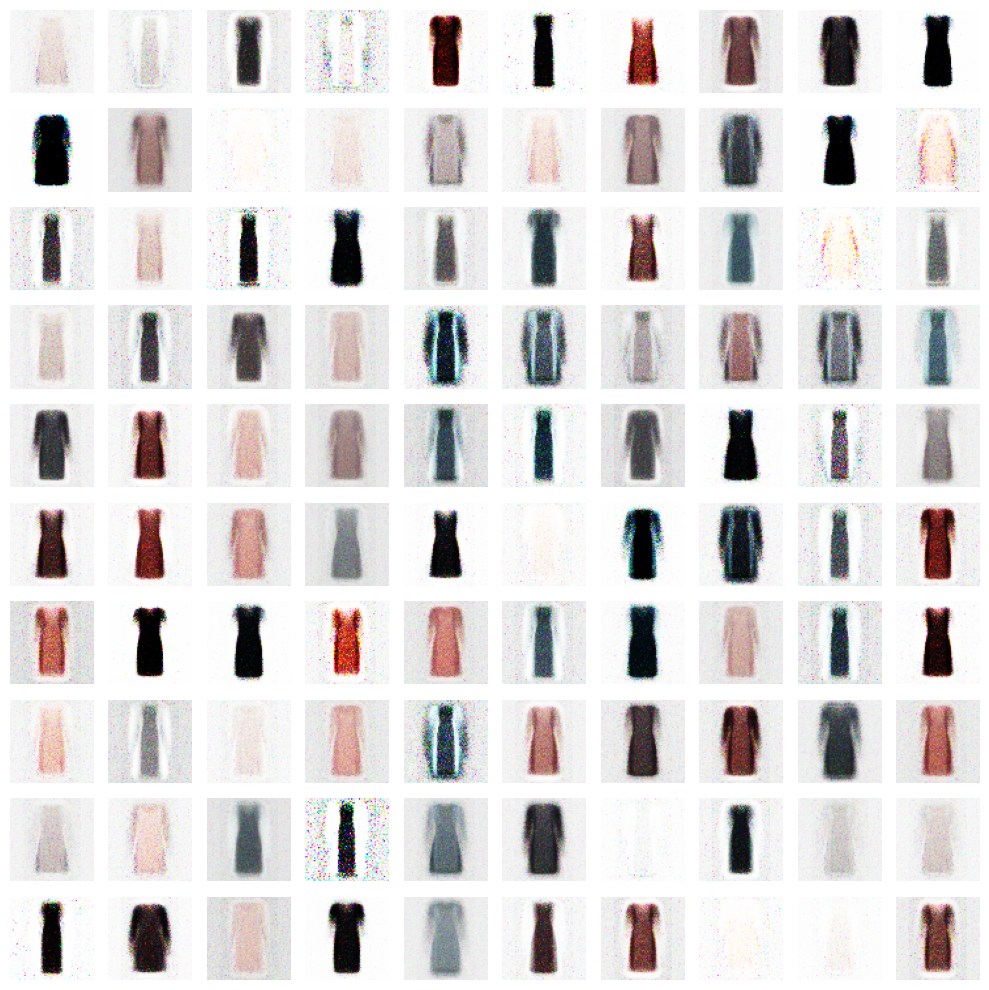

Epoch 21


  0%|          | 0/128 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


  1%|          | 1/128 [00:00<00:23,  5.47it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  2%|▏         | 2/128 [00:00<00:20,  6.06it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


  2%|▏         | 3/128 [00:00<00:20,  6.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  3%|▎         | 4/128 [00:00<00:21,  5.90it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


  4%|▍         | 5/128 [00:00<00:21,  5.75it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


  5%|▍         | 6/128 [00:01<00:22,  5.36it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


  5%|▌         | 7/128 [00:01<00:22,  5.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


  6%|▋         | 8/128 [00:01<00:22,  5.35it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


  7%|▋         | 9/128 [00:01<00:21,  5.52it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  8%|▊         | 10/128 [00:01<00:19,  5.91it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


  9%|▊         | 11/128 [00:01<00:20,  5.72it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


  9%|▉         | 12/128 [00:02<00:22,  5.05it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 10%|█         | 13/128 [00:02<00:22,  5.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 11%|█         | 14/128 [00:02<00:21,  5.34it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 12%|█▏        | 15/128 [00:02<00:20,  5.45it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 12%|█▎        | 16/128 [00:02<00:22,  4.89it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 13%|█▎        | 17/128 [00:03<00:22,  4.87it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 14%|█▍        | 18/128 [00:03<00:21,  5.15it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


 15%|█▍        | 19/128 [00:03<00:20,  5.21it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 16%|█▌        | 20/128 [00:03<00:20,  5.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 16%|█▋        | 21/128 [00:03<00:19,  5.37it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 17%|█▋        | 22/128 [00:04<00:20,  5.30it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 18%|█▊        | 23/128 [00:04<00:19,  5.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 19%|█▉        | 24/128 [00:04<00:19,  5.45it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 20%|█▉        | 25/128 [00:04<00:18,  5.52it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 20%|██        | 26/128 [00:04<00:17,  5.67it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 21%|██        | 27/128 [00:04<00:17,  5.68it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 22%|██▏       | 28/128 [00:05<00:17,  5.75it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 23%|██▎       | 29/128 [00:05<00:17,  5.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 23%|██▎       | 30/128 [00:05<00:15,  6.33it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 24%|██▍       | 31/128 [00:05<00:14,  6.59it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 25%|██▌       | 32/128 [00:05<00:14,  6.84it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 26%|██▌       | 33/128 [00:05<00:13,  7.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 27%|██▋       | 34/128 [00:05<00:12,  7.36it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 27%|██▋       | 35/128 [00:06<00:12,  7.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 28%|██▊       | 36/128 [00:06<00:12,  7.33it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 29%|██▉       | 37/128 [00:06<00:12,  7.10it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 30%|██▉       | 38/128 [00:06<00:12,  6.94it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 30%|███       | 39/128 [00:06<00:12,  7.06it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 31%|███▏      | 40/128 [00:06<00:12,  7.21it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 32%|███▏      | 41/128 [00:06<00:12,  6.99it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 33%|███▎      | 42/128 [00:07<00:12,  6.86it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 34%|███▎      | 43/128 [00:07<00:12,  6.82it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 34%|███▍      | 44/128 [00:07<00:12,  6.61it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 35%|███▌      | 45/128 [00:07<00:12,  6.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 36%|███▌      | 46/128 [00:07<00:12,  6.62it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 37%|███▋      | 47/128 [00:07<00:11,  6.79it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 38%|███▊      | 48/128 [00:07<00:11,  7.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 38%|███▊      | 49/128 [00:08<00:11,  7.15it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 39%|███▉      | 50/128 [00:08<00:10,  7.21it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 40%|███▉      | 51/128 [00:08<00:11,  6.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 41%|████      | 52/128 [00:08<00:10,  7.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 41%|████▏     | 53/128 [00:08<00:10,  7.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 42%|████▏     | 54/128 [00:08<00:10,  7.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 43%|████▎     | 55/128 [00:08<00:09,  7.35it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 44%|████▍     | 56/128 [00:09<00:10,  7.02it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 45%|████▍     | 57/128 [00:09<00:10,  6.91it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 45%|████▌     | 58/128 [00:09<00:10,  6.83it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 46%|████▌     | 59/128 [00:09<00:10,  6.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 47%|████▋     | 60/128 [00:09<00:10,  6.67it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 48%|████▊     | 61/128 [00:09<00:10,  6.57it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 48%|████▊     | 62/128 [00:10<00:09,  6.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 49%|████▉     | 63/128 [00:10<00:09,  7.02it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 50%|█████     | 64/128 [00:10<00:09,  6.83it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 51%|█████     | 65/128 [00:10<00:08,  7.11it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 52%|█████▏    | 66/128 [00:10<00:08,  7.33it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 52%|█████▏    | 67/128 [00:10<00:08,  7.13it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 53%|█████▎    | 68/128 [00:10<00:08,  7.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 54%|█████▍    | 69/128 [00:10<00:08,  7.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 55%|█████▍    | 70/128 [00:11<00:08,  6.84it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 55%|█████▌    | 71/128 [00:11<00:08,  7.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 56%|█████▋    | 72/128 [00:11<00:07,  7.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 57%|█████▋    | 73/128 [00:11<00:07,  7.24it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 58%|█████▊    | 74/128 [00:11<00:07,  7.42it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 59%|█████▊    | 75/128 [00:11<00:07,  7.45it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 59%|█████▉    | 76/128 [00:11<00:06,  7.60it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 60%|██████    | 77/128 [00:12<00:06,  7.32it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 61%|██████    | 78/128 [00:12<00:07,  7.11it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 62%|██████▏   | 79/128 [00:12<00:07,  6.94it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 62%|██████▎   | 80/128 [00:12<00:07,  6.73it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 63%|██████▎   | 81/128 [00:12<00:06,  6.99it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 64%|██████▍   | 82/128 [00:12<00:06,  6.73it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 65%|██████▍   | 83/128 [00:12<00:06,  6.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 66%|██████▌   | 84/128 [00:13<00:06,  6.94it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 66%|██████▋   | 85/128 [00:13<00:06,  7.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 67%|██████▋   | 86/128 [00:13<00:06,  6.86it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 68%|██████▊   | 87/128 [00:13<00:05,  7.05it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 69%|██████▉   | 88/128 [00:13<00:05,  6.93it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 70%|██████▉   | 89/128 [00:13<00:05,  7.23it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 70%|███████   | 90/128 [00:13<00:05,  7.49it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 71%|███████   | 91/128 [00:14<00:04,  7.64it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 72%|███████▏  | 92/128 [00:14<00:05,  6.96it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 73%|███████▎  | 93/128 [00:14<00:05,  6.79it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 73%|███████▎  | 94/128 [00:14<00:04,  7.05it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 74%|███████▍  | 95/128 [00:14<00:04,  7.15it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 75%|███████▌  | 96/128 [00:14<00:04,  6.99it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 76%|███████▌  | 97/128 [00:14<00:04,  6.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 77%|███████▋  | 98/128 [00:15<00:04,  7.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 77%|███████▋  | 99/128 [00:15<00:04,  6.96it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 78%|███████▊  | 100/128 [00:15<00:04,  6.93it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 79%|███████▉  | 101/128 [00:15<00:04,  6.65it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 80%|███████▉  | 102/128 [00:15<00:04,  6.36it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 80%|████████  | 103/128 [00:15<00:03,  6.32it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 81%|████████▏ | 104/128 [00:16<00:04,  5.69it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 82%|████████▏ | 105/128 [00:16<00:03,  5.81it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 83%|████████▎ | 106/128 [00:16<00:03,  5.58it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


 84%|████████▎ | 107/128 [00:16<00:03,  5.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


 84%|████████▍ | 108/128 [00:16<00:04,  4.56it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 85%|████████▌ | 109/128 [00:17<00:04,  4.52it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 86%|████████▌ | 110/128 [00:17<00:03,  4.76it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 87%|████████▋ | 111/128 [00:17<00:03,  4.52it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 88%|████████▊ | 112/128 [00:17<00:03,  4.62it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 88%|████████▊ | 113/128 [00:17<00:03,  4.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 89%|████████▉ | 114/128 [00:18<00:03,  4.47it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 90%|████████▉ | 115/128 [00:18<00:02,  4.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


 91%|█████████ | 116/128 [00:18<00:02,  4.68it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 91%|█████████▏| 117/128 [00:18<00:02,  4.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 92%|█████████▏| 118/128 [00:19<00:01,  5.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 93%|█████████▎| 119/128 [00:19<00:01,  4.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 94%|█████████▍| 120/128 [00:19<00:01,  5.11it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 95%|█████████▍| 121/128 [00:19<00:01,  4.68it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 95%|█████████▌| 122/128 [00:19<00:01,  4.99it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 96%|█████████▌| 123/128 [00:20<00:00,  5.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


 97%|█████████▋| 124/128 [00:20<00:00,  4.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 98%|█████████▊| 125/128 [00:20<00:00,  4.90it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 98%|█████████▊| 126/128 [00:20<00:00,  5.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 99%|█████████▉| 127/128 [00:20<00:00,  5.58it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


100%|██████████| 128/128 [00:20<00:00,  6.12it/s]


Epoch 22


  0%|          | 0/128 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  1%|          | 1/128 [00:00<00:16,  7.60it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  2%|▏         | 2/128 [00:00<00:18,  6.74it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  2%|▏         | 3/128 [00:00<00:17,  7.13it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  3%|▎         | 4/128 [00:00<00:17,  6.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  4%|▍         | 5/128 [00:00<00:18,  6.82it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  5%|▍         | 6/128 [00:00<00:17,  7.11it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  5%|▌         | 7/128 [00:01<00:17,  6.91it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  6%|▋         | 8/128 [00:01<00:17,  6.75it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  7%|▋         | 9/128 [00:01<00:18,  6.57it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  8%|▊         | 10/128 [00:01<00:17,  6.79it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  9%|▊         | 11/128 [00:01<00:16,  7.02it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  9%|▉         | 12/128 [00:01<00:16,  7.03it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 10%|█         | 13/128 [00:01<00:16,  7.02it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 11%|█         | 14/128 [00:02<00:15,  7.15it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 12%|█▏        | 15/128 [00:02<00:15,  7.10it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 12%|█▎        | 16/128 [00:02<00:16,  6.79it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 13%|█▎        | 17/128 [00:02<00:16,  6.93it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 14%|█▍        | 18/128 [00:02<00:15,  7.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 15%|█▍        | 19/128 [00:02<00:14,  7.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 16%|█▌        | 20/128 [00:02<00:15,  7.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 16%|█▋        | 21/128 [00:03<00:15,  6.93it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 17%|█▋        | 22/128 [00:03<00:15,  6.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 18%|█▊        | 23/128 [00:03<00:15,  6.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 19%|█▉        | 24/128 [00:03<00:15,  6.89it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 20%|█▉        | 25/128 [00:03<00:15,  6.74it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 20%|██        | 26/128 [00:03<00:15,  6.60it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 21%|██        | 27/128 [00:03<00:14,  6.74it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 22%|██▏       | 28/128 [00:04<00:15,  6.59it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 23%|██▎       | 29/128 [00:04<00:15,  6.50it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 23%|██▎       | 30/128 [00:04<00:14,  6.54it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 24%|██▍       | 31/128 [00:04<00:14,  6.53it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 25%|██▌       | 32/128 [00:04<00:14,  6.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 26%|██▌       | 33/128 [00:04<00:14,  6.69it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 27%|██▋       | 34/128 [00:04<00:14,  6.52it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 27%|██▋       | 35/128 [00:05<00:13,  6.76it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 28%|██▊       | 36/128 [00:05<00:13,  6.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 29%|██▉       | 37/128 [00:05<00:13,  6.82it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 30%|██▉       | 38/128 [00:05<00:13,  6.73it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 30%|███       | 39/128 [00:05<00:13,  6.80it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 31%|███▏      | 40/128 [00:05<00:12,  6.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 32%|███▏      | 41/128 [00:05<00:12,  6.72it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 33%|███▎      | 42/128 [00:06<00:13,  6.45it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 34%|███▎      | 43/128 [00:06<00:12,  6.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 34%|███▍      | 44/128 [00:06<00:11,  7.03it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 35%|███▌      | 45/128 [00:06<00:11,  7.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 36%|███▌      | 46/128 [00:06<00:11,  7.05it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 37%|███▋      | 47/128 [00:06<00:11,  7.20it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 38%|███▊      | 48/128 [00:06<00:11,  7.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 38%|███▊      | 49/128 [00:07<00:11,  6.72it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 39%|███▉      | 50/128 [00:07<00:11,  6.82it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 40%|███▉      | 51/128 [00:07<00:10,  7.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 41%|████      | 52/128 [00:07<00:10,  6.93it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 41%|████▏     | 53/128 [00:07<00:11,  6.75it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 42%|████▏     | 54/128 [00:07<00:10,  7.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 43%|████▎     | 55/128 [00:07<00:10,  7.21it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 44%|████▍     | 56/128 [00:08<00:10,  7.14it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 45%|████▍     | 57/128 [00:08<00:10,  7.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 45%|████▌     | 58/128 [00:08<00:09,  7.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 46%|████▌     | 59/128 [00:08<00:09,  7.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 47%|████▋     | 60/128 [00:08<00:10,  6.71it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 48%|████▊     | 61/128 [00:08<00:10,  6.59it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 48%|████▊     | 62/128 [00:09<00:09,  6.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 49%|████▉     | 63/128 [00:09<00:09,  6.70it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 50%|█████     | 64/128 [00:09<00:09,  6.79it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 51%|█████     | 65/128 [00:09<00:09,  6.67it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 52%|█████▏    | 66/128 [00:09<00:09,  6.34it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 52%|█████▏    | 67/128 [00:09<00:11,  5.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 53%|█████▎    | 68/128 [00:10<00:11,  5.30it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 54%|█████▍    | 69/128 [00:10<00:12,  4.81it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 55%|█████▍    | 70/128 [00:10<00:11,  4.91it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


 55%|█████▌    | 71/128 [00:10<00:11,  4.90it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 56%|█████▋    | 72/128 [00:11<00:12,  4.48it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 57%|█████▋    | 73/128 [00:11<00:11,  4.66it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 58%|█████▊    | 74/128 [00:11<00:11,  4.89it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 59%|█████▊    | 75/128 [00:11<00:10,  5.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


 59%|█████▉    | 76/128 [00:11<00:10,  4.90it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 60%|██████    | 77/128 [00:11<00:09,  5.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 61%|██████    | 78/128 [00:12<00:09,  5.45it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 62%|██████▏   | 79/128 [00:12<00:08,  5.47it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 62%|██████▎   | 80/128 [00:12<00:08,  5.65it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 63%|██████▎   | 81/128 [00:12<00:08,  5.73it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 64%|██████▍   | 82/128 [00:12<00:07,  5.87it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 65%|██████▍   | 83/128 [00:12<00:07,  5.83it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 66%|██████▌   | 84/128 [00:13<00:07,  5.70it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 66%|██████▋   | 85/128 [00:13<00:07,  5.57it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 67%|██████▋   | 86/128 [00:13<00:07,  5.71it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 68%|██████▊   | 87/128 [00:13<00:08,  4.83it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 69%|██████▉   | 88/128 [00:13<00:08,  4.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 70%|██████▉   | 89/128 [00:14<00:07,  5.13it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 70%|███████   | 90/128 [00:14<00:07,  5.30it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 71%|███████   | 91/128 [00:14<00:06,  5.81it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 72%|███████▏  | 92/128 [00:14<00:05,  6.34it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 73%|███████▎  | 93/128 [00:14<00:05,  6.32it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 73%|███████▎  | 94/128 [00:14<00:05,  6.43it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 74%|███████▍  | 95/128 [00:15<00:04,  6.83it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 75%|███████▌  | 96/128 [00:15<00:04,  6.68it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 76%|███████▌  | 97/128 [00:15<00:04,  6.61it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 77%|███████▋  | 98/128 [00:15<00:04,  6.59it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 77%|███████▋  | 99/128 [00:15<00:04,  6.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 78%|███████▊  | 100/128 [00:15<00:04,  6.96it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 79%|███████▉  | 101/128 [00:15<00:04,  6.73it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 80%|███████▉  | 102/128 [00:16<00:03,  7.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 80%|████████  | 103/128 [00:16<00:03,  7.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 81%|████████▏ | 104/128 [00:16<00:03,  6.93it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 82%|████████▏ | 105/128 [00:16<00:03,  7.06it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 83%|████████▎ | 106/128 [00:16<00:03,  7.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 84%|████████▎ | 107/128 [00:16<00:02,  7.34it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 84%|████████▍ | 108/128 [00:16<00:02,  7.32it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 85%|████████▌ | 109/128 [00:17<00:02,  6.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 86%|████████▌ | 110/128 [00:17<00:02,  7.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 87%|████████▋ | 111/128 [00:17<00:02,  7.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 88%|████████▊ | 112/128 [00:17<00:02,  7.05it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 88%|████████▊ | 113/128 [00:17<00:02,  7.25it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 89%|████████▉ | 114/128 [00:17<00:01,  7.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 90%|████████▉ | 115/128 [00:17<00:01,  7.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 91%|█████████ | 116/128 [00:18<00:01,  6.83it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 91%|█████████▏| 117/128 [00:18<00:01,  6.80it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 92%|█████████▏| 118/128 [00:18<00:01,  6.72it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 93%|█████████▎| 119/128 [00:18<00:01,  7.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 94%|█████████▍| 120/128 [00:18<00:01,  7.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 95%|█████████▍| 121/128 [00:18<00:01,  6.89it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 95%|█████████▌| 122/128 [00:18<00:00,  6.70it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 96%|█████████▌| 123/128 [00:19<00:00,  6.41it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 97%|█████████▋| 124/128 [00:19<00:00,  6.44it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 98%|█████████▊| 125/128 [00:19<00:00,  6.75it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 98%|█████████▊| 126/128 [00:19<00:00,  6.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 99%|█████████▉| 127/128 [00:19<00:00,  7.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


100%|██████████| 128/128 [00:19<00:00,  6.48it/s]


Epoch 23


  0%|          | 0/128 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  1%|          | 1/128 [00:00<00:19,  6.64it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  2%|▏         | 2/128 [00:00<00:19,  6.43it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  2%|▏         | 3/128 [00:00<00:18,  6.87it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  3%|▎         | 4/128 [00:00<00:17,  7.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  4%|▍         | 5/128 [00:00<00:18,  6.81it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  5%|▍         | 6/128 [00:00<00:18,  6.70it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  5%|▌         | 7/128 [00:01<00:17,  7.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  6%|▋         | 8/128 [00:01<00:16,  7.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  7%|▋         | 9/128 [00:01<00:16,  7.30it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  8%|▊         | 10/128 [00:01<00:16,  7.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


  9%|▊         | 11/128 [00:01<00:17,  6.82it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  9%|▉         | 12/128 [00:01<00:16,  7.03it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 10%|█         | 13/128 [00:01<00:15,  7.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 11%|█         | 14/128 [00:02<00:16,  6.81it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 12%|█▏        | 15/128 [00:02<00:15,  7.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 12%|█▎        | 16/128 [00:02<00:15,  7.14it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 13%|█▎        | 17/128 [00:02<00:15,  7.24it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 14%|█▍        | 18/128 [00:02<00:15,  6.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 15%|█▍        | 19/128 [00:02<00:15,  7.20it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 16%|█▌        | 20/128 [00:02<00:15,  7.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 16%|█▋        | 21/128 [00:03<00:15,  6.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 17%|█▋        | 22/128 [00:03<00:14,  7.10it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 18%|█▊        | 23/128 [00:03<00:14,  7.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 19%|█▉        | 24/128 [00:03<00:13,  7.50it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 20%|█▉        | 25/128 [00:03<00:14,  7.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 20%|██        | 26/128 [00:03<00:14,  6.94it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 21%|██        | 27/128 [00:03<00:14,  7.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 22%|██▏       | 28/128 [00:03<00:13,  7.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 23%|██▎       | 29/128 [00:04<00:13,  7.36it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 23%|██▎       | 30/128 [00:04<00:13,  7.44it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 24%|██▍       | 31/128 [00:04<00:13,  7.41it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 25%|██▌       | 32/128 [00:04<00:12,  7.52it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 26%|██▌       | 33/128 [00:04<00:13,  6.93it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 27%|██▋       | 34/128 [00:04<00:14,  6.54it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 27%|██▋       | 35/128 [00:05<00:15,  6.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 28%|██▊       | 36/128 [00:05<00:14,  6.21it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 29%|██▉       | 37/128 [00:05<00:15,  6.02it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 30%|██▉       | 38/128 [00:05<00:15,  5.71it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 30%|███       | 39/128 [00:05<00:15,  5.75it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 31%|███▏      | 40/128 [00:05<00:15,  5.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 32%|███▏      | 41/128 [00:06<00:15,  5.76it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 33%|███▎      | 42/128 [00:06<00:14,  6.03it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 34%|███▎      | 43/128 [00:06<00:14,  5.90it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 34%|███▍      | 44/128 [00:06<00:13,  6.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 35%|███▌      | 45/128 [00:06<00:13,  6.13it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 36%|███▌      | 46/128 [00:06<00:13,  6.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 37%|███▋      | 47/128 [00:07<00:13,  6.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 38%|███▊      | 48/128 [00:07<00:13,  6.15it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 38%|███▊      | 49/128 [00:07<00:13,  5.84it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 39%|███▉      | 50/128 [00:07<00:13,  5.82it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 40%|███▉      | 51/128 [00:07<00:13,  5.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 41%|████      | 52/128 [00:07<00:13,  5.45it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


 41%|████▏     | 53/128 [00:08<00:16,  4.62it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 42%|████▏     | 54/128 [00:08<00:15,  4.83it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 43%|████▎     | 55/128 [00:08<00:14,  5.10it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


 44%|████▍     | 56/128 [00:08<00:15,  4.65it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 45%|████▍     | 57/128 [00:09<00:14,  5.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 45%|████▌     | 58/128 [00:09<00:12,  5.52it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 46%|████▌     | 59/128 [00:09<00:11,  6.05it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 47%|████▋     | 60/128 [00:09<00:10,  6.47it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 48%|████▊     | 61/128 [00:09<00:09,  6.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 48%|████▊     | 62/128 [00:09<00:09,  6.76it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 49%|████▉     | 63/128 [00:09<00:09,  6.67it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 50%|█████     | 64/128 [00:09<00:09,  6.84it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 51%|█████     | 65/128 [00:10<00:09,  6.50it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 52%|█████▏    | 66/128 [00:10<00:09,  6.48it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 52%|█████▏    | 67/128 [00:10<00:09,  6.75it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 53%|█████▎    | 68/128 [00:10<00:08,  7.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 54%|█████▍    | 69/128 [00:10<00:08,  7.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 55%|█████▍    | 70/128 [00:10<00:08,  6.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 55%|█████▌    | 71/128 [00:11<00:08,  6.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 56%|█████▋    | 72/128 [00:11<00:07,  7.21it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 57%|█████▋    | 73/128 [00:11<00:07,  7.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 58%|█████▊    | 74/128 [00:11<00:07,  7.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 59%|█████▊    | 75/128 [00:11<00:07,  7.48it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 59%|█████▉    | 76/128 [00:11<00:06,  7.58it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 60%|██████    | 77/128 [00:11<00:07,  7.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 61%|██████    | 78/128 [00:11<00:07,  7.05it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 62%|██████▏   | 79/128 [00:12<00:06,  7.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 62%|██████▎   | 80/128 [00:12<00:06,  7.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 63%|██████▎   | 81/128 [00:12<00:06,  7.13it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 64%|██████▍   | 82/128 [00:12<00:06,  7.39it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 65%|██████▍   | 83/128 [00:12<00:05,  7.53it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 66%|██████▌   | 84/128 [00:12<00:05,  7.55it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 66%|██████▋   | 85/128 [00:12<00:05,  7.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 67%|██████▋   | 86/128 [00:13<00:05,  7.36it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 68%|██████▊   | 87/128 [00:13<00:05,  7.46it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 69%|██████▉   | 88/128 [00:13<00:05,  7.43it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 70%|██████▉   | 89/128 [00:13<00:05,  7.05it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 70%|███████   | 90/128 [00:13<00:05,  7.24it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 71%|███████   | 91/128 [00:13<00:05,  7.03it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 72%|███████▏  | 92/128 [00:13<00:04,  7.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 73%|███████▎  | 93/128 [00:14<00:04,  7.33it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 73%|███████▎  | 94/128 [00:14<00:04,  7.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 74%|███████▍  | 95/128 [00:14<00:04,  7.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 75%|███████▌  | 96/128 [00:14<00:04,  6.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 76%|███████▌  | 97/128 [00:14<00:04,  7.14it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 77%|███████▋  | 98/128 [00:14<00:04,  7.23it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 77%|███████▋  | 99/128 [00:14<00:03,  7.42it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 78%|███████▊  | 100/128 [00:14<00:03,  7.06it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 79%|███████▉  | 101/128 [00:15<00:03,  7.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 80%|███████▉  | 102/128 [00:15<00:03,  6.90it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 80%|████████  | 103/128 [00:15<00:03,  6.70it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 81%|████████▏ | 104/128 [00:15<00:03,  6.57it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 82%|████████▏ | 105/128 [00:15<00:03,  6.52it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 83%|████████▎ | 106/128 [00:15<00:03,  6.47it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 84%|████████▎ | 107/128 [00:16<00:03,  6.49it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 84%|████████▍ | 108/128 [00:16<00:02,  6.83it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 85%|████████▌ | 109/128 [00:16<00:02,  6.74it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 86%|████████▌ | 110/128 [00:16<00:02,  7.06it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 87%|████████▋ | 111/128 [00:16<00:02,  6.87it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 88%|████████▊ | 112/128 [00:16<00:02,  6.72it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 88%|████████▊ | 113/128 [00:16<00:02,  6.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 89%|████████▉ | 114/128 [00:17<00:01,  7.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 90%|████████▉ | 115/128 [00:17<00:01,  6.96it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 91%|█████████ | 116/128 [00:17<00:01,  6.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 91%|█████████▏| 117/128 [00:17<00:01,  6.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 92%|█████████▏| 118/128 [00:17<00:01,  6.72it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 93%|█████████▎| 119/128 [00:17<00:01,  7.03it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 94%|█████████▍| 120/128 [00:17<00:01,  6.86it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 95%|█████████▍| 121/128 [00:18<00:00,  7.14it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 95%|█████████▌| 122/128 [00:18<00:00,  7.37it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 96%|█████████▌| 123/128 [00:18<00:00,  7.13it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 97%|█████████▋| 124/128 [00:18<00:00,  6.86it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 98%|█████████▊| 125/128 [00:18<00:00,  6.90it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 98%|█████████▊| 126/128 [00:18<00:00,  6.60it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 99%|█████████▉| 127/128 [00:18<00:00,  6.46it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


100%|██████████| 128/128 [00:19<00:00,  6.69it/s]


Epoch 24


  0%|          | 0/128 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


  1%|          | 1/128 [00:00<00:24,  5.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


  2%|▏         | 2/128 [00:00<00:23,  5.41it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  2%|▏         | 3/128 [00:00<00:22,  5.55it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  3%|▎         | 4/128 [00:00<00:21,  5.89it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


  4%|▍         | 5/128 [00:00<00:20,  6.06it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  5%|▍         | 6/128 [00:01<00:20,  6.06it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  5%|▌         | 7/128 [00:01<00:19,  6.11it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  6%|▋         | 8/128 [00:01<00:20,  5.90it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  7%|▋         | 9/128 [00:01<00:20,  5.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


  8%|▊         | 10/128 [00:01<00:20,  5.79it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


  9%|▊         | 11/128 [00:01<00:20,  5.68it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  9%|▉         | 12/128 [00:02<00:20,  5.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 10%|█         | 13/128 [00:02<00:19,  5.81it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 11%|█         | 14/128 [00:02<00:19,  5.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 12%|█▏        | 15/128 [00:02<00:19,  5.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 12%|█▎        | 16/128 [00:02<00:19,  5.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 13%|█▎        | 17/128 [00:02<00:20,  5.54it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 14%|█▍        | 18/128 [00:03<00:19,  5.73it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 15%|█▍        | 19/128 [00:03<00:18,  5.87it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 16%|█▌        | 20/128 [00:03<00:18,  5.83it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 16%|█▋        | 21/128 [00:03<00:21,  5.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 17%|█▋        | 22/128 [00:03<00:20,  5.20it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 18%|█▊        | 23/128 [00:04<00:20,  5.23it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 19%|█▉        | 24/128 [00:04<00:21,  4.79it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 20%|█▉        | 25/128 [00:04<00:21,  4.89it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 20%|██        | 26/128 [00:04<00:20,  4.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 21%|██        | 27/128 [00:04<00:18,  5.34it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 22%|██▏       | 28/128 [00:05<00:17,  5.67it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 23%|██▎       | 29/128 [00:05<00:19,  5.13it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 23%|██▎       | 30/128 [00:05<00:17,  5.69it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 24%|██▍       | 31/128 [00:05<00:15,  6.15it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 25%|██▌       | 32/128 [00:05<00:14,  6.47it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 26%|██▌       | 33/128 [00:05<00:14,  6.40it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 27%|██▋       | 34/128 [00:05<00:14,  6.42it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 27%|██▋       | 35/128 [00:06<00:14,  6.45it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 28%|██▊       | 36/128 [00:06<00:15,  6.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 29%|██▉       | 37/128 [00:06<00:14,  6.43it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 30%|██▉       | 38/128 [00:06<00:13,  6.50it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 30%|███       | 39/128 [00:06<00:13,  6.43it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 31%|███▏      | 40/128 [00:06<00:13,  6.47it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 32%|███▏      | 41/128 [00:07<00:12,  6.87it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 33%|███▎      | 42/128 [00:07<00:12,  6.83it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 34%|███▎      | 43/128 [00:07<00:12,  6.75it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 34%|███▍      | 44/128 [00:07<00:12,  6.89it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 35%|███▌      | 45/128 [00:07<00:11,  7.11it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 36%|███▌      | 46/128 [00:07<00:11,  7.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 37%|███▋      | 47/128 [00:07<00:11,  7.32it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 38%|███▊      | 48/128 [00:08<00:11,  7.03it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 38%|███▊      | 49/128 [00:08<00:11,  7.13it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 39%|███▉      | 50/128 [00:08<00:11,  6.90it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 40%|███▉      | 51/128 [00:08<00:10,  7.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 41%|████      | 52/128 [00:08<00:10,  7.35it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 41%|████▏     | 53/128 [00:08<00:10,  7.50it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 42%|████▏     | 54/128 [00:08<00:09,  7.65it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 43%|████▎     | 55/128 [00:08<00:09,  7.73it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 44%|████▍     | 56/128 [00:09<00:09,  7.59it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 45%|████▍     | 57/128 [00:09<00:09,  7.52it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 45%|████▌     | 58/128 [00:09<00:09,  7.53it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 46%|████▌     | 59/128 [00:09<00:09,  6.91it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 47%|████▋     | 60/128 [00:09<00:10,  6.74it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 48%|████▊     | 61/128 [00:09<00:09,  6.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 48%|████▊     | 62/128 [00:09<00:09,  6.80it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 49%|████▉     | 63/128 [00:10<00:09,  6.74it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 50%|█████     | 64/128 [00:10<00:09,  6.79it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 51%|█████     | 65/128 [00:10<00:08,  7.13it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 52%|█████▏    | 66/128 [00:10<00:08,  7.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 52%|█████▏    | 67/128 [00:10<00:08,  7.33it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 53%|█████▎    | 68/128 [00:10<00:08,  7.45it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 54%|█████▍    | 69/128 [00:10<00:07,  7.56it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 55%|█████▍    | 70/128 [00:11<00:08,  7.15it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 55%|█████▌    | 71/128 [00:11<00:07,  7.33it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 56%|█████▋    | 72/128 [00:11<00:07,  7.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 57%|█████▋    | 73/128 [00:11<00:07,  7.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 58%|█████▊    | 74/128 [00:11<00:07,  6.82it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 59%|█████▊    | 75/128 [00:11<00:07,  6.99it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 59%|█████▉    | 76/128 [00:11<00:07,  6.87it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 60%|██████    | 77/128 [00:12<00:07,  6.73it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 61%|██████    | 78/128 [00:12<00:07,  6.72it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 62%|██████▏   | 79/128 [00:12<00:06,  7.02it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 62%|██████▎   | 80/128 [00:12<00:07,  6.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 63%|██████▎   | 81/128 [00:12<00:07,  6.60it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 64%|██████▍   | 82/128 [00:12<00:06,  6.58it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 65%|██████▍   | 83/128 [00:12<00:06,  6.90it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 66%|██████▌   | 84/128 [00:13<00:06,  6.81it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 66%|██████▋   | 85/128 [00:13<00:06,  6.99it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 67%|██████▋   | 86/128 [00:13<00:05,  7.11it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 68%|██████▊   | 87/128 [00:13<00:05,  7.14it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 69%|██████▉   | 88/128 [00:13<00:05,  7.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 70%|██████▉   | 89/128 [00:13<00:05,  7.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 70%|███████   | 90/128 [00:13<00:05,  7.45it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 71%|███████   | 91/128 [00:14<00:04,  7.59it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 72%|███████▏  | 92/128 [00:14<00:04,  7.52it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 73%|███████▎  | 93/128 [00:14<00:04,  7.56it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 73%|███████▎  | 94/128 [00:14<00:04,  7.21it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 74%|███████▍  | 95/128 [00:14<00:04,  7.15it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 75%|███████▌  | 96/128 [00:14<00:04,  6.82it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 76%|███████▌  | 97/128 [00:14<00:04,  6.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 77%|███████▋  | 98/128 [00:15<00:04,  6.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 77%|███████▋  | 99/128 [00:15<00:04,  6.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 78%|███████▊  | 100/128 [00:15<00:04,  5.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 79%|███████▉  | 101/128 [00:15<00:04,  6.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 80%|███████▉  | 102/128 [00:15<00:04,  6.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 80%|████████  | 103/128 [00:15<00:04,  5.89it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 81%|████████▏ | 104/128 [00:16<00:04,  5.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


 82%|████████▏ | 105/128 [00:16<00:04,  5.43it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 83%|████████▎ | 106/128 [00:16<00:04,  5.45it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 84%|████████▎ | 107/128 [00:16<00:03,  5.35it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 84%|████████▍ | 108/128 [00:16<00:03,  5.42it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 85%|████████▌ | 109/128 [00:17<00:03,  5.40it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 86%|████████▌ | 110/128 [00:17<00:03,  5.44it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 87%|████████▋ | 111/128 [00:17<00:03,  5.58it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


 88%|████████▊ | 112/128 [00:17<00:03,  4.96it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 88%|████████▊ | 113/128 [00:17<00:02,  5.11it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 89%|████████▉ | 114/128 [00:18<00:02,  5.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 90%|████████▉ | 115/128 [00:18<00:02,  5.36it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 91%|█████████ | 116/128 [00:18<00:02,  5.50it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 91%|█████████▏| 117/128 [00:18<00:01,  5.56it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


 92%|█████████▏| 118/128 [00:18<00:02,  4.82it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 93%|█████████▎| 119/128 [00:19<00:01,  5.10it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 94%|█████████▍| 120/128 [00:19<00:01,  5.06it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 95%|█████████▍| 121/128 [00:19<00:01,  5.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 95%|█████████▌| 122/128 [00:19<00:01,  5.34it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 96%|█████████▌| 123/128 [00:19<00:00,  5.65it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 97%|█████████▋| 124/128 [00:19<00:00,  5.86it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 98%|█████████▊| 125/128 [00:20<00:00,  6.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 98%|█████████▊| 126/128 [00:20<00:00,  6.43it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 99%|█████████▉| 127/128 [00:20<00:00,  6.41it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


100%|██████████| 128/128 [00:20<00:00,  6.25it/s]


Epoch 25


  0%|          | 0/128 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  1%|          | 1/128 [00:00<00:18,  7.03it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  2%|▏         | 2/128 [00:00<00:17,  7.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  2%|▏         | 3/128 [00:00<00:17,  7.35it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  3%|▎         | 4/128 [00:00<00:16,  7.51it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  4%|▍         | 5/128 [00:00<00:16,  7.45it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  5%|▍         | 6/128 [00:00<00:17,  7.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  5%|▌         | 7/128 [00:00<00:17,  6.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  6%|▋         | 8/128 [00:01<00:17,  6.71it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  7%|▋         | 9/128 [00:01<00:18,  6.51it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  8%|▊         | 10/128 [00:01<00:18,  6.54it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  9%|▊         | 11/128 [00:01<00:16,  6.96it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  9%|▉         | 12/128 [00:01<00:16,  7.10it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 10%|█         | 13/128 [00:01<00:16,  6.79it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 11%|█         | 14/128 [00:01<00:16,  7.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 12%|█▏        | 15/128 [00:02<00:16,  6.93it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 12%|█▎        | 16/128 [00:02<00:15,  7.13it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 13%|█▎        | 17/128 [00:02<00:15,  7.23it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 14%|█▍        | 18/128 [00:02<00:15,  7.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 15%|█▍        | 19/128 [00:02<00:14,  7.49it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 16%|█▌        | 20/128 [00:02<00:14,  7.66it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 16%|█▋        | 21/128 [00:02<00:15,  7.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 17%|█▋        | 22/128 [00:03<00:14,  7.20it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 18%|█▊        | 23/128 [00:03<00:14,  7.43it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 19%|█▉        | 24/128 [00:03<00:13,  7.47it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 20%|█▉        | 25/128 [00:03<00:14,  7.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 20%|██        | 26/128 [00:03<00:14,  6.96it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 21%|██        | 27/128 [00:03<00:14,  6.79it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 22%|██▏       | 28/128 [00:03<00:14,  7.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 23%|██▎       | 29/128 [00:04<00:14,  6.91it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 23%|██▎       | 30/128 [00:04<00:14,  6.73it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 24%|██▍       | 31/128 [00:04<00:13,  7.03it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 25%|██▌       | 32/128 [00:04<00:13,  7.32it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 26%|██▌       | 33/128 [00:04<00:12,  7.50it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 27%|██▋       | 34/128 [00:04<00:12,  7.24it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 27%|██▋       | 35/128 [00:04<00:13,  7.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 28%|██▊       | 36/128 [00:05<00:13,  6.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 29%|██▉       | 37/128 [00:05<00:13,  6.73it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 30%|██▉       | 38/128 [00:05<00:12,  6.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 30%|███       | 39/128 [00:05<00:12,  7.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 31%|███▏      | 40/128 [00:05<00:12,  6.99it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 32%|███▏      | 41/128 [00:05<00:12,  7.13it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 33%|███▎      | 42/128 [00:05<00:12,  6.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 34%|███▎      | 43/128 [00:06<00:12,  6.82it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 34%|███▍      | 44/128 [00:06<00:11,  7.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 35%|███▌      | 45/128 [00:06<00:11,  7.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 36%|███▌      | 46/128 [00:06<00:11,  7.32it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 37%|███▋      | 47/128 [00:06<00:11,  7.02it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 38%|███▊      | 48/128 [00:06<00:11,  7.24it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 38%|███▊      | 49/128 [00:06<00:10,  7.36it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 39%|███▉      | 50/128 [00:07<00:10,  7.11it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 40%|███▉      | 51/128 [00:07<00:11,  6.83it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 41%|████      | 52/128 [00:07<00:11,  6.69it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 41%|████▏     | 53/128 [00:07<00:10,  6.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 42%|████▏     | 54/128 [00:07<00:10,  6.84it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 43%|████▎     | 55/128 [00:07<00:10,  6.74it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 44%|████▍     | 56/128 [00:07<00:10,  6.66it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 45%|████▍     | 57/128 [00:08<00:10,  6.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 45%|████▌     | 58/128 [00:08<00:09,  7.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 46%|████▌     | 59/128 [00:08<00:10,  6.84it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 47%|████▋     | 60/128 [00:08<00:09,  6.99it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 48%|████▊     | 61/128 [00:08<00:09,  6.75it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 48%|████▊     | 62/128 [00:08<00:09,  6.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 49%|████▉     | 63/128 [00:08<00:09,  6.82it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 50%|█████     | 64/128 [00:09<00:09,  6.61it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 51%|█████     | 65/128 [00:09<00:09,  6.35it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


 52%|█████▏    | 66/128 [00:09<00:11,  5.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 52%|█████▏    | 67/128 [00:09<00:11,  5.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 53%|█████▎    | 68/128 [00:09<00:11,  5.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 54%|█████▍    | 69/128 [00:10<00:11,  5.25it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 55%|█████▍    | 70/128 [00:10<00:11,  5.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 55%|█████▌    | 71/128 [00:10<00:10,  5.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


 56%|█████▋    | 72/128 [00:10<00:11,  5.05it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 57%|█████▋    | 73/128 [00:10<00:11,  4.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 58%|█████▊    | 74/128 [00:11<00:10,  5.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 59%|█████▊    | 75/128 [00:11<00:09,  5.33it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 59%|█████▉    | 76/128 [00:11<00:09,  5.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 60%|██████    | 77/128 [00:11<00:09,  5.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 61%|██████    | 78/128 [00:11<00:09,  5.14it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 62%|██████▏   | 79/128 [00:12<00:10,  4.79it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 62%|██████▎   | 80/128 [00:12<00:09,  4.90it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 63%|██████▎   | 81/128 [00:12<00:10,  4.58it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 64%|██████▍   | 82/128 [00:12<00:09,  4.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 65%|██████▍   | 83/128 [00:13<00:10,  4.41it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 66%|██████▌   | 84/128 [00:13<00:09,  4.61it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 66%|██████▋   | 85/128 [00:13<00:08,  5.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 67%|██████▋   | 86/128 [00:13<00:07,  5.60it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 68%|██████▊   | 87/128 [00:13<00:06,  6.02it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 69%|██████▉   | 88/128 [00:13<00:06,  6.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 70%|██████▉   | 89/128 [00:13<00:05,  6.66it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 70%|███████   | 90/128 [00:14<00:05,  6.87it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 71%|███████   | 91/128 [00:14<00:05,  7.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 72%|███████▏  | 92/128 [00:14<00:05,  6.86it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 73%|███████▎  | 93/128 [00:14<00:05,  6.75it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 73%|███████▎  | 94/128 [00:14<00:04,  7.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 74%|███████▍  | 95/128 [00:14<00:05,  5.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 75%|███████▌  | 96/128 [00:15<00:05,  5.84it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 76%|███████▌  | 97/128 [00:15<00:05,  6.03it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 77%|███████▋  | 98/128 [00:15<00:04,  6.40it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 77%|███████▋  | 99/128 [00:15<00:04,  6.45it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 78%|███████▊  | 100/128 [00:15<00:04,  6.49it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 79%|███████▉  | 101/128 [00:15<00:04,  6.67it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 80%|███████▉  | 102/128 [00:15<00:03,  6.70it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 80%|████████  | 103/128 [00:16<00:03,  6.84it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 81%|████████▏ | 104/128 [00:16<00:03,  7.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 82%|████████▏ | 105/128 [00:16<00:03,  7.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 83%|████████▎ | 106/128 [00:16<00:02,  7.45it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 84%|████████▎ | 107/128 [00:16<00:02,  7.51it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 84%|████████▍ | 108/128 [00:16<00:02,  7.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 85%|████████▌ | 109/128 [00:16<00:02,  6.79it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 86%|████████▌ | 110/128 [00:17<00:02,  6.93it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 87%|████████▋ | 111/128 [00:17<00:02,  6.82it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 88%|████████▊ | 112/128 [00:17<00:02,  6.73it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 88%|████████▊ | 113/128 [00:17<00:02,  6.69it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 89%|████████▉ | 114/128 [00:17<00:02,  6.94it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 90%|████████▉ | 115/128 [00:17<00:01,  7.02it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 91%|█████████ | 116/128 [00:17<00:01,  6.89it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 91%|█████████▏| 117/128 [00:18<00:01,  6.66it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 92%|█████████▏| 118/128 [00:18<00:01,  6.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 93%|█████████▎| 119/128 [00:18<00:01,  7.11it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 94%|█████████▍| 120/128 [00:18<00:01,  7.30it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 95%|█████████▍| 121/128 [00:18<00:00,  7.43it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 95%|█████████▌| 122/128 [00:18<00:00,  7.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 96%|█████████▌| 123/128 [00:18<00:00,  6.94it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 97%|█████████▋| 124/128 [00:19<00:00,  6.72it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 98%|█████████▊| 125/128 [00:19<00:00,  6.64it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 98%|█████████▊| 126/128 [00:19<00:00,  6.94it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 99%|█████████▉| 127/128 [00:19<00:00,  6.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


100%|██████████| 128/128 [00:19<00:00,  6.52it/s]


Epoch 26


  0%|          | 0/128 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  1%|          | 1/128 [00:00<00:16,  7.60it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


  2%|▏         | 2/128 [00:00<00:18,  6.72it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


  2%|▏         | 3/128 [00:00<00:20,  6.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  3%|▎         | 4/128 [00:00<00:19,  6.51it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  4%|▍         | 5/128 [00:00<00:19,  6.39it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


  5%|▍         | 6/128 [00:00<00:19,  6.21it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


  5%|▌         | 7/128 [00:01<00:18,  6.45it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  6%|▋         | 8/128 [00:01<00:17,  6.69it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  7%|▋         | 9/128 [00:01<00:17,  6.66it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  8%|▊         | 10/128 [00:01<00:17,  6.76it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  9%|▊         | 11/128 [00:01<00:17,  6.65it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


  9%|▉         | 12/128 [00:01<00:17,  6.80it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 10%|█         | 13/128 [00:01<00:17,  6.76it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 11%|█         | 14/128 [00:02<00:16,  7.05it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 12%|█▏        | 15/128 [00:02<00:15,  7.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 12%|█▎        | 16/128 [00:02<00:15,  7.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 13%|█▎        | 17/128 [00:02<00:15,  6.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 14%|█▍        | 18/128 [00:02<00:16,  6.70it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 15%|█▍        | 19/128 [00:02<00:15,  7.05it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 16%|█▌        | 20/128 [00:02<00:15,  6.82it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 16%|█▋        | 21/128 [00:03<00:15,  6.74it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 17%|█▋        | 22/128 [00:03<00:15,  6.64it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 18%|█▊        | 23/128 [00:03<00:15,  6.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 19%|█▉        | 24/128 [00:03<00:14,  7.15it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 20%|█▉        | 25/128 [00:03<00:15,  6.82it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 20%|██        | 26/128 [00:03<00:15,  6.73it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 21%|██        | 27/128 [00:04<00:15,  6.54it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


 22%|██▏       | 28/128 [00:04<00:19,  5.21it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


 23%|██▎       | 29/128 [00:04<00:18,  5.35it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 23%|██▎       | 30/128 [00:04<00:17,  5.57it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 24%|██▍       | 31/128 [00:04<00:17,  5.57it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 25%|██▌       | 32/128 [00:04<00:16,  5.69it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 26%|██▌       | 33/128 [00:05<00:15,  5.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 27%|██▋       | 34/128 [00:05<00:16,  5.61it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 27%|██▋       | 35/128 [00:05<00:16,  5.58it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 28%|██▊       | 36/128 [00:05<00:16,  5.72it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 29%|██▉       | 37/128 [00:05<00:15,  5.80it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 30%|██▉       | 38/128 [00:06<00:15,  5.74it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


 30%|███       | 39/128 [00:06<00:15,  5.71it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 31%|███▏      | 40/128 [00:06<00:15,  5.84it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 32%|███▏      | 41/128 [00:06<00:14,  5.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 33%|███▎      | 42/128 [00:06<00:14,  5.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 34%|███▎      | 43/128 [00:06<00:15,  5.57it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 34%|███▍      | 44/128 [00:07<00:15,  5.35it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 35%|███▌      | 45/128 [00:07<00:14,  5.63it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 36%|███▌      | 46/128 [00:07<00:14,  5.64it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 37%|███▋      | 47/128 [00:07<00:14,  5.63it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 38%|███▊      | 48/128 [00:07<00:14,  5.60it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 38%|███▊      | 49/128 [00:07<00:13,  5.66it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 39%|███▉      | 50/128 [00:08<00:13,  5.64it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 40%|███▉      | 51/128 [00:08<00:13,  5.73it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 41%|████      | 52/128 [00:08<00:13,  5.75it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 41%|████▏     | 53/128 [00:08<00:12,  5.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 42%|████▏     | 54/128 [00:08<00:12,  6.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 43%|████▎     | 55/128 [00:08<00:11,  6.46it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 44%|████▍     | 56/128 [00:09<00:10,  6.84it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 45%|████▍     | 57/128 [00:09<00:10,  6.72it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 45%|████▌     | 58/128 [00:09<00:09,  7.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 46%|████▌     | 59/128 [00:09<00:09,  7.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 47%|████▋     | 60/128 [00:09<00:09,  6.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 48%|████▊     | 61/128 [00:09<00:09,  6.80it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 48%|████▊     | 62/128 [00:09<00:09,  6.73it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 49%|████▉     | 63/128 [00:10<00:09,  7.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 50%|█████     | 64/128 [00:10<00:08,  7.21it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 51%|█████     | 65/128 [00:10<00:09,  6.89it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 52%|█████▏    | 66/128 [00:10<00:08,  7.10it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 52%|█████▏    | 67/128 [00:10<00:08,  6.89it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 53%|█████▎    | 68/128 [00:10<00:08,  6.72it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 54%|█████▍    | 69/128 [00:10<00:08,  6.65it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 55%|█████▍    | 70/128 [00:11<00:08,  6.94it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 55%|█████▌    | 71/128 [00:11<00:08,  6.90it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 56%|█████▋    | 72/128 [00:11<00:08,  6.71it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 57%|█████▋    | 73/128 [00:11<00:08,  6.58it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 58%|█████▊    | 74/128 [00:11<00:07,  6.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 59%|█████▊    | 75/128 [00:11<00:07,  7.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 59%|█████▉    | 76/128 [00:11<00:07,  7.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 60%|██████    | 77/128 [00:12<00:07,  7.05it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 61%|██████    | 78/128 [00:12<00:06,  7.24it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 62%|██████▏   | 79/128 [00:12<00:06,  7.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 62%|██████▎   | 80/128 [00:12<00:06,  6.90it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 63%|██████▎   | 81/128 [00:12<00:06,  6.81it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 64%|██████▍   | 82/128 [00:12<00:06,  6.94it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 65%|██████▍   | 83/128 [00:12<00:06,  7.10it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 66%|██████▌   | 84/128 [00:13<00:06,  7.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 66%|██████▋   | 85/128 [00:13<00:05,  7.43it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 67%|██████▋   | 86/128 [00:13<00:05,  7.21it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 68%|██████▊   | 87/128 [00:13<00:05,  7.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 69%|██████▉   | 88/128 [00:13<00:05,  6.83it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 70%|██████▉   | 89/128 [00:13<00:05,  6.68it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 70%|███████   | 90/128 [00:13<00:05,  6.66it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 71%|███████   | 91/128 [00:14<00:05,  6.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 72%|███████▏  | 92/128 [00:14<00:05,  7.20it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 73%|███████▎  | 93/128 [00:14<00:04,  7.42it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 73%|███████▎  | 94/128 [00:14<00:04,  7.34it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 74%|███████▍  | 95/128 [00:14<00:04,  7.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 75%|███████▌  | 96/128 [00:14<00:04,  7.21it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 76%|███████▌  | 97/128 [00:14<00:04,  7.03it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 77%|███████▋  | 98/128 [00:15<00:04,  7.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 77%|███████▋  | 99/128 [00:15<00:04,  7.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 78%|███████▊  | 100/128 [00:15<00:03,  7.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 79%|███████▉  | 101/128 [00:15<00:03,  7.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 80%|███████▉  | 102/128 [00:15<00:03,  7.41it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 80%|████████  | 103/128 [00:15<00:03,  7.06it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 81%|████████▏ | 104/128 [00:15<00:03,  6.91it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 82%|████████▏ | 105/128 [00:16<00:03,  7.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 83%|████████▎ | 106/128 [00:16<00:03,  6.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 84%|████████▎ | 107/128 [00:16<00:03,  6.81it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 84%|████████▍ | 108/128 [00:16<00:02,  6.70it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 85%|████████▌ | 109/128 [00:16<00:02,  7.03it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 86%|████████▌ | 110/128 [00:16<00:02,  6.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 87%|████████▋ | 111/128 [00:16<00:02,  7.24it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 88%|████████▊ | 112/128 [00:17<00:02,  7.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 88%|████████▊ | 113/128 [00:17<00:02,  6.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 89%|████████▉ | 114/128 [00:17<00:02,  6.81it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 90%|████████▉ | 115/128 [00:17<00:01,  7.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 91%|█████████ | 116/128 [00:17<00:01,  7.21it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 91%|█████████▏| 117/128 [00:17<00:01,  7.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 92%|█████████▏| 118/128 [00:17<00:01,  6.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 93%|█████████▎| 119/128 [00:18<00:01,  6.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 94%|█████████▍| 120/128 [00:18<00:01,  6.76it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 95%|█████████▍| 121/128 [00:18<00:01,  6.65it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 95%|█████████▌| 122/128 [00:18<00:00,  7.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 96%|█████████▌| 123/128 [00:18<00:00,  6.82it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 97%|█████████▋| 124/128 [00:18<00:00,  6.66it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 98%|█████████▊| 125/128 [00:18<00:00,  6.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 98%|█████████▊| 126/128 [00:19<00:00,  6.13it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 99%|█████████▉| 127/128 [00:19<00:00,  6.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


100%|██████████| 128/128 [00:19<00:00,  6.58it/s]


Epoch 27


  0%|          | 0/128 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  1%|          | 1/128 [00:00<00:21,  5.90it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  2%|▏         | 2/128 [00:00<00:21,  5.87it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  2%|▏         | 3/128 [00:00<00:21,  5.89it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


  3%|▎         | 4/128 [00:00<00:26,  4.69it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  4%|▍         | 5/128 [00:00<00:24,  5.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  5%|▍         | 6/128 [00:01<00:21,  5.60it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


  5%|▌         | 7/128 [00:01<00:21,  5.73it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


  6%|▋         | 8/128 [00:01<00:21,  5.61it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


  7%|▋         | 9/128 [00:01<00:22,  5.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


  8%|▊         | 10/128 [00:01<00:21,  5.51it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


  9%|▊         | 11/128 [00:02<00:21,  5.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  9%|▉         | 12/128 [00:02<00:21,  5.36it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 10%|█         | 13/128 [00:02<00:20,  5.60it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 11%|█         | 14/128 [00:02<00:20,  5.60it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 12%|█▏        | 15/128 [00:02<00:23,  4.80it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 12%|█▎        | 16/128 [00:03<00:22,  4.99it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 13%|█▎        | 17/128 [00:03<00:21,  5.24it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 14%|█▍        | 18/128 [00:03<00:19,  5.52it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 15%|█▍        | 19/128 [00:03<00:19,  5.63it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 16%|█▌        | 20/128 [00:03<00:21,  4.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 16%|█▋        | 21/128 [00:03<00:21,  5.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 17%|█▋        | 22/128 [00:04<00:20,  5.13it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 18%|█▊        | 23/128 [00:04<00:20,  5.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 19%|█▉        | 24/128 [00:04<00:18,  5.66it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 20%|█▉        | 25/128 [00:04<00:16,  6.15it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 20%|██        | 26/128 [00:04<00:15,  6.50it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 21%|██        | 27/128 [00:04<00:15,  6.41it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 22%|██▏       | 28/128 [00:05<00:14,  6.76it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 23%|██▎       | 29/128 [00:05<00:14,  6.70it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 23%|██▎       | 30/128 [00:05<00:14,  7.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 24%|██▍       | 31/128 [00:05<00:13,  7.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 25%|██▌       | 32/128 [00:05<00:13,  7.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 26%|██▌       | 33/128 [00:05<00:13,  7.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 27%|██▋       | 34/128 [00:05<00:13,  7.15it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 27%|██▋       | 35/128 [00:06<00:13,  6.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 28%|██▊       | 36/128 [00:06<00:12,  7.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 29%|██▉       | 37/128 [00:06<00:12,  7.41it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 30%|██▉       | 38/128 [00:06<00:12,  7.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 30%|███       | 39/128 [00:06<00:12,  7.02it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 31%|███▏      | 40/128 [00:06<00:12,  6.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 32%|███▏      | 41/128 [00:06<00:12,  7.15it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 33%|███▎      | 42/128 [00:06<00:11,  7.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 34%|███▎      | 43/128 [00:07<00:11,  7.34it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 34%|███▍      | 44/128 [00:07<00:12,  6.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 35%|███▌      | 45/128 [00:07<00:11,  7.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 36%|███▌      | 46/128 [00:07<00:11,  7.23it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 37%|███▋      | 47/128 [00:07<00:10,  7.40it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 38%|███▊      | 48/128 [00:07<00:10,  7.36it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 38%|███▊      | 49/128 [00:07<00:11,  7.11it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 39%|███▉      | 50/128 [00:08<00:11,  6.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 40%|███▉      | 51/128 [00:08<00:11,  6.80it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 41%|████      | 52/128 [00:08<00:10,  7.15it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 41%|████▏     | 53/128 [00:08<00:10,  7.30it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 42%|████▏     | 54/128 [00:08<00:09,  7.48it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 43%|████▎     | 55/128 [00:08<00:09,  7.61it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 44%|████▍     | 56/128 [00:08<00:09,  7.59it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 45%|████▍     | 57/128 [00:09<00:09,  7.47it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 45%|████▌     | 58/128 [00:09<00:09,  7.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 46%|████▌     | 59/128 [00:09<00:09,  7.47it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 47%|████▋     | 60/128 [00:09<00:09,  7.55it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 48%|████▊     | 61/128 [00:09<00:08,  7.68it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 48%|████▊     | 62/128 [00:09<00:08,  7.74it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 49%|████▉     | 63/128 [00:09<00:08,  7.83it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 50%|█████     | 64/128 [00:09<00:08,  7.44it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 51%|█████     | 65/128 [00:10<00:08,  7.13it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 52%|█████▏    | 66/128 [00:10<00:09,  6.54it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 52%|█████▏    | 67/128 [00:10<00:09,  6.36it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 53%|█████▎    | 68/128 [00:10<00:09,  6.37it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 54%|█████▍    | 69/128 [00:10<00:09,  6.42it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 55%|█████▍    | 70/128 [00:10<00:09,  6.40it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 55%|█████▌    | 71/128 [00:11<00:08,  6.41it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 56%|█████▋    | 72/128 [00:11<00:08,  6.32it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 57%|█████▋    | 73/128 [00:11<00:08,  6.72it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 58%|█████▊    | 74/128 [00:11<00:08,  6.62it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 59%|█████▊    | 75/128 [00:11<00:08,  6.56it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 59%|█████▉    | 76/128 [00:11<00:07,  6.89it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 60%|██████    | 77/128 [00:11<00:07,  7.20it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 61%|██████    | 78/128 [00:12<00:06,  7.37it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 62%|██████▏   | 79/128 [00:12<00:06,  7.35it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 62%|██████▎   | 80/128 [00:12<00:06,  7.02it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 63%|██████▎   | 81/128 [00:12<00:06,  7.13it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 64%|██████▍   | 82/128 [00:12<00:06,  7.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 65%|██████▍   | 83/128 [00:12<00:06,  6.87it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 66%|██████▌   | 84/128 [00:12<00:06,  6.79it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 66%|██████▋   | 85/128 [00:13<00:06,  7.02it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 67%|██████▋   | 86/128 [00:13<00:05,  7.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 68%|██████▊   | 87/128 [00:13<00:05,  7.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 69%|██████▉   | 88/128 [00:13<00:05,  6.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 70%|██████▉   | 89/128 [00:13<00:05,  7.11it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 70%|███████   | 90/128 [00:13<00:05,  7.30it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 71%|███████   | 91/128 [00:13<00:04,  7.49it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 72%|███████▏  | 92/128 [00:14<00:04,  7.45it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 73%|███████▎  | 93/128 [00:14<00:04,  7.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 73%|███████▎  | 94/128 [00:14<00:05,  6.72it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 74%|███████▍  | 95/128 [00:14<00:05,  6.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 75%|███████▌  | 96/128 [00:14<00:05,  6.06it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 76%|███████▌  | 97/128 [00:14<00:05,  5.71it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 77%|███████▋  | 98/128 [00:15<00:05,  5.68it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 77%|███████▋  | 99/128 [00:15<00:05,  5.71it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 78%|███████▊  | 100/128 [00:15<00:05,  5.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 79%|███████▉  | 101/128 [00:15<00:04,  5.40it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 80%|███████▉  | 102/128 [00:15<00:04,  5.61it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 80%|████████  | 103/128 [00:16<00:04,  5.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


 81%|████████▏ | 104/128 [00:16<00:04,  5.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


 82%|████████▏ | 105/128 [00:16<00:04,  5.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 83%|████████▎ | 106/128 [00:16<00:04,  5.46it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 84%|████████▎ | 107/128 [00:16<00:03,  5.73it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 84%|████████▍ | 108/128 [00:16<00:03,  5.76it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 85%|████████▌ | 109/128 [00:17<00:03,  5.45it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 86%|████████▌ | 110/128 [00:17<00:03,  5.60it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 87%|████████▋ | 111/128 [00:17<00:02,  5.72it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 88%|████████▊ | 112/128 [00:17<00:03,  4.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 88%|████████▊ | 113/128 [00:17<00:02,  5.10it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 89%|████████▉ | 114/128 [00:18<00:02,  5.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 90%|████████▉ | 115/128 [00:18<00:02,  5.56it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 91%|█████████ | 116/128 [00:18<00:02,  5.56it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 91%|█████████▏| 117/128 [00:18<00:02,  5.44it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 92%|█████████▏| 118/128 [00:18<00:01,  5.36it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 93%|█████████▎| 119/128 [00:18<00:01,  5.93it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 94%|█████████▍| 120/128 [00:19<00:01,  6.10it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 95%|█████████▍| 121/128 [00:19<00:01,  6.42it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 95%|█████████▌| 122/128 [00:19<00:00,  6.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 96%|█████████▌| 123/128 [00:19<00:00,  6.73it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 97%|█████████▋| 124/128 [00:19<00:00,  6.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 98%|█████████▊| 125/128 [00:19<00:00,  6.89it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 98%|█████████▊| 126/128 [00:19<00:00,  7.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 99%|█████████▉| 127/128 [00:20<00:00,  7.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


100%|██████████| 128/128 [00:20<00:00,  6.33it/s]


Epoch 28


  0%|          | 0/128 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  1%|          | 1/128 [00:00<00:16,  7.49it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  2%|▏         | 2/128 [00:00<00:18,  6.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  2%|▏         | 3/128 [00:00<00:17,  7.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  3%|▎         | 4/128 [00:00<00:17,  7.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  4%|▍         | 5/128 [00:00<00:17,  6.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  5%|▍         | 6/128 [00:00<00:16,  7.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  5%|▌         | 7/128 [00:00<00:17,  6.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  6%|▋         | 8/128 [00:01<00:16,  7.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  7%|▋         | 9/128 [00:01<00:16,  7.42it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  8%|▊         | 10/128 [00:01<00:15,  7.62it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  9%|▊         | 11/128 [00:01<00:15,  7.75it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  9%|▉         | 12/128 [00:01<00:15,  7.72it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 10%|█         | 13/128 [00:01<00:17,  6.70it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 11%|█         | 14/128 [00:01<00:16,  6.94it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 12%|█▏        | 15/128 [00:02<00:15,  7.10it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 12%|█▎        | 16/128 [00:02<00:15,  7.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 13%|█▎        | 17/128 [00:02<00:15,  7.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 14%|█▍        | 18/128 [00:02<00:15,  7.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 15%|█▍        | 19/128 [00:02<00:14,  7.44it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 16%|█▌        | 20/128 [00:02<00:15,  7.11it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 16%|█▋        | 21/128 [00:02<00:15,  6.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 17%|█▋        | 22/128 [00:03<00:14,  7.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 18%|█▊        | 23/128 [00:03<00:14,  7.42it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 19%|█▉        | 24/128 [00:03<00:14,  7.03it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 20%|█▉        | 25/128 [00:03<00:14,  6.91it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 20%|██        | 26/128 [00:03<00:14,  7.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 21%|██        | 27/128 [00:03<00:13,  7.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 22%|██▏       | 28/128 [00:03<00:13,  7.37it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 23%|██▎       | 29/128 [00:04<00:13,  7.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 23%|██▎       | 30/128 [00:04<00:13,  7.39it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 24%|██▍       | 31/128 [00:04<00:12,  7.48it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 25%|██▌       | 32/128 [00:04<00:13,  7.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 26%|██▌       | 33/128 [00:04<00:13,  7.24it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 27%|██▋       | 34/128 [00:04<00:13,  6.96it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 27%|██▋       | 35/128 [00:04<00:13,  7.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 28%|██▊       | 36/128 [00:05<00:13,  6.80it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 29%|██▉       | 37/128 [00:05<00:13,  6.99it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 30%|██▉       | 38/128 [00:05<00:12,  7.21it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 30%|███       | 39/128 [00:05<00:12,  7.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 31%|███▏      | 40/128 [00:05<00:12,  7.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 32%|███▏      | 41/128 [00:05<00:11,  7.25it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 33%|███▎      | 42/128 [00:05<00:12,  6.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 34%|███▎      | 43/128 [00:06<00:12,  6.81it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 34%|███▍      | 44/128 [00:06<00:11,  7.14it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 35%|███▌      | 45/128 [00:06<00:11,  7.41it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 36%|███▌      | 46/128 [00:06<00:11,  7.20it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 37%|███▋      | 47/128 [00:06<00:11,  7.06it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 38%|███▊      | 48/128 [00:06<00:11,  7.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 38%|███▊      | 49/128 [00:06<00:11,  7.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 39%|███▉      | 50/128 [00:06<00:10,  7.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 40%|███▉      | 51/128 [00:07<00:11,  6.84it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 41%|████      | 52/128 [00:07<00:10,  7.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 41%|████▏     | 53/128 [00:07<00:10,  7.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 42%|████▏     | 54/128 [00:07<00:10,  7.35it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 43%|████▎     | 55/128 [00:07<00:09,  7.43it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 44%|████▍     | 56/128 [00:07<00:09,  7.59it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 45%|████▍     | 57/128 [00:07<00:09,  7.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 45%|████▌     | 58/128 [00:08<00:09,  7.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 46%|████▌     | 59/128 [00:08<00:09,  7.15it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 47%|████▋     | 60/128 [00:08<00:09,  7.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 48%|████▊     | 61/128 [00:08<00:09,  7.33it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 48%|████▊     | 62/128 [00:08<00:09,  7.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 49%|████▉     | 63/128 [00:08<00:09,  7.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 50%|█████     | 64/128 [00:08<00:09,  6.91it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 51%|█████     | 65/128 [00:09<00:09,  6.36it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 52%|█████▏    | 66/128 [00:09<00:10,  5.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 52%|█████▏    | 67/128 [00:09<00:10,  5.83it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 53%|█████▎    | 68/128 [00:09<00:10,  5.46it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 54%|█████▍    | 69/128 [00:09<00:10,  5.55it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 55%|█████▍    | 70/128 [00:10<00:10,  5.71it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 55%|█████▌    | 71/128 [00:10<00:09,  6.23it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 56%|█████▋    | 72/128 [00:10<00:09,  6.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 57%|█████▋    | 73/128 [00:10<00:08,  6.20it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 58%|█████▊    | 74/128 [00:10<00:08,  6.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 59%|█████▊    | 75/128 [00:10<00:08,  6.24it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 59%|█████▉    | 76/128 [00:10<00:08,  6.23it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 60%|██████    | 77/128 [00:11<00:08,  6.23it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 61%|██████    | 78/128 [00:11<00:08,  5.71it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 62%|██████▏   | 79/128 [00:11<00:08,  5.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 62%|██████▎   | 80/128 [00:11<00:07,  6.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 63%|██████▎   | 81/128 [00:11<00:07,  5.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 64%|██████▍   | 82/128 [00:11<00:07,  6.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 65%|██████▍   | 83/128 [00:12<00:07,  6.30it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 66%|██████▌   | 84/128 [00:12<00:06,  6.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 66%|██████▋   | 85/128 [00:12<00:08,  5.30it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 67%|██████▋   | 86/128 [00:12<00:08,  5.25it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 68%|██████▊   | 87/128 [00:12<00:07,  5.51it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 69%|██████▉   | 88/128 [00:13<00:07,  5.46it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 70%|██████▉   | 89/128 [00:13<00:07,  5.21it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 70%|███████   | 90/128 [00:13<00:07,  5.41it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 71%|███████   | 91/128 [00:13<00:06,  5.64it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 72%|███████▏  | 92/128 [00:13<00:05,  6.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 73%|███████▎  | 93/128 [00:13<00:05,  6.57it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 73%|███████▎  | 94/128 [00:14<00:04,  6.89it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 74%|███████▍  | 95/128 [00:14<00:04,  6.82it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 75%|███████▌  | 96/128 [00:14<00:04,  6.61it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 76%|███████▌  | 97/128 [00:14<00:04,  6.90it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 77%|███████▋  | 98/128 [00:14<00:04,  6.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 77%|███████▋  | 99/128 [00:14<00:04,  6.76it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 78%|███████▊  | 100/128 [00:14<00:04,  6.70it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 79%|███████▉  | 101/128 [00:15<00:03,  6.83it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 80%|███████▉  | 102/128 [00:15<00:03,  6.69it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 80%|████████  | 103/128 [00:15<00:03,  6.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 81%|████████▏ | 104/128 [00:15<00:03,  7.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 82%|████████▏ | 105/128 [00:15<00:03,  7.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 83%|████████▎ | 106/128 [00:15<00:03,  6.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 84%|████████▎ | 107/128 [00:15<00:02,  7.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 84%|████████▍ | 108/128 [00:16<00:02,  6.93it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 85%|████████▌ | 109/128 [00:16<00:02,  6.81it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 86%|████████▌ | 110/128 [00:16<00:02,  6.71it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 87%|████████▋ | 111/128 [00:16<00:02,  6.64it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 88%|████████▊ | 112/128 [00:16<00:02,  6.96it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 88%|████████▊ | 113/128 [00:16<00:02,  6.80it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 89%|████████▉ | 114/128 [00:16<00:02,  6.70it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 90%|████████▉ | 115/128 [00:17<00:01,  6.90it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 91%|█████████ | 116/128 [00:17<00:01,  6.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 91%|█████████▏| 117/128 [00:17<00:01,  6.76it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 92%|█████████▏| 118/128 [00:17<00:01,  7.03it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 93%|█████████▎| 119/128 [00:17<00:01,  7.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 94%|█████████▍| 120/128 [00:17<00:01,  7.30it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 95%|█████████▍| 121/128 [00:17<00:00,  7.36it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 95%|█████████▌| 122/128 [00:18<00:00,  7.43it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 96%|█████████▌| 123/128 [00:18<00:00,  7.59it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 97%|█████████▋| 124/128 [00:18<00:00,  7.71it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 98%|█████████▊| 125/128 [00:18<00:00,  7.80it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 98%|█████████▊| 126/128 [00:18<00:00,  7.65it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 99%|█████████▉| 127/128 [00:18<00:00,  7.05it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


100%|██████████| 128/128 [00:18<00:00,  6.79it/s]


Epoch 29


  0%|          | 0/128 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  1%|          | 1/128 [00:00<00:17,  7.25it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  2%|▏         | 2/128 [00:00<00:16,  7.58it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  2%|▏         | 3/128 [00:00<00:17,  7.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  3%|▎         | 4/128 [00:00<00:18,  6.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  4%|▍         | 5/128 [00:00<00:17,  7.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  5%|▍         | 6/128 [00:00<00:17,  7.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  5%|▌         | 7/128 [00:00<00:16,  7.25it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


  6%|▋         | 8/128 [00:01<00:17,  7.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  7%|▋         | 9/128 [00:01<00:16,  7.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  8%|▊         | 10/128 [00:01<00:16,  7.32it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  9%|▊         | 11/128 [00:01<00:15,  7.46it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  9%|▉         | 12/128 [00:01<00:16,  7.13it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 10%|█         | 13/128 [00:01<00:15,  7.35it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 11%|█         | 14/128 [00:01<00:15,  7.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 12%|█▏        | 15/128 [00:02<00:16,  7.03it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 12%|█▎        | 16/128 [00:02<00:16,  6.60it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 13%|█▎        | 17/128 [00:02<00:16,  6.54it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 14%|█▍        | 18/128 [00:02<00:15,  6.89it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 15%|█▍        | 19/128 [00:02<00:15,  7.11it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 16%|█▌        | 20/128 [00:02<00:15,  7.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 16%|█▋        | 21/128 [00:02<00:14,  7.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 17%|█▋        | 22/128 [00:03<00:14,  7.49it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 18%|█▊        | 23/128 [00:03<00:14,  7.13it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 19%|█▉        | 24/128 [00:03<00:14,  6.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 20%|█▉        | 25/128 [00:03<00:14,  7.25it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 20%|██        | 26/128 [00:03<00:14,  7.10it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 21%|██        | 27/128 [00:03<00:13,  7.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 22%|██▏       | 28/128 [00:03<00:13,  7.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 23%|██▎       | 29/128 [00:04<00:13,  7.33it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 23%|██▎       | 30/128 [00:04<00:13,  7.44it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 24%|██▍       | 31/128 [00:04<00:13,  7.35it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 25%|██▌       | 32/128 [00:04<00:13,  7.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 26%|██▌       | 33/128 [00:04<00:12,  7.37it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 27%|██▋       | 34/128 [00:04<00:12,  7.43it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 27%|██▋       | 35/128 [00:04<00:13,  6.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 28%|██▊       | 36/128 [00:05<00:15,  6.11it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 29%|██▉       | 37/128 [00:05<00:17,  5.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 30%|██▉       | 38/128 [00:05<00:17,  5.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 30%|███       | 39/128 [00:05<00:16,  5.50it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 31%|███▏      | 40/128 [00:05<00:17,  4.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 32%|███▏      | 41/128 [00:06<00:17,  5.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 33%|███▎      | 42/128 [00:06<00:16,  5.32it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 34%|███▎      | 43/128 [00:06<00:15,  5.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


 34%|███▍      | 44/128 [00:06<00:15,  5.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 35%|███▌      | 45/128 [00:06<00:15,  5.49it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 36%|███▌      | 46/128 [00:07<00:14,  5.59it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 37%|███▋      | 47/128 [00:07<00:14,  5.52it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 38%|███▊      | 48/128 [00:07<00:13,  5.75it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 38%|███▊      | 49/128 [00:07<00:13,  5.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 39%|███▉      | 50/128 [00:07<00:12,  6.06it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 40%|███▉      | 51/128 [00:07<00:12,  6.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 41%|████      | 52/128 [00:08<00:12,  6.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 41%|████▏     | 53/128 [00:08<00:12,  6.14it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 42%|████▏     | 54/128 [00:08<00:12,  5.93it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 43%|████▎     | 55/128 [00:08<00:12,  5.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 44%|████▍     | 56/128 [00:08<00:14,  4.99it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 45%|████▍     | 57/128 [00:08<00:13,  5.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 45%|████▌     | 58/128 [00:09<00:12,  5.40it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 46%|████▌     | 59/128 [00:09<00:12,  5.49it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 47%|████▋     | 60/128 [00:09<00:11,  5.70it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 48%|████▊     | 61/128 [00:09<00:11,  5.89it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 48%|████▊     | 62/128 [00:09<00:10,  6.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 49%|████▉     | 63/128 [00:09<00:10,  6.33it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 50%|█████     | 64/128 [00:10<00:09,  6.55it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 51%|█████     | 65/128 [00:10<00:09,  6.83it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 52%|█████▏    | 66/128 [00:10<00:09,  6.74it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 52%|█████▏    | 67/128 [00:10<00:09,  6.68it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 53%|█████▎    | 68/128 [00:10<00:09,  6.56it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 54%|█████▍    | 69/128 [00:10<00:09,  6.47it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 55%|█████▍    | 70/128 [00:10<00:08,  6.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 55%|█████▌    | 71/128 [00:11<00:08,  7.06it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 56%|█████▋    | 72/128 [00:11<00:08,  6.89it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 57%|█████▋    | 73/128 [00:11<00:07,  7.10it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 58%|█████▊    | 74/128 [00:11<00:08,  6.74it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 59%|█████▊    | 75/128 [00:11<00:08,  6.62it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 59%|█████▉    | 76/128 [00:11<00:08,  6.44it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 60%|██████    | 77/128 [00:11<00:07,  6.75it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 61%|██████    | 78/128 [00:12<00:07,  6.94it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 62%|██████▏   | 79/128 [00:12<00:06,  7.13it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 62%|██████▎   | 80/128 [00:12<00:06,  7.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 63%|██████▎   | 81/128 [00:12<00:06,  7.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 64%|██████▍   | 82/128 [00:12<00:06,  7.36it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 65%|██████▍   | 83/128 [00:12<00:06,  7.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 66%|██████▌   | 84/128 [00:12<00:06,  6.99it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 66%|██████▋   | 85/128 [00:13<00:05,  7.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 67%|██████▋   | 86/128 [00:13<00:06,  7.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 68%|██████▊   | 87/128 [00:13<00:05,  6.90it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 69%|██████▉   | 88/128 [00:13<00:05,  7.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 70%|██████▉   | 89/128 [00:13<00:05,  7.03it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 70%|███████   | 90/128 [00:13<00:05,  7.24it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 71%|███████   | 91/128 [00:13<00:05,  6.81it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 72%|███████▏  | 92/128 [00:14<00:05,  7.05it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 73%|███████▎  | 93/128 [00:14<00:04,  7.23it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 73%|███████▎  | 94/128 [00:14<00:04,  6.96it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 74%|███████▍  | 95/128 [00:14<00:04,  6.84it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 75%|███████▌  | 96/128 [00:14<00:04,  7.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 76%|███████▌  | 97/128 [00:14<00:04,  7.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 77%|███████▋  | 98/128 [00:14<00:04,  7.13it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 77%|███████▋  | 99/128 [00:15<00:04,  6.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 78%|███████▊  | 100/128 [00:15<00:04,  6.71it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 79%|███████▉  | 101/128 [00:15<00:03,  6.96it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 80%|███████▉  | 102/128 [00:15<00:03,  7.14it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 80%|████████  | 103/128 [00:15<00:03,  6.94it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 81%|████████▏ | 104/128 [00:15<00:03,  6.83it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 82%|████████▏ | 105/128 [00:15<00:03,  7.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 83%|████████▎ | 106/128 [00:16<00:03,  6.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 84%|████████▎ | 107/128 [00:16<00:02,  7.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 84%|████████▍ | 108/128 [00:16<00:02,  7.34it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 85%|████████▌ | 109/128 [00:16<00:02,  7.47it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 86%|████████▌ | 110/128 [00:16<00:02,  7.63it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 87%|████████▋ | 111/128 [00:16<00:02,  7.67it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 88%|████████▊ | 112/128 [00:16<00:02,  7.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 88%|████████▊ | 113/128 [00:17<00:02,  6.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 89%|████████▉ | 114/128 [00:17<00:02,  6.70it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 90%|████████▉ | 115/128 [00:17<00:01,  6.67it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 91%|█████████ | 116/128 [00:17<00:01,  6.99it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 91%|█████████▏| 117/128 [00:17<00:01,  7.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 92%|█████████▏| 118/128 [00:17<00:01,  7.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 93%|█████████▎| 119/128 [00:17<00:01,  7.33it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 94%|█████████▍| 120/128 [00:18<00:01,  7.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 95%|█████████▍| 121/128 [00:18<00:00,  7.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 95%|█████████▌| 122/128 [00:18<00:00,  7.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 96%|█████████▌| 123/128 [00:18<00:00,  7.11it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 97%|█████████▋| 124/128 [00:18<00:00,  7.20it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 98%|█████████▊| 125/128 [00:18<00:00,  7.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 98%|█████████▊| 126/128 [00:18<00:00,  7.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 99%|█████████▉| 127/128 [00:19<00:00,  7.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


100%|██████████| 128/128 [00:19<00:00,  6.68it/s]


Epoch 30


  0%|          | 0/128 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


  1%|          | 1/128 [00:00<00:19,  6.68it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  2%|▏         | 2/128 [00:00<00:19,  6.43it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


  2%|▏         | 3/128 [00:00<00:22,  5.61it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


  3%|▎         | 4/128 [00:00<00:21,  5.64it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


  4%|▍         | 5/128 [00:00<00:22,  5.47it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  5%|▍         | 6/128 [00:01<00:20,  5.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


  5%|▌         | 7/128 [00:01<00:20,  5.91it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


  6%|▋         | 8/128 [00:01<00:24,  5.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


  7%|▋         | 9/128 [00:01<00:24,  4.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


  8%|▊         | 10/128 [00:01<00:25,  4.55it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


  9%|▊         | 11/128 [00:02<00:23,  4.94it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


  9%|▉         | 12/128 [00:02<00:22,  5.13it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 10%|█         | 13/128 [00:02<00:21,  5.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 11%|█         | 14/128 [00:02<00:20,  5.45it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 12%|█▏        | 15/128 [00:02<00:22,  4.94it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 12%|█▎        | 16/128 [00:03<00:21,  5.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 13%|█▎        | 17/128 [00:03<00:20,  5.40it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 14%|█▍        | 18/128 [00:03<00:19,  5.60it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 15%|█▍        | 19/128 [00:03<00:19,  5.65it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 16%|█▌        | 20/128 [00:03<00:19,  5.52it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 16%|█▋        | 21/128 [00:03<00:19,  5.37it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 17%|█▋        | 22/128 [00:04<00:19,  5.44it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 18%|█▊        | 23/128 [00:04<00:19,  5.43it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


 19%|█▉        | 24/128 [00:04<00:19,  5.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 20%|█▉        | 25/128 [00:04<00:19,  5.37it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 20%|██        | 26/128 [00:04<00:18,  5.64it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 21%|██        | 27/128 [00:05<00:20,  4.87it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 22%|██▏       | 28/128 [00:05<00:18,  5.51it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 23%|██▎       | 29/128 [00:05<00:16,  6.10it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 23%|██▎       | 30/128 [00:05<00:15,  6.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 24%|██▍       | 31/128 [00:05<00:15,  6.36it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 25%|██▌       | 32/128 [00:05<00:14,  6.69it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 26%|██▌       | 33/128 [00:05<00:14,  6.65it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 27%|██▋       | 34/128 [00:06<00:14,  6.62it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 27%|██▋       | 35/128 [00:06<00:13,  6.82it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 28%|██▊       | 36/128 [00:06<00:13,  7.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 29%|██▉       | 37/128 [00:06<00:12,  7.30it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 30%|██▉       | 38/128 [00:06<00:12,  6.93it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 30%|███       | 39/128 [00:06<00:13,  6.71it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 31%|███▏      | 40/128 [00:06<00:12,  7.06it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 32%|███▏      | 41/128 [00:07<00:11,  7.30it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 33%|███▎      | 42/128 [00:07<00:11,  7.46it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 34%|███▎      | 43/128 [00:07<00:11,  7.23it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 34%|███▍      | 44/128 [00:07<00:12,  6.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 35%|███▌      | 45/128 [00:07<00:11,  7.23it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 36%|███▌      | 46/128 [00:07<00:11,  7.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 37%|███▋      | 47/128 [00:07<00:11,  7.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 38%|███▊      | 48/128 [00:08<00:11,  7.23it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 38%|███▊      | 49/128 [00:08<00:10,  7.30it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 39%|███▉      | 50/128 [00:08<00:10,  7.39it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 40%|███▉      | 51/128 [00:08<00:10,  7.54it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 41%|████      | 52/128 [00:08<00:09,  7.63it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 41%|████▏     | 53/128 [00:08<00:09,  7.75it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 42%|████▏     | 54/128 [00:08<00:10,  7.33it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 43%|████▎     | 55/128 [00:08<00:09,  7.56it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 44%|████▍     | 56/128 [00:09<00:09,  7.54it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 45%|████▍     | 57/128 [00:09<00:09,  7.54it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 45%|████▌     | 58/128 [00:09<00:09,  7.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 46%|████▌     | 59/128 [00:09<00:09,  7.21it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 47%|████▋     | 60/128 [00:09<00:09,  7.02it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 48%|████▊     | 61/128 [00:09<00:09,  7.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 48%|████▊     | 62/128 [00:09<00:09,  7.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 49%|████▉     | 63/128 [00:10<00:09,  6.93it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 50%|█████     | 64/128 [00:10<00:08,  7.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 51%|█████     | 65/128 [00:10<00:08,  7.03it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 52%|█████▏    | 66/128 [00:10<00:08,  7.11it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 52%|█████▏    | 67/128 [00:10<00:08,  7.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 53%|█████▎    | 68/128 [00:10<00:08,  7.06it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 54%|█████▍    | 69/128 [00:10<00:08,  7.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 55%|█████▍    | 70/128 [00:11<00:08,  7.14it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 55%|█████▌    | 71/128 [00:11<00:07,  7.30it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 56%|█████▋    | 72/128 [00:11<00:07,  7.40it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 57%|█████▋    | 73/128 [00:11<00:07,  7.54it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 58%|█████▊    | 74/128 [00:11<00:07,  7.36it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 59%|█████▊    | 75/128 [00:11<00:07,  6.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 59%|█████▉    | 76/128 [00:11<00:07,  7.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 60%|██████    | 77/128 [00:12<00:07,  7.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 61%|██████    | 78/128 [00:12<00:06,  7.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 62%|██████▏   | 79/128 [00:12<00:06,  7.50it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 62%|██████▎   | 80/128 [00:12<00:06,  7.46it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 63%|██████▎   | 81/128 [00:12<00:06,  7.60it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 64%|██████▍   | 82/128 [00:12<00:06,  7.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 65%|██████▍   | 83/128 [00:12<00:06,  7.46it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 66%|██████▌   | 84/128 [00:12<00:05,  7.54it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 66%|██████▋   | 85/128 [00:13<00:05,  7.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 67%|██████▋   | 86/128 [00:13<00:05,  7.05it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 68%|██████▊   | 87/128 [00:13<00:06,  6.75it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 69%|██████▉   | 88/128 [00:13<00:05,  6.67it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 70%|██████▉   | 89/128 [00:13<00:05,  7.02it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 70%|███████   | 90/128 [00:13<00:05,  6.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 71%|███████   | 91/128 [00:13<00:05,  6.82it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 72%|███████▏  | 92/128 [00:14<00:05,  6.76it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 73%|███████▎  | 93/128 [00:14<00:05,  6.91it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 73%|███████▎  | 94/128 [00:14<00:04,  6.81it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 74%|███████▍  | 95/128 [00:14<00:04,  6.76it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 75%|███████▌  | 96/128 [00:14<00:04,  6.51it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 76%|███████▌  | 97/128 [00:14<00:04,  6.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 77%|███████▋  | 98/128 [00:15<00:04,  6.96it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 77%|███████▋  | 99/128 [00:15<00:04,  6.55it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 78%|███████▊  | 100/128 [00:15<00:04,  6.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 79%|███████▉  | 101/128 [00:15<00:04,  6.14it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 80%|███████▉  | 102/128 [00:15<00:04,  6.40it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 80%|████████  | 103/128 [00:15<00:03,  6.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 81%|████████▏ | 104/128 [00:16<00:03,  6.03it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 82%|████████▏ | 105/128 [00:16<00:03,  5.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 83%|████████▎ | 106/128 [00:16<00:03,  6.02it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 84%|████████▎ | 107/128 [00:16<00:03,  5.99it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 84%|████████▍ | 108/128 [00:16<00:03,  5.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 85%|████████▌ | 109/128 [00:16<00:03,  5.86it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 86%|████████▌ | 110/128 [00:17<00:03,  5.94it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 87%|████████▋ | 111/128 [00:17<00:02,  5.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 88%|████████▊ | 112/128 [00:17<00:02,  5.87it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 88%|████████▊ | 113/128 [00:17<00:02,  5.82it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 89%|████████▉ | 114/128 [00:17<00:02,  5.91it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 90%|████████▉ | 115/128 [00:17<00:02,  5.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 91%|█████████ | 116/128 [00:18<00:02,  5.93it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 91%|█████████▏| 117/128 [00:18<00:01,  5.69it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 92%|█████████▏| 118/128 [00:18<00:01,  5.30it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 93%|█████████▎| 119/128 [00:18<00:01,  4.79it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 94%|█████████▍| 120/128 [00:18<00:01,  4.96it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 95%|█████████▍| 121/128 [00:19<00:01,  5.21it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 95%|█████████▌| 122/128 [00:19<00:01,  5.54it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 96%|█████████▌| 123/128 [00:19<00:00,  5.39it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 97%|█████████▋| 124/128 [00:19<00:00,  5.40it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 98%|█████████▊| 125/128 [00:19<00:00,  5.57it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 98%|█████████▊| 126/128 [00:19<00:00,  5.87it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 99%|█████████▉| 127/128 [00:20<00:00,  5.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


100%|██████████| 128/128 [00:20<00:00,  6.32it/s]


Epoch 31


  0%|          | 0/128 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  1%|          | 1/128 [00:00<00:19,  6.61it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  2%|▏         | 2/128 [00:00<00:18,  6.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  2%|▏         | 3/128 [00:00<00:18,  6.64it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  3%|▎         | 4/128 [00:00<00:18,  6.60it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  4%|▍         | 5/128 [00:00<00:18,  6.60it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  5%|▍         | 6/128 [00:00<00:19,  6.40it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  5%|▌         | 7/128 [00:01<00:17,  6.79it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  6%|▋         | 8/128 [00:01<00:16,  7.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  7%|▋         | 9/128 [00:01<00:15,  7.48it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


  8%|▊         | 10/128 [00:01<00:16,  7.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 


  9%|▊         | 11/128 [00:01<00:15,  7.42it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  9%|▉         | 12/128 [00:01<00:15,  7.50it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 10%|█         | 13/128 [00:01<00:16,  7.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 11%|█         | 14/128 [00:01<00:15,  7.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 12%|█▏        | 15/128 [00:02<00:15,  7.49it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 12%|█▎        | 16/128 [00:02<00:15,  7.33it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 13%|█▎        | 17/128 [00:02<00:15,  7.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 14%|█▍        | 18/128 [00:02<00:15,  6.91it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 15%|█▍        | 19/128 [00:02<00:15,  7.11it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 16%|█▌        | 20/128 [00:02<00:14,  7.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 16%|█▋        | 21/128 [00:02<00:14,  7.42it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 17%|█▋        | 22/128 [00:03<00:14,  7.15it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 18%|█▊        | 23/128 [00:03<00:14,  7.37it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 19%|█▉        | 24/128 [00:03<00:14,  7.34it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 20%|█▉        | 25/128 [00:03<00:13,  7.36it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 20%|██        | 26/128 [00:03<00:14,  7.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 21%|██        | 27/128 [00:03<00:13,  7.41it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 22%|██▏       | 28/128 [00:03<00:14,  7.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 23%|██▎       | 29/128 [00:04<00:13,  7.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 23%|██▎       | 30/128 [00:04<00:13,  7.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 24%|██▍       | 31/128 [00:04<00:13,  7.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 25%|██▌       | 32/128 [00:04<00:13,  7.30it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 26%|██▌       | 33/128 [00:04<00:12,  7.44it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 27%|██▋       | 34/128 [00:04<00:12,  7.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 27%|██▋       | 35/128 [00:04<00:13,  7.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 28%|██▊       | 36/128 [00:05<00:13,  6.68it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 29%|██▉       | 37/128 [00:05<00:13,  6.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 30%|██▉       | 38/128 [00:05<00:12,  6.94it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 30%|███       | 39/128 [00:05<00:12,  7.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 31%|███▏      | 40/128 [00:05<00:12,  7.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 32%|███▏      | 41/128 [00:05<00:12,  6.72it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 33%|███▎      | 42/128 [00:05<00:12,  7.05it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 34%|███▎      | 43/128 [00:06<00:11,  7.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 34%|███▍      | 44/128 [00:06<00:11,  7.02it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 35%|███▌      | 45/128 [00:06<00:11,  7.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 36%|███▌      | 46/128 [00:06<00:10,  7.47it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 37%|███▋      | 47/128 [00:06<00:11,  7.20it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 38%|███▊      | 48/128 [00:06<00:11,  6.91it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 38%|███▊      | 49/128 [00:06<00:11,  6.83it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 39%|███▉      | 50/128 [00:07<00:11,  7.05it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 40%|███▉      | 51/128 [00:07<00:10,  7.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 41%|████      | 52/128 [00:07<00:10,  7.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 41%|████▏     | 53/128 [00:07<00:10,  7.32it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 42%|████▏     | 54/128 [00:07<00:09,  7.48it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 43%|████▎     | 55/128 [00:07<00:09,  7.66it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 44%|████▍     | 56/128 [00:07<00:09,  7.56it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 45%|████▍     | 57/128 [00:07<00:09,  7.23it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 45%|████▌     | 58/128 [00:08<00:09,  7.46it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 46%|████▌     | 59/128 [00:08<00:09,  7.25it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 47%|████▋     | 60/128 [00:08<00:09,  6.99it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 48%|████▊     | 61/128 [00:08<00:09,  7.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 48%|████▊     | 62/128 [00:08<00:09,  7.33it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 49%|████▉     | 63/128 [00:08<00:09,  7.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 50%|█████     | 64/128 [00:08<00:09,  7.11it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 51%|█████     | 65/128 [00:09<00:08,  7.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 52%|█████▏    | 66/128 [00:09<00:08,  7.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 52%|█████▏    | 67/128 [00:09<00:08,  6.89it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 53%|█████▎    | 68/128 [00:09<00:08,  7.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 54%|█████▍    | 69/128 [00:09<00:08,  7.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 55%|█████▍    | 70/128 [00:09<00:08,  6.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 55%|█████▌    | 71/128 [00:09<00:08,  6.71it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 56%|█████▋    | 72/128 [00:10<00:10,  5.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 57%|█████▋    | 73/128 [00:10<00:10,  5.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 58%|█████▊    | 74/128 [00:10<00:10,  5.30it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 59%|█████▊    | 75/128 [00:10<00:10,  5.21it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 59%|█████▉    | 76/128 [00:10<00:09,  5.46it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 60%|██████    | 77/128 [00:11<00:09,  5.52it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 61%|██████    | 78/128 [00:11<00:09,  5.36it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 62%|██████▏   | 79/128 [00:11<00:09,  5.30it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 62%|██████▎   | 80/128 [00:11<00:09,  4.87it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 63%|██████▎   | 81/128 [00:12<00:09,  4.82it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 64%|██████▍   | 82/128 [00:12<00:09,  4.89it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 65%|██████▍   | 83/128 [00:12<00:09,  4.50it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 66%|██████▌   | 84/128 [00:12<00:09,  4.57it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 66%|██████▋   | 85/128 [00:12<00:08,  5.15it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 67%|██████▋   | 86/128 [00:12<00:07,  5.40it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 68%|██████▊   | 87/128 [00:13<00:06,  5.89it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 69%|██████▉   | 88/128 [00:13<00:06,  6.02it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 70%|██████▉   | 89/128 [00:13<00:06,  5.86it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 70%|███████   | 90/128 [00:13<00:06,  5.82it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 71%|███████   | 91/128 [00:13<00:06,  5.87it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 72%|███████▏  | 92/128 [00:13<00:06,  5.70it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 73%|███████▎  | 93/128 [00:14<00:06,  5.69it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 73%|███████▎  | 94/128 [00:14<00:05,  5.74it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 74%|███████▍  | 95/128 [00:14<00:05,  5.67it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 75%|███████▌  | 96/128 [00:14<00:06,  4.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 76%|███████▌  | 97/128 [00:14<00:05,  5.54it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 77%|███████▋  | 98/128 [00:15<00:05,  5.81it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 77%|███████▋  | 99/128 [00:15<00:04,  6.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 78%|███████▊  | 100/128 [00:15<00:04,  6.39it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 79%|███████▉  | 101/128 [00:15<00:04,  6.30it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 80%|███████▉  | 102/128 [00:15<00:04,  6.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 80%|████████  | 103/128 [00:15<00:03,  6.67it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 81%|████████▏ | 104/128 [00:15<00:03,  6.99it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 82%|████████▏ | 105/128 [00:16<00:03,  7.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 83%|████████▎ | 106/128 [00:16<00:03,  7.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 84%|████████▎ | 107/128 [00:16<00:03,  6.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 84%|████████▍ | 108/128 [00:16<00:02,  7.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 85%|████████▌ | 109/128 [00:16<00:02,  6.80it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 86%|████████▌ | 110/128 [00:16<00:02,  6.57it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 87%|████████▋ | 111/128 [00:16<00:02,  6.80it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 88%|████████▊ | 112/128 [00:17<00:02,  6.68it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 88%|████████▊ | 113/128 [00:17<00:02,  6.83it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 89%|████████▉ | 114/128 [00:17<00:01,  7.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 90%|████████▉ | 115/128 [00:17<00:01,  7.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 91%|█████████ | 116/128 [00:17<00:01,  7.14it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 91%|█████████▏| 117/128 [00:17<00:01,  6.87it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 92%|█████████▏| 118/128 [00:17<00:01,  7.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 93%|█████████▎| 119/128 [00:18<00:01,  6.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 94%|█████████▍| 120/128 [00:18<00:01,  7.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 95%|█████████▍| 121/128 [00:18<00:00,  7.20it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 95%|█████████▌| 122/128 [00:18<00:00,  7.15it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 96%|█████████▌| 123/128 [00:18<00:00,  7.30it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 97%|█████████▋| 124/128 [00:18<00:00,  7.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 98%|█████████▊| 125/128 [00:18<00:00,  7.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 98%|█████████▊| 126/128 [00:19<00:00,  7.37it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 99%|█████████▉| 127/128 [00:19<00:00,  7.42it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


100%|██████████| 128/128 [00:19<00:00,  6.63it/s]


Epoch 32


  0%|          | 0/128 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  1%|          | 1/128 [00:00<00:18,  6.69it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  2%|▏         | 2/128 [00:00<00:17,  7.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  2%|▏         | 3/128 [00:00<00:16,  7.52it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  3%|▎         | 4/128 [00:00<00:17,  7.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  4%|▍         | 5/128 [00:00<00:17,  6.84it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  5%|▍         | 6/128 [00:00<00:18,  6.69it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  5%|▌         | 7/128 [00:01<00:18,  6.60it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  6%|▋         | 8/128 [00:01<00:17,  6.94it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  7%|▋         | 9/128 [00:01<00:16,  7.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  8%|▊         | 10/128 [00:01<00:16,  7.34it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


  9%|▊         | 11/128 [00:01<00:16,  6.94it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  9%|▉         | 12/128 [00:01<00:16,  7.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 10%|█         | 13/128 [00:01<00:15,  7.40it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 11%|█         | 14/128 [00:01<00:15,  7.45it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 12%|█▏        | 15/128 [00:02<00:14,  7.54it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 12%|█▎        | 16/128 [00:02<00:14,  7.49it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 13%|█▎        | 17/128 [00:02<00:14,  7.60it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 14%|█▍        | 18/128 [00:02<00:15,  7.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 15%|█▍        | 19/128 [00:02<00:15,  6.94it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 16%|█▌        | 20/128 [00:02<00:14,  7.21it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 16%|█▋        | 21/128 [00:02<00:15,  7.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 17%|█▋        | 22/128 [00:03<00:14,  7.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 18%|█▊        | 23/128 [00:03<00:14,  7.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 19%|█▉        | 24/128 [00:03<00:14,  7.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 20%|█▉        | 25/128 [00:03<00:14,  7.32it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 20%|██        | 26/128 [00:03<00:13,  7.47it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 21%|██        | 27/128 [00:03<00:13,  7.24it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 22%|██▏       | 28/128 [00:03<00:15,  6.66it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 23%|██▎       | 29/128 [00:04<00:15,  6.59it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 23%|██▎       | 30/128 [00:04<00:14,  6.83it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 24%|██▍       | 31/128 [00:04<00:14,  6.76it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 25%|██▌       | 32/128 [00:04<00:14,  6.72it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 26%|██▌       | 33/128 [00:04<00:13,  7.02it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 27%|██▋       | 34/128 [00:04<00:13,  6.79it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 27%|██▋       | 35/128 [00:04<00:13,  6.74it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 28%|██▊       | 36/128 [00:05<00:13,  7.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 29%|██▉       | 37/128 [00:05<00:13,  6.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 30%|██▉       | 38/128 [00:05<00:12,  7.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 30%|███       | 39/128 [00:05<00:13,  6.62it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 31%|███▏      | 40/128 [00:05<00:14,  6.21it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 32%|███▏      | 41/128 [00:05<00:14,  5.99it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 33%|███▎      | 42/128 [00:06<00:16,  5.13it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 34%|███▎      | 43/128 [00:06<00:17,  4.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 34%|███▍      | 44/128 [00:06<00:16,  5.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 35%|███▌      | 45/128 [00:06<00:15,  5.33it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 36%|███▌      | 46/128 [00:06<00:15,  5.44it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 37%|███▋      | 47/128 [00:07<00:14,  5.62it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 38%|███▊      | 48/128 [00:07<00:14,  5.39it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 38%|███▊      | 49/128 [00:07<00:15,  5.15it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 39%|███▉      | 50/128 [00:07<00:15,  5.06it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 40%|███▉      | 51/128 [00:07<00:15,  5.03it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 41%|████      | 52/128 [00:08<00:14,  5.21it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 41%|████▏     | 53/128 [00:08<00:14,  5.23it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 42%|████▏     | 54/128 [00:08<00:13,  5.45it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 43%|████▎     | 55/128 [00:08<00:13,  5.41it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 44%|████▍     | 56/128 [00:08<00:13,  5.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 45%|████▍     | 57/128 [00:08<00:12,  5.49it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 45%|████▌     | 58/128 [00:09<00:12,  5.59it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


 46%|████▌     | 59/128 [00:09<00:12,  5.39it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 47%|████▋     | 60/128 [00:09<00:13,  5.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 48%|████▊     | 61/128 [00:09<00:12,  5.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 48%|████▊     | 62/128 [00:09<00:12,  5.25it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 49%|████▉     | 63/128 [00:10<00:14,  4.56it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 50%|█████     | 64/128 [00:10<00:12,  5.03it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 51%|█████     | 65/128 [00:10<00:11,  5.40it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 52%|█████▏    | 66/128 [00:10<00:11,  5.55it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 52%|█████▏    | 67/128 [00:10<00:10,  5.70it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 53%|█████▎    | 68/128 [00:11<00:09,  6.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 54%|█████▍    | 69/128 [00:11<00:09,  6.55it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 55%|█████▍    | 70/128 [00:11<00:09,  6.34it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 55%|█████▌    | 71/128 [00:11<00:08,  6.69it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 56%|█████▋    | 72/128 [00:11<00:07,  7.03it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 57%|█████▋    | 73/128 [00:11<00:07,  6.94it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 58%|█████▊    | 74/128 [00:11<00:07,  7.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 59%|█████▊    | 75/128 [00:11<00:07,  7.10it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 59%|█████▉    | 76/128 [00:12<00:07,  7.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 60%|██████    | 77/128 [00:12<00:07,  7.23it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 61%|██████    | 78/128 [00:12<00:07,  6.91it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 62%|██████▏   | 79/128 [00:12<00:06,  7.14it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 62%|██████▎   | 80/128 [00:12<00:06,  7.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 63%|██████▎   | 81/128 [00:12<00:06,  6.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 64%|██████▍   | 82/128 [00:12<00:06,  6.75it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 65%|██████▍   | 83/128 [00:13<00:06,  7.10it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 66%|██████▌   | 84/128 [00:13<00:05,  7.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 66%|██████▋   | 85/128 [00:13<00:06,  7.05it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 67%|██████▋   | 86/128 [00:13<00:05,  7.33it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 68%|██████▊   | 87/128 [00:13<00:05,  7.14it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 69%|██████▉   | 88/128 [00:13<00:05,  6.79it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 70%|██████▉   | 89/128 [00:13<00:05,  7.05it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 70%|███████   | 90/128 [00:14<00:05,  7.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 71%|███████   | 91/128 [00:14<00:05,  6.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 72%|███████▏  | 92/128 [00:14<00:05,  7.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 73%|███████▎  | 93/128 [00:14<00:05,  6.75it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 73%|███████▎  | 94/128 [00:14<00:05,  6.70it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 74%|███████▍  | 95/128 [00:14<00:04,  6.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 75%|███████▌  | 96/128 [00:14<00:04,  6.84it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 76%|███████▌  | 97/128 [00:15<00:04,  7.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 77%|███████▋  | 98/128 [00:15<00:04,  7.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 77%|███████▋  | 99/128 [00:15<00:04,  6.93it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 78%|███████▊  | 100/128 [00:15<00:04,  5.79it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 79%|███████▉  | 101/128 [00:15<00:04,  6.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 80%|███████▉  | 102/128 [00:15<00:03,  6.57it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 80%|████████  | 103/128 [00:16<00:03,  6.55it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 81%|████████▏ | 104/128 [00:16<00:03,  6.32it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 82%|████████▏ | 105/128 [00:16<00:03,  6.41it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 83%|████████▎ | 106/128 [00:16<00:03,  6.58it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 84%|████████▎ | 107/128 [00:16<00:03,  6.42it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 84%|████████▍ | 108/128 [00:16<00:03,  6.51it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 85%|████████▌ | 109/128 [00:16<00:02,  6.84it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 86%|████████▌ | 110/128 [00:17<00:02,  7.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 87%|████████▋ | 111/128 [00:17<00:02,  7.33it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 88%|████████▊ | 112/128 [00:17<00:02,  7.32it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 88%|████████▊ | 113/128 [00:17<00:02,  7.40it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 89%|████████▉ | 114/128 [00:17<00:02,  6.94it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 90%|████████▉ | 115/128 [00:17<00:01,  6.75it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 91%|█████████ | 116/128 [00:17<00:01,  6.80it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 91%|█████████▏| 117/128 [00:18<00:01,  6.75it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 92%|█████████▏| 118/128 [00:18<00:01,  7.02it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 93%|█████████▎| 119/128 [00:18<00:01,  7.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 94%|█████████▍| 120/128 [00:18<00:01,  7.41it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 95%|█████████▍| 121/128 [00:18<00:00,  7.59it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 95%|█████████▌| 122/128 [00:18<00:00,  7.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 96%|█████████▌| 123/128 [00:18<00:00,  7.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 97%|█████████▋| 124/128 [00:19<00:00,  7.41it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 98%|█████████▊| 125/128 [00:19<00:00,  7.49it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 98%|█████████▊| 126/128 [00:19<00:00,  7.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 99%|█████████▉| 127/128 [00:19<00:00,  7.41it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


100%|██████████| 128/128 [00:19<00:00,  6.54it/s]


Epoch 33


  0%|          | 0/128 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  1%|          | 1/128 [00:00<00:20,  6.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  2%|▏         | 2/128 [00:00<00:20,  6.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  2%|▏         | 3/128 [00:00<00:19,  6.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  3%|▎         | 4/128 [00:00<00:19,  6.43it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  4%|▍         | 5/128 [00:00<00:19,  6.24it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


  5%|▍         | 6/128 [00:00<00:20,  6.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


  5%|▌         | 7/128 [00:01<00:20,  5.82it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


  6%|▋         | 8/128 [00:01<00:22,  5.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


  7%|▋         | 9/128 [00:01<00:22,  5.32it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


  8%|▊         | 10/128 [00:01<00:22,  5.15it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


  9%|▊         | 11/128 [00:02<00:24,  4.82it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


  9%|▉         | 12/128 [00:02<00:23,  5.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 10%|█         | 13/128 [00:02<00:23,  4.96it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 11%|█         | 14/128 [00:02<00:23,  4.93it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


 12%|█▏        | 15/128 [00:02<00:22,  4.96it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 12%|█▎        | 16/128 [00:03<00:22,  4.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 13%|█▎        | 17/128 [00:03<00:24,  4.49it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 14%|█▍        | 18/128 [00:03<00:23,  4.74it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 15%|█▍        | 19/128 [00:03<00:21,  4.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 16%|█▌        | 20/128 [00:03<00:21,  5.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 16%|█▋        | 21/128 [00:03<00:19,  5.44it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 17%|█▋        | 22/128 [00:04<00:18,  5.62it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 18%|█▊        | 23/128 [00:04<00:18,  5.75it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 19%|█▉        | 24/128 [00:04<00:18,  5.65it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 20%|█▉        | 25/128 [00:04<00:18,  5.46it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 20%|██        | 26/128 [00:04<00:19,  5.32it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 21%|██        | 27/128 [00:05<00:21,  4.68it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 22%|██▏       | 28/128 [00:05<00:22,  4.40it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 23%|██▎       | 29/128 [00:05<00:19,  5.06it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 23%|██▎       | 30/128 [00:05<00:18,  5.43it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 24%|██▍       | 31/128 [00:05<00:16,  5.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 25%|██▌       | 32/128 [00:05<00:15,  6.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 26%|██▌       | 33/128 [00:06<00:14,  6.51it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 27%|██▋       | 34/128 [00:06<00:13,  6.86it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 27%|██▋       | 35/128 [00:06<00:13,  7.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 28%|██▊       | 36/128 [00:06<00:12,  7.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 29%|██▉       | 37/128 [00:06<00:13,  6.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 30%|██▉       | 38/128 [00:06<00:13,  6.89it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 30%|███       | 39/128 [00:06<00:12,  7.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 31%|███▏      | 40/128 [00:07<00:11,  7.39it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 32%|███▏      | 41/128 [00:07<00:12,  7.20it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 33%|███▎      | 42/128 [00:07<00:11,  7.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 34%|███▎      | 43/128 [00:07<00:11,  7.51it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 34%|███▍      | 44/128 [00:07<00:11,  7.48it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 35%|███▌      | 45/128 [00:07<00:11,  7.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 36%|███▌      | 46/128 [00:07<00:11,  7.32it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 37%|███▋      | 47/128 [00:08<00:11,  7.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 38%|███▊      | 48/128 [00:08<00:11,  7.25it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 38%|███▊      | 49/128 [00:08<00:10,  7.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 39%|███▉      | 50/128 [00:08<00:11,  7.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 40%|███▉      | 51/128 [00:08<00:11,  6.84it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 41%|████      | 52/128 [00:08<00:10,  7.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 41%|████▏     | 53/128 [00:08<00:10,  6.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 42%|████▏     | 54/128 [00:09<00:10,  6.90it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 43%|████▎     | 55/128 [00:09<00:10,  7.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 44%|████▍     | 56/128 [00:09<00:10,  6.91it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 45%|████▍     | 57/128 [00:09<00:10,  6.82it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 45%|████▌     | 58/128 [00:09<00:09,  7.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 46%|████▌     | 59/128 [00:09<00:09,  6.94it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 47%|████▋     | 60/128 [00:09<00:09,  6.86it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 48%|████▊     | 61/128 [00:10<00:09,  7.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 48%|████▊     | 62/128 [00:10<00:09,  7.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 49%|████▉     | 63/128 [00:10<00:08,  7.39it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 50%|█████     | 64/128 [00:10<00:08,  7.52it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 51%|█████     | 65/128 [00:10<00:08,  7.49it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 52%|█████▏    | 66/128 [00:10<00:08,  7.61it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 52%|█████▏    | 67/128 [00:10<00:08,  7.30it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 53%|█████▎    | 68/128 [00:10<00:08,  7.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 54%|█████▍    | 69/128 [00:11<00:08,  7.25it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 55%|█████▍    | 70/128 [00:11<00:08,  7.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 55%|█████▌    | 71/128 [00:11<00:07,  7.13it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 56%|█████▋    | 72/128 [00:11<00:07,  7.32it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 57%|█████▋    | 73/128 [00:11<00:07,  7.05it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 58%|█████▊    | 74/128 [00:11<00:07,  7.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 59%|█████▊    | 75/128 [00:11<00:07,  7.45it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 59%|█████▉    | 76/128 [00:12<00:06,  7.54it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 60%|██████    | 77/128 [00:12<00:07,  7.24it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 61%|██████    | 78/128 [00:12<00:06,  7.45it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 62%|██████▏   | 79/128 [00:12<00:06,  7.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 62%|██████▎   | 80/128 [00:12<00:06,  6.93it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 63%|██████▎   | 81/128 [00:12<00:06,  6.80it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 64%|██████▍   | 82/128 [00:12<00:06,  7.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 65%|██████▍   | 83/128 [00:13<00:06,  6.90it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 66%|██████▌   | 84/128 [00:13<00:06,  7.20it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 66%|██████▋   | 85/128 [00:13<00:06,  7.06it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 67%|██████▋   | 86/128 [00:13<00:05,  7.32it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 68%|██████▊   | 87/128 [00:13<00:05,  7.50it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 69%|██████▉   | 88/128 [00:13<00:05,  7.70it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 70%|██████▉   | 89/128 [00:13<00:05,  7.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 70%|███████   | 90/128 [00:14<00:05,  7.05it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 71%|███████   | 91/128 [00:14<00:05,  6.87it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 72%|███████▏  | 92/128 [00:14<00:05,  6.70it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 73%|███████▎  | 93/128 [00:14<00:05,  6.61it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 73%|███████▎  | 94/128 [00:14<00:05,  6.61it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 74%|███████▍  | 95/128 [00:14<00:05,  6.55it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 75%|███████▌  | 96/128 [00:14<00:04,  6.56it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 76%|███████▌  | 97/128 [00:15<00:04,  6.54it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 77%|███████▋  | 98/128 [00:15<00:04,  6.37it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 77%|███████▋  | 99/128 [00:15<00:04,  6.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 78%|███████▊  | 100/128 [00:15<00:04,  5.96it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 79%|███████▉  | 101/128 [00:15<00:04,  5.79it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 80%|███████▉  | 102/128 [00:16<00:04,  5.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 80%|████████  | 103/128 [00:16<00:04,  5.83it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 81%|████████▏ | 104/128 [00:16<00:04,  5.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 82%|████████▏ | 105/128 [00:16<00:04,  5.70it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 83%|████████▎ | 106/128 [00:16<00:03,  5.84it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


 84%|████████▎ | 107/128 [00:16<00:03,  5.82it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 84%|████████▍ | 108/128 [00:17<00:03,  5.55it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 85%|████████▌ | 109/128 [00:17<00:03,  5.74it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 86%|████████▌ | 110/128 [00:17<00:03,  5.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 87%|████████▋ | 111/128 [00:17<00:03,  5.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 88%|████████▊ | 112/128 [00:17<00:02,  5.59it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 88%|████████▊ | 113/128 [00:17<00:02,  5.67it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 89%|████████▉ | 114/128 [00:18<00:02,  6.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 90%|████████▉ | 115/128 [00:18<00:02,  6.14it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 91%|█████████ | 116/128 [00:18<00:02,  5.68it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 91%|█████████▏| 117/128 [00:18<00:01,  5.83it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 92%|█████████▏| 118/128 [00:18<00:01,  5.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 93%|█████████▎| 119/128 [00:18<00:01,  5.87it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 94%|█████████▍| 120/128 [00:19<00:01,  5.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 95%|█████████▍| 121/128 [00:19<00:01,  5.83it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 95%|█████████▌| 122/128 [00:19<00:01,  5.70it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 96%|█████████▌| 123/128 [00:19<00:00,  5.73it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 97%|█████████▋| 124/128 [00:19<00:00,  5.10it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 98%|█████████▊| 125/128 [00:20<00:00,  5.23it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 98%|█████████▊| 126/128 [00:20<00:00,  5.35it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 99%|█████████▉| 127/128 [00:20<00:00,  5.48it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


100%|██████████| 128/128 [00:20<00:00,  6.21it/s]


Epoch 34


  0%|          | 0/128 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  1%|          | 1/128 [00:00<00:17,  7.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  2%|▏         | 2/128 [00:00<00:17,  7.25it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


  2%|▏         | 3/128 [00:00<00:18,  6.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  3%|▎         | 4/128 [00:00<00:17,  7.23it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  4%|▍         | 5/128 [00:00<00:16,  7.47it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  5%|▍         | 6/128 [00:00<00:16,  7.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  5%|▌         | 7/128 [00:00<00:16,  7.32it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  6%|▋         | 8/128 [00:01<00:17,  7.05it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  7%|▋         | 9/128 [00:01<00:17,  6.87it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  8%|▊         | 10/128 [00:01<00:16,  7.20it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  9%|▊         | 11/128 [00:01<00:16,  7.02it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  9%|▉         | 12/128 [00:01<00:17,  6.65it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 10%|█         | 13/128 [00:01<00:16,  6.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 11%|█         | 14/128 [00:01<00:16,  6.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 12%|█▏        | 15/128 [00:02<00:16,  6.66it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 12%|█▎        | 16/128 [00:02<00:16,  6.93it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 13%|█▎        | 17/128 [00:02<00:16,  6.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 14%|█▍        | 18/128 [00:02<00:15,  7.03it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 15%|█▍        | 19/128 [00:02<00:15,  6.89it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 16%|█▌        | 20/128 [00:02<00:15,  7.06it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 16%|█▋        | 21/128 [00:03<00:15,  6.94it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 17%|█▋        | 22/128 [00:03<00:14,  7.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 18%|█▊        | 23/128 [00:03<00:15,  6.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 19%|█▉        | 24/128 [00:03<00:14,  7.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 20%|█▉        | 25/128 [00:03<00:14,  7.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 20%|██        | 26/128 [00:03<00:14,  6.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 21%|██        | 27/128 [00:03<00:14,  6.99it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 22%|██▏       | 28/128 [00:04<00:14,  6.69it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 23%|██▎       | 29/128 [00:04<00:14,  6.94it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 23%|██▎       | 30/128 [00:04<00:14,  6.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 24%|██▍       | 31/128 [00:04<00:14,  6.87it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 25%|██▌       | 32/128 [00:04<00:13,  7.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 26%|██▌       | 33/128 [00:04<00:12,  7.32it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 27%|██▋       | 34/128 [00:04<00:12,  7.50it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 27%|██▋       | 35/128 [00:04<00:12,  7.60it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 28%|██▊       | 36/128 [00:05<00:12,  7.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 29%|██▉       | 37/128 [00:05<00:13,  6.86it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 30%|██▉       | 38/128 [00:05<00:12,  6.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 30%|███       | 39/128 [00:05<00:12,  7.06it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 31%|███▏      | 40/128 [00:05<00:12,  7.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 32%|███▏      | 41/128 [00:05<00:11,  7.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 33%|███▎      | 42/128 [00:05<00:12,  6.91it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 34%|███▎      | 43/128 [00:06<00:12,  6.83it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 34%|███▍      | 44/128 [00:06<00:11,  7.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 35%|███▌      | 45/128 [00:06<00:12,  6.90it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 36%|███▌      | 46/128 [00:06<00:11,  6.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 37%|███▋      | 47/128 [00:06<00:11,  7.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 38%|███▊      | 48/128 [00:06<00:11,  7.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 38%|███▊      | 49/128 [00:06<00:11,  6.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 39%|███▉      | 50/128 [00:07<00:11,  6.84it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 40%|███▉      | 51/128 [00:07<00:11,  6.73it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 41%|████      | 52/128 [00:07<00:10,  6.96it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 41%|████▏     | 53/128 [00:07<00:11,  6.74it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 42%|████▏     | 54/128 [00:07<00:10,  6.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 43%|████▎     | 55/128 [00:07<00:10,  6.81it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 44%|████▍     | 56/128 [00:07<00:10,  7.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 45%|████▍     | 57/128 [00:08<00:10,  6.91it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 45%|████▌     | 58/128 [00:08<00:09,  7.23it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 46%|████▌     | 59/128 [00:08<00:09,  7.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 47%|████▋     | 60/128 [00:08<00:09,  7.02it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 48%|████▊     | 61/128 [00:08<00:09,  7.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 48%|████▊     | 62/128 [00:08<00:09,  6.89it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 49%|████▉     | 63/128 [00:09<00:11,  5.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 50%|█████     | 64/128 [00:09<00:10,  6.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 51%|█████     | 65/128 [00:09<00:09,  6.72it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 52%|█████▏    | 66/128 [00:09<00:09,  6.66it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 52%|█████▏    | 67/128 [00:09<00:09,  6.65it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 53%|█████▎    | 68/128 [00:09<00:08,  7.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 54%|█████▍    | 69/128 [00:09<00:08,  6.93it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 55%|█████▍    | 70/128 [00:10<00:08,  7.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 55%|█████▌    | 71/128 [00:10<00:08,  6.79it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 56%|█████▋    | 72/128 [00:10<00:08,  6.62it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 57%|█████▋    | 73/128 [00:10<00:08,  6.14it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 58%|█████▊    | 74/128 [00:10<00:10,  5.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 59%|█████▊    | 75/128 [00:11<00:09,  5.34it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 59%|█████▉    | 76/128 [00:11<00:09,  5.49it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 60%|██████    | 77/128 [00:11<00:09,  5.66it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


 61%|██████    | 78/128 [00:11<00:09,  5.52it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 62%|██████▏   | 79/128 [00:11<00:08,  5.62it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 62%|██████▎   | 80/128 [00:11<00:08,  5.54it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 63%|██████▎   | 81/128 [00:12<00:08,  5.43it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 64%|██████▍   | 82/128 [00:12<00:08,  5.62it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 65%|██████▍   | 83/128 [00:12<00:07,  5.76it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 66%|██████▌   | 84/128 [00:12<00:07,  5.69it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 66%|██████▋   | 85/128 [00:12<00:07,  5.53it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


 67%|██████▋   | 86/128 [00:12<00:07,  5.42it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 68%|██████▊   | 87/128 [00:13<00:07,  5.41it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 69%|██████▉   | 88/128 [00:13<00:06,  5.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 70%|██████▉   | 89/128 [00:13<00:07,  5.56it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 70%|███████   | 90/128 [00:13<00:06,  5.58it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 71%|███████   | 91/128 [00:13<00:06,  5.65it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 72%|███████▏  | 92/128 [00:14<00:06,  5.60it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 73%|███████▎  | 93/128 [00:14<00:06,  5.52it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 73%|███████▎  | 94/128 [00:14<00:06,  5.44it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 74%|███████▍  | 95/128 [00:14<00:05,  5.61it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 75%|███████▌  | 96/128 [00:14<00:05,  5.51it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 76%|███████▌  | 97/128 [00:14<00:05,  5.76it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 77%|███████▋  | 98/128 [00:15<00:04,  6.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 77%|███████▋  | 99/128 [00:15<00:04,  6.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 78%|███████▊  | 100/128 [00:15<00:04,  6.61it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 79%|███████▉  | 101/128 [00:15<00:03,  6.81it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 80%|███████▉  | 102/128 [00:15<00:03,  7.05it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 80%|████████  | 103/128 [00:15<00:03,  7.20it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 81%|████████▏ | 104/128 [00:15<00:03,  7.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 82%|████████▏ | 105/128 [00:16<00:03,  7.03it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 83%|████████▎ | 106/128 [00:16<00:03,  6.91it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 84%|████████▎ | 107/128 [00:16<00:03,  6.84it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 84%|████████▍ | 108/128 [00:16<00:02,  6.73it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 85%|████████▌ | 109/128 [00:16<00:02,  6.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 86%|████████▌ | 110/128 [00:16<00:02,  7.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 87%|████████▋ | 111/128 [00:16<00:02,  6.73it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 88%|████████▊ | 112/128 [00:17<00:02,  6.66it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 88%|████████▊ | 113/128 [00:17<00:02,  6.86it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 89%|████████▉ | 114/128 [00:17<00:01,  7.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 90%|████████▉ | 115/128 [00:17<00:01,  6.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 91%|█████████ | 116/128 [00:17<00:01,  7.14it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 91%|█████████▏| 117/128 [00:17<00:01,  7.32it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 92%|█████████▏| 118/128 [00:17<00:01,  7.53it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 93%|█████████▎| 119/128 [00:18<00:01,  7.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 94%|█████████▍| 120/128 [00:18<00:01,  6.96it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 95%|█████████▍| 121/128 [00:18<00:01,  6.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 95%|█████████▌| 122/128 [00:18<00:00,  7.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 96%|█████████▌| 123/128 [00:18<00:00,  7.25it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 97%|█████████▋| 124/128 [00:18<00:00,  7.46it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 98%|█████████▊| 125/128 [00:18<00:00,  7.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 98%|█████████▊| 126/128 [00:18<00:00,  7.40it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 99%|█████████▉| 127/128 [00:19<00:00,  7.14it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


100%|██████████| 128/128 [00:19<00:00,  6.64it/s]


Epoch 35


  0%|          | 0/128 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  1%|          | 1/128 [00:00<00:17,  7.37it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  2%|▏         | 2/128 [00:00<00:18,  6.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  2%|▏         | 3/128 [00:00<00:17,  7.10it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  3%|▎         | 4/128 [00:00<00:17,  7.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  4%|▍         | 5/128 [00:00<00:17,  6.87it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  5%|▍         | 6/128 [00:00<00:17,  6.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  5%|▌         | 7/128 [00:00<00:16,  7.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  6%|▋         | 8/128 [00:01<00:16,  7.33it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  7%|▋         | 9/128 [00:01<00:16,  7.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  8%|▊         | 10/128 [00:01<00:16,  6.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  9%|▊         | 11/128 [00:01<00:16,  7.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  9%|▉         | 12/128 [00:01<00:15,  7.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 10%|█         | 13/128 [00:01<00:15,  7.40it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 11%|█         | 14/128 [00:01<00:15,  7.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 12%|█▏        | 15/128 [00:02<00:16,  7.03it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 12%|█▎        | 16/128 [00:02<00:16,  6.71it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 13%|█▎        | 17/128 [00:02<00:15,  6.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 14%|█▍        | 18/128 [00:02<00:15,  7.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 15%|█▍        | 19/128 [00:02<00:15,  7.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 16%|█▌        | 20/128 [00:02<00:15,  6.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 16%|█▋        | 21/128 [00:02<00:15,  6.76it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 17%|█▋        | 22/128 [00:03<00:15,  6.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 18%|█▊        | 23/128 [00:03<00:14,  7.15it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 19%|█▉        | 24/128 [00:03<00:15,  6.79it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 20%|█▉        | 25/128 [00:03<00:14,  6.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 20%|██        | 26/128 [00:03<00:14,  6.89it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 21%|██        | 27/128 [00:03<00:14,  7.10it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 22%|██▏       | 28/128 [00:03<00:13,  7.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 23%|██▎       | 29/128 [00:04<00:13,  7.30it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 23%|██▎       | 30/128 [00:04<00:13,  7.35it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 24%|██▍       | 31/128 [00:04<00:13,  7.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 25%|██▌       | 32/128 [00:04<00:13,  7.23it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 26%|██▌       | 33/128 [00:04<00:12,  7.35it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 27%|██▋       | 34/128 [00:04<00:12,  7.48it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 27%|██▋       | 35/128 [00:04<00:12,  7.54it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 28%|██▊       | 36/128 [00:05<00:13,  6.75it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 29%|██▉       | 37/128 [00:05<00:13,  6.64it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 30%|██▉       | 38/128 [00:05<00:13,  6.68it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 30%|███       | 39/128 [00:05<00:13,  6.58it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 31%|███▏      | 40/128 [00:05<00:16,  5.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 32%|███▏      | 41/128 [00:06<00:16,  5.36it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 33%|███▎      | 42/128 [00:06<00:16,  5.32it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 34%|███▎      | 43/128 [00:06<00:15,  5.35it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 34%|███▍      | 44/128 [00:06<00:15,  5.32it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 35%|███▌      | 45/128 [00:06<00:15,  5.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 36%|███▌      | 46/128 [00:06<00:16,  5.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 37%|███▋      | 47/128 [00:07<00:15,  5.37it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 38%|███▊      | 48/128 [00:07<00:15,  5.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 38%|███▊      | 49/128 [00:07<00:14,  5.43it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 39%|███▉      | 50/128 [00:07<00:14,  5.55it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 40%|███▉      | 51/128 [00:07<00:14,  5.46it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 41%|████      | 52/128 [00:08<00:13,  5.49it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 41%|████▏     | 53/128 [00:08<00:15,  4.91it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 42%|████▏     | 54/128 [00:08<00:16,  4.54it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 43%|████▎     | 55/128 [00:08<00:17,  4.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 44%|████▍     | 56/128 [00:09<00:15,  4.57it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 45%|████▍     | 57/128 [00:09<00:14,  4.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 45%|████▌     | 58/128 [00:09<00:14,  4.73it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 46%|████▌     | 59/128 [00:09<00:13,  5.10it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 47%|████▋     | 60/128 [00:09<00:13,  5.20it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 48%|████▊     | 61/128 [00:09<00:12,  5.40it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 48%|████▊     | 62/128 [00:10<00:12,  5.47it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 49%|████▉     | 63/128 [00:10<00:11,  5.50it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 50%|█████     | 64/128 [00:10<00:11,  5.36it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 51%|█████     | 65/128 [00:10<00:11,  5.54it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 52%|█████▏    | 66/128 [00:10<00:12,  4.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 52%|█████▏    | 67/128 [00:11<00:11,  5.36it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 53%|█████▎    | 68/128 [00:11<00:10,  5.67it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 54%|█████▍    | 69/128 [00:11<00:10,  5.79it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 55%|█████▍    | 70/128 [00:11<00:09,  6.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 55%|█████▌    | 71/128 [00:11<00:08,  6.42it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 56%|█████▋    | 72/128 [00:11<00:08,  6.79it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 57%|█████▋    | 73/128 [00:11<00:07,  6.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 58%|█████▊    | 74/128 [00:12<00:07,  6.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 59%|█████▊    | 75/128 [00:12<00:07,  7.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 59%|█████▉    | 76/128 [00:12<00:07,  7.32it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 60%|██████    | 77/128 [00:12<00:07,  7.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 61%|██████    | 78/128 [00:12<00:06,  7.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 62%|██████▏   | 79/128 [00:12<00:06,  7.32it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 62%|██████▎   | 80/128 [00:12<00:06,  7.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 63%|██████▎   | 81/128 [00:13<00:06,  6.87it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 64%|██████▍   | 82/128 [00:13<00:06,  6.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 65%|██████▍   | 83/128 [00:13<00:06,  6.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 66%|██████▌   | 84/128 [00:13<00:06,  6.72it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 66%|██████▋   | 85/128 [00:13<00:06,  6.67it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 67%|██████▋   | 86/128 [00:13<00:06,  6.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 68%|██████▊   | 87/128 [00:13<00:05,  7.13it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 69%|██████▉   | 88/128 [00:14<00:05,  6.74it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 70%|██████▉   | 89/128 [00:14<00:05,  6.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 70%|███████   | 90/128 [00:14<00:05,  6.84it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 71%|███████   | 91/128 [00:14<00:05,  7.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 72%|███████▏  | 92/128 [00:14<00:05,  6.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 73%|███████▎  | 93/128 [00:14<00:05,  6.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 73%|███████▎  | 94/128 [00:14<00:04,  7.05it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 74%|███████▍  | 95/128 [00:15<00:04,  7.14it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 75%|███████▌  | 96/128 [00:15<00:04,  6.61it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 76%|███████▌  | 97/128 [00:15<00:04,  6.94it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 77%|███████▋  | 98/128 [00:15<00:04,  6.82it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 77%|███████▋  | 99/128 [00:15<00:04,  6.75it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 78%|███████▊  | 100/128 [00:15<00:04,  6.67it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 79%|███████▉  | 101/128 [00:15<00:04,  6.63it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 80%|███████▉  | 102/128 [00:16<00:03,  6.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 80%|████████  | 103/128 [00:16<00:04,  5.76it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 81%|████████▏ | 104/128 [00:16<00:03,  6.25it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 82%|████████▏ | 105/128 [00:16<00:03,  6.69it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 83%|████████▎ | 106/128 [00:16<00:03,  7.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 84%|████████▎ | 107/128 [00:16<00:02,  7.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 84%|████████▍ | 108/128 [00:16<00:02,  7.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 85%|████████▌ | 109/128 [00:17<00:02,  7.14it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 86%|████████▌ | 110/128 [00:17<00:02,  7.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 87%|████████▋ | 111/128 [00:17<00:02,  7.33it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 88%|████████▊ | 112/128 [00:17<00:02,  7.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 88%|████████▊ | 113/128 [00:17<00:02,  7.30it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 89%|████████▉ | 114/128 [00:17<00:01,  7.42it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 90%|████████▉ | 115/128 [00:17<00:01,  7.11it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 91%|█████████ | 116/128 [00:18<00:01,  7.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 91%|█████████▏| 117/128 [00:18<00:01,  7.37it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 92%|█████████▏| 118/128 [00:18<00:01,  7.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 93%|█████████▎| 119/128 [00:18<00:01,  7.43it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 94%|█████████▍| 120/128 [00:18<00:01,  7.20it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 95%|█████████▍| 121/128 [00:18<00:00,  7.05it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 95%|█████████▌| 122/128 [00:18<00:00,  7.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 96%|█████████▌| 123/128 [00:19<00:00,  7.46it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 97%|█████████▋| 124/128 [00:19<00:00,  7.56it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 98%|█████████▊| 125/128 [00:19<00:00,  7.23it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 98%|█████████▊| 126/128 [00:19<00:00,  7.02it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 99%|█████████▉| 127/128 [00:19<00:00,  7.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


100%|██████████| 128/128 [00:19<00:00,  6.49it/s]


Epoch 36


  0%|          | 0/128 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  1%|          | 1/128 [00:00<00:17,  7.43it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  2%|▏         | 2/128 [00:00<00:16,  7.58it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  2%|▏         | 3/128 [00:00<00:16,  7.66it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  3%|▎         | 4/128 [00:00<00:16,  7.61it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  4%|▍         | 5/128 [00:00<00:17,  7.02it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


  5%|▍         | 6/128 [00:00<00:18,  6.73it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  5%|▌         | 7/128 [00:00<00:17,  6.74it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


  6%|▋         | 8/128 [00:01<00:17,  6.69it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


  7%|▋         | 9/128 [00:01<00:18,  6.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  8%|▊         | 10/128 [00:01<00:19,  6.14it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  9%|▊         | 11/128 [00:01<00:19,  6.02it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


  9%|▉         | 12/128 [00:01<00:20,  5.72it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 10%|█         | 13/128 [00:02<00:20,  5.54it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 11%|█         | 14/128 [00:02<00:22,  4.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


 12%|█▏        | 15/128 [00:02<00:22,  5.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 12%|█▎        | 16/128 [00:02<00:22,  4.91it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 13%|█▎        | 17/128 [00:02<00:21,  5.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 14%|█▍        | 18/128 [00:03<00:20,  5.41it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 15%|█▍        | 19/128 [00:03<00:19,  5.70it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 16%|█▌        | 20/128 [00:03<00:19,  5.65it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 16%|█▋        | 21/128 [00:03<00:18,  5.68it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 17%|█▋        | 22/128 [00:03<00:18,  5.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 18%|█▊        | 23/128 [00:03<00:18,  5.56it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 19%|█▉        | 24/128 [00:04<00:18,  5.60it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 20%|█▉        | 25/128 [00:04<00:18,  5.64it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 20%|██        | 26/128 [00:04<00:17,  5.94it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 21%|██        | 27/128 [00:04<00:17,  5.91it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 22%|██▏       | 28/128 [00:04<00:16,  5.93it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 23%|██▎       | 29/128 [00:04<00:16,  5.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 23%|██▎       | 30/128 [00:05<00:16,  5.87it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 24%|██▍       | 31/128 [00:05<00:16,  5.94it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 25%|██▌       | 32/128 [00:05<00:15,  6.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 26%|██▌       | 33/128 [00:05<00:15,  6.11it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 27%|██▋       | 34/128 [00:05<00:16,  5.84it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


 27%|██▋       | 35/128 [00:06<00:18,  4.90it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 28%|██▊       | 36/128 [00:06<00:20,  4.57it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 29%|██▉       | 37/128 [00:06<00:18,  4.99it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 30%|██▉       | 38/128 [00:06<00:16,  5.54it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 30%|███       | 39/128 [00:06<00:14,  6.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 31%|███▏      | 40/128 [00:06<00:14,  6.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 32%|███▏      | 41/128 [00:07<00:13,  6.30it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 33%|███▎      | 42/128 [00:07<00:13,  6.41it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 34%|███▎      | 43/128 [00:07<00:13,  6.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 34%|███▍      | 44/128 [00:07<00:12,  6.54it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 35%|███▌      | 45/128 [00:07<00:12,  6.61it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 36%|███▌      | 46/128 [00:07<00:12,  6.61it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 37%|███▋      | 47/128 [00:07<00:12,  6.41it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 38%|███▊      | 48/128 [00:08<00:11,  6.74it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 38%|███▊      | 49/128 [00:08<00:11,  6.75it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 39%|███▉      | 50/128 [00:08<00:11,  6.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 40%|███▉      | 51/128 [00:08<00:11,  6.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 41%|████      | 52/128 [00:08<00:10,  7.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 41%|████▏     | 53/128 [00:08<00:10,  7.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 42%|████▏     | 54/128 [00:08<00:09,  7.42it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 43%|████▎     | 55/128 [00:09<00:09,  7.58it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 44%|████▍     | 56/128 [00:09<00:09,  7.49it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 45%|████▍     | 57/128 [00:09<00:09,  7.54it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 45%|████▌     | 58/128 [00:09<00:09,  7.06it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 46%|████▌     | 59/128 [00:09<00:10,  6.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 47%|████▋     | 60/128 [00:09<00:09,  6.81it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 48%|████▊     | 61/128 [00:09<00:09,  7.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 48%|████▊     | 62/128 [00:10<00:09,  6.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 49%|████▉     | 63/128 [00:10<00:09,  7.15it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 50%|█████     | 64/128 [00:10<00:08,  7.34it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 51%|█████     | 65/128 [00:10<00:08,  7.05it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 52%|█████▏    | 66/128 [00:10<00:08,  7.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 52%|█████▏    | 67/128 [00:10<00:08,  7.48it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 53%|█████▎    | 68/128 [00:10<00:08,  7.10it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 54%|█████▍    | 69/128 [00:11<00:08,  6.90it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 55%|█████▍    | 70/128 [00:11<00:08,  7.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 55%|█████▌    | 71/128 [00:11<00:07,  7.37it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 56%|█████▋    | 72/128 [00:11<00:07,  7.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 57%|█████▋    | 73/128 [00:11<00:08,  6.62it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 58%|█████▊    | 74/128 [00:11<00:07,  6.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 59%|█████▊    | 75/128 [00:11<00:07,  6.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 59%|█████▉    | 76/128 [00:11<00:07,  7.23it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 60%|██████    | 77/128 [00:12<00:06,  7.41it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 61%|██████    | 78/128 [00:12<00:06,  7.52it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 62%|██████▏   | 79/128 [00:12<00:06,  7.61it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 62%|██████▎   | 80/128 [00:12<00:06,  7.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 63%|██████▎   | 81/128 [00:12<00:07,  6.51it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 64%|██████▍   | 82/128 [00:12<00:06,  6.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 65%|██████▍   | 83/128 [00:12<00:06,  6.99it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 66%|██████▌   | 84/128 [00:13<00:06,  6.87it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 66%|██████▋   | 85/128 [00:13<00:06,  7.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 67%|██████▋   | 86/128 [00:13<00:05,  7.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 68%|██████▊   | 87/128 [00:13<00:05,  7.05it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 69%|██████▉   | 88/128 [00:13<00:05,  6.93it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 70%|██████▉   | 89/128 [00:13<00:05,  7.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 70%|███████   | 90/128 [00:13<00:05,  6.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 71%|███████   | 91/128 [00:14<00:05,  7.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 72%|███████▏  | 92/128 [00:14<00:04,  7.25it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 73%|███████▎  | 93/128 [00:14<00:04,  7.37it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 73%|███████▎  | 94/128 [00:14<00:04,  7.05it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 74%|███████▍  | 95/128 [00:14<00:04,  7.10it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 75%|███████▌  | 96/128 [00:14<00:04,  6.90it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 76%|███████▌  | 97/128 [00:14<00:04,  6.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 77%|███████▋  | 98/128 [00:15<00:04,  7.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 77%|███████▋  | 99/128 [00:15<00:04,  6.86it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 78%|███████▊  | 100/128 [00:15<00:04,  6.79it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 79%|███████▉  | 101/128 [00:15<00:03,  6.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 80%|███████▉  | 102/128 [00:15<00:03,  6.57it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 80%|████████  | 103/128 [00:15<00:03,  6.59it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 81%|████████▏ | 104/128 [00:16<00:03,  6.53it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 82%|████████▏ | 105/128 [00:16<00:03,  6.74it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 83%|████████▎ | 106/128 [00:16<00:03,  6.96it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 84%|████████▎ | 107/128 [00:16<00:03,  6.96it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 84%|████████▍ | 108/128 [00:16<00:03,  6.49it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 85%|████████▌ | 109/128 [00:16<00:03,  6.21it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


 86%|████████▌ | 110/128 [00:17<00:03,  5.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 87%|████████▋ | 111/128 [00:17<00:03,  5.53it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 88%|████████▊ | 112/128 [00:17<00:02,  5.54it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 88%|████████▊ | 113/128 [00:17<00:02,  5.76it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 89%|████████▉ | 114/128 [00:17<00:02,  5.46it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 90%|████████▉ | 115/128 [00:17<00:02,  5.41it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 91%|█████████ | 116/128 [00:18<00:02,  5.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


 91%|█████████▏| 117/128 [00:18<00:02,  5.15it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 92%|█████████▏| 118/128 [00:18<00:02,  4.76it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 93%|█████████▎| 119/128 [00:18<00:02,  4.30it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 94%|█████████▍| 120/128 [00:19<00:01,  4.58it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 95%|█████████▍| 121/128 [00:19<00:01,  4.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 95%|█████████▌| 122/128 [00:19<00:01,  5.25it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 96%|█████████▌| 123/128 [00:19<00:00,  5.66it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 97%|█████████▋| 124/128 [00:19<00:00,  5.68it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 98%|█████████▊| 125/128 [00:19<00:00,  5.87it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 98%|█████████▊| 126/128 [00:20<00:00,  5.76it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 99%|█████████▉| 127/128 [00:20<00:00,  5.70it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


100%|██████████| 128/128 [00:20<00:00,  6.28it/s]


Epoch 37


  0%|          | 0/128 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


  1%|          | 1/128 [00:00<00:27,  4.65it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


  2%|▏         | 2/128 [00:00<00:24,  5.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


  2%|▏         | 3/128 [00:00<00:22,  5.63it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


  3%|▎         | 4/128 [00:00<00:23,  5.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


  4%|▍         | 5/128 [00:00<00:21,  5.64it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  5%|▍         | 6/128 [00:01<00:19,  6.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  5%|▌         | 7/128 [00:01<00:18,  6.47it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  6%|▋         | 8/128 [00:01<00:17,  6.83it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  7%|▋         | 9/128 [00:01<00:16,  7.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


  8%|▊         | 10/128 [00:01<00:16,  7.02it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  9%|▊         | 11/128 [00:01<00:16,  7.30it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  9%|▉         | 12/128 [00:01<00:15,  7.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 10%|█         | 13/128 [00:01<00:16,  7.10it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 11%|█         | 14/128 [00:02<00:16,  6.96it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 12%|█▏        | 15/128 [00:02<00:15,  7.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 12%|█▎        | 16/128 [00:02<00:15,  7.20it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 13%|█▎        | 17/128 [00:02<00:15,  7.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 14%|█▍        | 18/128 [00:02<00:15,  7.32it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 15%|█▍        | 19/128 [00:02<00:14,  7.46it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 16%|█▌        | 20/128 [00:02<00:14,  7.56it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 16%|█▋        | 21/128 [00:03<00:15,  6.91it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 17%|█▋        | 22/128 [00:03<00:15,  6.75it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 18%|█▊        | 23/128 [00:03<00:14,  7.03it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 19%|█▉        | 24/128 [00:03<00:14,  7.15it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 20%|█▉        | 25/128 [00:03<00:14,  7.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 20%|██        | 26/128 [00:03<00:14,  7.03it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 21%|██        | 27/128 [00:03<00:14,  7.06it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 22%|██▏       | 28/128 [00:04<00:15,  6.49it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 23%|██▎       | 29/128 [00:04<00:15,  6.33it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 23%|██▎       | 30/128 [00:04<00:14,  6.64it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 24%|██▍       | 31/128 [00:04<00:13,  6.93it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 25%|██▌       | 32/128 [00:04<00:13,  7.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 26%|██▌       | 33/128 [00:04<00:13,  7.21it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 27%|██▋       | 34/128 [00:04<00:12,  7.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 27%|██▋       | 35/128 [00:05<00:13,  7.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 28%|██▊       | 36/128 [00:05<00:13,  6.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 29%|██▉       | 37/128 [00:05<00:13,  6.67it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 30%|██▉       | 38/128 [00:05<00:13,  6.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 30%|███       | 39/128 [00:05<00:12,  7.11it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 31%|███▏      | 40/128 [00:05<00:12,  7.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 32%|███▏      | 41/128 [00:05<00:11,  7.45it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 33%|███▎      | 42/128 [00:06<00:11,  7.48it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 34%|███▎      | 43/128 [00:06<00:11,  7.10it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 34%|███▍      | 44/128 [00:06<00:11,  7.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 35%|███▌      | 45/128 [00:06<00:11,  6.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 36%|███▌      | 46/128 [00:06<00:11,  7.20it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 37%|███▋      | 47/128 [00:06<00:11,  7.05it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 38%|███▊      | 48/128 [00:06<00:11,  7.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 38%|███▊      | 49/128 [00:07<00:10,  7.36it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 39%|███▉      | 50/128 [00:07<00:10,  7.41it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 40%|███▉      | 51/128 [00:07<00:10,  7.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 41%|████      | 52/128 [00:07<00:10,  7.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 41%|████▏     | 53/128 [00:07<00:10,  7.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 42%|████▏     | 54/128 [00:07<00:10,  7.30it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 43%|████▎     | 55/128 [00:07<00:10,  7.30it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 44%|████▍     | 56/128 [00:08<00:09,  7.37it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 45%|████▍     | 57/128 [00:08<00:09,  7.43it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 45%|████▌     | 58/128 [00:08<00:09,  7.05it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 46%|████▌     | 59/128 [00:08<00:10,  6.66it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 47%|████▋     | 60/128 [00:08<00:10,  6.56it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 48%|████▊     | 61/128 [00:08<00:10,  6.62it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 48%|████▊     | 62/128 [00:08<00:09,  6.94it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 49%|████▉     | 63/128 [00:09<00:09,  6.82it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 50%|█████     | 64/128 [00:09<00:09,  6.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 51%|█████     | 65/128 [00:09<00:09,  6.51it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 52%|█████▏    | 66/128 [00:09<00:09,  6.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 52%|█████▏    | 67/128 [00:09<00:09,  6.53it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 53%|█████▎    | 68/128 [00:09<00:09,  6.57it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 54%|█████▍    | 69/128 [00:10<00:08,  6.59it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 55%|█████▍    | 70/128 [00:10<00:08,  6.87it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 55%|█████▌    | 71/128 [00:10<00:08,  6.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 56%|█████▋    | 72/128 [00:10<00:07,  7.06it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 57%|█████▋    | 73/128 [00:10<00:08,  6.67it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 58%|█████▊    | 74/128 [00:10<00:08,  6.66it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 59%|█████▊    | 75/128 [00:10<00:08,  6.32it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 59%|█████▉    | 76/128 [00:11<00:08,  6.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 60%|██████    | 77/128 [00:11<00:08,  6.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 61%|██████    | 78/128 [00:11<00:08,  5.87it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 62%|██████▏   | 79/128 [00:11<00:08,  5.87it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 62%|██████▎   | 80/128 [00:11<00:08,  5.90it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 63%|██████▎   | 81/128 [00:11<00:08,  5.49it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 64%|██████▍   | 82/128 [00:12<00:08,  5.55it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 65%|██████▍   | 83/128 [00:12<00:08,  5.55it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 66%|██████▌   | 84/128 [00:12<00:07,  5.55it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 66%|██████▋   | 85/128 [00:12<00:07,  5.64it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 67%|██████▋   | 86/128 [00:12<00:07,  5.57it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 68%|██████▊   | 87/128 [00:13<00:07,  5.67it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 69%|██████▉   | 88/128 [00:13<00:06,  5.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 70%|██████▉   | 89/128 [00:13<00:06,  5.81it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 70%|███████   | 90/128 [00:13<00:06,  5.79it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 71%|███████   | 91/128 [00:13<00:06,  6.15it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 72%|███████▏  | 92/128 [00:13<00:05,  6.03it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 73%|███████▎  | 93/128 [00:14<00:05,  6.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 73%|███████▎  | 94/128 [00:14<00:05,  6.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 74%|███████▍  | 95/128 [00:14<00:05,  5.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 75%|███████▌  | 96/128 [00:14<00:05,  5.70it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 76%|███████▌  | 97/128 [00:14<00:05,  5.74it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 77%|███████▋  | 98/128 [00:14<00:05,  5.73it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 77%|███████▋  | 99/128 [00:15<00:04,  5.82it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 78%|███████▊  | 100/128 [00:15<00:05,  5.02it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 79%|███████▉  | 101/128 [00:15<00:04,  5.46it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 80%|███████▉  | 102/128 [00:15<00:04,  5.41it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 80%|████████  | 103/128 [00:15<00:04,  5.66it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 81%|████████▏ | 104/128 [00:16<00:04,  5.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 82%|████████▏ | 105/128 [00:16<00:03,  6.15it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 83%|████████▎ | 106/128 [00:16<00:03,  6.55it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 84%|████████▎ | 107/128 [00:16<00:03,  6.86it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 84%|████████▍ | 108/128 [00:16<00:02,  7.02it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 85%|████████▌ | 109/128 [00:16<00:02,  7.14it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 86%|████████▌ | 110/128 [00:16<00:02,  7.20it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 87%|████████▋ | 111/128 [00:16<00:02,  6.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 88%|████████▊ | 112/128 [00:17<00:02,  6.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 88%|████████▊ | 113/128 [00:17<00:02,  7.03it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 89%|████████▉ | 114/128 [00:17<00:01,  7.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 90%|████████▉ | 115/128 [00:17<00:01,  7.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 91%|█████████ | 116/128 [00:17<00:01,  7.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 91%|█████████▏| 117/128 [00:17<00:01,  7.35it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 92%|█████████▏| 118/128 [00:17<00:01,  7.52it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 93%|█████████▎| 119/128 [00:18<00:01,  7.69it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 94%|█████████▍| 120/128 [00:18<00:01,  7.15it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 95%|█████████▍| 121/128 [00:18<00:00,  7.24it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 95%|█████████▌| 122/128 [00:18<00:00,  7.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 96%|█████████▌| 123/128 [00:18<00:00,  6.90it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 97%|█████████▋| 124/128 [00:18<00:00,  6.63it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 98%|█████████▊| 125/128 [00:18<00:00,  6.60it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 98%|█████████▊| 126/128 [00:19<00:00,  6.53it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 99%|█████████▉| 127/128 [00:19<00:00,  5.46it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


100%|██████████| 128/128 [00:19<00:00,  6.57it/s]


Epoch 38


  0%|          | 0/128 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  1%|          | 1/128 [00:00<00:17,  7.46it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  2%|▏         | 2/128 [00:00<00:17,  7.03it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  2%|▏         | 3/128 [00:00<00:16,  7.39it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  3%|▎         | 4/128 [00:00<00:16,  7.34it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  4%|▍         | 5/128 [00:00<00:16,  7.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


  5%|▍         | 6/128 [00:00<00:17,  7.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  5%|▌         | 7/128 [00:00<00:16,  7.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


  6%|▋         | 8/128 [00:01<00:16,  7.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  7%|▋         | 9/128 [00:01<00:16,  7.05it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  8%|▊         | 10/128 [00:01<00:17,  6.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  9%|▊         | 11/128 [00:01<00:17,  6.73it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  9%|▉         | 12/128 [00:01<00:16,  7.05it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 10%|█         | 13/128 [00:01<00:16,  6.82it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 11%|█         | 14/128 [00:01<00:16,  7.10it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 12%|█▏        | 15/128 [00:02<00:15,  7.35it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 12%|█▎        | 16/128 [00:02<00:15,  7.35it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 13%|█▎        | 17/128 [00:02<00:15,  7.11it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 14%|█▍        | 18/128 [00:02<00:15,  7.32it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 15%|█▍        | 19/128 [00:02<00:14,  7.50it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 16%|█▌        | 20/128 [00:02<00:14,  7.24it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 16%|█▋        | 21/128 [00:02<00:15,  6.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 17%|█▋        | 22/128 [00:03<00:15,  6.99it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 18%|█▊        | 23/128 [00:03<00:14,  7.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 19%|█▉        | 24/128 [00:03<00:14,  7.11it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 20%|█▉        | 25/128 [00:03<00:14,  7.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 20%|██        | 26/128 [00:03<00:14,  7.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 21%|██        | 27/128 [00:03<00:14,  7.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 22%|██▏       | 28/128 [00:03<00:14,  7.13it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 23%|██▎       | 29/128 [00:04<00:14,  6.83it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 23%|██▎       | 30/128 [00:04<00:14,  6.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 24%|██▍       | 31/128 [00:04<00:13,  7.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 25%|██▌       | 32/128 [00:04<00:12,  7.41it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 26%|██▌       | 33/128 [00:04<00:13,  7.14it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 27%|██▋       | 34/128 [00:04<00:12,  7.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 27%|██▋       | 35/128 [00:04<00:13,  7.05it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 28%|██▊       | 36/128 [00:05<00:12,  7.23it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 29%|██▉       | 37/128 [00:05<00:12,  7.33it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 30%|██▉       | 38/128 [00:05<00:12,  7.39it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 30%|███       | 39/128 [00:05<00:11,  7.54it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 31%|███▏      | 40/128 [00:05<00:11,  7.48it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 32%|███▏      | 41/128 [00:05<00:12,  7.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 33%|███▎      | 42/128 [00:05<00:11,  7.34it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 34%|███▎      | 43/128 [00:06<00:12,  7.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 34%|███▍      | 44/128 [00:06<00:12,  6.93it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 35%|███▌      | 45/128 [00:06<00:12,  6.73it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 36%|███▌      | 46/128 [00:06<00:12,  6.44it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 37%|███▋      | 47/128 [00:06<00:12,  6.47it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 38%|███▊      | 48/128 [00:06<00:12,  6.55it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 38%|███▊      | 49/128 [00:06<00:11,  6.71it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 39%|███▉      | 50/128 [00:07<00:11,  6.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 40%|███▉      | 51/128 [00:07<00:14,  5.37it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 41%|████      | 52/128 [00:07<00:15,  4.84it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


 41%|████▏     | 53/128 [00:07<00:15,  4.76it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 42%|████▏     | 54/128 [00:08<00:16,  4.45it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 43%|████▎     | 55/128 [00:08<00:15,  4.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 44%|████▍     | 56/128 [00:08<00:14,  4.99it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 45%|████▍     | 57/128 [00:08<00:14,  4.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 45%|████▌     | 58/128 [00:08<00:13,  5.10it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 46%|████▌     | 59/128 [00:08<00:13,  5.23it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 47%|████▋     | 60/128 [00:09<00:12,  5.49it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 48%|████▊     | 61/128 [00:09<00:11,  5.63it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 48%|████▊     | 62/128 [00:09<00:12,  5.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 49%|████▉     | 63/128 [00:09<00:11,  5.55it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 50%|█████     | 64/128 [00:09<00:11,  5.47it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 51%|█████     | 65/128 [00:10<00:12,  5.24it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 52%|█████▏    | 66/128 [00:10<00:11,  5.37it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 52%|█████▏    | 67/128 [00:10<00:10,  5.56it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 53%|█████▎    | 68/128 [00:10<00:10,  5.53it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 54%|█████▍    | 69/128 [00:10<00:10,  5.57it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 55%|█████▍    | 70/128 [00:10<00:09,  5.80it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 55%|█████▌    | 71/128 [00:11<00:09,  5.89it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 56%|█████▋    | 72/128 [00:11<00:09,  6.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 57%|█████▋    | 73/128 [00:11<00:09,  5.73it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 58%|█████▊    | 74/128 [00:11<00:09,  5.82it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 59%|█████▊    | 75/128 [00:11<00:08,  6.34it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 59%|█████▉    | 76/128 [00:11<00:08,  6.34it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 60%|██████    | 77/128 [00:12<00:07,  6.65it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 61%|██████    | 78/128 [00:12<00:07,  6.89it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 62%|██████▏   | 79/128 [00:12<00:06,  7.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 62%|██████▎   | 80/128 [00:12<00:06,  6.91it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 63%|██████▎   | 81/128 [00:12<00:06,  6.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 64%|██████▍   | 82/128 [00:12<00:06,  6.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 65%|██████▍   | 83/128 [00:12<00:06,  6.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 66%|██████▌   | 84/128 [00:13<00:06,  6.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 66%|██████▋   | 85/128 [00:13<00:05,  7.20it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 67%|██████▋   | 86/128 [00:13<00:06,  6.99it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 68%|██████▊   | 87/128 [00:13<00:05,  7.25it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 69%|██████▉   | 88/128 [00:13<00:05,  6.89it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 70%|██████▉   | 89/128 [00:13<00:05,  6.87it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 70%|███████   | 90/128 [00:13<00:05,  7.03it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 71%|███████   | 91/128 [00:14<00:05,  7.14it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 72%|███████▏  | 92/128 [00:14<00:04,  7.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 73%|███████▎  | 93/128 [00:14<00:04,  7.33it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 73%|███████▎  | 94/128 [00:14<00:04,  7.45it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 74%|███████▍  | 95/128 [00:14<00:04,  7.53it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 75%|███████▌  | 96/128 [00:14<00:04,  7.54it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 76%|███████▌  | 97/128 [00:14<00:04,  7.15it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 77%|███████▋  | 98/128 [00:14<00:04,  7.32it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 77%|███████▋  | 99/128 [00:15<00:04,  7.11it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 78%|███████▊  | 100/128 [00:15<00:03,  7.25it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 79%|███████▉  | 101/128 [00:15<00:03,  7.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 80%|███████▉  | 102/128 [00:15<00:03,  7.06it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 80%|████████  | 103/128 [00:15<00:03,  6.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 81%|████████▏ | 104/128 [00:15<00:03,  7.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 82%|████████▏ | 105/128 [00:15<00:03,  6.75it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 83%|████████▎ | 106/128 [00:16<00:03,  6.68it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 84%|████████▎ | 107/128 [00:16<00:03,  6.58it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 84%|████████▍ | 108/128 [00:16<00:03,  6.62it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 85%|████████▌ | 109/128 [00:16<00:02,  6.63it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 86%|████████▌ | 110/128 [00:16<00:02,  6.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 87%|████████▋ | 111/128 [00:16<00:02,  7.24it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 88%|████████▊ | 112/128 [00:17<00:02,  6.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 88%|████████▊ | 113/128 [00:17<00:02,  7.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 89%|████████▉ | 114/128 [00:17<00:01,  7.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 90%|████████▉ | 115/128 [00:17<00:01,  6.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 91%|█████████ | 116/128 [00:17<00:01,  6.86it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 91%|█████████▏| 117/128 [00:17<00:01,  7.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 92%|█████████▏| 118/128 [00:17<00:01,  7.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 93%|█████████▎| 119/128 [00:17<00:01,  7.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 94%|█████████▍| 120/128 [00:18<00:01,  6.91it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 95%|█████████▍| 121/128 [00:18<00:01,  6.86it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 95%|█████████▌| 122/128 [00:18<00:00,  6.73it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 96%|█████████▌| 123/128 [00:18<00:00,  7.05it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 97%|█████████▋| 124/128 [00:18<00:00,  6.86it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 98%|█████████▊| 125/128 [00:18<00:00,  6.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 98%|█████████▊| 126/128 [00:19<00:00,  6.46it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 99%|█████████▉| 127/128 [00:19<00:00,  6.59it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


100%|██████████| 128/128 [00:19<00:00,  6.61it/s]


Epoch 39


  0%|          | 0/128 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  1%|          | 1/128 [00:00<00:16,  7.71it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  2%|▏         | 2/128 [00:00<00:16,  7.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


  2%|▏         | 3/128 [00:00<00:16,  7.43it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  3%|▎         | 4/128 [00:00<00:17,  7.03it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  4%|▍         | 5/128 [00:00<00:17,  7.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


  5%|▍         | 6/128 [00:00<00:17,  6.79it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  5%|▌         | 7/128 [00:00<00:17,  7.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  6%|▋         | 8/128 [00:01<00:16,  7.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  7%|▋         | 9/128 [00:01<00:16,  7.25it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


  8%|▊         | 10/128 [00:01<00:16,  7.06it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  9%|▊         | 11/128 [00:01<00:16,  7.15it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  9%|▉         | 12/128 [00:01<00:16,  6.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 10%|█         | 13/128 [00:01<00:16,  7.11it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 11%|█         | 14/128 [00:01<00:16,  6.84it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 12%|█▏        | 15/128 [00:02<00:16,  6.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 12%|█▎        | 16/128 [00:02<00:16,  6.91it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 13%|█▎        | 17/128 [00:02<00:16,  6.54it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 14%|█▍        | 18/128 [00:02<00:17,  6.25it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 15%|█▍        | 19/128 [00:02<00:17,  6.34it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


 16%|█▌        | 20/128 [00:02<00:18,  5.80it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 16%|█▋        | 21/128 [00:03<00:18,  5.80it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 17%|█▋        | 22/128 [00:03<00:18,  5.64it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 18%|█▊        | 23/128 [00:03<00:18,  5.73it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 19%|█▉        | 24/128 [00:03<00:17,  5.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 20%|█▉        | 25/128 [00:03<00:17,  5.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 20%|██        | 26/128 [00:04<00:17,  5.79it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 21%|██        | 27/128 [00:04<00:17,  5.82it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 22%|██▏       | 28/128 [00:04<00:17,  5.65it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 23%|██▎       | 29/128 [00:04<00:17,  5.53it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


 23%|██▎       | 30/128 [00:04<00:17,  5.51it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


 24%|██▍       | 31/128 [00:04<00:17,  5.47it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 25%|██▌       | 32/128 [00:05<00:17,  5.41it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 26%|██▌       | 33/128 [00:05<00:30,  3.11it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 27%|██▋       | 34/128 [00:05<00:26,  3.58it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 27%|██▋       | 35/128 [00:06<00:23,  3.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 28%|██▊       | 36/128 [00:06<00:21,  4.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 29%|██▉       | 37/128 [00:06<00:19,  4.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 30%|██▉       | 38/128 [00:06<00:18,  4.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 30%|███       | 39/128 [00:06<00:17,  5.11it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 31%|███▏      | 40/128 [00:06<00:16,  5.46it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 32%|███▏      | 41/128 [00:07<00:18,  4.79it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 33%|███▎      | 42/128 [00:07<00:17,  5.06it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 34%|███▎      | 43/128 [00:07<00:15,  5.64it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 34%|███▍      | 44/128 [00:07<00:13,  6.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 35%|███▌      | 45/128 [00:07<00:13,  6.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 36%|███▌      | 46/128 [00:07<00:12,  6.32it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 37%|███▋      | 47/128 [00:08<00:12,  6.56it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 38%|███▊      | 48/128 [00:08<00:11,  6.72it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


 38%|███▊      | 49/128 [00:08<00:13,  5.68it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 39%|███▉      | 50/128 [00:08<00:13,  5.82it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 40%|███▉      | 51/128 [00:08<00:12,  6.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 41%|████      | 52/128 [00:08<00:11,  6.43it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 41%|████▏     | 53/128 [00:09<00:11,  6.42it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 42%|████▏     | 54/128 [00:09<00:11,  6.66it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 43%|████▎     | 55/128 [00:09<00:10,  6.80it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 44%|████▍     | 56/128 [00:09<00:11,  6.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 45%|████▍     | 57/128 [00:09<00:11,  6.42it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 45%|████▌     | 58/128 [00:09<00:11,  6.35it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 46%|████▌     | 59/128 [00:10<00:10,  6.62it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 47%|████▋     | 60/128 [00:10<00:10,  6.53it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 48%|████▊     | 61/128 [00:10<00:09,  6.75it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 48%|████▊     | 62/128 [00:10<00:10,  6.55it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 49%|████▉     | 63/128 [00:10<00:10,  6.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 50%|█████     | 64/128 [00:10<00:10,  6.35it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 51%|█████     | 65/128 [00:10<00:09,  6.67it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 52%|█████▏    | 66/128 [00:11<00:09,  6.57it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 52%|█████▏    | 67/128 [00:11<00:09,  6.53it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 53%|█████▎    | 68/128 [00:11<00:09,  6.46it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 54%|█████▍    | 69/128 [00:11<00:09,  6.41it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 55%|█████▍    | 70/128 [00:11<00:08,  6.46it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 55%|█████▌    | 71/128 [00:11<00:08,  6.66it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 56%|█████▋    | 72/128 [00:12<00:08,  6.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 57%|█████▋    | 73/128 [00:12<00:08,  6.64it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 58%|█████▊    | 74/128 [00:12<00:08,  6.72it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 59%|█████▊    | 75/128 [00:12<00:08,  6.57it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 59%|█████▉    | 76/128 [00:12<00:07,  6.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 60%|██████    | 77/128 [00:12<00:07,  6.65it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 61%|██████    | 78/128 [00:12<00:07,  6.60it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 62%|██████▏   | 79/128 [00:13<00:07,  6.50it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 62%|██████▎   | 80/128 [00:13<00:07,  6.44it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 63%|██████▎   | 81/128 [00:13<00:07,  6.64it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 64%|██████▍   | 82/128 [00:13<00:07,  6.54it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 65%|██████▍   | 83/128 [00:13<00:06,  6.75it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 66%|██████▌   | 84/128 [00:13<00:06,  6.66it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 66%|██████▋   | 85/128 [00:13<00:06,  6.74it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 67%|██████▋   | 86/128 [00:14<00:06,  6.93it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 68%|██████▊   | 87/128 [00:14<00:06,  6.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 69%|██████▉   | 88/128 [00:14<00:05,  6.96it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 70%|██████▉   | 89/128 [00:14<00:05,  6.68it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 70%|███████   | 90/128 [00:14<00:05,  6.84it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 71%|███████   | 91/128 [00:14<00:05,  6.59it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 72%|███████▏  | 92/128 [00:15<00:05,  6.72it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 73%|███████▎  | 93/128 [00:15<00:05,  6.90it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 73%|███████▎  | 94/128 [00:15<00:04,  7.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 74%|███████▍  | 95/128 [00:15<00:04,  7.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 75%|███████▌  | 96/128 [00:15<00:04,  6.99it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 76%|███████▌  | 97/128 [00:15<00:04,  7.10it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 77%|███████▋  | 98/128 [00:15<00:04,  6.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 77%|███████▋  | 99/128 [00:15<00:04,  6.89it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 78%|███████▊  | 100/128 [00:16<00:04,  6.60it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 79%|███████▉  | 101/128 [00:16<00:04,  6.55it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 80%|███████▉  | 102/128 [00:16<00:03,  6.80it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 80%|████████  | 103/128 [00:16<00:03,  6.70it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 81%|████████▏ | 104/128 [00:16<00:03,  6.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 82%|████████▏ | 105/128 [00:16<00:03,  5.94it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 83%|████████▎ | 106/128 [00:17<00:03,  5.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 84%|████████▎ | 107/128 [00:17<00:03,  6.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 84%|████████▍ | 108/128 [00:17<00:03,  6.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 85%|████████▌ | 109/128 [00:17<00:03,  5.96it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 86%|████████▌ | 110/128 [00:17<00:02,  6.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


 87%|████████▋ | 111/128 [00:18<00:03,  5.10it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 88%|████████▊ | 112/128 [00:18<00:03,  4.64it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


 88%|████████▊ | 113/128 [00:18<00:03,  4.61it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 89%|████████▉ | 114/128 [00:18<00:03,  4.59it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 90%|████████▉ | 115/128 [00:18<00:02,  4.93it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 91%|█████████ | 116/128 [00:19<00:02,  5.14it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 91%|█████████▏| 117/128 [00:19<00:02,  5.14it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 92%|█████████▏| 118/128 [00:19<00:01,  5.30it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 93%|█████████▎| 119/128 [00:19<00:01,  4.73it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 94%|█████████▍| 120/128 [00:19<00:01,  4.67it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 95%|█████████▍| 121/128 [00:20<00:01,  4.82it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


 95%|█████████▌| 122/128 [00:20<00:01,  4.90it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 96%|█████████▌| 123/128 [00:20<00:01,  4.64it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 97%|█████████▋| 124/128 [00:20<00:00,  4.68it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 98%|█████████▊| 125/128 [00:20<00:00,  4.87it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 98%|█████████▊| 126/128 [00:21<00:00,  5.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 99%|█████████▉| 127/128 [00:21<00:00,  5.36it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


100%|██████████| 128/128 [00:21<00:00,  5.95it/s]


Epoch 40


  0%|          | 0/128 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


  1%|          | 1/128 [00:00<00:22,  5.53it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


  2%|▏         | 2/128 [00:00<00:21,  5.84it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


  2%|▏         | 3/128 [00:00<00:20,  6.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


  3%|▎         | 4/128 [00:00<00:26,  4.70it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


  4%|▍         | 5/128 [00:00<00:25,  4.79it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  5%|▍         | 6/128 [00:01<00:22,  5.39it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  5%|▌         | 7/128 [00:01<00:21,  5.69it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  6%|▋         | 8/128 [00:01<00:20,  5.91it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  7%|▋         | 9/128 [00:01<00:19,  6.02it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


  8%|▊         | 10/128 [00:01<00:19,  5.94it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  9%|▊         | 11/128 [00:01<00:19,  6.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


  9%|▉         | 12/128 [00:02<00:18,  6.14it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 10%|█         | 13/128 [00:02<00:18,  6.32it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 11%|█         | 14/128 [00:02<00:17,  6.63it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 12%|█▏        | 15/128 [00:02<00:17,  6.56it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 12%|█▎        | 16/128 [00:02<00:17,  6.45it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 13%|█▎        | 17/128 [00:02<00:16,  6.70it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 14%|█▍        | 18/128 [00:02<00:16,  6.86it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 15%|█▍        | 19/128 [00:03<00:16,  6.62it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 16%|█▌        | 20/128 [00:03<00:16,  6.55it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 16%|█▋        | 21/128 [00:03<00:16,  6.47it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 17%|█▋        | 22/128 [00:03<00:16,  6.42it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 18%|█▊        | 23/128 [00:03<00:15,  6.66it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 19%|█▉        | 24/128 [00:03<00:15,  6.57it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 20%|█▉        | 25/128 [00:04<00:15,  6.75it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 20%|██        | 26/128 [00:04<00:14,  6.80it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 21%|██        | 27/128 [00:04<00:14,  6.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 22%|██▏       | 28/128 [00:04<00:14,  6.90it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 23%|██▎       | 29/128 [00:04<00:14,  6.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 23%|██▎       | 30/128 [00:04<00:14,  6.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 24%|██▍       | 31/128 [00:04<00:13,  6.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 25%|██▌       | 32/128 [00:05<00:14,  6.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 26%|██▌       | 33/128 [00:05<00:14,  6.62it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 27%|██▋       | 34/128 [00:05<00:14,  6.49it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 27%|██▋       | 35/128 [00:05<00:14,  6.59it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 28%|██▊       | 36/128 [00:05<00:13,  6.75it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 29%|██▉       | 37/128 [00:05<00:13,  6.74it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 30%|██▉       | 38/128 [00:05<00:13,  6.65it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 30%|███       | 39/128 [00:06<00:13,  6.69it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 31%|███▏      | 40/128 [00:06<00:12,  6.87it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 32%|███▏      | 41/128 [00:06<00:15,  5.70it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 33%|███▎      | 42/128 [00:06<00:14,  5.89it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 34%|███▎      | 43/128 [00:06<00:14,  6.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 34%|███▍      | 44/128 [00:06<00:13,  6.11it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 35%|███▌      | 45/128 [00:07<00:12,  6.43it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 36%|███▌      | 46/128 [00:07<00:12,  6.47it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 37%|███▋      | 47/128 [00:07<00:12,  6.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 38%|███▊      | 48/128 [00:07<00:12,  6.54it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 38%|███▊      | 49/128 [00:07<00:12,  6.47it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 39%|███▉      | 50/128 [00:07<00:12,  6.41it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 40%|███▉      | 51/128 [00:08<00:11,  6.56it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 41%|████      | 52/128 [00:08<00:11,  6.47it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 41%|████▏     | 53/128 [00:08<00:11,  6.76it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 42%|████▏     | 54/128 [00:08<00:11,  6.66it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 43%|████▎     | 55/128 [00:08<00:10,  6.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 44%|████▍     | 56/128 [00:08<00:10,  6.70it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 45%|████▍     | 57/128 [00:08<00:10,  6.57it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 45%|████▌     | 58/128 [00:09<00:10,  6.57it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 46%|████▌     | 59/128 [00:09<00:10,  6.42it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 47%|████▋     | 60/128 [00:09<00:10,  6.63it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 48%|████▊     | 61/128 [00:09<00:10,  6.49it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 48%|████▊     | 62/128 [00:09<00:10,  6.48it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 49%|████▉     | 63/128 [00:09<00:09,  6.73it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 50%|█████     | 64/128 [00:09<00:09,  6.66it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 51%|█████     | 65/128 [00:10<00:09,  6.55it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 52%|█████▏    | 66/128 [00:10<00:09,  6.49it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 52%|█████▏    | 67/128 [00:10<00:09,  6.60it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 53%|█████▎    | 68/128 [00:10<00:08,  6.80it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 54%|█████▍    | 69/128 [00:10<00:08,  6.68it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 55%|█████▍    | 70/128 [00:10<00:08,  6.90it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 55%|█████▌    | 71/128 [00:11<00:08,  7.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 56%|█████▋    | 72/128 [00:11<00:08,  6.72it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


 57%|█████▋    | 73/128 [00:11<00:08,  6.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


 58%|█████▊    | 74/128 [00:11<00:09,  5.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


 59%|█████▊    | 75/128 [00:11<00:09,  5.55it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 59%|█████▉    | 76/128 [00:11<00:09,  5.51it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


 60%|██████    | 77/128 [00:12<00:09,  5.42it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 61%|██████    | 78/128 [00:12<00:09,  5.43it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 62%|██████▏   | 79/128 [00:12<00:08,  5.52it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 62%|██████▎   | 80/128 [00:12<00:09,  5.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 63%|██████▎   | 81/128 [00:12<00:08,  5.44it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 64%|██████▍   | 82/128 [00:13<00:08,  5.65it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 65%|██████▍   | 83/128 [00:13<00:07,  5.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 66%|██████▌   | 84/128 [00:13<00:07,  5.82it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


 66%|██████▋   | 85/128 [00:13<00:08,  5.37it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 67%|██████▋   | 86/128 [00:13<00:08,  4.81it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 68%|██████▊   | 87/128 [00:14<00:07,  5.13it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 69%|██████▉   | 88/128 [00:14<00:08,  4.69it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


 70%|██████▉   | 89/128 [00:14<00:09,  4.25it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 70%|███████   | 90/128 [00:14<00:08,  4.49it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 71%|███████   | 91/128 [00:14<00:07,  4.76it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 72%|███████▏  | 92/128 [00:15<00:07,  4.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


 73%|███████▎  | 93/128 [00:15<00:07,  4.86it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


 73%|███████▎  | 94/128 [00:15<00:07,  4.58it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 74%|███████▍  | 95/128 [00:15<00:06,  4.80it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 75%|███████▌  | 96/128 [00:15<00:06,  4.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 76%|███████▌  | 97/128 [00:16<00:06,  5.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 77%|███████▋  | 98/128 [00:16<00:05,  5.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 77%|███████▋  | 99/128 [00:16<00:05,  5.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 78%|███████▊  | 100/128 [00:16<00:04,  5.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 79%|███████▉  | 101/128 [00:16<00:04,  6.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 80%|███████▉  | 102/128 [00:16<00:04,  6.35it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 80%|████████  | 103/128 [00:17<00:03,  6.67it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 81%|████████▏ | 104/128 [00:17<00:03,  6.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 82%|████████▏ | 105/128 [00:17<00:03,  6.74it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 83%|████████▎ | 106/128 [00:17<00:03,  6.65it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 84%|████████▎ | 107/128 [00:17<00:03,  6.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 84%|████████▍ | 108/128 [00:17<00:02,  6.80it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 85%|████████▌ | 109/128 [00:17<00:02,  6.65it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 86%|████████▌ | 110/128 [00:18<00:02,  6.91it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 87%|████████▋ | 111/128 [00:18<00:02,  6.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 88%|████████▊ | 112/128 [00:18<00:02,  6.62it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 88%|████████▊ | 113/128 [00:18<00:02,  6.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 89%|████████▉ | 114/128 [00:18<00:02,  6.91it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 90%|████████▉ | 115/128 [00:18<00:01,  7.06it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 91%|█████████ | 116/128 [00:18<00:01,  7.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 91%|█████████▏| 117/128 [00:19<00:01,  6.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 92%|█████████▏| 118/128 [00:19<00:01,  6.65it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 93%|█████████▎| 119/128 [00:19<00:01,  6.86it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 94%|█████████▍| 120/128 [00:19<00:01,  6.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 95%|█████████▍| 121/128 [00:19<00:01,  6.70it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 95%|█████████▌| 122/128 [00:19<00:00,  6.45it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 96%|█████████▌| 123/128 [00:19<00:00,  6.48it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 97%|█████████▋| 124/128 [00:20<00:00,  6.76it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 98%|█████████▊| 125/128 [00:20<00:00,  6.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 98%|█████████▊| 126/128 [00:20<00:00,  7.05it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 99%|█████████▉| 127/128 [00:20<00:00,  6.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


100%|██████████| 128/128 [00:20<00:00,  6.20it/s]


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


<Figure size 640x480 with 0 Axes>

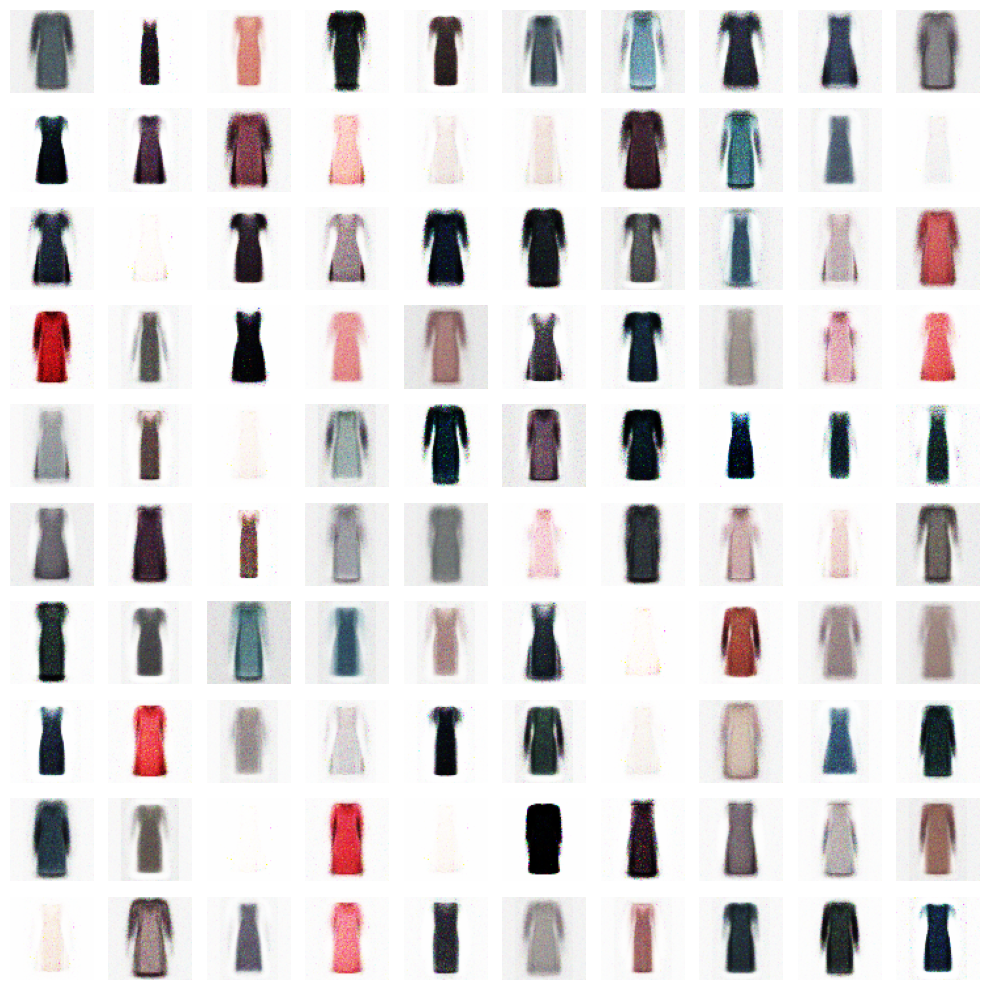

Epoch 41


  0%|          | 0/128 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  1%|          | 1/128 [00:00<00:19,  6.46it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


  2%|▏         | 2/128 [00:00<00:19,  6.49it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  2%|▏         | 3/128 [00:00<00:18,  6.93it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  3%|▎         | 4/128 [00:00<00:20,  6.13it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  4%|▍         | 5/128 [00:00<00:18,  6.61it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  5%|▍         | 6/128 [00:00<00:17,  6.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  5%|▌         | 7/128 [00:01<00:16,  7.14it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  6%|▋         | 8/128 [00:01<00:17,  6.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  7%|▋         | 9/128 [00:01<00:16,  7.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  8%|▊         | 10/128 [00:01<00:16,  7.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


  9%|▊         | 11/128 [00:01<00:17,  6.79it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


  9%|▉         | 12/128 [00:01<00:16,  6.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 10%|█         | 13/128 [00:01<00:16,  7.14it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 11%|█         | 14/128 [00:02<00:16,  6.96it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 12%|█▏        | 15/128 [00:02<00:15,  7.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 12%|█▎        | 16/128 [00:02<00:15,  7.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 13%|█▎        | 17/128 [00:02<00:16,  6.83it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 14%|█▍        | 18/128 [00:02<00:16,  6.61it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 15%|█▍        | 19/128 [00:02<00:15,  6.93it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 16%|█▌        | 20/128 [00:02<00:16,  6.67it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 16%|█▋        | 21/128 [00:03<00:16,  6.34it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 17%|█▋        | 22/128 [00:03<00:19,  5.36it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 18%|█▊        | 23/128 [00:03<00:21,  4.86it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 19%|█▉        | 24/128 [00:03<00:23,  4.44it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 20%|█▉        | 25/128 [00:04<00:20,  4.93it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 20%|██        | 26/128 [00:04<00:19,  5.33it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 21%|██        | 27/128 [00:04<00:21,  4.81it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 22%|██▏       | 28/128 [00:04<00:19,  5.05it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 23%|██▎       | 29/128 [00:04<00:20,  4.73it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 23%|██▎       | 30/128 [00:05<00:20,  4.75it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


 24%|██▍       | 31/128 [00:05<00:19,  4.91it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 25%|██▌       | 32/128 [00:05<00:18,  5.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 26%|██▌       | 33/128 [00:05<00:18,  5.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


 27%|██▋       | 34/128 [00:05<00:18,  5.14it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 27%|██▋       | 35/128 [00:05<00:17,  5.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 28%|██▊       | 36/128 [00:06<00:19,  4.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 29%|██▉       | 37/128 [00:06<00:18,  4.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 30%|██▉       | 38/128 [00:06<00:17,  5.14it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 30%|███       | 39/128 [00:06<00:16,  5.24it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 31%|███▏      | 40/128 [00:06<00:16,  5.34it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 32%|███▏      | 41/128 [00:07<00:15,  5.49it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 33%|███▎      | 42/128 [00:07<00:16,  5.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 34%|███▎      | 43/128 [00:07<00:16,  5.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 34%|███▍      | 44/128 [00:07<00:15,  5.25it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 35%|███▌      | 45/128 [00:07<00:14,  5.82it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 36%|███▌      | 46/128 [00:07<00:13,  6.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 37%|███▋      | 47/128 [00:08<00:13,  6.10it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 38%|███▊      | 48/128 [00:08<00:12,  6.33it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 38%|███▊      | 49/128 [00:08<00:12,  6.35it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 39%|███▉      | 50/128 [00:08<00:12,  6.35it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 40%|███▉      | 51/128 [00:08<00:11,  6.65it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 41%|████      | 52/128 [00:08<00:11,  6.53it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 41%|████▏     | 53/128 [00:09<00:11,  6.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 42%|████▏     | 54/128 [00:09<00:11,  6.37it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 43%|████▎     | 55/128 [00:09<00:11,  6.44it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 44%|████▍     | 56/128 [00:09<00:11,  6.46it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 45%|████▍     | 57/128 [00:09<00:10,  6.76it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 45%|████▌     | 58/128 [00:09<00:09,  7.06it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 46%|████▌     | 59/128 [00:09<00:09,  7.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 47%|████▋     | 60/128 [00:10<00:09,  6.86it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 48%|████▊     | 61/128 [00:10<00:09,  7.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 48%|████▊     | 62/128 [00:10<00:09,  7.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 49%|████▉     | 63/128 [00:10<00:09,  6.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 50%|█████     | 64/128 [00:10<00:09,  6.75it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 51%|█████     | 65/128 [00:10<00:09,  6.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 52%|█████▏    | 66/128 [00:10<00:08,  7.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 52%|█████▏    | 67/128 [00:11<00:09,  6.41it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 53%|█████▎    | 68/128 [00:11<00:08,  6.72it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 54%|█████▍    | 69/128 [00:11<00:08,  6.64it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 55%|█████▍    | 70/128 [00:11<00:08,  6.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 55%|█████▌    | 71/128 [00:11<00:08,  6.67it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 56%|█████▋    | 72/128 [00:11<00:08,  6.54it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 57%|█████▋    | 73/128 [00:12<00:08,  6.83it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 58%|█████▊    | 74/128 [00:12<00:07,  7.10it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 59%|█████▊    | 75/128 [00:12<00:07,  6.84it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 59%|█████▉    | 76/128 [00:12<00:07,  6.71it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 60%|██████    | 77/128 [00:12<00:07,  6.91it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 61%|██████    | 78/128 [00:12<00:07,  7.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 62%|██████▏   | 79/128 [00:12<00:07,  6.93it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 62%|██████▎   | 80/128 [00:12<00:06,  7.15it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 63%|██████▎   | 81/128 [00:13<00:06,  7.11it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 64%|██████▍   | 82/128 [00:13<00:06,  6.90it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 65%|██████▍   | 83/128 [00:13<00:06,  6.71it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 66%|██████▌   | 84/128 [00:13<00:06,  6.63it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 66%|██████▋   | 85/128 [00:13<00:06,  6.56it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 67%|██████▋   | 86/128 [00:13<00:06,  6.39it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 68%|██████▊   | 87/128 [00:14<00:06,  6.41it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 69%|██████▉   | 88/128 [00:14<00:06,  6.43it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 70%|██████▉   | 89/128 [00:14<00:05,  6.52it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 70%|███████   | 90/128 [00:14<00:05,  6.81it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 71%|███████   | 91/128 [00:14<00:05,  6.76it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 72%|███████▏  | 92/128 [00:14<00:05,  7.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 73%|███████▎  | 93/128 [00:14<00:04,  7.20it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 73%|███████▎  | 94/128 [00:15<00:04,  7.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 74%|███████▍  | 95/128 [00:15<00:04,  6.64it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 75%|███████▌  | 96/128 [00:15<00:04,  6.75it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 76%|███████▌  | 97/128 [00:15<00:04,  6.64it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 77%|███████▋  | 98/128 [00:15<00:04,  6.91it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 77%|███████▋  | 99/128 [00:15<00:04,  6.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 78%|███████▊  | 100/128 [00:15<00:04,  6.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 79%|███████▉  | 101/128 [00:16<00:03,  6.87it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 80%|███████▉  | 102/128 [00:16<00:03,  6.86it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 80%|████████  | 103/128 [00:16<00:03,  7.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 81%|████████▏ | 104/128 [00:16<00:03,  6.80it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 82%|████████▏ | 105/128 [00:16<00:03,  6.49it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 83%|████████▎ | 106/128 [00:16<00:03,  6.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 84%|████████▎ | 107/128 [00:16<00:03,  6.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 84%|████████▍ | 108/128 [00:17<00:02,  7.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 85%|████████▌ | 109/128 [00:17<00:02,  7.05it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 86%|████████▌ | 110/128 [00:17<00:02,  6.91it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 87%|████████▋ | 111/128 [00:17<00:02,  6.79it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 88%|████████▊ | 112/128 [00:17<00:02,  6.61it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 88%|████████▊ | 113/128 [00:17<00:02,  6.23it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 89%|████████▉ | 114/128 [00:18<00:02,  6.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


 90%|████████▉ | 115/128 [00:18<00:02,  5.71it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 91%|█████████ | 116/128 [00:18<00:02,  5.71it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 91%|█████████▏| 117/128 [00:18<00:01,  5.74it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 92%|█████████▏| 118/128 [00:18<00:01,  5.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 93%|█████████▎| 119/128 [00:19<00:01,  5.32it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 94%|█████████▍| 120/128 [00:19<00:01,  5.51it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 95%|█████████▍| 121/128 [00:19<00:01,  5.60it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 95%|█████████▌| 122/128 [00:19<00:01,  5.59it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 96%|█████████▌| 123/128 [00:19<00:00,  5.71it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 97%|█████████▋| 124/128 [00:19<00:00,  5.73it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 98%|█████████▊| 125/128 [00:20<00:00,  5.81it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 98%|█████████▊| 126/128 [00:20<00:00,  5.68it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 99%|█████████▉| 127/128 [00:20<00:00,  5.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


100%|██████████| 128/128 [00:20<00:00,  6.19it/s]


Epoch 42


  0%|          | 0/128 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


  1%|          | 1/128 [00:00<00:36,  3.50it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


  2%|▏         | 2/128 [00:00<00:30,  4.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


  2%|▏         | 3/128 [00:00<00:30,  4.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


  3%|▎         | 4/128 [00:01<00:32,  3.87it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


  4%|▍         | 5/128 [00:01<00:32,  3.82it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


  5%|▍         | 6/128 [00:01<00:29,  4.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


  5%|▌         | 7/128 [00:01<00:26,  4.56it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  6%|▋         | 8/128 [00:01<00:24,  4.87it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  7%|▋         | 9/128 [00:02<00:22,  5.23it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  8%|▊         | 10/128 [00:02<00:20,  5.75it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  9%|▊         | 11/128 [00:02<00:19,  5.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


  9%|▉         | 12/128 [00:02<00:18,  6.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 10%|█         | 13/128 [00:02<00:17,  6.53it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 11%|█         | 14/128 [00:02<00:17,  6.53it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 12%|█▏        | 15/128 [00:02<00:17,  6.33it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 12%|█▎        | 16/128 [00:03<00:17,  6.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 13%|█▎        | 17/128 [00:03<00:18,  6.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 14%|█▍        | 18/128 [00:03<00:17,  6.46it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 15%|█▍        | 19/128 [00:03<00:16,  6.60it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 16%|█▌        | 20/128 [00:03<00:15,  6.83it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 16%|█▋        | 21/128 [00:03<00:15,  6.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 17%|█▋        | 22/128 [00:03<00:15,  6.70it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 18%|█▊        | 23/128 [00:04<00:16,  6.50it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 19%|█▉        | 24/128 [00:04<00:15,  6.54it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 20%|█▉        | 25/128 [00:04<00:14,  6.89it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 20%|██        | 26/128 [00:04<00:14,  7.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 21%|██        | 27/128 [00:04<00:14,  6.83it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 22%|██▏       | 28/128 [00:04<00:14,  7.02it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 23%|██▎       | 29/128 [00:04<00:14,  6.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 23%|██▎       | 30/128 [00:05<00:14,  6.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 24%|██▍       | 31/128 [00:05<00:13,  6.94it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 25%|██▌       | 32/128 [00:05<00:14,  6.79it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 26%|██▌       | 33/128 [00:05<00:13,  7.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 27%|██▋       | 34/128 [00:05<00:13,  6.84it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 27%|██▋       | 35/128 [00:05<00:13,  7.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 28%|██▊       | 36/128 [00:05<00:13,  6.67it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 29%|██▉       | 37/128 [00:06<00:13,  6.65it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 30%|██▉       | 38/128 [00:06<00:13,  6.66it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 30%|███       | 39/128 [00:06<00:12,  6.91it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 31%|███▏      | 40/128 [00:06<00:12,  7.13it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 32%|███▏      | 41/128 [00:06<00:14,  5.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 33%|███▎      | 42/128 [00:06<00:13,  6.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 34%|███▎      | 43/128 [00:07<00:12,  6.65it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 34%|███▍      | 44/128 [00:07<00:12,  6.47it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 35%|███▌      | 45/128 [00:07<00:12,  6.68it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 36%|███▌      | 46/128 [00:07<00:12,  6.61it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 37%|███▋      | 47/128 [00:07<00:11,  6.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 38%|███▊      | 48/128 [00:07<00:11,  6.75it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 38%|███▊      | 49/128 [00:07<00:11,  6.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 39%|███▉      | 50/128 [00:08<00:11,  6.74it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 40%|███▉      | 51/128 [00:08<00:11,  6.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 41%|████      | 52/128 [00:08<00:11,  6.55it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 41%|████▏     | 53/128 [00:08<00:11,  6.53it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 42%|████▏     | 54/128 [00:08<00:11,  6.51it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 43%|████▎     | 55/128 [00:08<00:11,  6.48it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 44%|████▍     | 56/128 [00:09<00:11,  6.43it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 45%|████▍     | 57/128 [00:09<00:10,  6.63it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 45%|████▌     | 58/128 [00:09<00:10,  6.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 46%|████▌     | 59/128 [00:09<00:09,  7.13it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 47%|████▋     | 60/128 [00:09<00:09,  7.34it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 48%|████▊     | 61/128 [00:09<00:08,  7.46it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 48%|████▊     | 62/128 [00:09<00:08,  7.51it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 49%|████▉     | 63/128 [00:09<00:09,  6.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 50%|█████     | 64/128 [00:10<00:09,  6.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 51%|█████     | 65/128 [00:10<00:09,  6.65it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 52%|█████▏    | 66/128 [00:10<00:09,  6.63it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 52%|█████▏    | 67/128 [00:10<00:09,  6.57it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 53%|█████▎    | 68/128 [00:10<00:09,  6.56it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 54%|█████▍    | 69/128 [00:10<00:09,  6.44it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 55%|█████▍    | 70/128 [00:11<00:08,  6.57it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 55%|█████▌    | 71/128 [00:11<00:08,  6.41it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 56%|█████▋    | 72/128 [00:11<00:08,  6.73it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 57%|█████▋    | 73/128 [00:11<00:07,  7.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 58%|█████▊    | 74/128 [00:11<00:08,  6.73it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 59%|█████▊    | 75/128 [00:11<00:08,  6.47it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 59%|█████▉    | 76/128 [00:12<00:09,  5.32it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 60%|██████    | 77/128 [00:12<00:09,  5.49it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 61%|██████    | 78/128 [00:12<00:09,  5.46it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 62%|██████▏   | 79/128 [00:12<00:08,  5.54it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 62%|██████▎   | 80/128 [00:12<00:08,  5.64it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 63%|██████▎   | 81/128 [00:12<00:08,  5.40it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 64%|██████▍   | 82/128 [00:13<00:08,  5.39it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 65%|██████▍   | 83/128 [00:13<00:08,  5.58it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 66%|██████▌   | 84/128 [00:13<00:07,  5.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 66%|██████▋   | 85/128 [00:13<00:07,  5.93it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 67%|██████▋   | 86/128 [00:13<00:07,  5.61it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 68%|██████▊   | 87/128 [00:14<00:07,  5.53it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 69%|██████▉   | 88/128 [00:14<00:07,  5.42it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 70%|██████▉   | 89/128 [00:14<00:07,  5.36it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 70%|███████   | 90/128 [00:14<00:07,  5.25it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 71%|███████   | 91/128 [00:14<00:06,  5.30it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 72%|███████▏  | 92/128 [00:14<00:06,  5.39it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 73%|███████▎  | 93/128 [00:15<00:06,  5.57it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 73%|███████▎  | 94/128 [00:15<00:06,  5.42it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 74%|███████▍  | 95/128 [00:15<00:05,  5.50it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


 75%|███████▌  | 96/128 [00:15<00:06,  5.20it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


 76%|███████▌  | 97/128 [00:15<00:06,  4.89it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 77%|███████▋  | 98/128 [00:16<00:05,  5.23it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 77%|███████▋  | 99/128 [00:16<00:05,  5.41it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 78%|███████▊  | 100/128 [00:16<00:04,  5.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 79%|███████▉  | 101/128 [00:16<00:04,  6.15it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 80%|███████▉  | 102/128 [00:16<00:03,  6.50it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 80%|████████  | 103/128 [00:16<00:03,  6.79it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 81%|████████▏ | 104/128 [00:17<00:03,  6.93it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 82%|████████▏ | 105/128 [00:17<00:03,  6.81it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 83%|████████▎ | 106/128 [00:17<00:03,  6.73it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 84%|████████▎ | 107/128 [00:17<00:03,  6.57it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 84%|████████▍ | 108/128 [00:17<00:03,  6.44it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 85%|████████▌ | 109/128 [00:17<00:02,  6.83it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 86%|████████▌ | 110/128 [00:17<00:02,  7.14it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 87%|████████▋ | 111/128 [00:18<00:02,  7.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 88%|████████▊ | 112/128 [00:18<00:02,  6.90it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 88%|████████▊ | 113/128 [00:18<00:02,  7.02it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 89%|████████▉ | 114/128 [00:18<00:02,  6.99it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 90%|████████▉ | 115/128 [00:18<00:01,  6.81it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 91%|█████████ | 116/128 [00:18<00:01,  7.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 91%|█████████▏| 117/128 [00:18<00:01,  6.86it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 92%|█████████▏| 118/128 [00:19<00:01,  6.59it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 93%|█████████▎| 119/128 [00:19<00:01,  6.56it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 94%|█████████▍| 120/128 [00:19<00:01,  6.53it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 95%|█████████▍| 121/128 [00:19<00:01,  6.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 95%|█████████▌| 122/128 [00:19<00:00,  6.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 96%|█████████▌| 123/128 [00:19<00:00,  6.30it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 97%|█████████▋| 124/128 [00:19<00:00,  6.55it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 98%|█████████▊| 125/128 [00:20<00:00,  6.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 98%|█████████▊| 126/128 [00:20<00:00,  6.66it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 99%|█████████▉| 127/128 [00:20<00:00,  6.48it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


100%|██████████| 128/128 [00:20<00:00,  6.21it/s]


Epoch 43


  0%|          | 0/128 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  1%|          | 1/128 [00:00<00:17,  7.14it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  2%|▏         | 2/128 [00:00<00:16,  7.42it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  2%|▏         | 3/128 [00:00<00:17,  6.96it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  3%|▎         | 4/128 [00:00<00:17,  7.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  4%|▍         | 5/128 [00:00<00:17,  6.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  5%|▍         | 6/128 [00:00<00:18,  6.72it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  5%|▌         | 7/128 [00:01<00:17,  6.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


  6%|▋         | 8/128 [00:01<00:17,  6.75it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


  7%|▋         | 9/128 [00:01<00:17,  6.93it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


  8%|▊         | 10/128 [00:01<00:17,  6.79it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  9%|▊         | 11/128 [00:01<00:17,  6.73it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  9%|▉         | 12/128 [00:01<00:16,  6.86it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 10%|█         | 13/128 [00:01<00:16,  7.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 11%|█         | 14/128 [00:02<00:16,  6.87it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 12%|█▏        | 15/128 [00:02<00:16,  6.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 12%|█▎        | 16/128 [00:02<00:16,  6.74it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 13%|█▎        | 17/128 [00:02<00:15,  6.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 14%|█▍        | 18/128 [00:02<00:15,  7.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 15%|█▍        | 19/128 [00:02<00:15,  6.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 16%|█▌        | 20/128 [00:02<00:15,  6.99it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 16%|█▋        | 21/128 [00:03<00:15,  6.70it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 17%|█▋        | 22/128 [00:03<00:15,  6.91it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 18%|█▊        | 23/128 [00:03<00:15,  6.62it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 19%|█▉        | 24/128 [00:03<00:15,  6.87it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 20%|█▉        | 25/128 [00:03<00:14,  7.14it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 20%|██        | 26/128 [00:03<00:14,  6.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 21%|██        | 27/128 [00:03<00:14,  6.79it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 22%|██▏       | 28/128 [00:04<00:14,  7.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 23%|██▎       | 29/128 [00:04<00:14,  6.93it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 23%|██▎       | 30/128 [00:04<00:14,  6.81it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 24%|██▍       | 31/128 [00:04<00:14,  6.67it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 25%|██▌       | 32/128 [00:04<00:13,  7.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 26%|██▌       | 33/128 [00:04<00:13,  7.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 27%|██▋       | 34/128 [00:04<00:12,  7.37it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 27%|██▋       | 35/128 [00:05<00:13,  7.15it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 28%|██▊       | 36/128 [00:05<00:12,  7.24it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 29%|██▉       | 37/128 [00:05<00:13,  6.83it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 30%|██▉       | 38/128 [00:05<00:13,  6.43it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 30%|███       | 39/128 [00:05<00:14,  6.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 31%|███▏      | 40/128 [00:05<00:14,  5.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


 32%|███▏      | 41/128 [00:06<00:15,  5.55it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 33%|███▎      | 42/128 [00:06<00:15,  5.57it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 34%|███▎      | 43/128 [00:06<00:16,  5.21it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 34%|███▍      | 44/128 [00:06<00:15,  5.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 35%|███▌      | 45/128 [00:06<00:14,  5.58it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 36%|███▌      | 46/128 [00:07<00:15,  5.20it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


 37%|███▋      | 47/128 [00:07<00:16,  4.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 38%|███▊      | 48/128 [00:07<00:16,  4.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 38%|███▊      | 49/128 [00:07<00:15,  5.05it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 39%|███▉      | 50/128 [00:07<00:14,  5.34it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 40%|███▉      | 51/128 [00:08<00:16,  4.64it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 41%|████      | 52/128 [00:08<00:15,  4.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 41%|████▏     | 53/128 [00:08<00:15,  4.84it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 42%|████▏     | 54/128 [00:08<00:14,  5.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 43%|████▎     | 55/128 [00:08<00:14,  5.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 44%|████▍     | 56/128 [00:09<00:13,  5.34it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 45%|████▍     | 57/128 [00:09<00:13,  5.33it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 45%|████▌     | 58/128 [00:09<00:12,  5.55it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 46%|████▌     | 59/128 [00:09<00:12,  5.57it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 47%|████▋     | 60/128 [00:09<00:12,  5.43it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 48%|████▊     | 61/128 [00:09<00:12,  5.47it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


 48%|████▊     | 62/128 [00:10<00:12,  5.45it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 49%|████▉     | 63/128 [00:10<00:11,  5.89it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 50%|█████     | 64/128 [00:10<00:10,  6.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 51%|█████     | 65/128 [00:10<00:09,  6.47it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 52%|█████▏    | 66/128 [00:10<00:09,  6.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 52%|█████▏    | 67/128 [00:10<00:08,  6.84it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 53%|█████▎    | 68/128 [00:10<00:08,  6.71it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 54%|█████▍    | 69/128 [00:11<00:08,  6.62it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 55%|█████▍    | 70/128 [00:11<00:09,  6.41it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 55%|█████▌    | 71/128 [00:11<00:08,  6.42it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 56%|█████▋    | 72/128 [00:11<00:08,  6.76it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 57%|█████▋    | 73/128 [00:11<00:08,  6.73it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 58%|█████▊    | 74/128 [00:11<00:08,  6.67it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 59%|█████▊    | 75/128 [00:12<00:08,  6.34it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 59%|█████▉    | 76/128 [00:12<00:07,  6.72it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 60%|██████    | 77/128 [00:12<00:07,  6.69it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 61%|██████    | 78/128 [00:12<00:07,  6.65it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 62%|██████▏   | 79/128 [00:12<00:07,  6.57it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 62%|██████▎   | 80/128 [00:12<00:07,  6.53it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 63%|██████▎   | 81/128 [00:12<00:07,  6.48it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 64%|██████▍   | 82/128 [00:13<00:07,  6.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 65%|██████▍   | 83/128 [00:13<00:07,  6.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 66%|██████▌   | 84/128 [00:13<00:06,  6.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 66%|██████▋   | 85/128 [00:13<00:06,  6.40it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 67%|██████▋   | 86/128 [00:13<00:06,  6.46it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 68%|██████▊   | 87/128 [00:13<00:06,  6.49it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 69%|██████▉   | 88/128 [00:14<00:06,  6.50it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 70%|██████▉   | 89/128 [00:14<00:06,  6.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 70%|███████   | 90/128 [00:14<00:05,  6.41it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 71%|███████   | 91/128 [00:14<00:05,  6.68it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 72%|███████▏  | 92/128 [00:14<00:05,  6.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 73%|███████▎  | 93/128 [00:14<00:04,  7.11it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 73%|███████▎  | 94/128 [00:14<00:04,  7.14it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 74%|███████▍  | 95/128 [00:15<00:04,  6.96it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 75%|███████▌  | 96/128 [00:15<00:04,  6.64it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 76%|███████▌  | 97/128 [00:15<00:04,  6.93it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 77%|███████▋  | 98/128 [00:15<00:04,  7.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 77%|███████▋  | 99/128 [00:15<00:04,  6.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 78%|███████▊  | 100/128 [00:15<00:04,  6.68it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 79%|███████▉  | 101/128 [00:15<00:03,  6.96it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 80%|███████▉  | 102/128 [00:16<00:03,  6.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 80%|████████  | 103/128 [00:16<00:03,  6.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 81%|████████▏ | 104/128 [00:16<00:03,  6.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 82%|████████▏ | 105/128 [00:16<00:03,  7.21it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 83%|████████▎ | 106/128 [00:16<00:02,  7.41it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 84%|████████▎ | 107/128 [00:16<00:02,  7.44it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 84%|████████▍ | 108/128 [00:16<00:02,  7.41it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 85%|████████▌ | 109/128 [00:17<00:02,  7.46it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 86%|████████▌ | 110/128 [00:17<00:02,  7.52it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 87%|████████▋ | 111/128 [00:17<00:02,  7.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 88%|████████▊ | 112/128 [00:17<00:02,  7.13it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 88%|████████▊ | 113/128 [00:17<00:02,  7.11it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 89%|████████▉ | 114/128 [00:17<00:02,  6.74it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 90%|████████▉ | 115/128 [00:17<00:01,  6.90it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 91%|█████████ | 116/128 [00:18<00:01,  6.76it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 91%|█████████▏| 117/128 [00:18<00:01,  6.67it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 92%|█████████▏| 118/128 [00:18<00:01,  6.67it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 93%|█████████▎| 119/128 [00:18<00:01,  6.76it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 94%|█████████▍| 120/128 [00:18<00:01,  7.02it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 95%|█████████▍| 121/128 [00:18<00:00,  7.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 95%|█████████▌| 122/128 [00:18<00:00,  6.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 96%|█████████▌| 123/128 [00:19<00:00,  7.15it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 97%|█████████▋| 124/128 [00:19<00:00,  6.93it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 98%|█████████▊| 125/128 [00:19<00:00,  7.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 98%|█████████▊| 126/128 [00:19<00:00,  6.74it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 99%|█████████▉| 127/128 [00:19<00:00,  6.90it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


100%|██████████| 128/128 [00:19<00:00,  6.47it/s]


Epoch 44


  0%|          | 0/128 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  1%|          | 1/128 [00:00<00:19,  6.58it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  2%|▏         | 2/128 [00:00<00:17,  7.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


  2%|▏         | 3/128 [00:00<00:20,  6.15it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


  3%|▎         | 4/128 [00:00<00:21,  5.70it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


  4%|▍         | 5/128 [00:00<00:21,  5.63it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


  5%|▍         | 6/128 [00:01<00:21,  5.68it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


  5%|▌         | 7/128 [00:01<00:21,  5.71it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


  6%|▋         | 8/128 [00:01<00:20,  5.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


  7%|▋         | 9/128 [00:01<00:21,  5.51it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


  8%|▊         | 10/128 [00:01<00:22,  5.34it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  9%|▊         | 11/128 [00:02<00:23,  4.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


  9%|▉         | 12/128 [00:02<00:22,  5.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 10%|█         | 13/128 [00:02<00:21,  5.35it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 11%|█         | 14/128 [00:02<00:21,  5.32it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 12%|█▏        | 15/128 [00:02<00:20,  5.57it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 12%|█▎        | 16/128 [00:02<00:20,  5.45it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 13%|█▎        | 17/128 [00:03<00:20,  5.42it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 14%|█▍        | 18/128 [00:03<00:19,  5.50it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 15%|█▍        | 19/128 [00:03<00:19,  5.70it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 16%|█▌        | 20/128 [00:03<00:19,  5.64it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 16%|█▋        | 21/128 [00:03<00:19,  5.62it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 17%|█▋        | 22/128 [00:03<00:19,  5.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 18%|█▊        | 23/128 [00:04<00:19,  5.32it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 19%|█▉        | 24/128 [00:04<00:19,  5.33it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 20%|█▉        | 25/128 [00:04<00:18,  5.54it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 20%|██        | 26/128 [00:04<00:18,  5.44it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 21%|██        | 27/128 [00:04<00:18,  5.53it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 22%|██▏       | 28/128 [00:05<00:18,  5.33it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 23%|██▎       | 29/128 [00:05<00:18,  5.48it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 23%|██▎       | 30/128 [00:05<00:16,  5.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 24%|██▍       | 31/128 [00:05<00:15,  6.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 25%|██▌       | 32/128 [00:05<00:14,  6.43it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 26%|██▌       | 33/128 [00:05<00:14,  6.76it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 27%|██▋       | 34/128 [00:05<00:13,  7.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 27%|██▋       | 35/128 [00:06<00:13,  7.06it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 28%|██▊       | 36/128 [00:06<00:13,  6.72it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 29%|██▉       | 37/128 [00:06<00:13,  6.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 30%|██▉       | 38/128 [00:06<00:13,  6.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 30%|███       | 39/128 [00:06<00:13,  6.74it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 31%|███▏      | 40/128 [00:06<00:12,  6.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 32%|███▏      | 41/128 [00:06<00:12,  6.74it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 33%|███▎      | 42/128 [00:07<00:13,  6.50it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 34%|███▎      | 43/128 [00:07<00:12,  6.55it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 34%|███▍      | 44/128 [00:07<00:13,  6.39it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 35%|███▌      | 45/128 [00:07<00:13,  6.35it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 36%|███▌      | 46/128 [00:07<00:12,  6.40it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 37%|███▋      | 47/128 [00:07<00:12,  6.61it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 38%|███▊      | 48/128 [00:08<00:12,  6.56it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 38%|███▊      | 49/128 [00:08<00:12,  6.46it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 39%|███▉      | 50/128 [00:08<00:12,  6.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 40%|███▉      | 51/128 [00:08<00:12,  6.33it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 41%|████      | 52/128 [00:08<00:11,  6.63it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 41%|████▏     | 53/128 [00:08<00:10,  6.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 42%|████▏     | 54/128 [00:08<00:10,  7.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 43%|████▎     | 55/128 [00:09<00:10,  7.15it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 44%|████▍     | 56/128 [00:09<00:09,  7.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 45%|████▍     | 57/128 [00:09<00:10,  7.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 45%|████▌     | 58/128 [00:09<00:10,  6.70it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 46%|████▌     | 59/128 [00:09<00:10,  6.53it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 47%|████▋     | 60/128 [00:09<00:09,  6.81it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 48%|████▊     | 61/128 [00:09<00:09,  7.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 48%|████▊     | 62/128 [00:10<00:09,  6.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 49%|████▉     | 63/128 [00:10<00:09,  6.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 50%|█████     | 64/128 [00:10<00:09,  6.68it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 51%|█████     | 65/128 [00:10<00:09,  6.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 52%|█████▏    | 66/128 [00:10<00:09,  6.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 52%|█████▏    | 67/128 [00:10<00:08,  7.10it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 53%|█████▎    | 68/128 [00:10<00:08,  6.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 54%|█████▍    | 69/128 [00:11<00:08,  6.89it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 55%|█████▍    | 70/128 [00:11<00:08,  7.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 55%|█████▌    | 71/128 [00:11<00:08,  6.68it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 56%|█████▋    | 72/128 [00:11<00:08,  6.83it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 57%|█████▋    | 73/128 [00:11<00:08,  6.58it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 58%|█████▊    | 74/128 [00:11<00:08,  6.57it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 59%|█████▊    | 75/128 [00:12<00:08,  6.60it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 59%|█████▉    | 76/128 [00:12<00:07,  6.51it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 60%|██████    | 77/128 [00:12<00:07,  6.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 61%|██████    | 78/128 [00:12<00:07,  7.05it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 62%|██████▏   | 79/128 [00:12<00:06,  7.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 62%|██████▎   | 80/128 [00:12<00:06,  6.87it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 63%|██████▎   | 81/128 [00:12<00:06,  6.79it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 64%|██████▍   | 82/128 [00:13<00:06,  7.02it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 65%|██████▍   | 83/128 [00:13<00:06,  7.06it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 66%|██████▌   | 84/128 [00:13<00:06,  6.83it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 66%|██████▋   | 85/128 [00:13<00:06,  7.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 67%|██████▋   | 86/128 [00:13<00:05,  7.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 68%|██████▊   | 87/128 [00:13<00:05,  7.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 69%|██████▉   | 88/128 [00:13<00:05,  6.89it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 70%|██████▉   | 89/128 [00:14<00:05,  6.96it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 70%|███████   | 90/128 [00:14<00:05,  7.06it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 71%|███████   | 91/128 [00:14<00:05,  6.87it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 72%|███████▏  | 92/128 [00:14<00:05,  6.81it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 73%|███████▎  | 93/128 [00:14<00:04,  7.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 73%|███████▎  | 94/128 [00:14<00:04,  7.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 74%|███████▍  | 95/128 [00:14<00:04,  6.89it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 75%|███████▌  | 96/128 [00:15<00:04,  6.79it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 76%|███████▌  | 97/128 [00:15<00:04,  6.36it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 77%|███████▋  | 98/128 [00:15<00:04,  6.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 77%|███████▋  | 99/128 [00:15<00:04,  6.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 78%|███████▊  | 100/128 [00:15<00:04,  5.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 79%|███████▉  | 101/128 [00:16<00:05,  5.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 80%|███████▉  | 102/128 [00:16<00:04,  5.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 80%|████████  | 103/128 [00:16<00:04,  5.65it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 81%|████████▏ | 104/128 [00:16<00:04,  5.80it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 82%|████████▏ | 105/128 [00:16<00:03,  5.83it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 83%|████████▎ | 106/128 [00:16<00:03,  5.87it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 84%|████████▎ | 107/128 [00:17<00:03,  5.79it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 84%|████████▍ | 108/128 [00:17<00:03,  5.80it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 85%|████████▌ | 109/128 [00:17<00:03,  5.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 86%|████████▌ | 110/128 [00:17<00:03,  5.79it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 87%|████████▋ | 111/128 [00:17<00:03,  5.48it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 88%|████████▊ | 112/128 [00:17<00:02,  5.48it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 88%|████████▊ | 113/128 [00:18<00:02,  5.63it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 89%|████████▉ | 114/128 [00:18<00:02,  5.74it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 90%|████████▉ | 115/128 [00:18<00:02,  5.91it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 91%|█████████ | 116/128 [00:18<00:02,  5.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 91%|█████████▏| 117/128 [00:18<00:01,  5.83it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 92%|█████████▏| 118/128 [00:18<00:01,  5.74it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 93%|█████████▎| 119/128 [00:19<00:01,  5.68it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 94%|█████████▍| 120/128 [00:19<00:01,  5.55it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 95%|█████████▍| 121/128 [00:19<00:01,  5.66it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 95%|█████████▌| 122/128 [00:19<00:01,  5.69it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 96%|█████████▌| 123/128 [00:19<00:01,  4.99it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 97%|█████████▋| 124/128 [00:20<00:00,  5.10it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 98%|█████████▊| 125/128 [00:20<00:00,  5.37it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 98%|█████████▊| 126/128 [00:20<00:00,  5.87it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 99%|█████████▉| 127/128 [00:20<00:00,  6.32it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


100%|██████████| 128/128 [00:20<00:00,  6.19it/s]


Epoch 45


  0%|          | 0/128 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  1%|          | 1/128 [00:00<00:16,  7.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  2%|▏         | 2/128 [00:00<00:16,  7.80it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  2%|▏         | 3/128 [00:00<00:16,  7.50it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  3%|▎         | 4/128 [00:00<00:17,  7.06it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  4%|▍         | 5/128 [00:00<00:18,  6.75it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  5%|▍         | 6/128 [00:00<00:17,  7.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


  5%|▌         | 7/128 [00:01<00:18,  6.65it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


  6%|▋         | 8/128 [00:01<00:18,  6.64it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  7%|▋         | 9/128 [00:01<00:17,  6.91it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  8%|▊         | 10/128 [00:01<00:17,  6.79it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  9%|▊         | 11/128 [00:01<00:17,  6.72it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  9%|▉         | 12/128 [00:01<00:17,  6.81it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 10%|█         | 13/128 [00:01<00:16,  7.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 11%|█         | 14/128 [00:01<00:15,  7.25it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 12%|█▏        | 15/128 [00:02<00:16,  6.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 12%|█▎        | 16/128 [00:02<00:15,  7.14it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 13%|█▎        | 17/128 [00:02<00:15,  7.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 14%|█▍        | 18/128 [00:02<00:15,  7.05it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 15%|█▍        | 19/128 [00:02<00:16,  6.76it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 16%|█▌        | 20/128 [00:02<00:15,  7.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 16%|█▋        | 21/128 [00:03<00:15,  7.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 17%|█▋        | 22/128 [00:03<00:14,  7.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 18%|█▊        | 23/128 [00:03<00:14,  7.45it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 19%|█▉        | 24/128 [00:03<00:14,  7.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 20%|█▉        | 25/128 [00:03<00:14,  6.99it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 20%|██        | 26/128 [00:03<00:14,  6.86it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 21%|██        | 27/128 [00:03<00:15,  6.37it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 22%|██▏       | 28/128 [00:04<00:15,  6.34it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 23%|██▎       | 29/128 [00:04<00:14,  6.61it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 23%|██▎       | 30/128 [00:04<00:14,  6.80it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 24%|██▍       | 31/128 [00:04<00:14,  6.90it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 25%|██▌       | 32/128 [00:04<00:13,  7.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 26%|██▌       | 33/128 [00:04<00:13,  7.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 27%|██▋       | 34/128 [00:04<00:13,  6.91it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 27%|██▋       | 35/128 [00:05<00:13,  6.83it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 28%|██▊       | 36/128 [00:05<00:13,  6.74it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 29%|██▉       | 37/128 [00:05<00:12,  7.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 30%|██▉       | 38/128 [00:05<00:13,  6.91it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 30%|███       | 39/128 [00:05<00:13,  6.74it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 31%|███▏      | 40/128 [00:05<00:12,  6.96it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 32%|███▏      | 41/128 [00:05<00:12,  6.70it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 33%|███▎      | 42/128 [00:06<00:12,  6.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 34%|███▎      | 43/128 [00:06<00:11,  7.15it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 34%|███▍      | 44/128 [00:06<00:12,  6.83it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 35%|███▌      | 45/128 [00:06<00:11,  6.96it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 36%|███▌      | 46/128 [00:06<00:11,  7.11it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 37%|███▋      | 47/128 [00:06<00:11,  7.21it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 38%|███▊      | 48/128 [00:06<00:10,  7.36it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 38%|███▊      | 49/128 [00:07<00:11,  6.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 39%|███▉      | 50/128 [00:07<00:11,  6.96it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 40%|███▉      | 51/128 [00:07<00:11,  6.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 41%|████      | 52/128 [00:07<00:10,  6.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 41%|████▏     | 53/128 [00:07<00:11,  6.80it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 42%|████▏     | 54/128 [00:07<00:11,  6.68it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 43%|████▎     | 55/128 [00:07<00:10,  6.94it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 44%|████▍     | 56/128 [00:08<00:10,  6.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 45%|████▍     | 57/128 [00:08<00:10,  6.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 45%|████▌     | 58/128 [00:08<00:10,  6.83it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 46%|████▌     | 59/128 [00:08<00:10,  6.75it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 47%|████▋     | 60/128 [00:08<00:09,  7.02it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 48%|████▊     | 61/128 [00:08<00:09,  7.02it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 48%|████▊     | 62/128 [00:08<00:09,  7.21it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 49%|████▉     | 63/128 [00:09<00:09,  6.86it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 50%|█████     | 64/128 [00:09<00:09,  6.70it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 51%|█████     | 65/128 [00:09<00:09,  6.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 52%|█████▏    | 66/128 [00:09<00:09,  6.51it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 52%|█████▏    | 67/128 [00:09<00:09,  6.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 53%|█████▎    | 68/128 [00:09<00:09,  6.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 54%|█████▍    | 69/128 [00:10<00:10,  5.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 55%|█████▍    | 70/128 [00:10<00:10,  5.62it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 55%|█████▌    | 71/128 [00:10<00:10,  5.66it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 56%|█████▋    | 72/128 [00:10<00:09,  5.89it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 57%|█████▋    | 73/128 [00:10<00:10,  5.40it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 58%|█████▊    | 74/128 [00:11<00:09,  5.44it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 59%|█████▊    | 75/128 [00:11<00:09,  5.58it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 59%|█████▉    | 76/128 [00:11<00:09,  5.51it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 60%|██████    | 77/128 [00:11<00:09,  5.53it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 61%|██████    | 78/128 [00:11<00:09,  5.48it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 62%|██████▏   | 79/128 [00:11<00:08,  5.62it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 62%|██████▎   | 80/128 [00:12<00:08,  5.74it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 63%|██████▎   | 81/128 [00:12<00:08,  5.62it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


 64%|██████▍   | 82/128 [00:12<00:09,  4.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


 65%|██████▍   | 83/128 [00:12<00:10,  4.42it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 66%|██████▌   | 84/128 [00:12<00:09,  4.62it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 66%|██████▋   | 85/128 [00:13<00:08,  4.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 67%|██████▋   | 86/128 [00:13<00:08,  5.11it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 68%|██████▊   | 87/128 [00:13<00:07,  5.13it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 69%|██████▉   | 88/128 [00:13<00:07,  5.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 70%|██████▉   | 89/128 [00:13<00:08,  4.83it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 70%|███████   | 90/128 [00:14<00:07,  5.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 71%|███████   | 91/128 [00:14<00:07,  5.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 72%|███████▏  | 92/128 [00:14<00:06,  5.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 73%|███████▎  | 93/128 [00:14<00:06,  5.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 73%|███████▎  | 94/128 [00:14<00:06,  5.64it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 74%|███████▍  | 95/128 [00:14<00:05,  6.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 75%|███████▌  | 96/128 [00:15<00:04,  6.46it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 76%|███████▌  | 97/128 [00:15<00:04,  6.51it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 77%|███████▋  | 98/128 [00:15<00:04,  6.81it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 77%|███████▋  | 99/128 [00:15<00:04,  6.93it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 78%|███████▊  | 100/128 [00:15<00:04,  6.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 79%|███████▉  | 101/128 [00:15<00:03,  6.79it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 80%|███████▉  | 102/128 [00:15<00:03,  6.68it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 80%|████████  | 103/128 [00:16<00:03,  6.94it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 81%|████████▏ | 104/128 [00:16<00:03,  6.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 82%|████████▏ | 105/128 [00:16<00:03,  6.68it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 83%|████████▎ | 106/128 [00:16<00:03,  6.93it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 84%|████████▎ | 107/128 [00:16<00:02,  7.06it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 84%|████████▍ | 108/128 [00:16<00:02,  6.73it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 85%|████████▌ | 109/128 [00:16<00:02,  6.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 86%|████████▌ | 110/128 [00:17<00:02,  7.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 87%|████████▋ | 111/128 [00:17<00:02,  7.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 88%|████████▊ | 112/128 [00:17<00:02,  6.91it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 88%|████████▊ | 113/128 [00:17<00:02,  7.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 89%|████████▉ | 114/128 [00:17<00:01,  7.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 90%|████████▉ | 115/128 [00:17<00:01,  6.99it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 91%|█████████ | 116/128 [00:17<00:01,  7.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 91%|█████████▏| 117/128 [00:18<00:01,  7.20it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 92%|█████████▏| 118/128 [00:18<00:01,  7.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 93%|█████████▎| 119/128 [00:18<00:01,  7.32it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 94%|█████████▍| 120/128 [00:18<00:01,  7.10it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 95%|█████████▍| 121/128 [00:18<00:01,  6.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 95%|█████████▌| 122/128 [00:18<00:00,  7.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 96%|█████████▌| 123/128 [00:18<00:00,  6.75it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 97%|█████████▋| 124/128 [00:19<00:00,  7.02it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 98%|█████████▊| 125/128 [00:19<00:00,  6.86it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 98%|█████████▊| 126/128 [00:19<00:00,  7.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 99%|█████████▉| 127/128 [00:19<00:00,  7.30it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


100%|██████████| 128/128 [00:19<00:00,  6.50it/s]


Epoch 46


  0%|          | 0/128 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  1%|          | 1/128 [00:00<00:19,  6.36it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  2%|▏         | 2/128 [00:00<00:19,  6.63it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  2%|▏         | 3/128 [00:00<00:18,  6.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  3%|▎         | 4/128 [00:00<00:18,  6.74it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  4%|▍         | 5/128 [00:00<00:17,  7.10it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  5%|▍         | 6/128 [00:00<00:16,  7.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


  5%|▌         | 7/128 [00:01<00:17,  6.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  6%|▋         | 8/128 [00:01<00:16,  7.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  7%|▋         | 9/128 [00:01<00:17,  6.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


  8%|▊         | 10/128 [00:01<00:17,  6.82it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  9%|▊         | 11/128 [00:01<00:17,  6.75it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  9%|▉         | 12/128 [00:01<00:16,  6.93it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 10%|█         | 13/128 [00:01<00:16,  7.06it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 11%|█         | 14/128 [00:02<00:16,  6.89it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 12%|█▏        | 15/128 [00:02<00:16,  6.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 12%|█▎        | 16/128 [00:02<00:16,  6.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 13%|█▎        | 17/128 [00:02<00:15,  6.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 14%|█▍        | 18/128 [00:02<00:15,  7.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 15%|█▍        | 19/128 [00:02<00:14,  7.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 16%|█▌        | 20/128 [00:02<00:14,  7.40it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 16%|█▋        | 21/128 [00:02<00:14,  7.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 17%|█▋        | 22/128 [00:03<00:15,  6.84it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 18%|█▊        | 23/128 [00:03<00:14,  7.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 19%|█▉        | 24/128 [00:03<00:14,  6.99it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 20%|█▉        | 25/128 [00:03<00:14,  7.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 20%|██        | 26/128 [00:03<00:14,  6.86it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 21%|██        | 27/128 [00:03<00:14,  6.75it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 22%|██▏       | 28/128 [00:04<00:14,  7.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 23%|██▎       | 29/128 [00:04<00:13,  7.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 23%|██▎       | 30/128 [00:04<00:14,  6.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 24%|██▍       | 31/128 [00:04<00:13,  7.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 25%|██▌       | 32/128 [00:04<00:14,  6.65it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 26%|██▌       | 33/128 [00:04<00:14,  6.54it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 27%|██▋       | 34/128 [00:04<00:13,  6.80it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 27%|██▋       | 35/128 [00:05<00:14,  6.46it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


 28%|██▊       | 36/128 [00:05<00:15,  6.02it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 29%|██▉       | 37/128 [00:05<00:15,  5.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 30%|██▉       | 38/128 [00:05<00:15,  5.83it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 30%|███       | 39/128 [00:05<00:15,  5.72it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 31%|███▏      | 40/128 [00:06<00:18,  4.84it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 32%|███▏      | 41/128 [00:06<00:17,  4.83it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 33%|███▎      | 42/128 [00:06<00:17,  5.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 34%|███▎      | 43/128 [00:06<00:17,  4.99it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 34%|███▍      | 44/128 [00:06<00:18,  4.58it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 35%|███▌      | 45/128 [00:07<00:16,  4.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 36%|███▌      | 46/128 [00:07<00:16,  5.03it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 37%|███▋      | 47/128 [00:07<00:15,  5.15it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 38%|███▊      | 48/128 [00:07<00:15,  5.24it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 38%|███▊      | 49/128 [00:07<00:14,  5.43it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 39%|███▉      | 50/128 [00:07<00:13,  5.63it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 40%|███▉      | 51/128 [00:08<00:13,  5.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 41%|████      | 52/128 [00:08<00:13,  5.84it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 41%|████▏     | 53/128 [00:08<00:12,  5.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 42%|████▏     | 54/128 [00:08<00:12,  6.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 43%|████▎     | 55/128 [00:08<00:12,  6.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 44%|████▍     | 56/128 [00:09<00:14,  5.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 45%|████▍     | 57/128 [00:09<00:15,  4.69it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 45%|████▌     | 58/128 [00:09<00:14,  4.87it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 46%|████▌     | 59/128 [00:09<00:13,  5.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 47%|████▋     | 60/128 [00:09<00:12,  5.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 48%|████▊     | 61/128 [00:10<00:12,  5.48it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 48%|████▊     | 62/128 [00:10<00:11,  5.62it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 49%|████▉     | 63/128 [00:10<00:10,  5.91it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 50%|█████     | 64/128 [00:10<00:09,  6.40it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 51%|█████     | 65/128 [00:10<00:09,  6.61it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 52%|█████▏    | 66/128 [00:10<00:08,  6.94it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 52%|█████▏    | 67/128 [00:10<00:09,  6.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 53%|█████▎    | 68/128 [00:11<00:08,  6.94it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 54%|█████▍    | 69/128 [00:11<00:08,  6.70it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 55%|█████▍    | 70/128 [00:11<00:08,  6.68it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 55%|█████▌    | 71/128 [00:11<00:08,  6.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 56%|█████▋    | 72/128 [00:11<00:08,  6.84it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 57%|█████▋    | 73/128 [00:11<00:07,  7.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 58%|█████▊    | 74/128 [00:11<00:07,  6.86it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 59%|█████▊    | 75/128 [00:12<00:07,  6.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 59%|█████▉    | 76/128 [00:12<00:07,  6.82it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 60%|██████    | 77/128 [00:12<00:07,  7.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 61%|██████    | 78/128 [00:12<00:06,  7.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 62%|██████▏   | 79/128 [00:12<00:07,  6.94it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 62%|██████▎   | 80/128 [00:12<00:06,  7.10it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 63%|██████▎   | 81/128 [00:12<00:06,  7.20it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 64%|██████▍   | 82/128 [00:13<00:06,  6.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 65%|██████▍   | 83/128 [00:13<00:06,  6.94it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 66%|██████▌   | 84/128 [00:13<00:06,  6.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 66%|██████▋   | 85/128 [00:13<00:06,  7.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 67%|██████▋   | 86/128 [00:13<00:05,  7.23it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 68%|██████▊   | 87/128 [00:13<00:05,  7.34it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 69%|██████▉   | 88/128 [00:13<00:05,  7.35it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 70%|██████▉   | 89/128 [00:13<00:05,  7.50it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 70%|███████   | 90/128 [00:14<00:05,  7.58it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 71%|███████   | 91/128 [00:14<00:04,  7.56it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 72%|███████▏  | 92/128 [00:14<00:05,  6.96it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 73%|███████▎  | 93/128 [00:14<00:05,  6.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 73%|███████▎  | 94/128 [00:14<00:05,  6.55it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 74%|███████▍  | 95/128 [00:14<00:05,  6.54it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 75%|███████▌  | 96/128 [00:15<00:04,  6.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 76%|███████▌  | 97/128 [00:15<00:04,  7.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 77%|███████▋  | 98/128 [00:15<00:04,  6.83it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 77%|███████▋  | 99/128 [00:15<00:04,  6.61it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 78%|███████▊  | 100/128 [00:15<00:04,  6.82it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 79%|███████▉  | 101/128 [00:15<00:03,  6.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 80%|███████▉  | 102/128 [00:15<00:03,  7.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 80%|████████  | 103/128 [00:16<00:03,  7.15it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 81%|████████▏ | 104/128 [00:16<00:03,  6.79it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 82%|████████▏ | 105/128 [00:16<00:03,  6.75it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 83%|████████▎ | 106/128 [00:16<00:03,  6.89it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 84%|████████▎ | 107/128 [00:16<00:02,  7.14it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 84%|████████▍ | 108/128 [00:16<00:02,  7.30it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 85%|████████▌ | 109/128 [00:16<00:02,  7.06it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 86%|████████▌ | 110/128 [00:17<00:02,  7.21it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 87%|████████▋ | 111/128 [00:17<00:02,  7.33it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 88%|████████▊ | 112/128 [00:17<00:02,  7.46it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 88%|████████▊ | 113/128 [00:17<00:02,  7.47it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 89%|████████▉ | 114/128 [00:17<00:01,  7.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 90%|████████▉ | 115/128 [00:17<00:01,  7.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 91%|█████████ | 116/128 [00:17<00:01,  7.20it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 91%|█████████▏| 117/128 [00:17<00:01,  7.24it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 92%|█████████▏| 118/128 [00:18<00:01,  7.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 93%|█████████▎| 119/128 [00:18<00:01,  7.35it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 94%|█████████▍| 120/128 [00:18<00:01,  7.40it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 95%|█████████▍| 121/128 [00:18<00:00,  7.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 95%|█████████▌| 122/128 [00:18<00:00,  6.68it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 96%|█████████▌| 123/128 [00:18<00:00,  6.90it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 97%|█████████▋| 124/128 [00:19<00:00,  6.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 98%|█████████▊| 125/128 [00:19<00:00,  6.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 98%|█████████▊| 126/128 [00:19<00:00,  7.20it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 99%|█████████▉| 127/128 [00:19<00:00,  6.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


100%|██████████| 128/128 [00:19<00:00,  6.54it/s]


Epoch 47


  0%|          | 0/128 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


  1%|          | 1/128 [00:00<00:19,  6.37it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  2%|▏         | 2/128 [00:00<00:17,  7.05it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


  2%|▏         | 3/128 [00:00<00:20,  6.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


  3%|▎         | 4/128 [00:00<00:19,  6.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  4%|▍         | 5/128 [00:00<00:20,  6.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  5%|▍         | 6/128 [00:00<00:20,  5.93it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


  5%|▌         | 7/128 [00:01<00:20,  5.83it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


  6%|▋         | 8/128 [00:01<00:21,  5.68it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


  7%|▋         | 9/128 [00:01<00:22,  5.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


  8%|▊         | 10/128 [00:01<00:21,  5.50it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


  9%|▊         | 11/128 [00:01<00:24,  4.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


  9%|▉         | 12/128 [00:02<00:22,  5.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 10%|█         | 13/128 [00:02<00:23,  4.99it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 11%|█         | 14/128 [00:02<00:22,  5.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 12%|█▏        | 15/128 [00:02<00:21,  5.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 12%|█▎        | 16/128 [00:02<00:21,  5.21it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 13%|█▎        | 17/128 [00:03<00:21,  5.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 14%|█▍        | 18/128 [00:03<00:20,  5.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 15%|█▍        | 19/128 [00:03<00:23,  4.71it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 16%|█▌        | 20/128 [00:03<00:22,  4.72it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 16%|█▋        | 21/128 [00:03<00:22,  4.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 17%|█▋        | 22/128 [00:04<00:24,  4.39it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 18%|█▊        | 23/128 [00:04<00:22,  4.74it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 19%|█▉        | 24/128 [00:04<00:20,  5.15it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 20%|█▉        | 25/128 [00:04<00:19,  5.36it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 20%|██        | 26/128 [00:04<00:19,  5.36it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 21%|██        | 27/128 [00:05<00:18,  5.59it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 22%|██▏       | 28/128 [00:05<00:18,  5.44it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 23%|██▎       | 29/128 [00:05<00:20,  4.90it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 23%|██▎       | 30/128 [00:05<00:18,  5.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 24%|██▍       | 31/128 [00:05<00:17,  5.67it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 25%|██▌       | 32/128 [00:05<00:15,  6.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 26%|██▌       | 33/128 [00:06<00:14,  6.48it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 27%|██▋       | 34/128 [00:06<00:13,  6.80it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 27%|██▋       | 35/128 [00:06<00:13,  6.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 28%|██▊       | 36/128 [00:06<00:13,  6.70it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 29%|██▉       | 37/128 [00:06<00:14,  6.50it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 30%|██▉       | 38/128 [00:06<00:13,  6.51it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 30%|███       | 39/128 [00:07<00:13,  6.53it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 31%|███▏      | 40/128 [00:07<00:13,  6.48it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 32%|███▏      | 41/128 [00:07<00:13,  6.61it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 33%|███▎      | 42/128 [00:07<00:12,  6.87it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 34%|███▎      | 43/128 [00:07<00:12,  6.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 34%|███▍      | 44/128 [00:07<00:12,  6.91it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 35%|███▌      | 45/128 [00:07<00:12,  6.82it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 36%|███▌      | 46/128 [00:08<00:12,  6.71it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 37%|███▋      | 47/128 [00:08<00:11,  6.79it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 38%|███▊      | 48/128 [00:08<00:11,  6.99it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 38%|███▊      | 49/128 [00:08<00:11,  7.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 39%|███▉      | 50/128 [00:08<00:11,  7.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 40%|███▉      | 51/128 [00:08<00:11,  6.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 41%|████      | 52/128 [00:08<00:11,  6.41it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 41%|████▏     | 53/128 [00:09<00:11,  6.59it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 42%|████▏     | 54/128 [00:09<00:10,  6.89it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 43%|████▎     | 55/128 [00:09<00:10,  6.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 44%|████▍     | 56/128 [00:09<00:10,  6.79it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 45%|████▍     | 57/128 [00:09<00:10,  6.74it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 45%|████▌     | 58/128 [00:09<00:10,  6.74it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 46%|████▌     | 59/128 [00:09<00:10,  6.50it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 47%|████▋     | 60/128 [00:10<00:10,  6.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 48%|████▊     | 61/128 [00:10<00:10,  6.55it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 48%|████▊     | 62/128 [00:10<00:10,  6.57it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 49%|████▉     | 63/128 [00:10<00:10,  6.49it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 50%|█████     | 64/128 [00:10<00:09,  6.56it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 51%|█████     | 65/128 [00:10<00:09,  6.79it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 52%|█████▏    | 66/128 [00:11<00:09,  6.76it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 52%|█████▏    | 67/128 [00:11<00:09,  6.69it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 53%|█████▎    | 68/128 [00:11<00:09,  6.51it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 54%|█████▍    | 69/128 [00:11<00:08,  6.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 55%|█████▍    | 70/128 [00:11<00:08,  7.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 55%|█████▌    | 71/128 [00:11<00:08,  6.71it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 56%|█████▋    | 72/128 [00:11<00:08,  6.91it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 57%|█████▋    | 73/128 [00:12<00:07,  6.96it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 58%|█████▊    | 74/128 [00:12<00:08,  6.66it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 59%|█████▊    | 75/128 [00:12<00:08,  6.58it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 59%|█████▉    | 76/128 [00:12<00:07,  6.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 60%|██████    | 77/128 [00:12<00:07,  7.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 61%|██████    | 78/128 [00:12<00:06,  7.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 62%|██████▏   | 79/128 [00:12<00:07,  7.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 62%|██████▎   | 80/128 [00:13<00:06,  7.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 63%|██████▎   | 81/128 [00:13<00:06,  7.13it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 64%|██████▍   | 82/128 [00:13<00:06,  6.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 65%|██████▍   | 83/128 [00:13<00:06,  6.69it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 66%|██████▌   | 84/128 [00:13<00:06,  6.61it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 66%|██████▋   | 85/128 [00:13<00:06,  6.59it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 67%|██████▋   | 86/128 [00:13<00:06,  6.50it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 68%|██████▊   | 87/128 [00:14<00:06,  6.76it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 69%|██████▉   | 88/128 [00:14<00:05,  6.73it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 70%|██████▉   | 89/128 [00:14<00:05,  6.67it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 70%|███████   | 90/128 [00:14<00:05,  6.89it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 71%|███████   | 91/128 [00:14<00:05,  7.15it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 72%|███████▏  | 92/128 [00:14<00:05,  6.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 73%|███████▎  | 93/128 [00:14<00:05,  6.99it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 73%|███████▎  | 94/128 [00:15<00:04,  7.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 74%|███████▍  | 95/128 [00:15<00:04,  7.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 75%|███████▌  | 96/128 [00:15<00:04,  6.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 76%|███████▌  | 97/128 [00:15<00:04,  6.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 77%|███████▋  | 98/128 [00:15<00:04,  6.37it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 77%|███████▋  | 99/128 [00:15<00:04,  6.14it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 78%|███████▊  | 100/128 [00:16<00:04,  6.21it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 79%|███████▉  | 101/128 [00:16<00:04,  5.87it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 80%|███████▉  | 102/128 [00:16<00:04,  5.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 80%|████████  | 103/128 [00:16<00:04,  5.65it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 81%|████████▏ | 104/128 [00:16<00:04,  5.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 82%|████████▏ | 105/128 [00:17<00:04,  4.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 83%|████████▎ | 106/128 [00:17<00:04,  5.11it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 84%|████████▎ | 107/128 [00:17<00:03,  5.25it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 84%|████████▍ | 108/128 [00:17<00:03,  5.48it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 85%|████████▌ | 109/128 [00:17<00:04,  4.70it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 86%|████████▌ | 110/128 [00:18<00:03,  5.11it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 87%|████████▋ | 111/128 [00:18<00:03,  5.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 88%|████████▊ | 112/128 [00:18<00:03,  5.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 88%|████████▊ | 113/128 [00:18<00:03,  4.68it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 89%|████████▉ | 114/128 [00:18<00:02,  5.03it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 90%|████████▉ | 115/128 [00:19<00:02,  5.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 91%|█████████ | 116/128 [00:19<00:02,  5.32it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 91%|█████████▏| 117/128 [00:19<00:02,  5.47it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 92%|█████████▏| 118/128 [00:19<00:01,  5.48it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 93%|█████████▎| 119/128 [00:19<00:01,  5.44it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 94%|█████████▍| 120/128 [00:19<00:01,  4.79it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 95%|█████████▍| 121/128 [00:20<00:01,  4.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 95%|█████████▌| 122/128 [00:20<00:01,  5.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 96%|█████████▌| 123/128 [00:20<00:00,  5.62it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 97%|█████████▋| 124/128 [00:20<00:00,  6.02it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 98%|█████████▊| 125/128 [00:20<00:00,  6.13it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 98%|█████████▊| 126/128 [00:20<00:00,  6.48it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 99%|█████████▉| 127/128 [00:21<00:00,  6.48it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


100%|██████████| 128/128 [00:21<00:00,  6.04it/s]


Epoch 48


  0%|          | 0/128 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  1%|          | 1/128 [00:00<00:19,  6.57it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  2%|▏         | 2/128 [00:00<00:17,  7.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  2%|▏         | 3/128 [00:00<00:18,  6.73it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  3%|▎         | 4/128 [00:00<00:19,  6.39it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  4%|▍         | 5/128 [00:00<00:19,  6.47it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  5%|▍         | 6/128 [00:00<00:18,  6.48it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


  5%|▌         | 7/128 [00:01<00:18,  6.53it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  6%|▋         | 8/128 [00:01<00:17,  6.90it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  7%|▋         | 9/128 [00:01<00:16,  7.13it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  8%|▊         | 10/128 [00:01<00:17,  6.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


  9%|▊         | 11/128 [00:01<00:17,  6.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  9%|▉         | 12/128 [00:01<00:16,  6.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 10%|█         | 13/128 [00:01<00:16,  7.06it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 11%|█         | 14/128 [00:02<00:16,  6.83it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 12%|█▏        | 15/128 [00:02<00:15,  7.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 12%|█▎        | 16/128 [00:02<00:15,  7.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 13%|█▎        | 17/128 [00:02<00:15,  7.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 14%|█▍        | 18/128 [00:02<00:16,  6.73it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 15%|█▍        | 19/128 [00:02<00:16,  6.51it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 16%|█▌        | 20/128 [00:02<00:16,  6.70it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 16%|█▋        | 21/128 [00:03<00:15,  6.96it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 17%|█▋        | 22/128 [00:03<00:15,  6.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 18%|█▊        | 23/128 [00:03<00:15,  6.80it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 19%|█▉        | 24/128 [00:03<00:15,  6.75it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 20%|█▉        | 25/128 [00:03<00:15,  6.73it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 20%|██        | 26/128 [00:03<00:15,  6.54it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 21%|██        | 27/128 [00:03<00:14,  6.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 22%|██▏       | 28/128 [00:04<00:14,  7.01it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 23%|██▎       | 29/128 [00:04<00:14,  6.86it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 23%|██▎       | 30/128 [00:04<00:13,  7.13it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 24%|██▍       | 31/128 [00:04<00:13,  7.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 25%|██▌       | 32/128 [00:04<00:13,  7.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 26%|██▌       | 33/128 [00:04<00:13,  6.84it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 27%|██▋       | 34/128 [00:04<00:13,  7.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 27%|██▋       | 35/128 [00:05<00:12,  7.24it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 28%|██▊       | 36/128 [00:05<00:12,  7.39it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 29%|██▉       | 37/128 [00:05<00:12,  7.02it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 30%|██▉       | 38/128 [00:05<00:13,  6.89it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 30%|███       | 39/128 [00:05<00:13,  6.71it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 31%|███▏      | 40/128 [00:05<00:13,  6.56it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 32%|███▏      | 41/128 [00:05<00:12,  6.70it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 33%|███▎      | 42/128 [00:06<00:12,  6.96it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 34%|███▎      | 43/128 [00:06<00:12,  6.83it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 34%|███▍      | 44/128 [00:06<00:12,  6.68it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 35%|███▌      | 45/128 [00:06<00:12,  6.66it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 36%|███▌      | 46/128 [00:06<00:12,  6.60it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 37%|███▋      | 47/128 [00:06<00:12,  6.60it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 38%|███▊      | 48/128 [00:07<00:12,  6.58it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 38%|███▊      | 49/128 [00:07<00:11,  6.94it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 39%|███▉      | 50/128 [00:07<00:11,  6.87it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 40%|███▉      | 51/128 [00:07<00:10,  7.05it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 41%|████      | 52/128 [00:07<00:11,  6.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 41%|████▏     | 53/128 [00:07<00:11,  6.74it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 42%|████▏     | 54/128 [00:07<00:11,  6.64it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 43%|████▎     | 55/128 [00:08<00:11,  6.46it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 44%|████▍     | 56/128 [00:08<00:10,  6.76it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 45%|████▍     | 57/128 [00:08<00:10,  6.68it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 45%|████▌     | 58/128 [00:08<00:10,  6.63it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 46%|████▌     | 59/128 [00:08<00:09,  6.91it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 47%|████▋     | 60/128 [00:08<00:09,  7.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 48%|████▊     | 61/128 [00:08<00:09,  7.11it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 48%|████▊     | 62/128 [00:09<00:09,  7.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 49%|████▉     | 63/128 [00:09<00:09,  6.90it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


 50%|█████     | 64/128 [00:09<00:09,  6.42it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 51%|█████     | 65/128 [00:09<00:10,  6.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 52%|█████▏    | 66/128 [00:09<00:10,  6.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 52%|█████▏    | 67/128 [00:09<00:10,  5.79it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


 53%|█████▎    | 68/128 [00:10<00:10,  5.62it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


 54%|█████▍    | 69/128 [00:10<00:12,  4.90it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 55%|█████▍    | 70/128 [00:10<00:11,  5.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 55%|█████▌    | 71/128 [00:10<00:11,  4.93it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 56%|█████▋    | 72/128 [00:10<00:10,  5.25it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 57%|█████▋    | 73/128 [00:11<00:10,  5.43it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 58%|█████▊    | 74/128 [00:11<00:09,  5.56it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 59%|█████▊    | 75/128 [00:11<00:10,  5.21it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 59%|█████▉    | 76/128 [00:11<00:11,  4.66it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 60%|██████    | 77/128 [00:11<00:10,  4.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 61%|██████    | 78/128 [00:12<00:09,  5.44it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 62%|██████▏   | 79/128 [00:12<00:08,  5.69it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 62%|██████▎   | 80/128 [00:12<00:08,  5.86it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 63%|██████▎   | 81/128 [00:12<00:08,  5.70it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 64%|██████▍   | 82/128 [00:12<00:07,  5.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 65%|██████▍   | 83/128 [00:12<00:07,  5.72it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 66%|██████▌   | 84/128 [00:13<00:07,  5.94it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 66%|██████▋   | 85/128 [00:13<00:07,  5.76it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 67%|██████▋   | 86/128 [00:13<00:07,  5.90it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 68%|██████▊   | 87/128 [00:13<00:06,  5.94it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 69%|██████▉   | 88/128 [00:13<00:06,  5.89it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 70%|██████▉   | 89/128 [00:13<00:06,  5.83it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 70%|███████   | 90/128 [00:14<00:06,  6.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 71%|███████   | 91/128 [00:14<00:05,  6.51it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 72%|███████▏  | 92/128 [00:14<00:05,  6.37it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 73%|███████▎  | 93/128 [00:14<00:05,  6.70it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 73%|███████▎  | 94/128 [00:14<00:05,  6.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 74%|███████▍  | 95/128 [00:14<00:04,  6.70it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 75%|███████▌  | 96/128 [00:14<00:04,  6.82it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 76%|███████▌  | 97/128 [00:15<00:04,  7.03it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 77%|███████▋  | 98/128 [00:15<00:04,  7.21it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 77%|███████▋  | 99/128 [00:15<00:04,  6.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 78%|███████▊  | 100/128 [00:15<00:03,  7.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 79%|███████▉  | 101/128 [00:15<00:03,  7.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 80%|███████▉  | 102/128 [00:15<00:03,  6.66it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 80%|████████  | 103/128 [00:15<00:03,  6.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 81%|████████▏ | 104/128 [00:16<00:03,  6.76it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 82%|████████▏ | 105/128 [00:16<00:03,  6.90it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 83%|████████▎ | 106/128 [00:16<00:03,  6.75it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 84%|████████▎ | 107/128 [00:16<00:03,  6.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 84%|████████▍ | 108/128 [00:16<00:02,  7.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 85%|████████▌ | 109/128 [00:16<00:02,  7.02it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 86%|████████▌ | 110/128 [00:16<00:02,  7.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 87%|████████▋ | 111/128 [00:17<00:02,  7.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 88%|████████▊ | 112/128 [00:17<00:02,  6.56it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 88%|████████▊ | 113/128 [00:17<00:02,  6.87it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 89%|████████▉ | 114/128 [00:17<00:02,  6.73it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 90%|████████▉ | 115/128 [00:17<00:01,  6.62it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 91%|█████████ | 116/128 [00:17<00:01,  6.57it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 91%|█████████▏| 117/128 [00:18<00:01,  6.44it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 92%|█████████▏| 118/128 [00:18<00:01,  6.65it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 93%|█████████▎| 119/128 [00:18<00:01,  6.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 94%|█████████▍| 120/128 [00:18<00:01,  6.75it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 95%|█████████▍| 121/128 [00:18<00:01,  6.64it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 95%|█████████▌| 122/128 [00:18<00:00,  6.93it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 96%|█████████▌| 123/128 [00:18<00:00,  7.05it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 97%|█████████▋| 124/128 [00:19<00:00,  6.69it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 98%|█████████▊| 125/128 [00:19<00:00,  6.62it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 98%|█████████▊| 126/128 [00:19<00:00,  6.73it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 99%|█████████▉| 127/128 [00:19<00:00,  6.68it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


100%|██████████| 128/128 [00:19<00:00,  6.52it/s]


Epoch 49


  0%|          | 0/128 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  1%|          | 1/128 [00:00<00:16,  7.60it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  2%|▏         | 2/128 [00:00<00:18,  6.86it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


  2%|▏         | 3/128 [00:00<00:18,  6.72it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  3%|▎         | 4/128 [00:00<00:18,  6.57it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  4%|▍         | 5/128 [00:00<00:17,  6.94it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  5%|▍         | 6/128 [00:00<00:16,  7.23it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  5%|▌         | 7/128 [00:00<00:16,  7.23it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  6%|▋         | 8/128 [00:01<00:17,  6.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  7%|▋         | 9/128 [00:01<00:17,  6.83it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  8%|▊         | 10/128 [00:01<00:16,  7.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  9%|▊         | 11/128 [00:01<00:17,  6.80it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


  9%|▉         | 12/128 [00:01<00:17,  6.70it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 10%|█         | 13/128 [00:01<00:16,  6.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 11%|█         | 14/128 [00:02<00:15,  7.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 12%|█▏        | 15/128 [00:02<00:16,  6.73it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 12%|█▎        | 16/128 [00:02<00:16,  6.70it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 13%|█▎        | 17/128 [00:02<00:15,  6.96it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 14%|█▍        | 18/128 [00:02<00:15,  6.94it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 15%|█▍        | 19/128 [00:02<00:15,  6.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 16%|█▌        | 20/128 [00:02<00:15,  6.82it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 16%|█▋        | 21/128 [00:03<00:15,  6.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 17%|█▋        | 22/128 [00:03<00:15,  6.89it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 18%|█▊        | 23/128 [00:03<00:15,  6.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 19%|█▉        | 24/128 [00:03<00:15,  6.67it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 20%|█▉        | 25/128 [00:03<00:14,  6.87it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 20%|██        | 26/128 [00:03<00:15,  6.66it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 21%|██        | 27/128 [00:03<00:15,  6.72it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 22%|██▏       | 28/128 [00:04<00:14,  7.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 23%|██▎       | 29/128 [00:04<00:13,  7.25it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 23%|██▎       | 30/128 [00:04<00:13,  7.35it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 24%|██▍       | 31/128 [00:04<00:14,  6.70it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 25%|██▌       | 32/128 [00:04<00:15,  6.34it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 26%|██▌       | 33/128 [00:04<00:18,  5.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 27%|██▋       | 34/128 [00:05<00:18,  5.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 27%|██▋       | 35/128 [00:05<00:17,  5.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


 28%|██▊       | 36/128 [00:05<00:18,  4.86it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 29%|██▉       | 37/128 [00:05<00:17,  5.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 30%|██▉       | 38/128 [00:05<00:17,  5.13it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 30%|███       | 39/128 [00:06<00:17,  4.96it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 31%|███▏      | 40/128 [00:06<00:16,  5.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 32%|███▏      | 41/128 [00:06<00:15,  5.58it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 33%|███▎      | 42/128 [00:06<00:15,  5.69it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 34%|███▎      | 43/128 [00:06<00:15,  5.65it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 34%|███▍      | 44/128 [00:07<00:15,  5.36it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 35%|███▌      | 45/128 [00:07<00:14,  5.55it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


 36%|███▌      | 46/128 [00:07<00:15,  5.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 37%|███▋      | 47/128 [00:07<00:15,  5.25it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 38%|███▊      | 48/128 [00:07<00:14,  5.43it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 38%|███▊      | 49/128 [00:08<00:16,  4.67it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 39%|███▉      | 50/128 [00:08<00:16,  4.83it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 40%|███▉      | 51/128 [00:08<00:14,  5.15it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 41%|████      | 52/128 [00:08<00:14,  5.37it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 41%|████▏     | 53/128 [00:08<00:14,  5.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 42%|████▏     | 54/128 [00:08<00:14,  5.11it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 43%|████▎     | 55/128 [00:09<00:13,  5.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


 44%|████▍     | 56/128 [00:09<00:13,  5.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 45%|████▍     | 57/128 [00:09<00:13,  5.35it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 45%|████▌     | 58/128 [00:09<00:12,  5.83it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 46%|████▌     | 59/128 [00:09<00:11,  5.90it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 47%|████▋     | 60/128 [00:10<00:11,  5.89it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 48%|████▊     | 61/128 [00:10<00:10,  6.25it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 48%|████▊     | 62/128 [00:10<00:10,  6.32it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 49%|████▉     | 63/128 [00:10<00:10,  6.41it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 50%|█████     | 64/128 [00:10<00:09,  6.56it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 51%|█████     | 65/128 [00:10<00:09,  6.87it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 52%|█████▏    | 66/128 [00:10<00:09,  6.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 52%|█████▏    | 67/128 [00:11<00:08,  6.96it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 53%|█████▎    | 68/128 [00:11<00:08,  7.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 54%|█████▍    | 69/128 [00:11<00:08,  6.79it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 55%|█████▍    | 70/128 [00:11<00:08,  7.00it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 55%|█████▌    | 71/128 [00:11<00:07,  7.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 56%|█████▋    | 72/128 [00:11<00:07,  7.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 57%|█████▋    | 73/128 [00:11<00:07,  7.20it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 58%|█████▊    | 74/128 [00:11<00:07,  7.35it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 59%|█████▊    | 75/128 [00:12<00:07,  7.41it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 59%|█████▉    | 76/128 [00:12<00:06,  7.54it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 60%|██████    | 77/128 [00:12<00:07,  7.11it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 61%|██████    | 78/128 [00:12<00:06,  7.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 62%|██████▏   | 79/128 [00:12<00:06,  7.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 62%|██████▎   | 80/128 [00:12<00:06,  6.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 63%|██████▎   | 81/128 [00:12<00:06,  6.73it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 64%|██████▍   | 82/128 [00:13<00:06,  6.66it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 65%|██████▍   | 83/128 [00:13<00:06,  6.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 66%|██████▌   | 84/128 [00:13<00:06,  6.63it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 66%|██████▋   | 85/128 [00:13<00:06,  6.87it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 67%|██████▋   | 86/128 [00:13<00:05,  7.06it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 68%|██████▊   | 87/128 [00:13<00:05,  7.23it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 69%|██████▉   | 88/128 [00:13<00:05,  6.96it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 70%|██████▉   | 89/128 [00:14<00:05,  7.20it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 70%|███████   | 90/128 [00:14<00:05,  6.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 71%|███████   | 91/128 [00:14<00:05,  7.10it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 72%|███████▏  | 92/128 [00:14<00:05,  6.70it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 73%|███████▎  | 93/128 [00:14<00:05,  6.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 73%|███████▎  | 94/128 [00:14<00:04,  7.10it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 74%|███████▍  | 95/128 [00:14<00:04,  7.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 75%|███████▌  | 96/128 [00:15<00:04,  7.05it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 76%|███████▌  | 97/128 [00:15<00:04,  6.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 77%|███████▋  | 98/128 [00:15<00:04,  7.06it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 77%|███████▋  | 99/128 [00:15<00:04,  6.75it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 78%|███████▊  | 100/128 [00:15<00:04,  6.66it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 79%|███████▉  | 101/128 [00:15<00:03,  6.98it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 80%|███████▉  | 102/128 [00:15<00:03,  6.87it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 80%|████████  | 103/128 [00:16<00:03,  6.68it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 81%|████████▏ | 104/128 [00:16<00:03,  6.63it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 82%|████████▏ | 105/128 [00:16<00:03,  6.59it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 83%|████████▎ | 106/128 [00:16<00:03,  6.24it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 84%|████████▎ | 107/128 [00:16<00:03,  6.53it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 84%|████████▍ | 108/128 [00:16<00:02,  6.83it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 85%|████████▌ | 109/128 [00:17<00:02,  6.99it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 86%|████████▌ | 110/128 [00:17<00:02,  7.02it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 87%|████████▋ | 111/128 [00:17<00:02,  6.90it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 88%|████████▊ | 112/128 [00:17<00:02,  7.06it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 88%|████████▊ | 113/128 [00:17<00:02,  6.93it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 89%|████████▉ | 114/128 [00:17<00:02,  6.70it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 90%|████████▉ | 115/128 [00:17<00:02,  6.47it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 91%|█████████ | 116/128 [00:18<00:01,  6.76it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 91%|█████████▏| 117/128 [00:18<00:01,  6.44it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 92%|█████████▏| 118/128 [00:18<00:01,  6.43it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 93%|█████████▎| 119/128 [00:18<00:01,  6.45it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 94%|█████████▍| 120/128 [00:18<00:01,  6.71it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 95%|█████████▍| 121/128 [00:18<00:01,  6.78it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 95%|█████████▌| 122/128 [00:19<00:00,  6.60it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 96%|█████████▌| 123/128 [00:19<00:00,  6.89it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 97%|█████████▋| 124/128 [00:19<00:00,  6.79it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 98%|█████████▊| 125/128 [00:19<00:00,  7.02it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 98%|█████████▊| 126/128 [00:19<00:00,  6.73it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 99%|█████████▉| 127/128 [00:19<00:00,  6.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


100%|██████████| 128/128 [00:19<00:00,  6.41it/s]


Epoch 50


  0%|          | 0/128 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  1%|          | 1/128 [00:00<00:22,  5.62it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


  2%|▏         | 2/128 [00:00<00:25,  4.94it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  2%|▏         | 3/128 [00:00<00:23,  5.23it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


  3%|▎         | 4/128 [00:00<00:25,  4.82it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


  4%|▍         | 5/128 [00:00<00:24,  5.10it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


  5%|▍         | 6/128 [00:01<00:24,  4.91it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


  5%|▌         | 7/128 [00:01<00:26,  4.52it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


  6%|▋         | 8/128 [00:01<00:24,  4.84it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


  7%|▋         | 9/128 [00:01<00:23,  5.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


  8%|▊         | 10/128 [00:01<00:22,  5.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


  9%|▊         | 11/128 [00:02<00:21,  5.44it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


  9%|▉         | 12/128 [00:02<00:23,  4.89it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 10%|█         | 13/128 [00:02<00:22,  5.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 11%|█         | 14/128 [00:02<00:21,  5.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 12%|█▏        | 15/128 [00:02<00:22,  5.11it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 12%|█▎        | 16/128 [00:03<00:21,  5.24it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 13%|█▎        | 17/128 [00:03<00:23,  4.66it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 14%|█▍        | 18/128 [00:03<00:22,  4.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 15%|█▍        | 19/128 [00:03<00:20,  5.21it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 16%|█▌        | 20/128 [00:03<00:19,  5.57it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 16%|█▋        | 21/128 [00:04<00:18,  5.76it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 17%|█▋        | 22/128 [00:04<00:18,  5.86it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 18%|█▊        | 23/128 [00:04<00:17,  5.93it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 19%|█▉        | 24/128 [00:04<00:17,  5.95it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 20%|█▉        | 25/128 [00:04<00:17,  5.99it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 20%|██        | 26/128 [00:04<00:16,  6.32it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 21%|██        | 27/128 [00:05<00:15,  6.35it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 22%|██▏       | 28/128 [00:05<00:15,  6.61it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 23%|██▎       | 29/128 [00:05<00:14,  6.84it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 23%|██▎       | 30/128 [00:05<00:14,  6.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 24%|██▍       | 31/128 [00:05<00:14,  6.71it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 25%|██▌       | 32/128 [00:05<00:13,  6.99it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 26%|██▌       | 33/128 [00:05<00:13,  7.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 27%|██▋       | 34/128 [00:06<00:13,  7.02it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 27%|██▋       | 35/128 [00:06<00:13,  7.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 28%|██▊       | 36/128 [00:06<00:12,  7.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 29%|██▉       | 37/128 [00:06<00:12,  7.35it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 30%|██▉       | 38/128 [00:06<00:12,  7.06it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 30%|███       | 39/128 [00:06<00:12,  7.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 31%|███▏      | 40/128 [00:06<00:12,  7.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 32%|███▏      | 41/128 [00:06<00:12,  6.90it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 33%|███▎      | 42/128 [00:07<00:12,  6.76it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 34%|███▎      | 43/128 [00:07<00:12,  6.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 34%|███▍      | 44/128 [00:07<00:12,  6.66it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 35%|███▌      | 45/128 [00:07<00:12,  6.51it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 36%|███▌      | 46/128 [00:07<00:11,  6.93it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 37%|███▋      | 47/128 [00:07<00:11,  7.05it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 38%|███▊      | 48/128 [00:08<00:11,  7.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 38%|███▊      | 49/128 [00:08<00:11,  6.88it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 39%|███▉      | 50/128 [00:08<00:11,  6.77it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 40%|███▉      | 51/128 [00:08<00:11,  6.67it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 41%|████      | 52/128 [00:08<00:11,  6.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 41%|████▏     | 53/128 [00:08<00:10,  6.87it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 42%|████▏     | 54/128 [00:08<00:10,  7.02it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 43%|████▎     | 55/128 [00:09<00:10,  7.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 44%|████▍     | 56/128 [00:09<00:09,  7.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 45%|████▍     | 57/128 [00:09<00:09,  7.34it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 45%|████▌     | 58/128 [00:09<00:09,  7.49it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 46%|████▌     | 59/128 [00:09<00:09,  7.05it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 47%|████▋     | 60/128 [00:09<00:09,  6.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 48%|████▊     | 61/128 [00:09<00:09,  7.06it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 48%|████▊     | 62/128 [00:10<00:09,  6.75it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 49%|████▉     | 63/128 [00:10<00:09,  6.99it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 50%|█████     | 64/128 [00:10<00:08,  7.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 51%|█████     | 65/128 [00:10<00:08,  7.44it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 52%|█████▏    | 66/128 [00:10<00:08,  7.33it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 52%|█████▏    | 67/128 [00:10<00:08,  7.10it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 53%|█████▎    | 68/128 [00:10<00:08,  6.85it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 54%|█████▍    | 69/128 [00:11<00:08,  6.72it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 55%|█████▍    | 70/128 [00:11<00:08,  6.67it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 55%|█████▌    | 71/128 [00:11<00:08,  6.60it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 56%|█████▋    | 72/128 [00:11<00:08,  6.83it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 57%|█████▋    | 73/128 [00:11<00:07,  7.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 58%|█████▊    | 74/128 [00:11<00:07,  7.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 59%|█████▊    | 75/128 [00:11<00:07,  7.10it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 59%|█████▉    | 76/128 [00:12<00:07,  6.82it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


 60%|██████    | 77/128 [00:12<00:08,  6.37it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 61%|██████    | 78/128 [00:12<00:07,  6.66it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 62%|██████▏   | 79/128 [00:12<00:07,  6.62it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 62%|██████▎   | 80/128 [00:12<00:06,  6.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 63%|██████▎   | 81/128 [00:12<00:06,  7.13it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 64%|██████▍   | 82/128 [00:12<00:06,  6.65it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 65%|██████▍   | 83/128 [00:13<00:06,  6.70it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 66%|██████▌   | 84/128 [00:13<00:06,  6.55it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 66%|██████▋   | 85/128 [00:13<00:06,  6.54it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 67%|██████▋   | 86/128 [00:13<00:06,  6.80it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 68%|██████▊   | 87/128 [00:13<00:05,  6.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 69%|██████▉   | 88/128 [00:13<00:05,  6.71it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 70%|██████▉   | 89/128 [00:13<00:05,  6.74it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 70%|███████   | 90/128 [00:14<00:05,  6.70it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 71%|███████   | 91/128 [00:14<00:05,  6.99it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 72%|███████▏  | 92/128 [00:14<00:04,  7.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 73%|███████▎  | 93/128 [00:14<00:04,  7.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 73%|███████▎  | 94/128 [00:14<00:04,  7.35it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 74%|███████▍  | 95/128 [00:14<00:04,  6.84it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 75%|███████▌  | 96/128 [00:14<00:04,  6.49it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 76%|███████▌  | 97/128 [00:15<00:05,  6.10it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 77%|███████▋  | 98/128 [00:15<00:04,  6.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 77%|███████▋  | 99/128 [00:15<00:04,  5.97it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 78%|███████▊  | 100/128 [00:15<00:04,  5.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 79%|███████▉  | 101/128 [00:15<00:04,  5.92it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 80%|███████▉  | 102/128 [00:16<00:04,  5.59it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 80%|████████  | 103/128 [00:16<00:04,  5.55it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 81%|████████▏ | 104/128 [00:16<00:04,  5.45it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 82%|████████▏ | 105/128 [00:16<00:04,  5.66it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 83%|████████▎ | 106/128 [00:16<00:03,  5.76it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 84%|████████▎ | 107/128 [00:16<00:03,  5.60it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 84%|████████▍ | 108/128 [00:17<00:04,  4.74it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 85%|████████▌ | 109/128 [00:17<00:03,  4.80it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 86%|████████▌ | 110/128 [00:17<00:03,  4.87it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 87%|████████▋ | 111/128 [00:17<00:03,  5.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 88%|████████▊ | 112/128 [00:17<00:03,  5.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 88%|████████▊ | 113/128 [00:18<00:02,  5.34it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 89%|████████▉ | 114/128 [00:18<00:02,  5.43it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 90%|████████▉ | 115/128 [00:18<00:02,  5.50it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 91%|█████████ | 116/128 [00:18<00:02,  5.62it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 91%|█████████▏| 117/128 [00:18<00:02,  5.35it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 92%|█████████▏| 118/128 [00:19<00:01,  5.51it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 93%|█████████▎| 119/128 [00:19<00:01,  5.30it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 94%|█████████▍| 120/128 [00:19<00:01,  5.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 95%|█████████▍| 121/128 [00:19<00:01,  5.66it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 95%|█████████▌| 122/128 [00:19<00:00,  6.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 96%|█████████▌| 123/128 [00:19<00:00,  6.51it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 97%|█████████▋| 124/128 [00:20<00:00,  6.63it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


 98%|█████████▊| 125/128 [00:20<00:00,  6.59it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


 98%|█████████▊| 126/128 [00:20<00:00,  6.58it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 99%|█████████▉| 127/128 [00:20<00:00,  6.66it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


100%|██████████| 128/128 [00:20<00:00,  6.20it/s]


<Figure size 640x480 with 0 Axes>

In [18]:
from tqdm import tqdm

def training(X_train, X_test, epochs=1, batch_size=128):
    # Reshape automatically
    X_train = X_train.reshape(X_train.shape[0], 64 * 64 * 3)
    batch_count = X_train.shape[0] / batch_size

    # Build GAN
    generator = build_generator()
    discriminator = build_discriminator()
    gan = build_gan(discriminator, generator)

    # Training process
    for e in range(1, epochs + 1):
        print("Epoch %d" % e)
        for _ in tqdm(range(batch_size)):

            noise = np.random.normal(0, 1, [batch_size, 100])
            generated_images = generator.predict(noise)

            image_batch = X_train[np.random.randint(low=0, high=X_train.shape[0], size=batch_size)]
            X = np.concatenate([image_batch, generated_images])

            y_dis = np.zeros(2 * batch_size)
            y_dis[:batch_size] = 0.9

            discriminator.trainable = True
            discriminator.train_on_batch(X, y_dis)

            noise = np.random.normal(0, 1, [batch_size, 100])
            y_gen = np.ones(batch_size)

            discriminator.trainable = False
            gan.train_on_batch(noise, y_gen)

        # Visualize progress
        if e == 1 or e % 20 == 0:
            plot_generated_images(e, generator)

    return generator, discriminator, gan

(generator, discr, gan) = training(x_train, x_test, 50, 128)

Using Generator to generate new images that are not in initial dataset

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


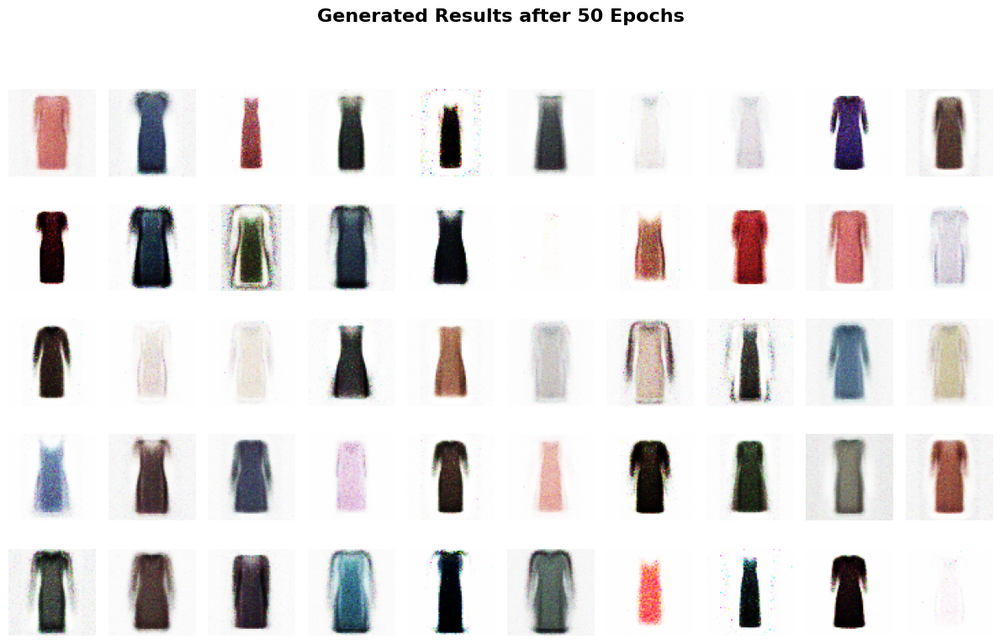

In [19]:
# ✅ Generate new fashion images after training
import numpy as np
import matplotlib.pyplot as plt

# Generate random noise (input for generator)
noise = np.random.normal(0, 1, (50, 100))   # 50 images
generated_images = generator.predict(noise)

# Reshape and scale from [-1,1] → [0,1] for display
generated_images = generated_images.reshape(50, 64, 64, 3)
generated_images = (generated_images + 1) / 2.0

# Plot the generated images in a 5x10 grid
plt.figure(figsize=(12, 8))
plt.suptitle("Generated Results after 50 Epochs", fontsize=16, fontweight='bold')

for i in range(50):
    plt.subplot(5, 10, i + 1)
    plt.imshow(generated_images[i])
    plt.axis('off')

plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust layout to make room for the title
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


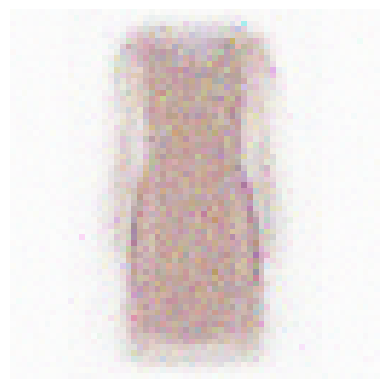

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


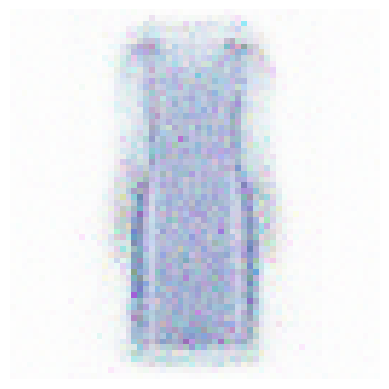

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


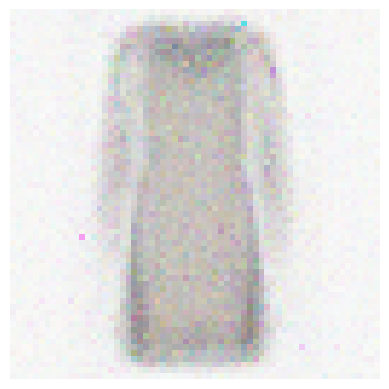

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


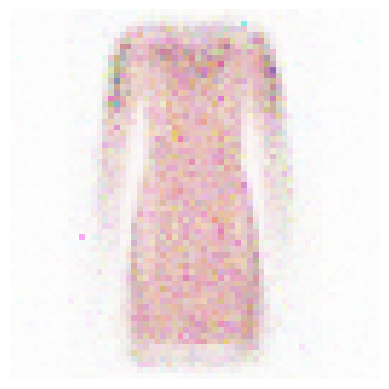

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


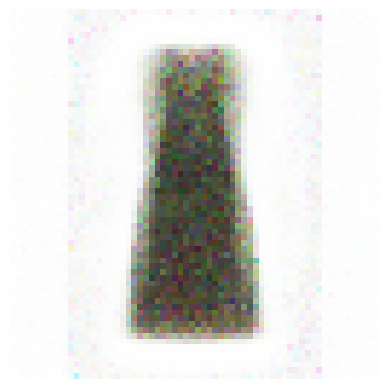

In [21]:
for i in range(5):
    noise = np.random.normal(0, 1, (1, 100))
    img = generator.predict(noise).reshape(64, 64, 3)
    img = (img + 1) / 2.0
    plt.figure()
    plt.imshow(img)
    plt.axis('off')
    plt.show()